<a href="https://colab.research.google.com/github/freyazhaang/test/blob/main/Copy_of_mcmc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Output()

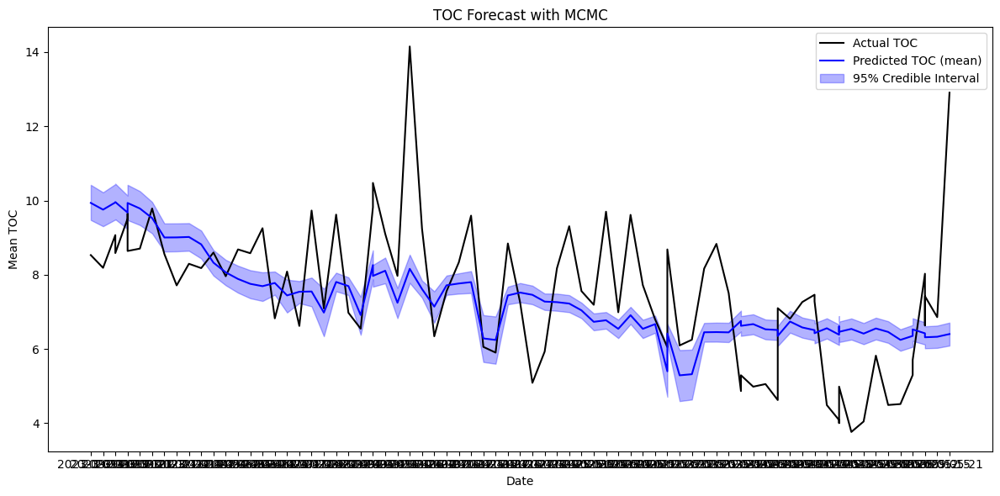

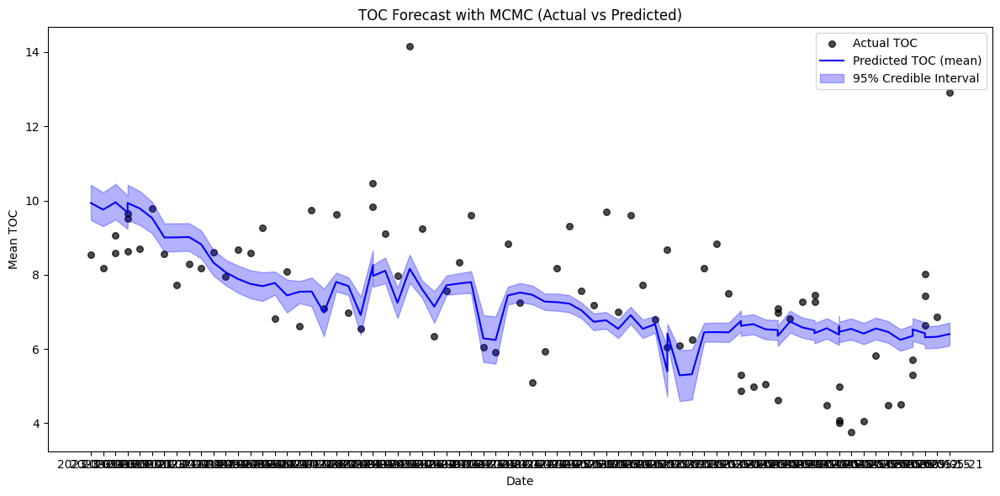

In [ ]:
# mcmc

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import pymc as pm

df = pd.read_csv("loads_copy.csv")

df_model = df[['Date', 'Waste Type', 'Mean_Moisture', 'Mean_TOC']].dropna()
df_model['Date'] = pd.to_datetime(df_model['Date'])
df_model['TimeIndex'] = (df_model['Date'] - df_model['Date'].min()).dt.days

le = LabelEncoder()
df_model['WasteTypeEncoded'] = le.fit_transform(df_model['Waste Type'])

# features and target
X = df_model[['TimeIndex', 'WasteTypeEncoded', 'Mean_Moisture']]
y = df_model['Mean_TOC']

# standardization
X_mean = X.mean()
X_std = X.std()
X_scaled = (X - X_mean) / X_std

# data split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Convert to NumPy for PyMC
X_train_np = X_train.to_numpy()
y_train_np = y_train.to_numpy()
X_test_np = X_test.to_numpy()

# MCMC model
with pm.Model() as toc_model:
    beta = pm.Normal('beta', mu=0, sigma=1, shape=X_train_np.shape[1])
    intercept = pm.Normal('intercept', mu=0, sigma=1)
    mu = intercept + pm.math.dot(X_train_np, beta)
    sigma = pm.HalfNormal('sigma', sigma=1)
    y_obs = pm.Normal('y_obs', mu=mu, sigma=sigma, observed=y_train_np)

    trace = pm.sample(1000, tune=1000, target_accept=0.95, return_inferencedata=True)

# posterior samples
posterior_samples = trace.posterior
beta_samples = posterior_samples['beta'].stack(draws=("chain", "draw")).values
intercept_samples = posterior_samples['intercept'].stack(draws=("chain", "draw")).values

# predict
predictions = np.dot(X_test_np, beta_samples) + intercept_samples
pred_mean = predictions.mean(axis=1)
pred_lower = np.percentile(predictions, 2.5, axis=1)
pred_upper = np.percentile(predictions, 97.5, axis=1)

# results
forecast_df = pd.DataFrame({
    'Date': df.iloc[X_test.index]['Date'].values,
    'Actual_TOC': y_test.values,
    'Predicted_Mean_TOC': pred_mean,
    'Lower_CI': pred_lower,
    'Upper_CI': pred_upper
})

# plot
forecast_df = forecast_df.sort_values('Date')

plt.figure(figsize=(12, 6))
plt.plot(forecast_df['Date'], forecast_df['Actual_TOC'], label='Actual TOC', color='black')
plt.plot(forecast_df['Date'], forecast_df['Predicted_Mean_TOC'], label='Predicted TOC (mean)', color='blue')
plt.fill_between(forecast_df['Date'], forecast_df['Lower_CI'], forecast_df['Upper_CI'],
                 color='blue', alpha=0.3, label='95% Credible Interval')
plt.xlabel('Date')
plt.ylabel('Mean TOC')
plt.title('TOC Forecast with MCMC')
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))

# Actual TOC as scatter points
plt.scatter(forecast_df['Date'], forecast_df['Actual_TOC'],
            label='Actual TOC', color='black', alpha=0.7, s=30)

# Predicted mean as a smooth line
plt.plot(forecast_df['Date'], forecast_df['Predicted_Mean_TOC'],
         label='Predicted TOC (mean)', color='blue')

# Shaded 95% credible interval
plt.fill_between(forecast_df['Date'], forecast_df['Lower_CI'], forecast_df['Upper_CI'],
                 color='blue', alpha=0.3, label='95% Credible Interval')

plt.xlabel('Date')
plt.ylabel('Mean TOC')
plt.title('TOC Forecast with MCMC (Actual vs Predicted)')
plt.legend()
plt.tight_layout()
plt.show()

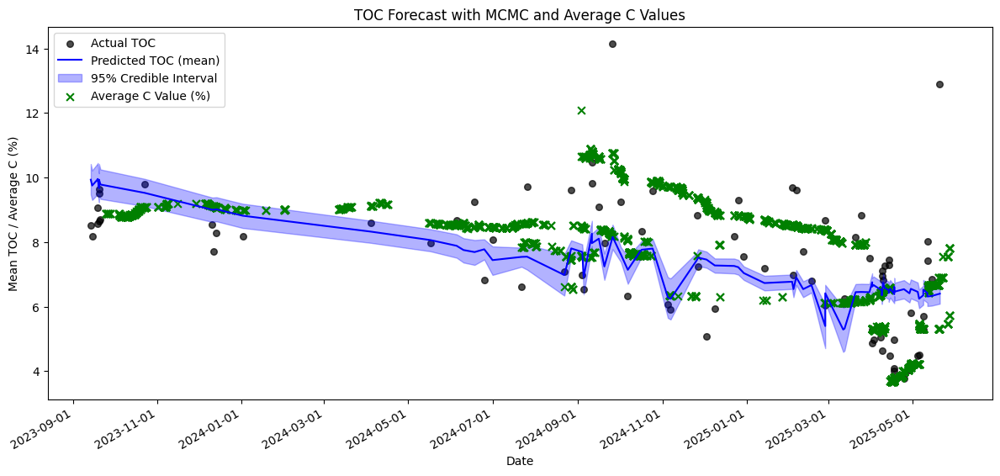

In [ ]:
# average c plot

# Load and prepare the average_c data
import matplotlib.dates as mdates

average_c_df = pd.read_csv("average_c.csv")
average_c_df['Date'] = pd.to_datetime(average_c_df['Date'])
average_c_df = average_c_df[['Date', 'Average C value (all removals) (%)']].dropna()
average_c_df = average_c_df.rename(columns={'Average C value (all removals) (%)': 'Average_C'})

# Sort average_c_df by Date to ensure consistency with forecast_df for plotting
average_c_df = average_c_df.sort_values('Date')

# Overlay on your scatterplot
plt.figure(figsize=(12, 6))

# Convert dates to numerical format for consistent plotting
forecast_dates_num = mdates.date2num(forecast_df['Date'])
average_c_dates_num = mdates.date2num(average_c_df['Date'])


plt.scatter(forecast_dates_num, forecast_df['Actual_TOC'], label='Actual TOC', color='black', alpha=0.7, s=30)
plt.plot(forecast_dates_num, forecast_df['Predicted_Mean_TOC'], label='Predicted TOC (mean)', color='blue')
plt.fill_between(forecast_dates_num, forecast_df['Lower_CI'], forecast_df['Upper_CI'], color='blue', alpha=0.3, label='95% Credible Interval')

# Add Average C Value
plt.scatter(average_c_dates_num, average_c_df['Average_C'], label='Average C Value (%)', color='green', marker='x', s=40)

plt.xlabel('Date')
plt.ylabel('Mean TOC / Average C (%)')
plt.title('TOC Forecast with MCMC and Average C Values')
plt.legend()
plt.tight_layout()

# Format the x-axis as dates
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.AutoDateLocator())
plt.gcf().autofmt_xdate() # Auto-format date labels

plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the untested dataset
df_raw = pd.read_csv("dta_subcopy.csv")

# Step 1: Keep only rows where Mean_TOC is missing (i.e., untested)
df_untested = df_raw[df_raw['Mean_TOC'].isna()].copy()
print("Untested loads (before cleanup):", df_untested.shape)

# Step 2: Drop rows with missing predictor values
df_untested = df_untested[['Date', 'Waste Type', 'Mean_Moisture']].dropna()
print("Untested loads (after dropping rows with missing predictors):", df_untested.shape)

# Step 3: Convert Date to datetime
df_untested['Date'] = pd.to_datetime(df_untested['Date'])

# Step 4: Create TimeIndex relative to the original model's training start date
df_untested['TimeIndex'] = (df_untested['Date'] - df_model['Date'].min()).dt.days

# Step 5: Encode Waste Type using the same LabelEncoder
df_untested['WasteTypeEncoded'] = le.transform(df_untested['Waste Type'])

# Step 6: Prepare and scale the input features
X_untested = df_untested[['TimeIndex', 'WasteTypeEncoded', 'Mean_Moisture']]
X_untested_scaled = (X_untested - X_mean) / X_std
X_untested_np = X_untested_scaled.to_numpy()

# Step 7: Predict using posterior samples from the trained MCMC model
untested_preds = np.dot(X_untested_np, beta_samples) + intercept_samples
untested_mean = untested_preds.mean(axis=1)
untested_lower = np.percentile(untested_preds, 2.5, axis=1)
untested_upper = np.percentile(untested_preds, 97.5, axis=1)

# Step 8: Store predictions in the dataframe
df_untested['Predicted_Mean_TOC'] = untested_mean
df_untested['Lower_95_CI'] = untested_lower
df_untested['Upper_95_CI'] = untested_upper

# Step 9: Plot the predictions
plt.figure(figsize=(12, 6))
plt.scatter(df_untested['Date'], df_untested['Predicted_Mean_TOC'],
            color='green', s=40, label='Predicted TOC (untested loads)')
plt.xlabel("Date")
plt.ylabel("Predicted Mean TOC")
plt.title("Predicted TOC for Untested Loads")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()



FileNotFoundError: [Errno 2] No such file or directory: 'dta_subcopy.csv'

In [ ]:
# accuracy
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

y_true = forecast_df['Actual_TOC']
y_pred = forecast_df['Predicted_Mean_TOC']

print("\nModel Evaluation:")
print(f"MAE: {mean_absolute_error(y_true, y_pred):.2f}")
print(f"RMSE: {np.sqrt(mean_squared_error(y_true, y_pred)):.2f}")
print(f"R²: {r2_score(y_true, y_pred):.2f}")


Model Evaluation:
MAE: 1.27
RMSE: 1.66
R²: 0.24


In [ ]:
# future forecast for july - sept 2025
future_dates = pd.date_range(start='2025-07-01', end='2025-09-30', freq='D')

#baseline inputs for waste type and moisture
baseline_waste_type = df_model['Waste Type'].mode()[0]  # most common waste type
baseline_waste_code = le.transform([baseline_waste_type])[0]
avg_moisture = df_model['Mean_Moisture'].mean()

time_index_start = df_model['Date'].min()
future_time_index = (future_dates - time_index_start).days

# future
future_df = pd.DataFrame({
    'Date': future_dates,
    'TimeIndex': future_time_index,
    'WasteTypeEncoded': baseline_waste_code,
    'Mean_Moisture': avg_moisture
})

# future features with training mean and std
future_X = future_df[['TimeIndex', 'WasteTypeEncoded', 'Mean_Moisture']]
future_X_scaled = (future_X - X_mean) / X_std
future_X_np = future_X_scaled.to_numpy()

# posterior samples
future_preds = np.dot(future_X_np, beta_samples) + intercept_samples
future_mean = future_preds.mean(axis=1)
future_lower = np.percentile(future_preds, 2.5, axis=1)
future_upper = np.percentile(future_preds, 97.5, axis=1)

# combined dataframe
july_sept_forecast = future_df.copy()
july_sept_forecast['Predicted_TOC_Mean'] = future_mean
july_sept_forecast['Lower_95_CI'] = future_lower
july_sept_forecast['Upper_95_CI'] = future_upper

# month column
july_sept_forecast['Month'] = july_sept_forecast['Date'].dt.to_period('M').astype(str)

# group by month
monthly_summary = july_sept_forecast.groupby('Month').agg(
    Mean_TOC_Prediction=('Predicted_TOC_Mean', 'mean'),
    Mean_Lower_95_CI=('Lower_95_CI', 'mean'),
    Mean_Upper_95_CI=('Upper_95_CI', 'mean')
).reset_index()

# Rounded
monthly_summary = monthly_summary.round(2)

print("\nMonthly Forecast Summary:")
print(monthly_summary)



Monthly Forecast Summary:
     Month  Mean_TOC_Prediction  Mean_Lower_95_CI  Mean_Upper_95_CI
0  2025-07                 5.57              5.15              6.02
1  2025-08                 5.34              4.87              5.84
2  2025-09                 5.12              4.59              5.67


Output()


 Test RMSE: 1.68, MAE: 1.28, r (Pearson): 0.499
 Flagged 2 potential outlier(s):
          Date  Actual_TOC  Predicted_Mean  Residual
16  2024-09-20    7.970667        7.422598  0.548069
30  2025-03-12    6.096667        5.527492  0.569174


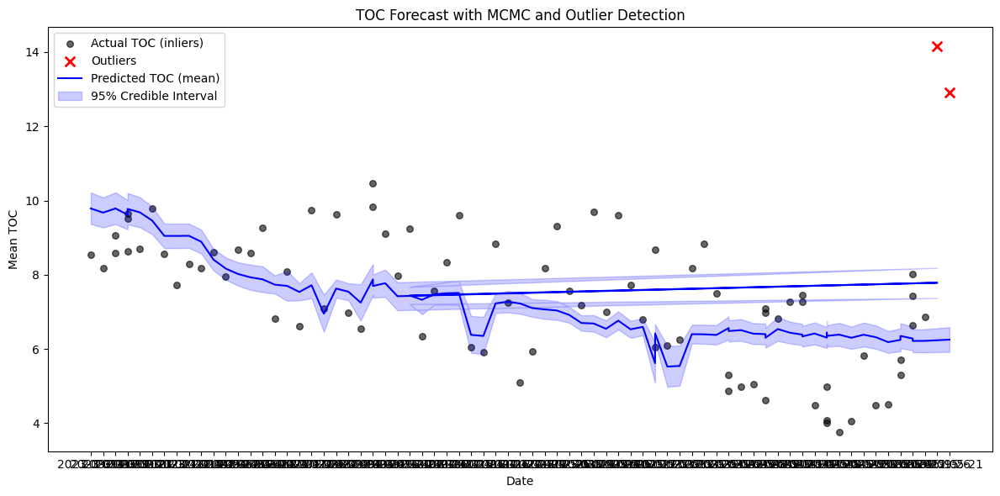

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import pearsonr
import pymc as pm
import arviz as az

df = pd.read_csv("loads_copy.csv")

df_model = df[['Date', 'Waste Type', 'Mean_Moisture', 'Mean_TOC']].dropna()
df_model['Date'] = pd.to_datetime(df_model['Date'])
df_model['TimeIndex'] = (df_model['Date'] - df_model['Date'].min()).dt.days

le = LabelEncoder()
df_model['WasteTypeEncoded'] = le.fit_transform(df_model['Waste Type'])

# Features and target
X = df_model[['TimeIndex', 'WasteTypeEncoded', 'Mean_Moisture']]
y = df_model['Mean_TOC']

# standardization
X_mean, X_std = X.mean(), X.std()
X_scaled = (X - X_mean) / X_std

# train/test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
X_train_np, X_test_np = X_train.values, X_test.values
y_train_np = y_train.values

# mcmc
with pm.Model() as toc_model:
    beta = pm.Normal('beta', mu=0, sigma=1, shape=X_train_np.shape[1])
    intercept = pm.Normal('intercept', mu=0, sigma=5)
    sigma = pm.HalfNormal('sigma', sigma=5)
    mu = intercept + pm.math.dot(X_train_np, beta)
    y_obs = pm.StudentT('y_obs', mu=mu, sigma=sigma, nu=4, observed=y_train_np)

    trace = pm.sample(draws=2500, tune=2500, target_accept=0.95, chains=4, return_inferencedata=True)

# Extract posterior samples
beta_samples = trace.posterior['beta'].values  # shape (chains, draws, 3)
beta_samples = beta_samples.reshape(-1, X_train_np.shape[1]).T  # shape (3, n_samples)

intercept_samples = trace.posterior['intercept'].values.flatten()  # shape (n_samples,)

# Predict using matrix multiplication
y_pred_samples = X_test_np @ beta_samples + intercept_samples[np.newaxis, :]  # shape (n_test, n_samples)

# Predict
# y_pred_samples = X_test_np @ beta_samples + intercept_samples[np.newaxis, :]  # (n_test, n_samples)
y_pred_mean = y_pred_samples.mean(axis=1)
y_pred_lower = np.percentile(y_pred_samples, 2.5, axis=1)
y_pred_upper = np.percentile(y_pred_samples, 97.5, axis=1)

# Residuals and outliers
residuals = y_test.values - y_pred_mean
thresh = 3 * residuals.std()
outlier_mask = np.abs(residuals) > thresh

# forecast dataframe
forecast_df = pd.DataFrame({
    'Date': df.loc[X_test.index, 'Date'].values,
    'Actual_TOC': y_test.values,
    'Predicted_Mean': y_pred_mean,
    'Lower_CI': y_pred_lower,
    'Upper_CI': y_pred_upper,
    'Residual': residuals,
    'Is_Outlier': outlier_mask
}).sort_values('Date')

# accuracy
mse = mean_squared_error(y_test, y_pred_mean)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_mean)
r, _ = pearsonr(y_test, y_pred_mean)

print(f"\n Test RMSE: {rmse:.2f}, MAE: {mae:.2f}, r (Pearson): {r:.3f}")
print(f" Flagged {outlier_mask.sum()} potential outlier(s):")
print(forecast_df.loc[outlier_mask, ['Date', 'Actual_TOC', 'Predicted_Mean', 'Residual']])

# plot with outliers
plt.figure(figsize=(12, 6))

# non-outliers
non_outliers = forecast_df[~forecast_df['Is_Outlier']]
plt.scatter(non_outliers['Date'], non_outliers['Actual_TOC'], color='black', s=30, alpha=0.6, label='Actual TOC (inliers)')

# outliers
outliers = forecast_df[forecast_df['Is_Outlier']]
plt.scatter(outliers['Date'], outliers['Actual_TOC'], color='red', marker='x', s=70, linewidths=2, label='Outliers')

# prediction line and CI
plt.plot(forecast_df['Date'], forecast_df['Predicted_Mean'], color='blue', label='Predicted TOC (mean)')
plt.fill_between(forecast_df['Date'], forecast_df['Lower_CI'], forecast_df['Upper_CI'], color='blue', alpha=0.2, label='95% Credible Interval')

plt.xlabel('Date')
plt.ylabel('Mean TOC')
plt.title('TOC Forecast with MCMC and Outlier Detection')
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
# mcmc split based on supplier

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import pymc as pm

df = pd.read_csv("loads_copy.csv")

df_model = df[['Date', 'Waste Type', 'Mean_Moisture', 'Mean_TOC', 'Supplier']].dropna()
df_model['Date'] = pd.to_datetime(df_model['Date'])
df_model['TimeIndex'] = (df_model['Date'] - df_model['Date'].min()).dt.days

le = LabelEncoder()
df_model['SupplierEncoded'] = le.fit_transform(df_model['Supplier'])




Running model for supplier: Sellers Feedlot


Output()

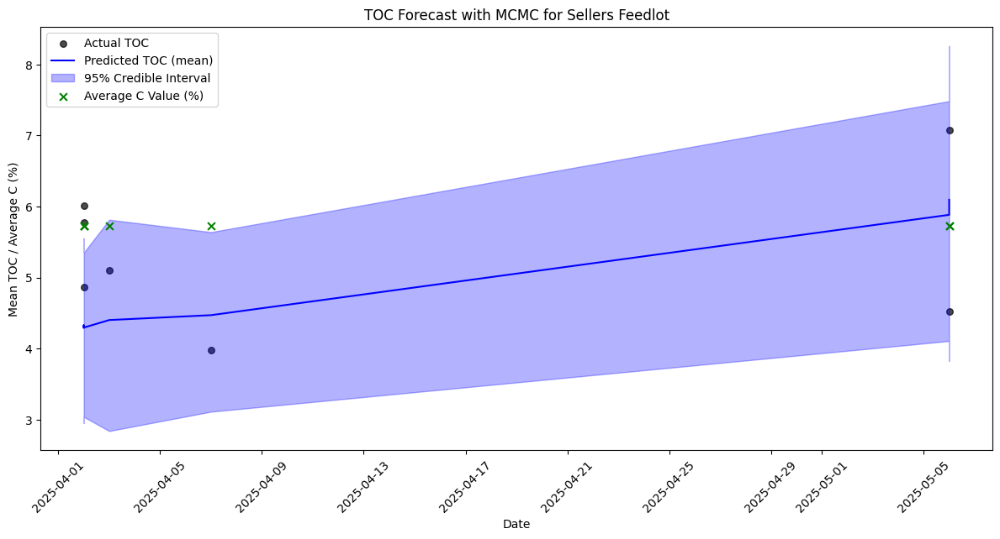


Running model for supplier: Ford County Feeders


Output()

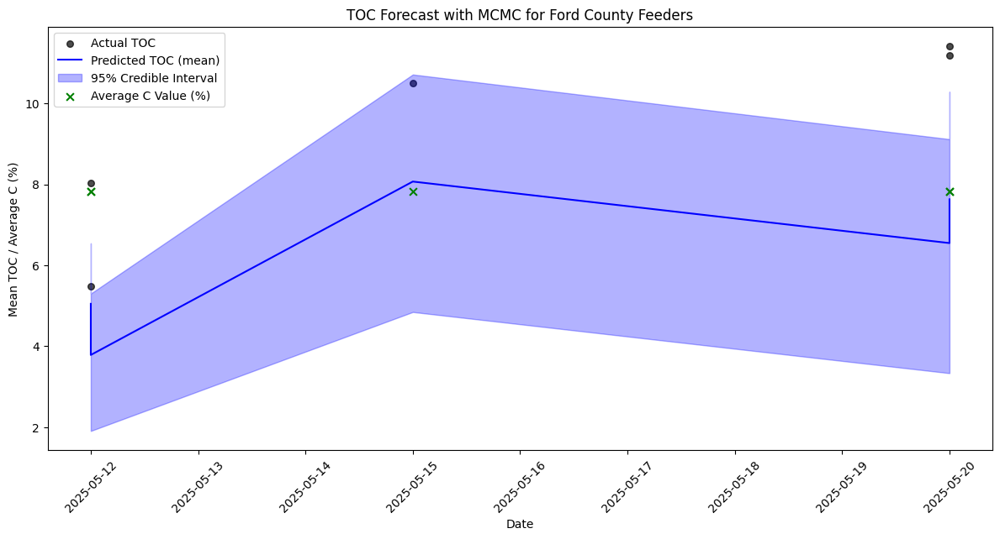


Running model for supplier: Golden Belt Feeders


Output()

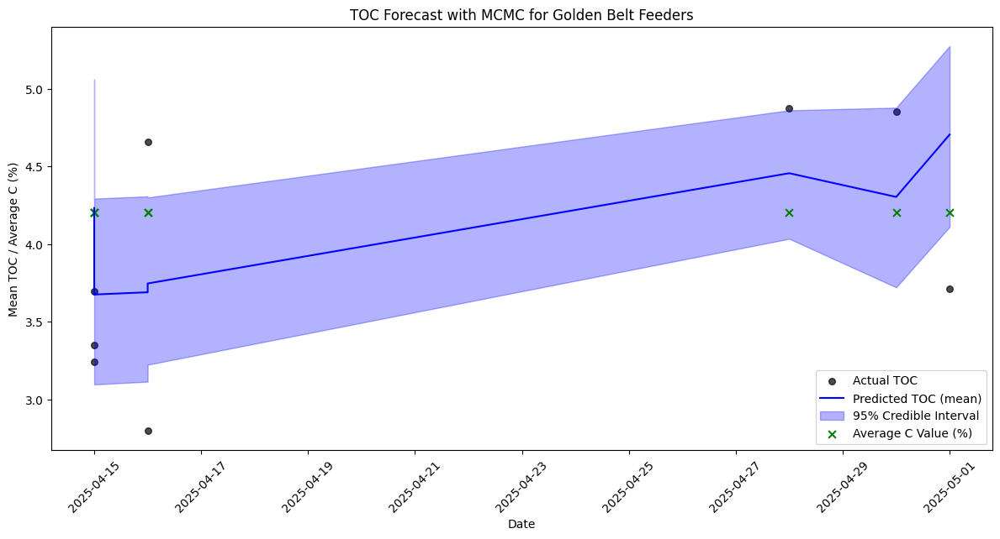


Running model for supplier: KM Feeders


Output()

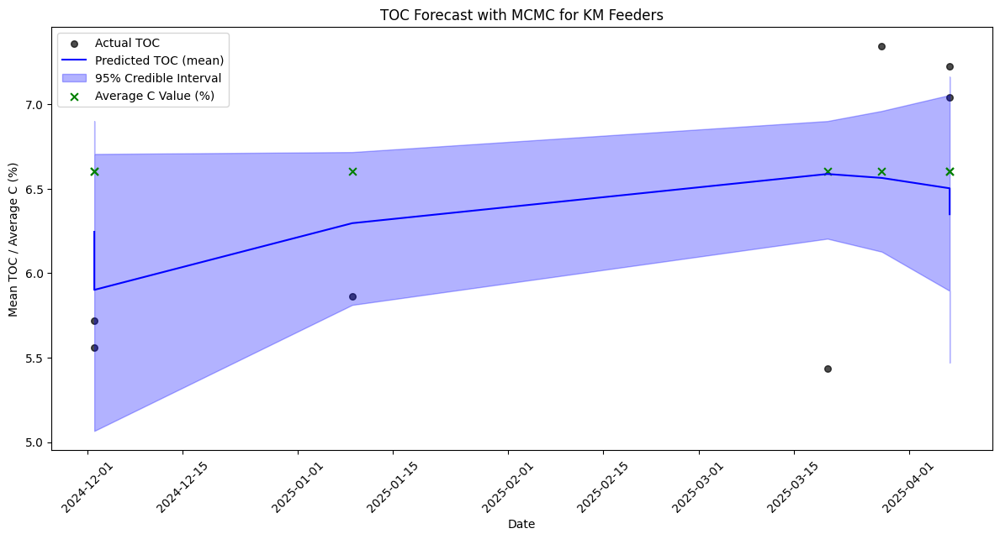


Running model for supplier: Pratt Feeders


Output()

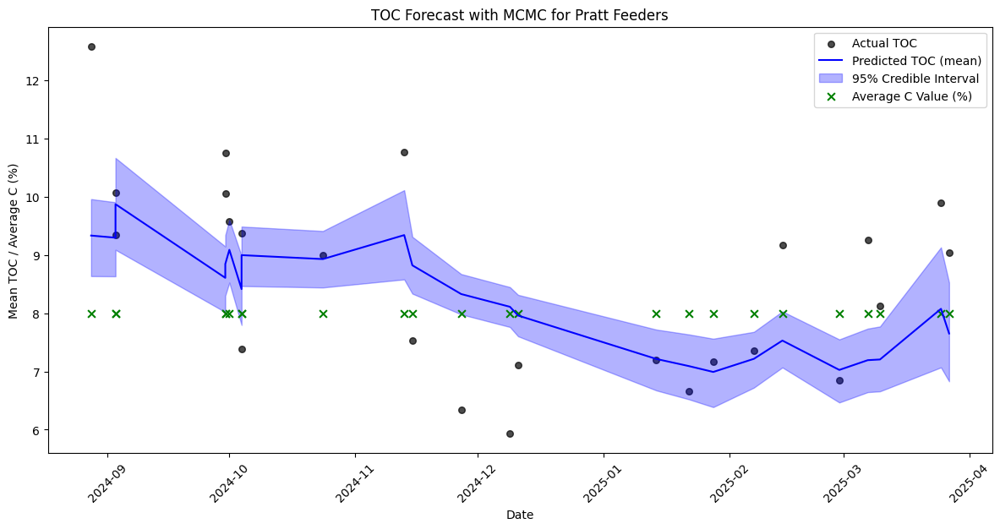


Running model for supplier: City of Derby


Output()

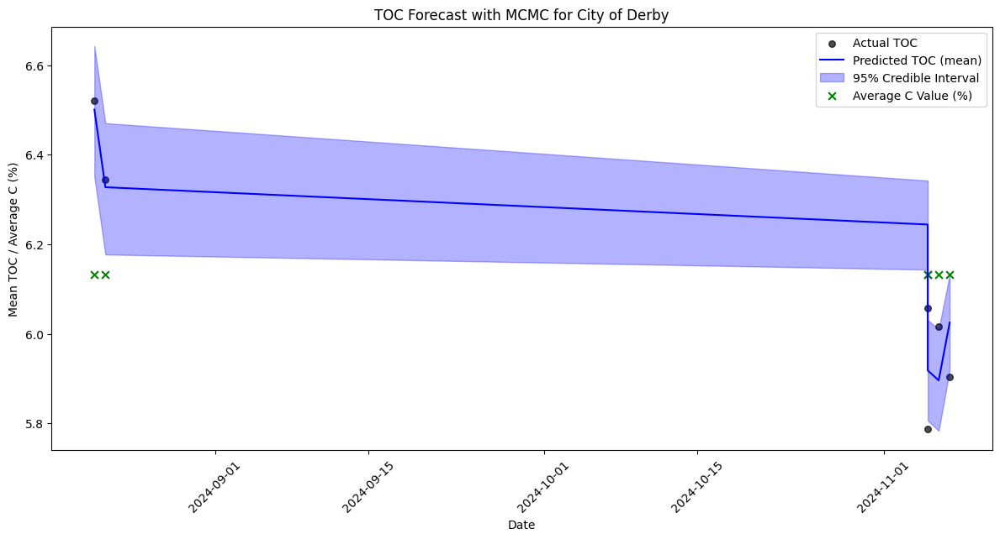


Running model for supplier: 4-S Feeders


Output()

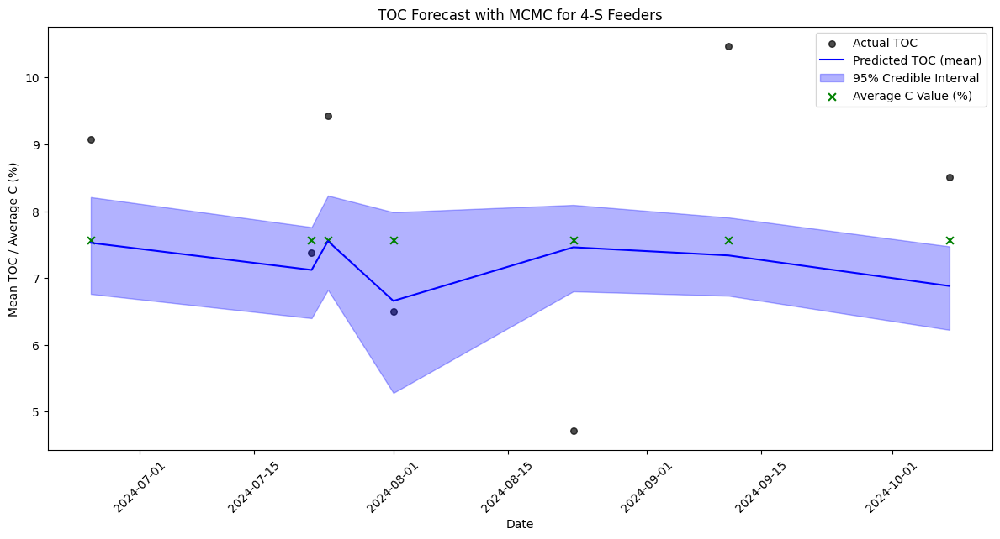


Running model for supplier: Evergreen


Output()

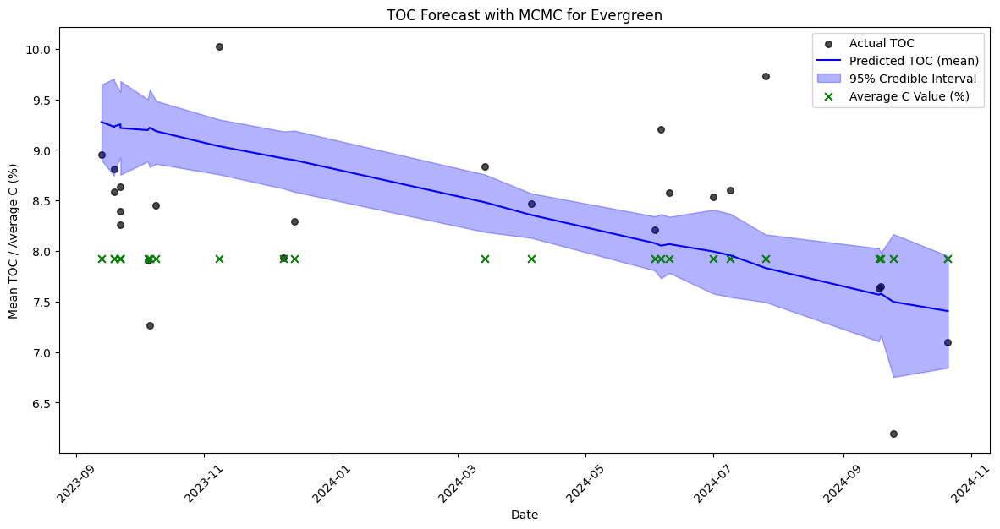

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import pymc as pm
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

df = pd.read_csv("loads_copy.csv")
c_values_df = pd.read_csv('average_c.csv')


# supplier loop
for supplier_name in df['Supplier'].unique():
    print(f"\nRunning model for supplier: {supplier_name}")
    # Get the average C value for this supplier
    c_row = c_values_df[c_values_df['Supplier'] == supplier_name]
    if not c_row.empty:
        avg_c = c_row['Average C value (all removals) (%)'].values[0]
    else:
        avg_c = None  # fallback if missing

    df_supplier = df[df['Supplier'] == supplier_name]

    # drop missing values and prep columns
    df_model = df_supplier[['Date', 'Mean_Moisture', 'Mean_TOC']].dropna()
    if df_model.empty:
        print(f"Skipping {supplier_name} (no usable data).")
        continue

    df_model['Date'] = pd.to_datetime(df_model['Date'])
    df_model['TimeIndex'] = (df_model['Date'] - df_model['Date'].min()).dt.days

    # reset index
    df_model = df_model.reset_index(drop=True)

    X = df_model[['TimeIndex', 'Mean_Moisture']]
    y = df_model['Mean_TOC']
    dates = df_model['Date']

    # standardization
    X_mean = X.mean()
    X_std = X.std()
    X_scaled = (X - X_mean) / X_std

    # split
    X_train, X_test, y_train, y_test, date_train, date_test = train_test_split(
        X_scaled, y, dates, test_size=0.2, random_state=42
    )

    if len(X_train) < 10:
        print(f"Skipping {supplier_name} (not enough data).")
        continue

    X_train_np = X_train.to_numpy()
    y_train_np = y_train.to_numpy()
    X_test_np = X_test.to_numpy()

    with pm.Model() as toc_model:
        beta = pm.Normal('beta', mu=0, sigma=1, shape=X_train_np.shape[1])
        intercept = pm.Normal('intercept', mu=0, sigma=1)
        mu = intercept + pm.math.dot(X_train_np, beta)
        sigma = pm.HalfNormal('sigma', sigma=1)
        y_obs = pm.Normal('y_obs', mu=mu, sigma=sigma, observed=y_train_np)

        trace = pm.sample(1000, tune=1000, target_accept=0.95, return_inferencedata=True)

    # Posterior samples
    posterior_samples = trace.posterior
    beta_samples = posterior_samples['beta'].stack(draws=("chain", "draw")).values
    intercept_samples = posterior_samples['intercept'].stack(draws=("chain", "draw")).values

    # Predictions
    predictions = np.dot(X_test_np, beta_samples) + intercept_samples
    pred_mean = predictions.mean(axis=1)
    pred_lower = np.percentile(predictions, 2.5, axis=1)
    pred_upper = np.percentile(predictions, 97.5, axis=1)

    # Results dataframe
    forecast_df = pd.DataFrame({
        'Date': date_test.values,
        'Actual_TOC': y_test.values,
        'Predicted_Mean_TOC': pred_mean,
        'Lower_CI': pred_lower,
        'Upper_CI': pred_upper
    })

    forecast_df = forecast_df.sort_values('Date')

    #Plot
    plt.figure(figsize=(12, 6))

    plt.scatter(forecast_df['Date'], forecast_df['Actual_TOC'],
                label='Actual TOC', color='black', alpha=0.7, s=30)

    plt.plot(forecast_df['Date'], forecast_df['Predicted_Mean_TOC'],
             label='Predicted TOC (mean)', color='blue')

    plt.fill_between(forecast_df['Date'], forecast_df['Lower_CI'], forecast_df['Upper_CI'],
                     color='blue', alpha=0.3, label='95% Credible Interval')

    if avg_c is not None:
        plt.scatter(forecast_df['Date'], [avg_c] * len(forecast_df),
                    label='Average C Value (%)', color='green', marker='x', s=40)

    plt.xlabel('Date')
    plt.ylabel('Mean TOC / Average C (%)')
    plt.title(f'TOC Forecast with MCMC for {supplier_name}')
    plt.legend()
    plt.tight_layout()
    plt.xticks(rotation=45)
    plt.show()


In [ ]:
# mcmc by waste type

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import pymc as pm
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Load dataset
df = pd.read_csv("loads_copy.csv")
# Load average C values per supplier
c_values_df = pd.read_csv('average_c.csv')

for waste_type in df['Waste Type'].unique():
    print(f"\nRunning model for waste type: {waste_type}")
    # Get the average C value for this supplier
    c_row = c_values_df[c_values_df['Waste Type'] == waste_type]
    if not c_row.empty:
        avg_c = c_row['Average C value (all removals) (%)'].values[0]
    else:
        avg_c = None  # fallback if missing

    # Filter for the current waste type
    df_waste_type = df[df['Waste Type'] == waste_type]




Running model for Waste Type: Manure
[]
[]


Output()

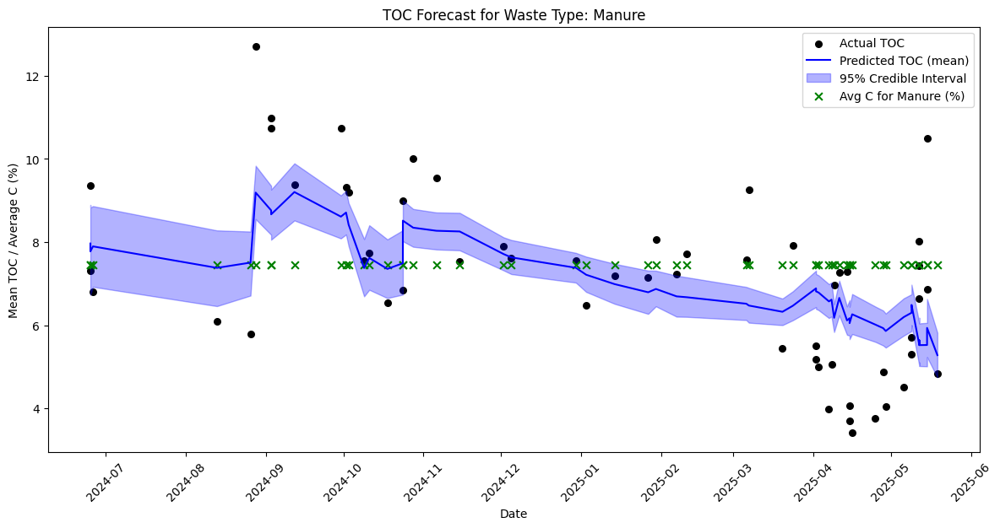

Skipping Biosolids (not enough data: 30 rows).

Running model for Waste Type: Mixed Woody Waste
[[ 0.70059291  0.16490958         nan]
 [ 1.45025577 -0.15596982         nan]
 [ 1.19322851 -1.87066911         nan]
 [-0.57740376  1.77933405         nan]
 [-1.14143582 -1.02836069         nan]
 [ 0.99331841 -0.72753625         nan]
 [-0.54170553  0.75653097         nan]
 [ 1.0075977   0.87686074         nan]
 [ 0.79340832 -0.4868767          nan]
 [ 0.15084015  0.11477217         nan]
 [-0.94866537 -0.73756373         nan]
 [ 0.89336336  1.48853709         nan]
 [-0.49172801  0.64622867         nan]
 [-0.64166058  1.31806991         nan]
 [ 1.47167471 -1.43948741         nan]
 [ 0.82910655  2.20048826         nan]
 [-1.14143582  0.81669585         nan]
 [-0.55598483  1.2177951          nan]
 [ 0.90764266  1.8595539          nan]
 [ 0.65061539 -0.45679426         nan]
 [-0.97722395 -0.12588738         nan]
 [ 1.50023329 -0.9681958          nan]
 [-0.90582749  0.10474469         nan]
 [-0.54

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import pymc as pm
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

df = pd.read_csv("loads_copy.csv")
df['Date'] = pd.to_datetime(df['Date'])
c_values_df = pd.read_csv("average_c.csv")

waste_type_avg_c = c_values_df.groupby('Waste Type')['Average C value (all removals) (%)'].mean().reset_index()
waste_type_avg_c.columns = ['Waste Type', 'Average_C']

# encode
df = df.dropna(subset=['Mean_TOC', 'Mean_Moisture', 'Supplier', 'Waste Type'])
df['Supplier_encoded'] = LabelEncoder().fit_transform(df['Supplier'])

# waste types loop
for waste_type in df['Waste Type'].unique():
    df_waste = df[df['Waste Type'] == waste_type].copy()

    if df_waste.shape[0] < 100:
        print(f"Skipping {waste_type} (not enough data: {df_waste.shape[0]} rows).")
        continue

    print(f"\nRunning model for Waste Type: {waste_type}")
    df_waste['TimeIndex'] = (df_waste['Date'] - df_waste['Date'].min()).dt.days

    X = df_waste[['TimeIndex', 'Mean_Moisture', 'Supplier_encoded']]
    y = df_waste['Mean_TOC']
    dates = df_waste['Date']
    suppliers = df_waste['Supplier']

    # standardization
    X_scaled = (X - X.mean()) / X.std()

    # Split
    try:
        X_train, X_test, y_train, y_test, date_train, date_test, _, supplier_test = train_test_split(
            X_scaled, y, dates, suppliers, test_size=0.2, random_state=42
        )
    except ValueError as e:
        print(f"Skipping {waste_type} due to split error: {e}")
        continue

    if len(X_train) < 10:
        print(f"Skipping {waste_type} (not enough training data).")
        continue

    X_train_np = X_train.to_numpy()
    y_train_np = y_train.to_numpy()
    X_test_np = X_test.to_numpy()

    print(X_train_np[~np.isfinite(X_train_np).all(axis=1)])
    print(y_train_np[~np.isfinite(y_train_np)])
    if not np.all(np.isfinite(X_train_np)) or not np.all(np.isfinite(y_train_np)):
        print(f"Skipping {waste_type} due to non-finite values.")
        continue

    # MCMC
    try:
        with pm.Model() as toc_model:
            beta = pm.Normal('beta', mu=0, sigma=1, shape=X_train_np.shape[1])
            intercept = pm.Normal('intercept', mu=0, sigma=1)
            mu = intercept + pm.math.dot(X_train_np, beta)
            sigma = pm.HalfNormal('sigma', sigma=1)
            y_obs = pm.Normal('y_obs', mu=mu, sigma=sigma, observed=y_train_np)

            trace = pm.sample(1000, tune=1000, target_accept=0.95, return_inferencedata=True)

    except Exception as e:
        print(f"Skipping {waste_type} due to sampling error: {e}")
        continue

    # Predictions
    posterior = trace.posterior
    beta_samples = posterior['beta'].stack(draws=("chain", "draw")).values
    intercept_samples = posterior['intercept'].stack(draws=("chain", "draw")).values

    predictions = np.dot(X_test_np, beta_samples) + intercept_samples
    pred_mean = predictions.mean(axis=1)
    pred_lower = np.percentile(predictions, 2.5, axis=1)
    pred_upper = np.percentile(predictions, 97.5, axis=1)

    forecast_df = pd.DataFrame({
        'Date': date_test.values,
        'Supplier': supplier_test.values,
        'Actual_TOC': y_test.values,
        'Predicted_Mean_TOC': pred_mean,
        'Lower_CI': pred_lower,
        'Upper_CI': pred_upper
    }).sort_values('Date')

    # Plot
    plt.figure(figsize=(12, 6))
    plt.scatter(forecast_df['Date'], forecast_df['Actual_TOC'], label='Actual TOC', color='black', s=30)
    plt.plot(forecast_df['Date'], forecast_df['Predicted_Mean_TOC'], label='Predicted TOC (mean)', color='blue')
    plt.fill_between(forecast_df['Date'], forecast_df['Lower_CI'], forecast_df['Upper_CI'],
                     color='blue', alpha=0.3, label='95% Credible Interval')

    # avg c
    row = waste_type_avg_c[waste_type_avg_c['Waste Type'] == waste_type]
    if not row.empty:
        avg_c = row['Average_C'].values[0]
        plt.scatter(forecast_df['Date'], [avg_c] * len(forecast_df),
                    label=f'Avg C for {waste_type} (%)', color='green', marker='x', s=40)

    plt.xlabel('Date')
    plt.ylabel('Mean TOC / Average C (%)')
    plt.title(f'TOC Forecast for Waste Type: {waste_type}')
    plt.legend()
    plt.tight_layout()
    plt.xticks(rotation=45)
    plt.show()



Running MCMC model for Waste Type: Manure


Output()

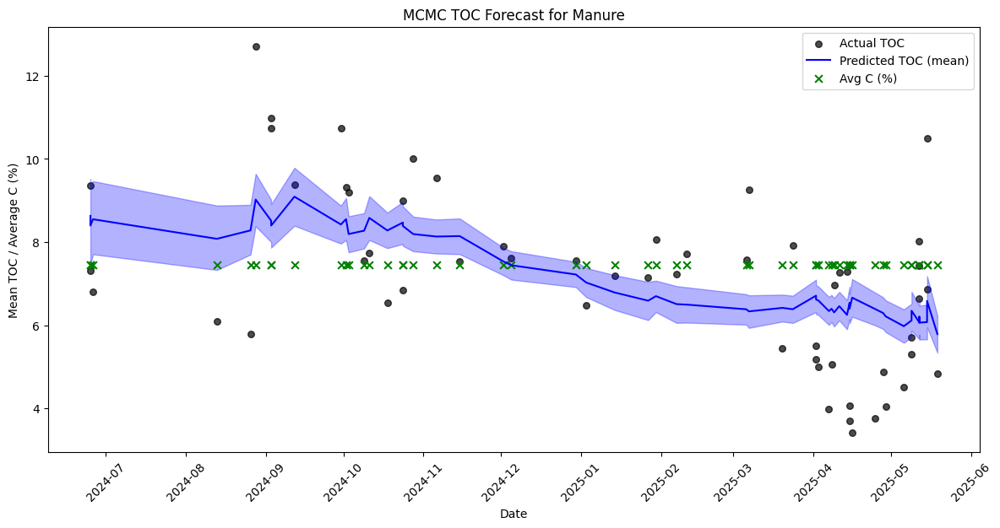


Running MCMC model for Waste Type: Biosolids


Output()

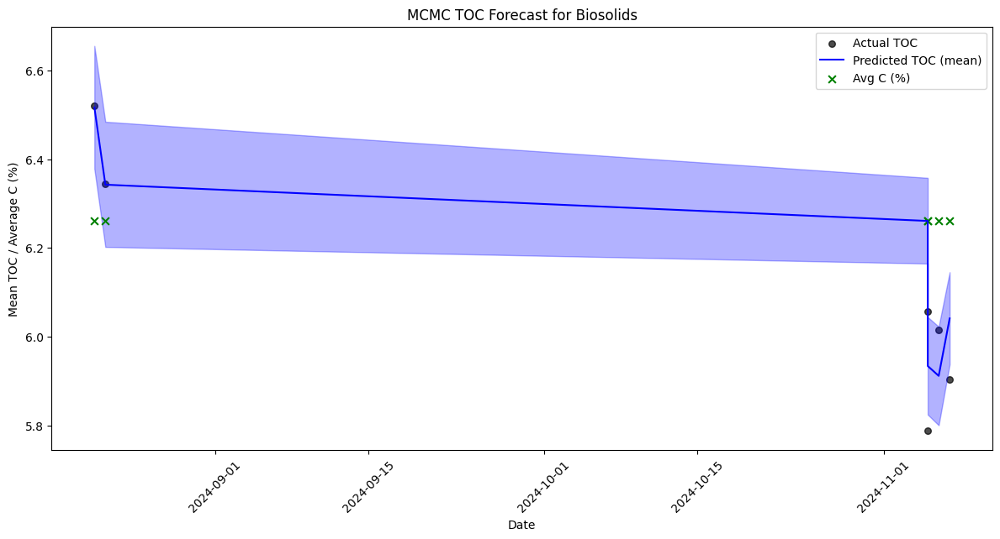


Running MCMC model for Waste Type: Mixed Woody Waste


Output()

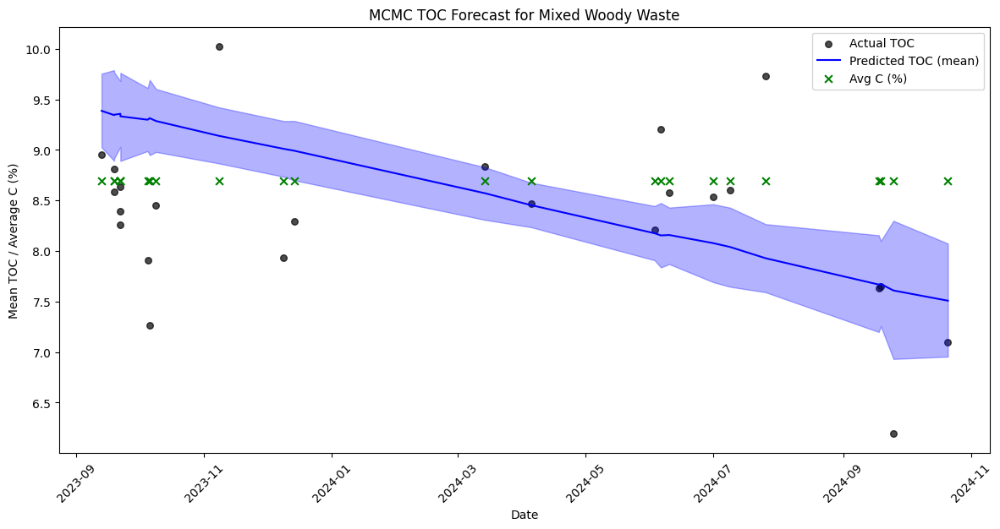

In [ ]:
# mcmc version without supplier as a feature, for the smaller waste types

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pymc as pm
from sklearn.model_selection import train_test_split
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

# data
df = pd.read_csv("loads_copy.csv")
df['Date'] = pd.to_datetime(df['Date'])

# no supplier feature
df = df.dropna(subset=['Mean_TOC', 'Mean_Moisture', 'Waste Type'])

# average C values and compute per waste type
c_values_df = pd.read_csv("average_c.csv")
waste_type_avg_c = c_values_df.groupby('Waste Type')['Average C value (all removals) (%)'].mean().reset_index()
waste_type_avg_c.columns = ['Waste Type', 'Average_C']

# waste type loop
for waste_type in df['Waste Type'].unique():
    df_waste = df[df['Waste Type'] == waste_type].copy()

    if len(df_waste) < 10:
        print(f"Skipping {waste_type} (not enough data)")
        continue

    print(f"\nRunning MCMC model for Waste Type: {waste_type}")

    # features
    df_waste['TimeIndex'] = (df_waste['Date'] - df_waste['Date'].min()).dt.days
    df_waste = df_waste.dropna(subset=['Mean_TOC', 'Mean_Moisture', 'TimeIndex'])

    X = df_waste[['TimeIndex', 'Mean_Moisture']]
    y = df_waste['Mean_TOC']
    dates = df_waste['Date']

    # standardization
    X_scaled = (X - X.mean()) / X.std()

    # train-test split
    X_train, X_test, y_train, y_test, date_train, date_test = train_test_split(
        X_scaled, y, dates, test_size=0.2, random_state=42
    )

    if not np.all(np.isfinite(X_train.to_numpy())) or not np.all(np.isfinite(y_train.to_numpy())):
        print(f"Skipping {waste_type} due to non-finite values.")
        continue

    X_train_np = X_train.to_numpy()
    y_train_np = y_train.to_numpy()
    X_test_np = X_test.to_numpy()

    try:
        with pm.Model() as toc_model:
            beta = pm.Normal('beta', mu=0, sigma=5, shape=X_train_np.shape[1])
            intercept = pm.Normal('intercept', mu=0, sigma=5)
            mu = intercept + pm.math.dot(X_train_np, beta)
            sigma = pm.HalfNormal('sigma', sigma=5)
            y_obs = pm.Normal('y_obs', mu=mu, sigma=sigma, observed=y_train_np)

            trace = pm.sample(1000, tune=1500, target_accept=0.97, return_inferencedata=True)

    except Exception as e:
        print(f"Sampling failed for {waste_type}: {e}")
        continue

    # Posterior predictions
    posterior = trace.posterior
    beta_samples = posterior['beta'].stack(draws=("chain", "draw")).values
    intercept_samples = posterior['intercept'].stack(draws=("chain", "draw")).values
    predictions = np.dot(X_test_np, beta_samples) + intercept_samples

    pred_mean = predictions.mean(axis=1)
    pred_lower = np.percentile(predictions, 2.5, axis=1)
    pred_upper = np.percentile(predictions, 97.5, axis=1)

    forecast_df = pd.DataFrame({
        'Date': date_test.values,
        'Actual_TOC': y_test.values,
        'Predicted_Mean_TOC': pred_mean,
        'Lower_CI': pred_lower,
        'Upper_CI': pred_upper
    }).sort_values('Date')

    # Plot
    plt.figure(figsize=(12, 6))
    plt.scatter(forecast_df['Date'], forecast_df['Actual_TOC'], label='Actual TOC', color='black', alpha=0.7, s=30)
    plt.plot(forecast_df['Date'], forecast_df['Predicted_Mean_TOC'], label='Predicted TOC (mean)', color='blue')
    plt.fill_between(forecast_df['Date'], forecast_df['Lower_CI'], forecast_df['Upper_CI'], color='blue', alpha=0.3)

    # Add average C value for waste type
    avg_row = waste_type_avg_c[waste_type_avg_c['Waste Type'] == waste_type]
    if not avg_row.empty:
        avg_c = avg_row['Average_C'].values[0]
        plt.scatter(forecast_df['Date'], [avg_c] * len(forecast_df), label='Avg C (%)', color='green', marker='x', s=40)

    plt.title(f'MCMC TOC Forecast for {waste_type}')
    plt.xlabel('Date')
    plt.ylabel('Mean TOC / Average C (%)')
    plt.legend()
    plt.tight_layout()
    plt.xticks(rotation=45)
    plt.show()


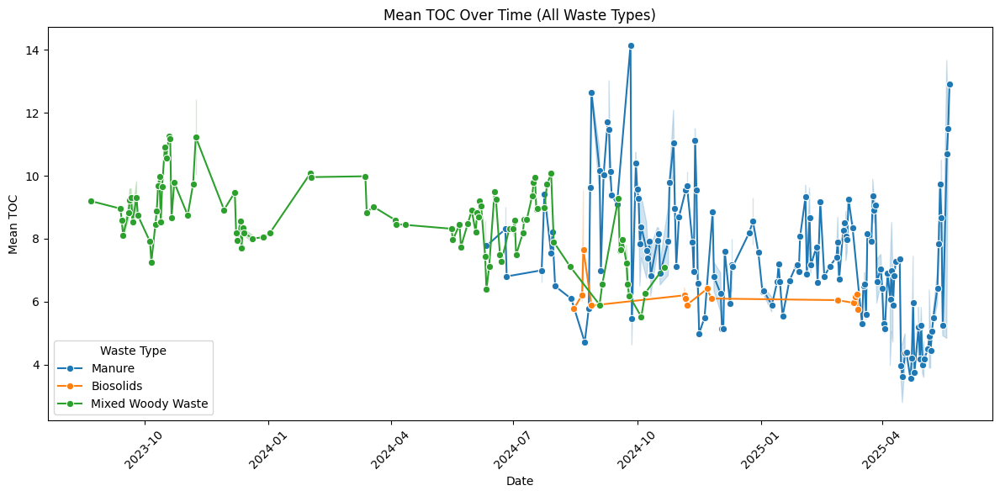

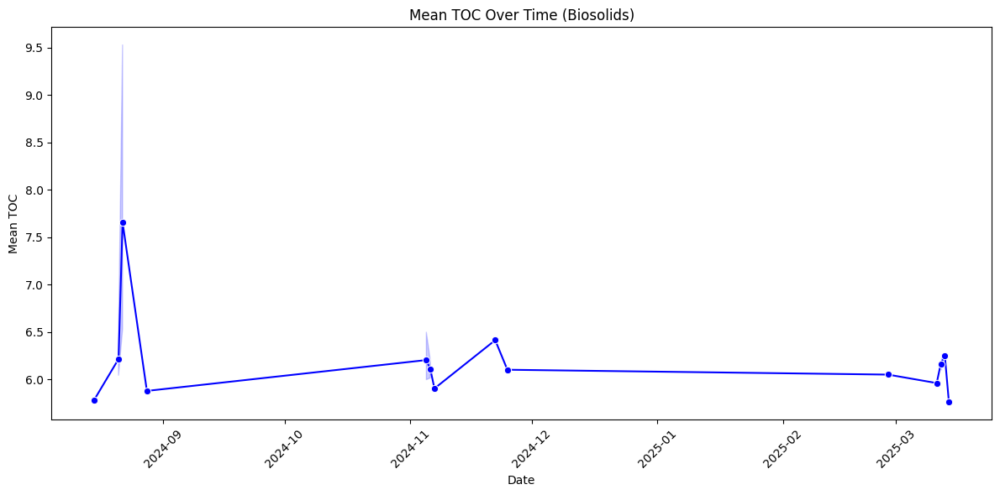

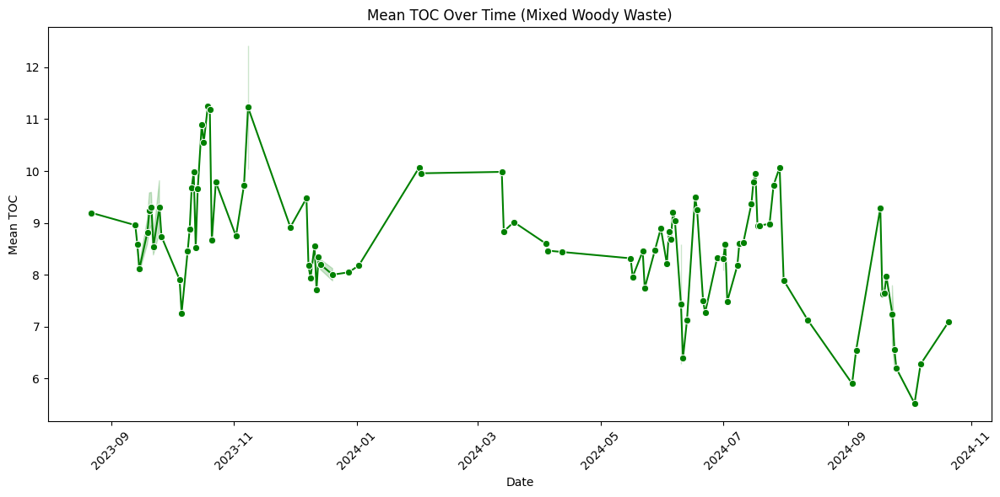

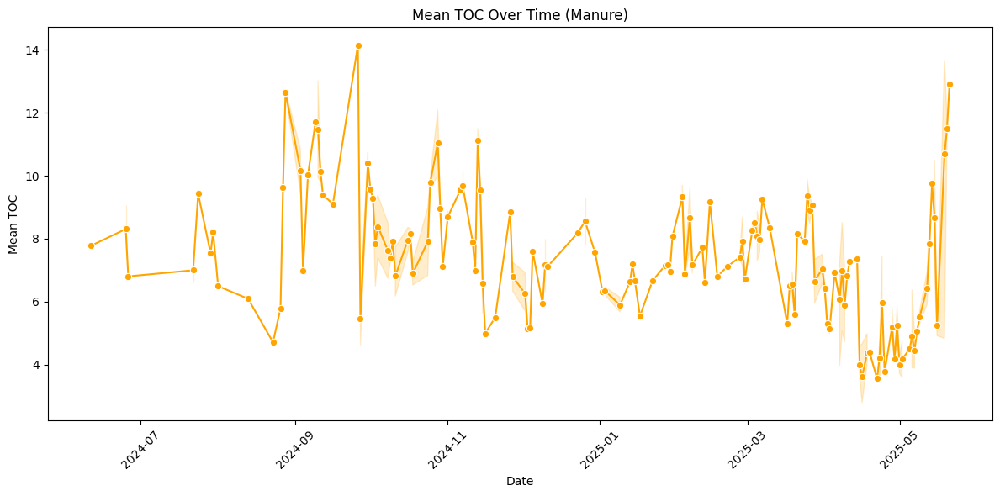

In [ ]:
# waste types chart over time
import matplotlib.pyplot as plt
import seaborn as sns

# all waste types
plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x='Date', y='Mean_TOC', hue='Waste Type', marker='o')
plt.title("Mean TOC Over Time (All Waste Types)")
plt.ylabel("Mean TOC")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# biosolids
df_biosolids = df[df['Waste Type'] == 'Biosolids']
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_biosolids, x='Date', y='Mean_TOC', marker='o', color='blue')
plt.title("Mean TOC Over Time (Biosolids)")
plt.ylabel("Mean TOC")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# mixed woody waste
df_mixed = df[df['Waste Type'] == 'Mixed Woody Waste']
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_mixed, x='Date', y='Mean_TOC', marker='o', color='green')
plt.title("Mean TOC Over Time (Mixed Woody Waste)")
plt.ylabel("Mean TOC")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# manure
df_manure = df[df['Waste Type'] == 'Manure']
plt.figure(figsize=(12, 6))
sns.lineplot(data=df_manure, x='Date', y='Mean_TOC', marker='o', color='orange')
plt.title("Mean TOC Over Time (Manure)")
plt.ylabel("Mean TOC")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Running rolling MCMC for supplier: Sellers Feedlot


Output()

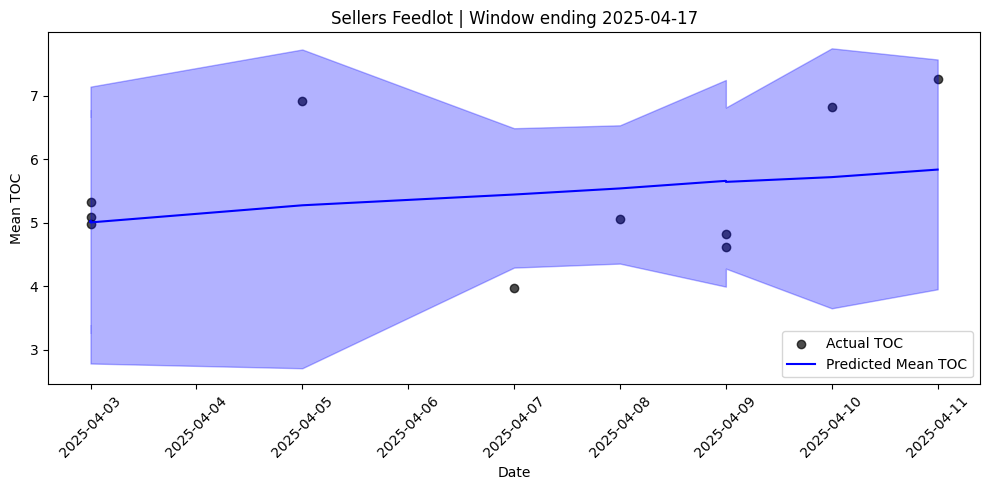


Running rolling MCMC for supplier: Ford County Feeders

Running rolling MCMC for supplier: Golden Belt Feeders


Output()

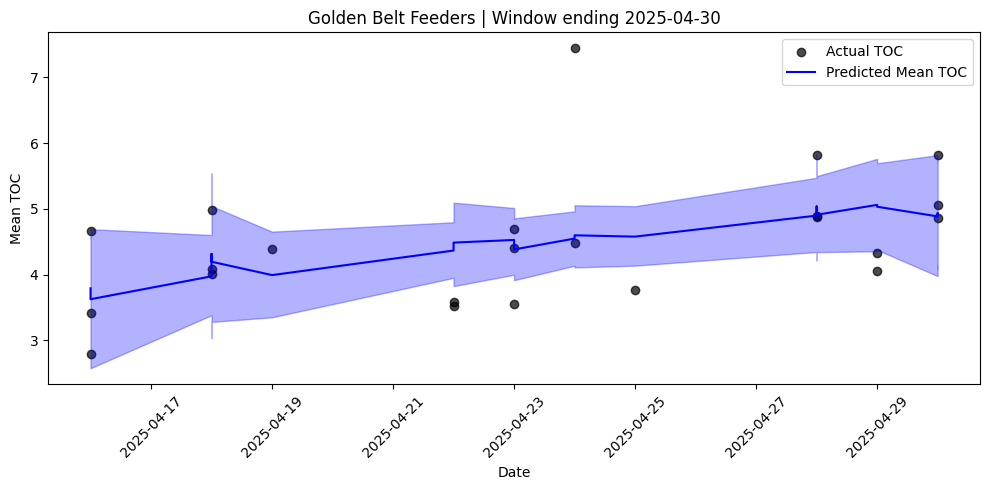

Output()

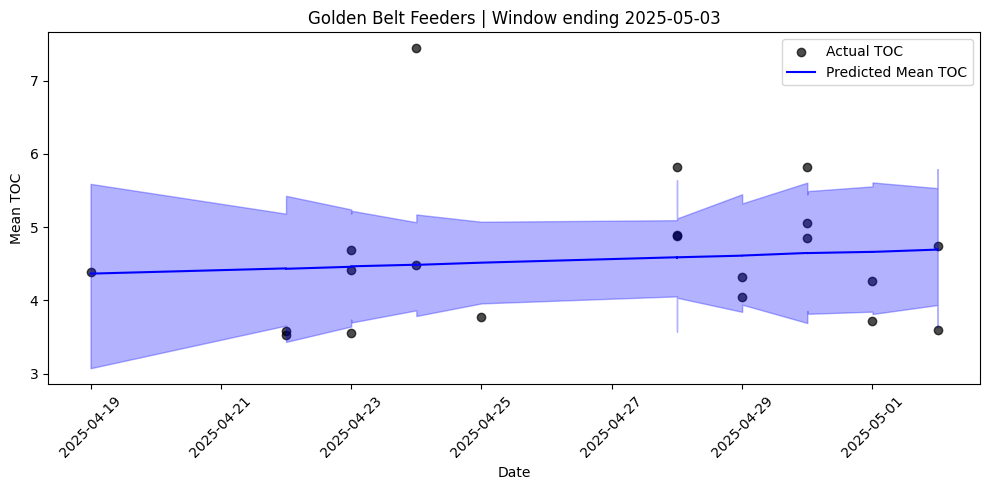

Output()

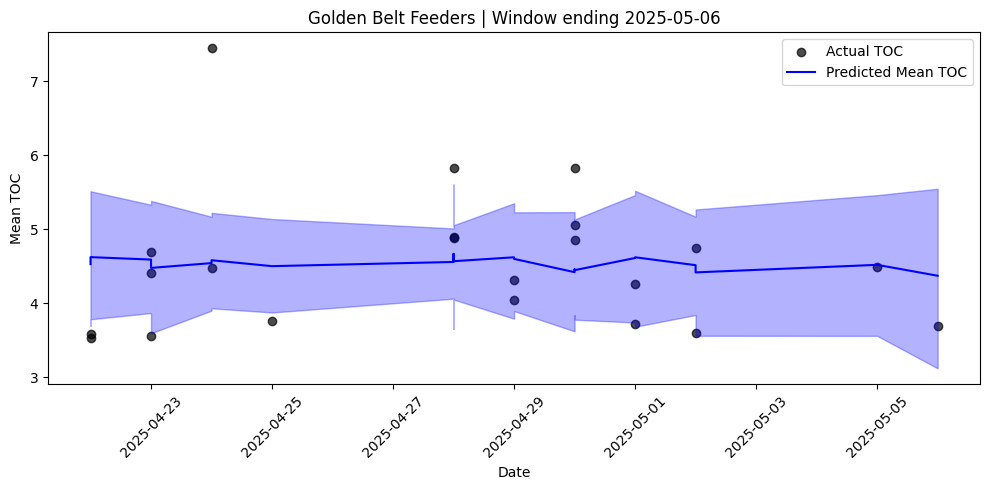


Running rolling MCMC for supplier: KM Feeders


Output()

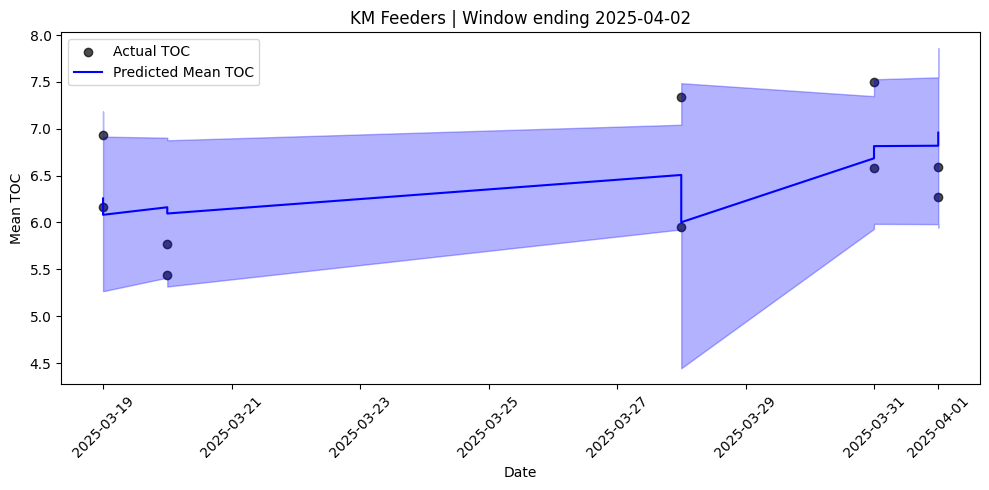

Output()

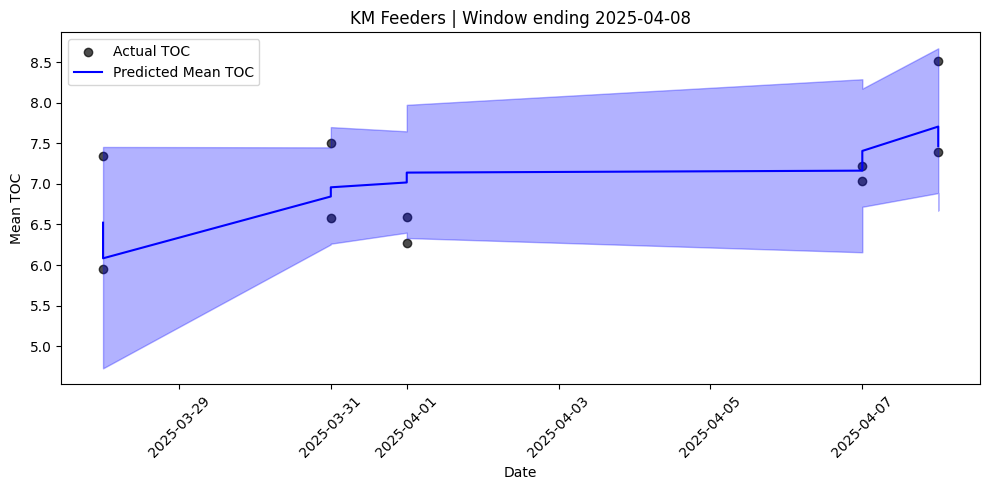

Output()

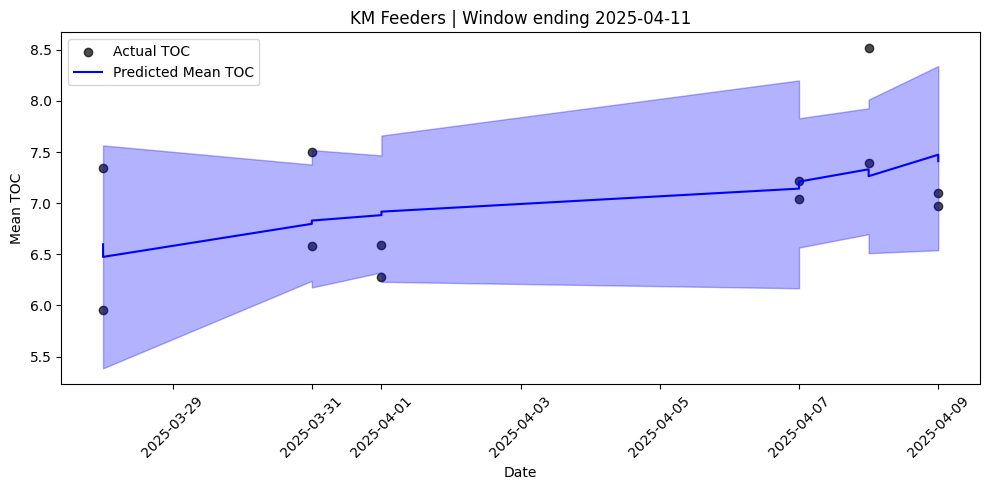

Output()

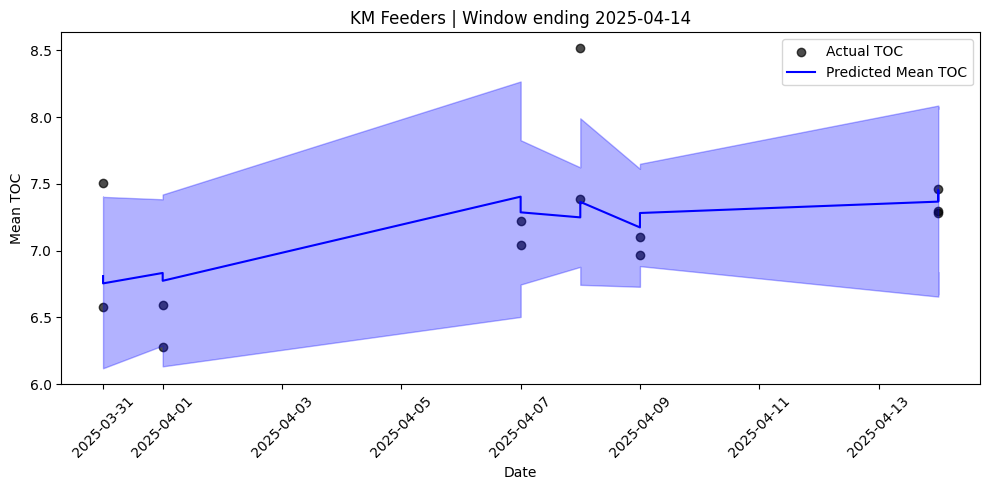


Running rolling MCMC for supplier: Pratt Feeders


Output()

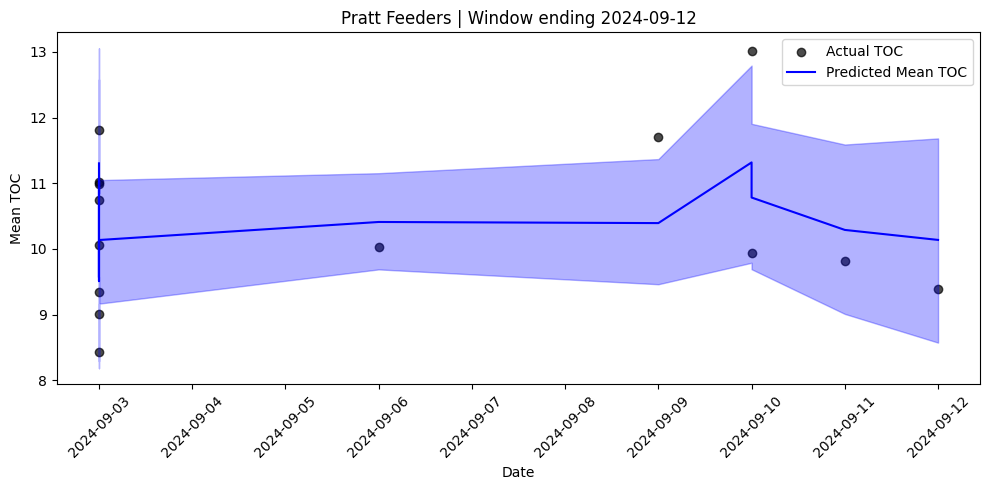

Output()

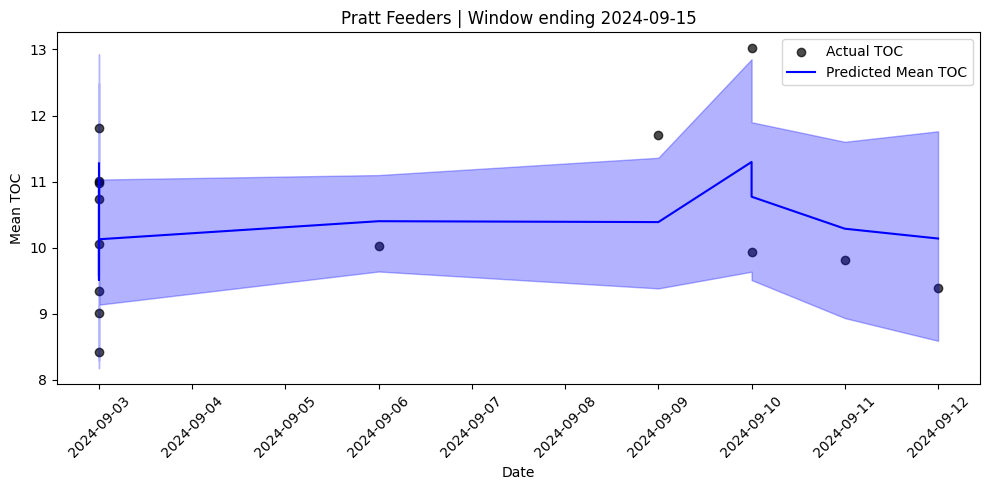

Output()

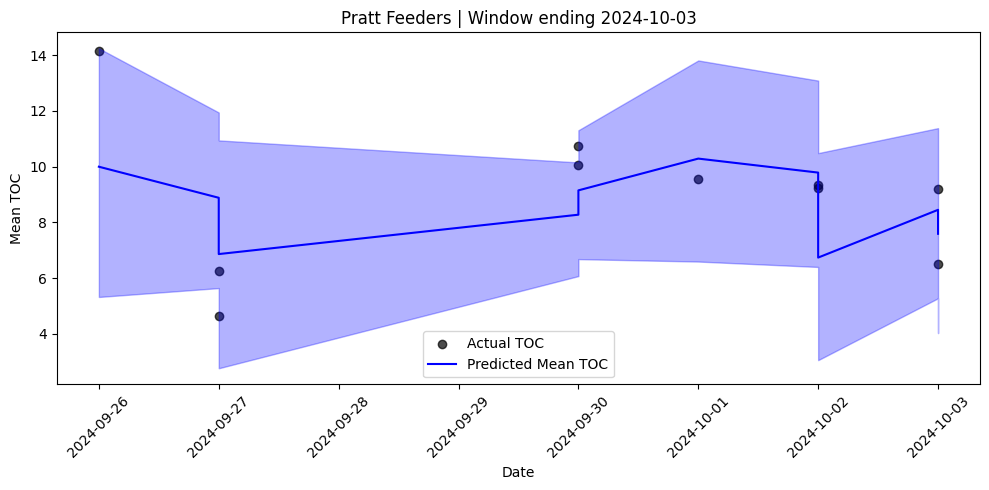

Output()

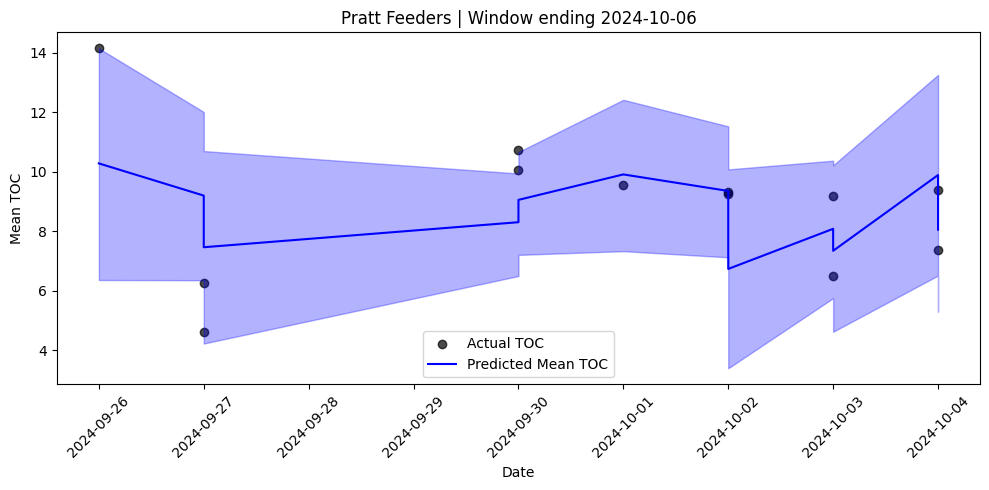

Output()

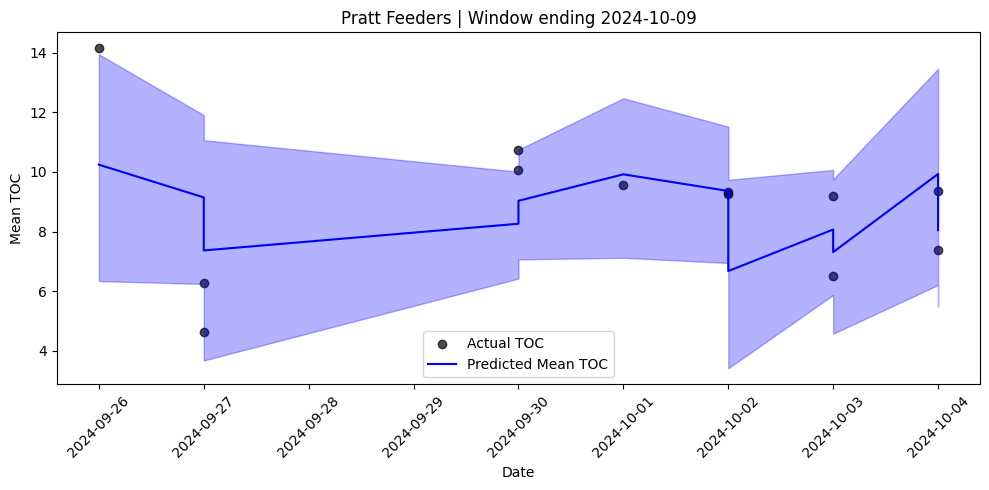

Output()

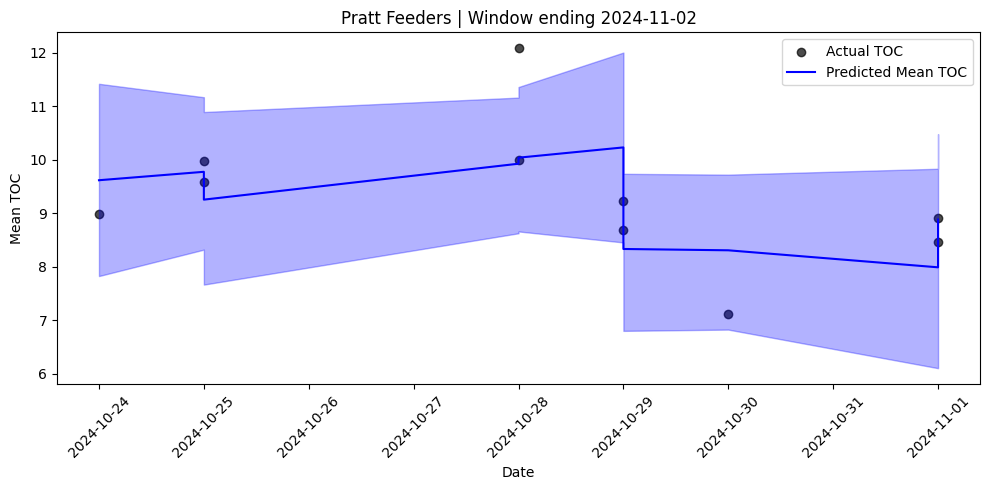

Output()

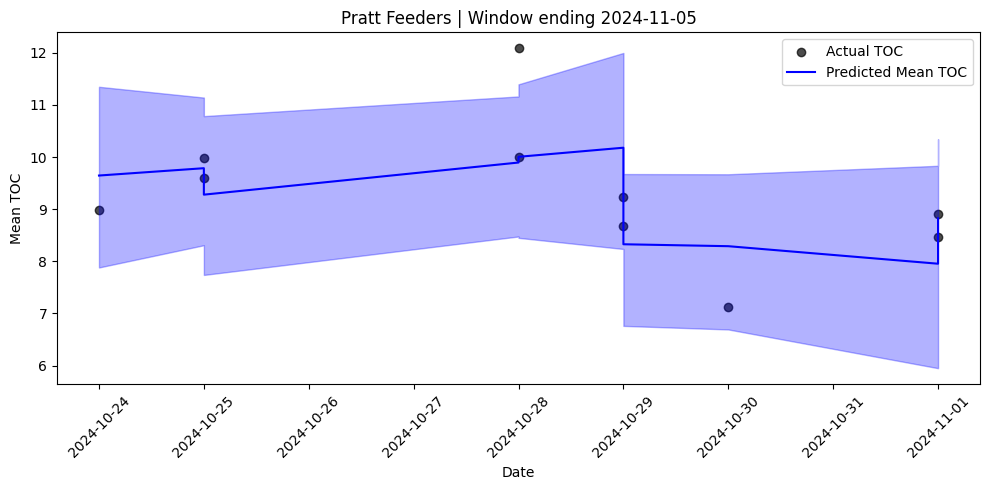

Output()

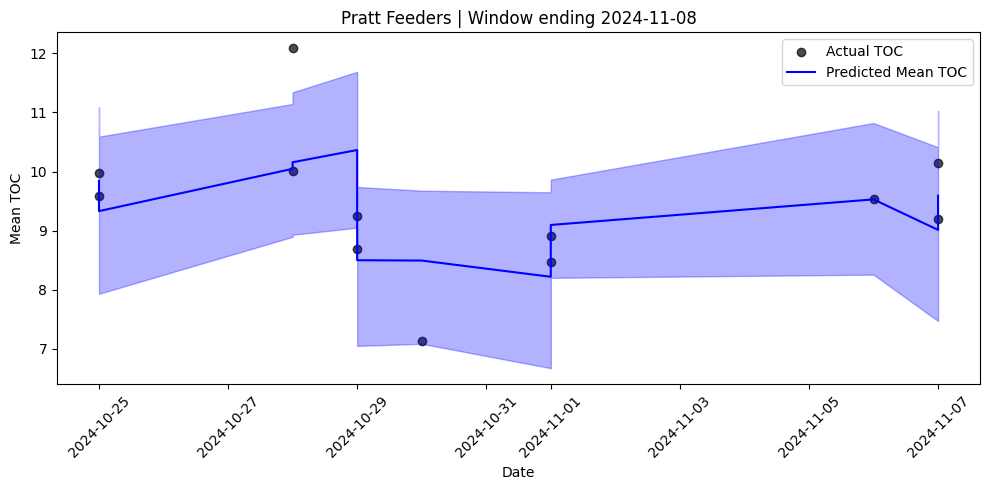

Output()

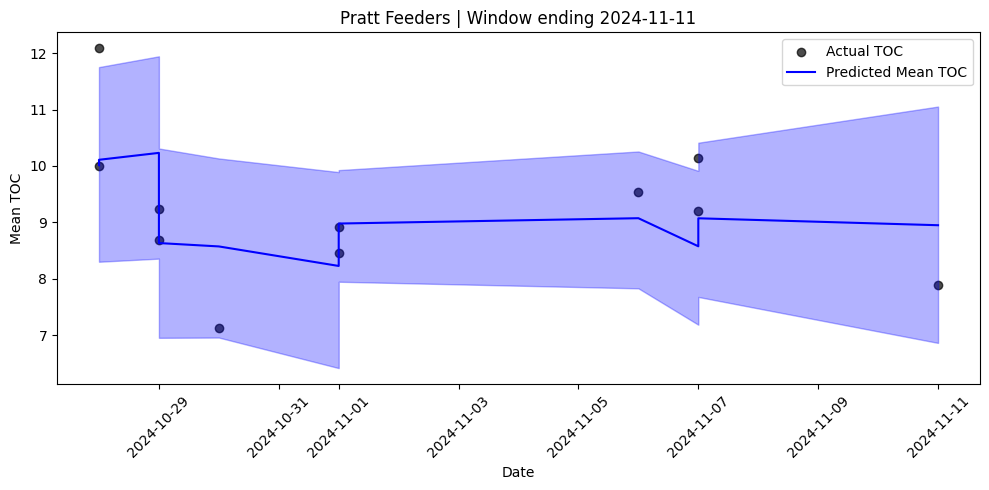

Output()

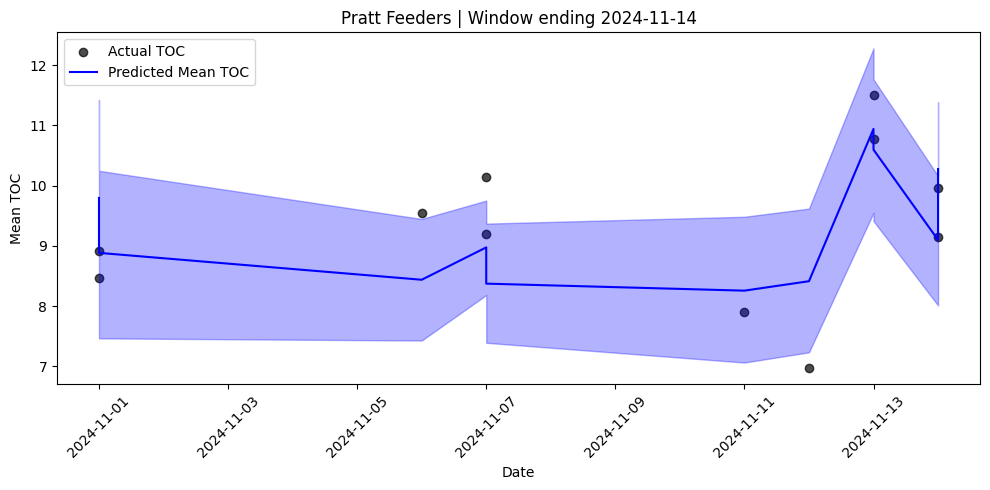

Output()

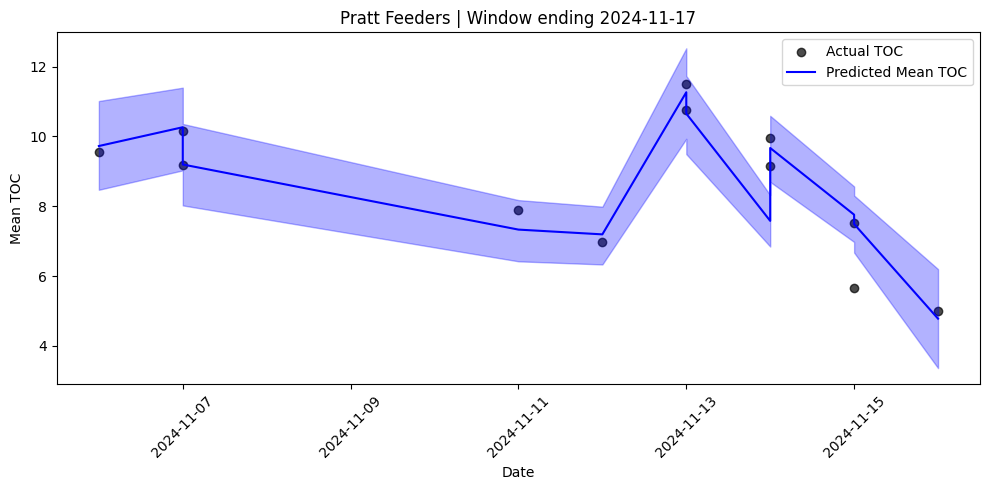

Output()

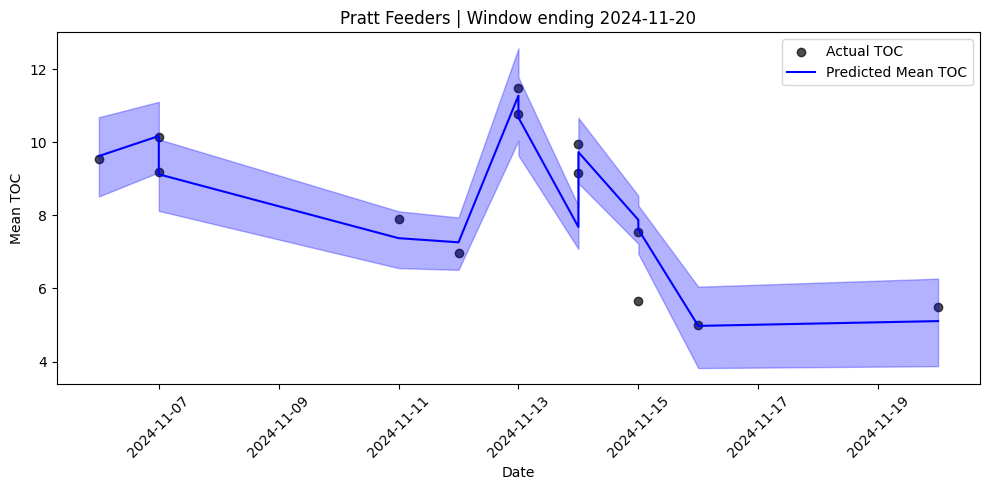

Output()

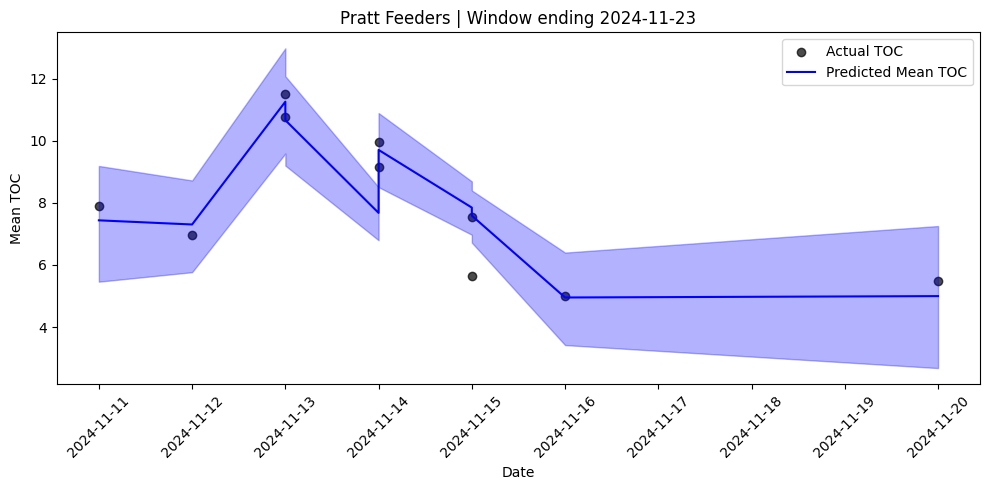

Output()

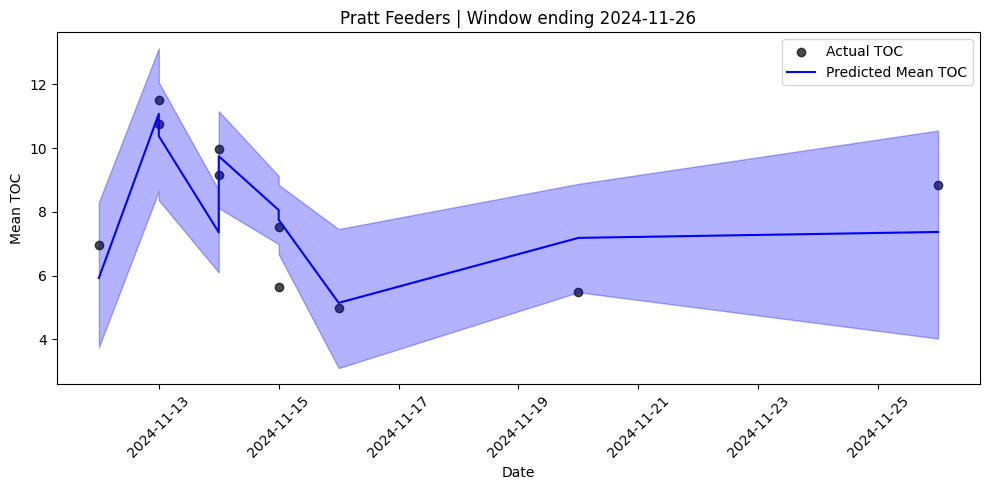

Output()

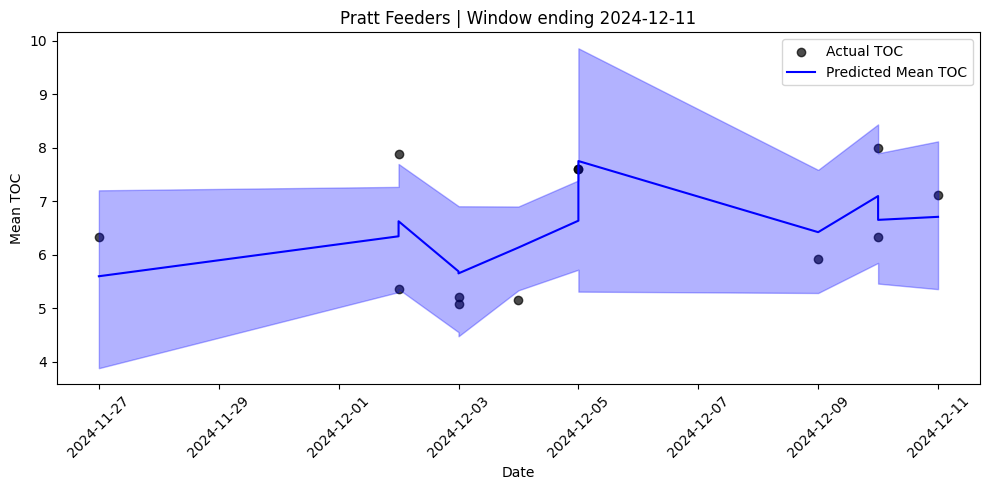

Output()

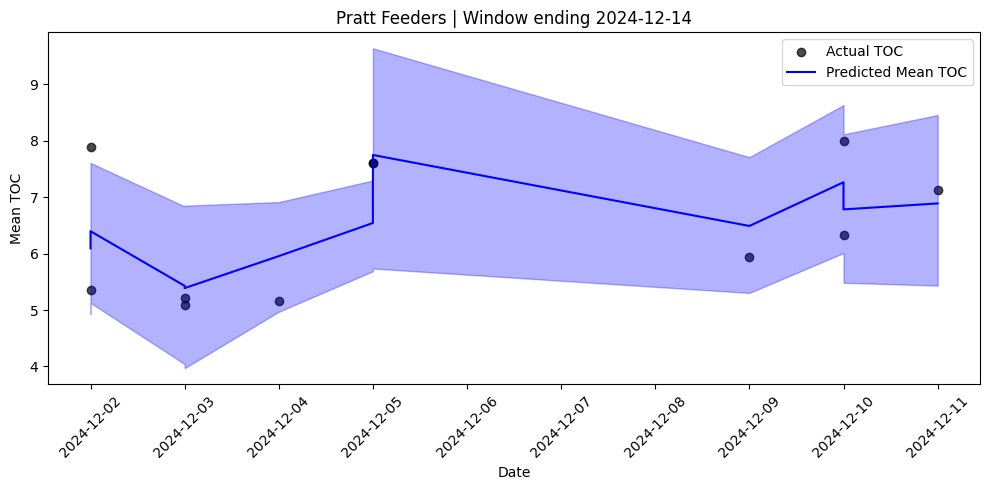

Output()

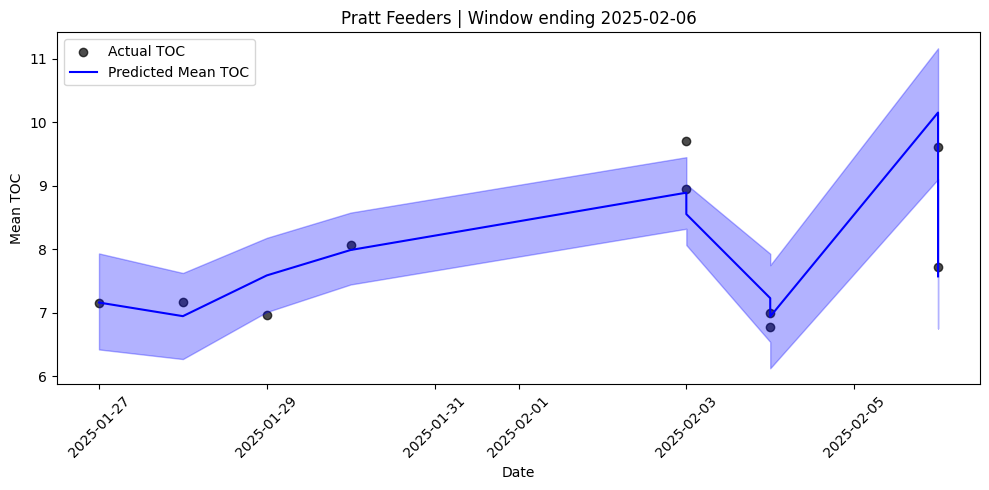

Output()

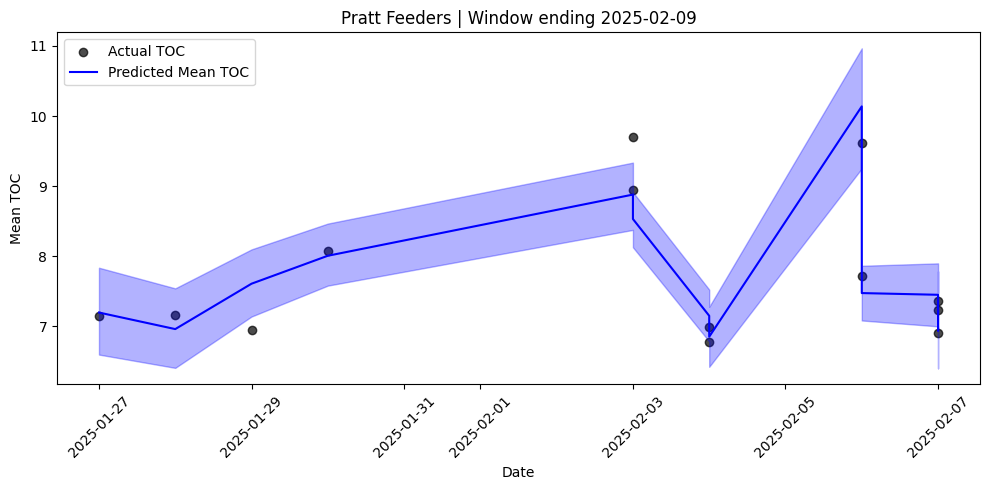

Output()

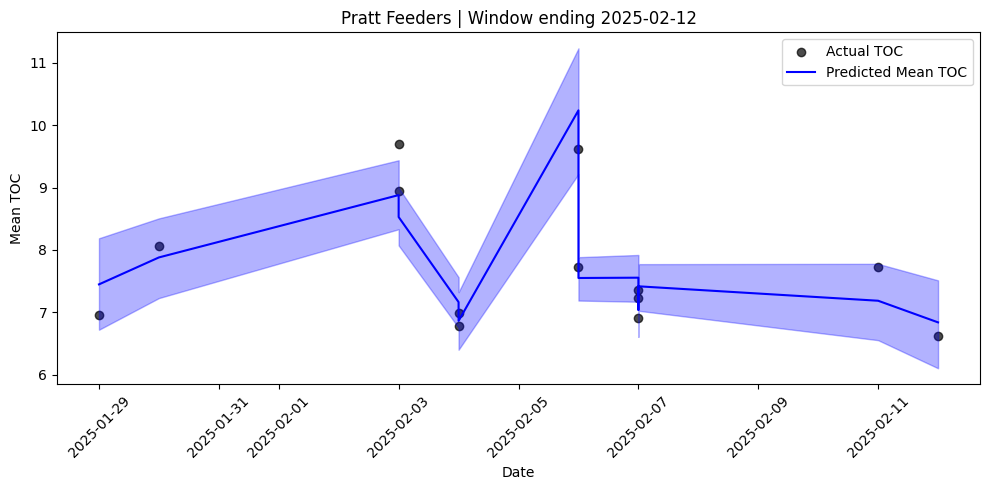

Output()

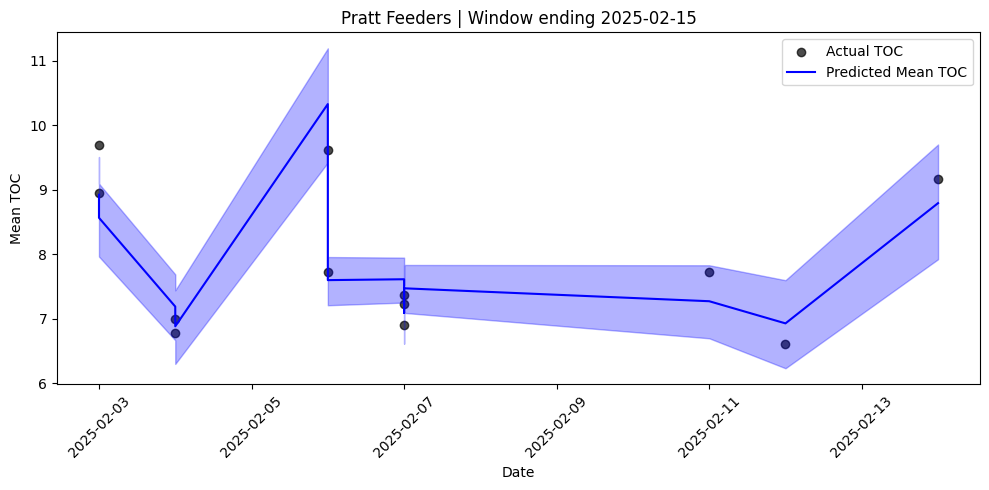

Output()

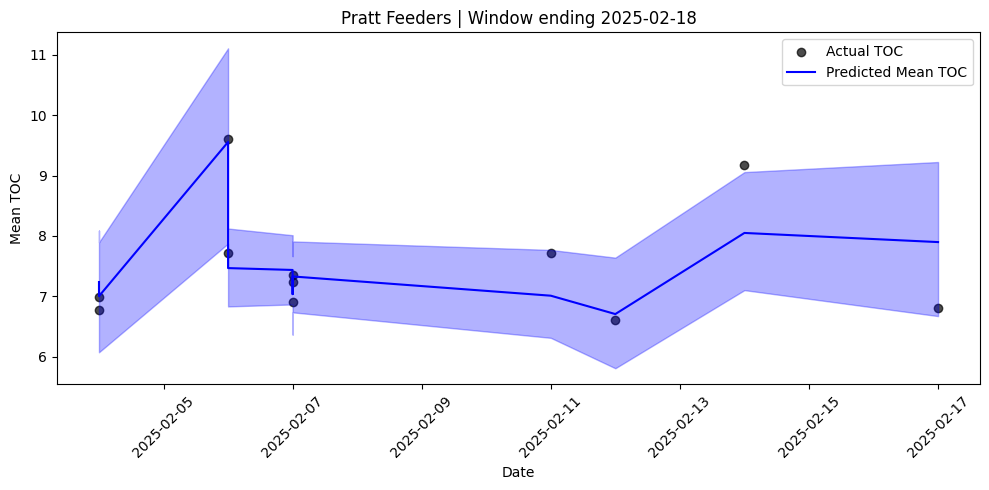

Output()

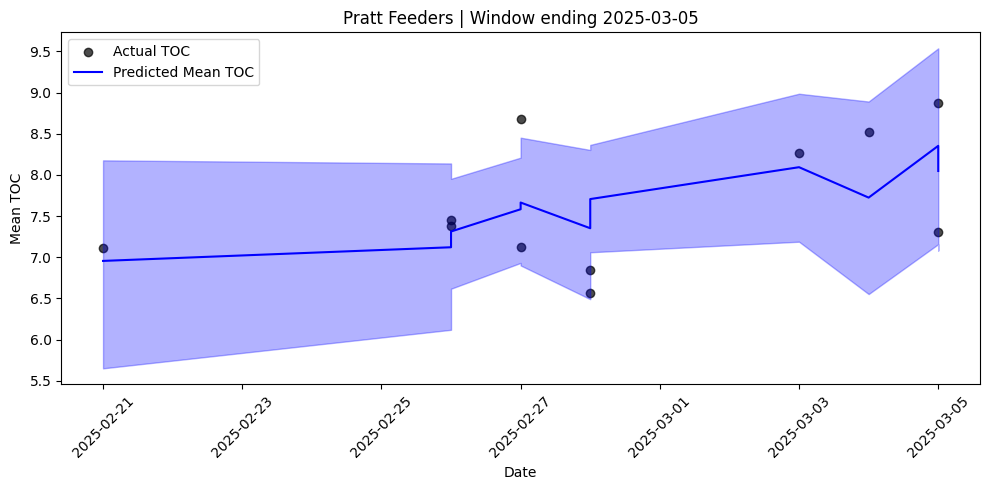

Output()

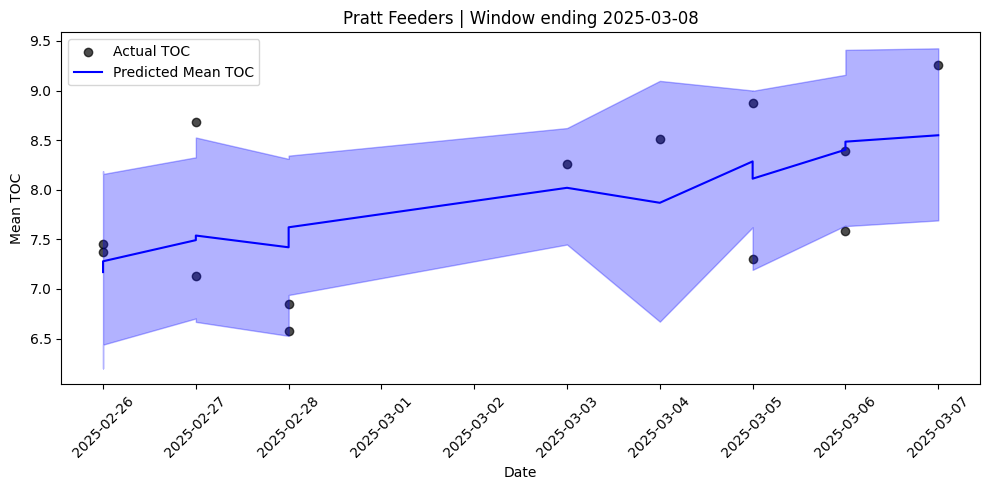

Output()

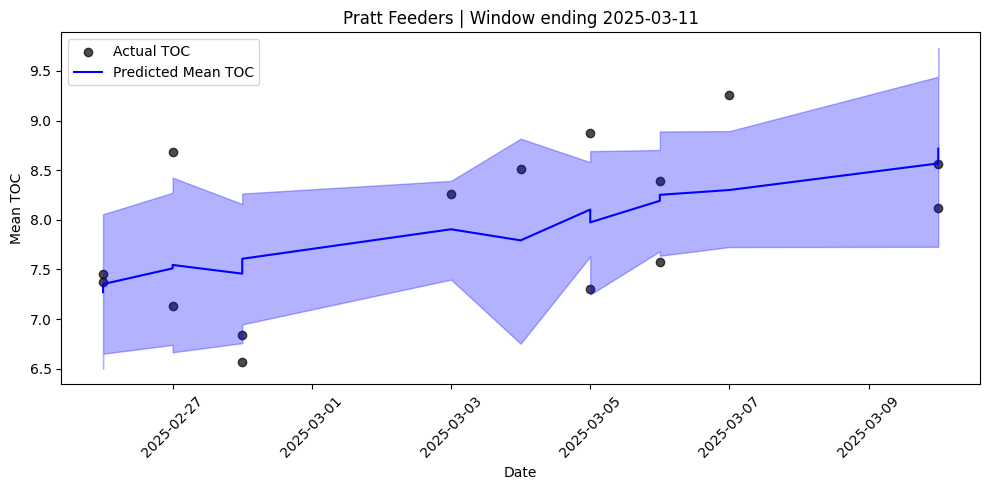

Output()

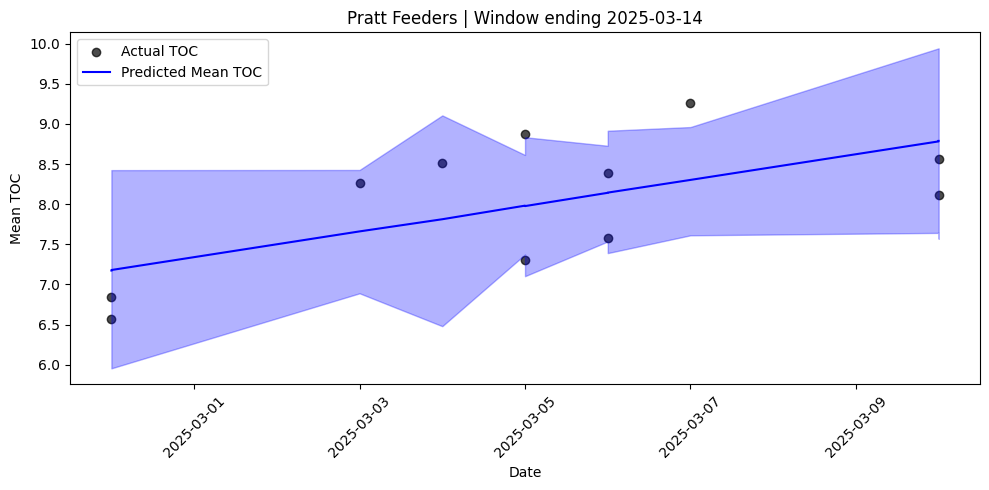


Running rolling MCMC for supplier: City of Derby


Output()

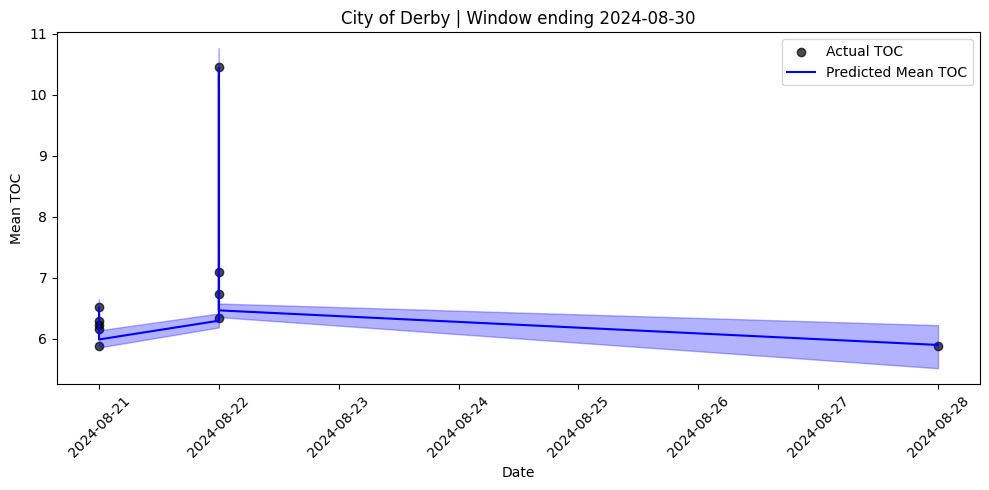

Output()

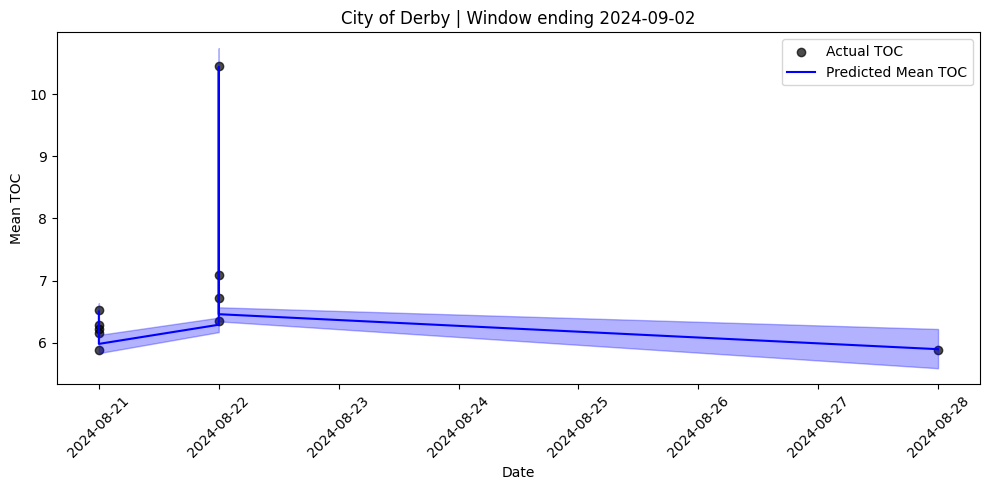

Output()

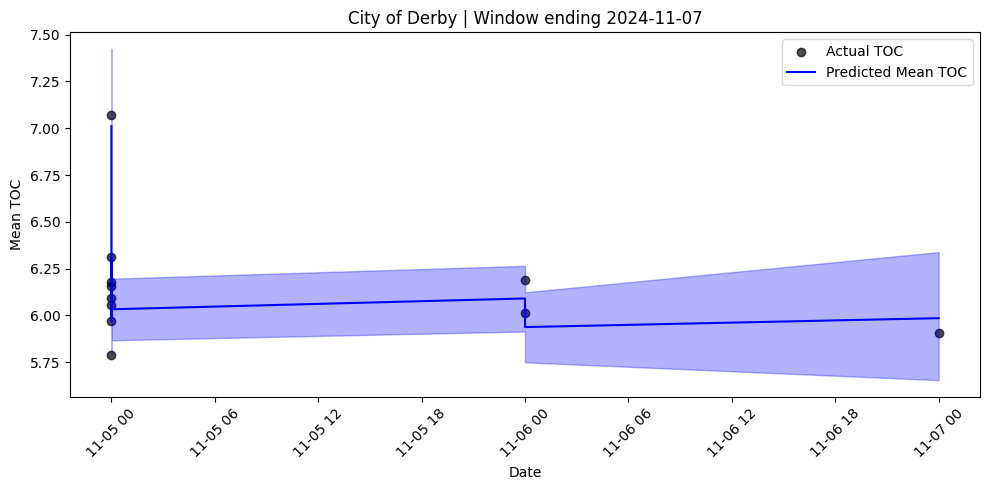

Output()

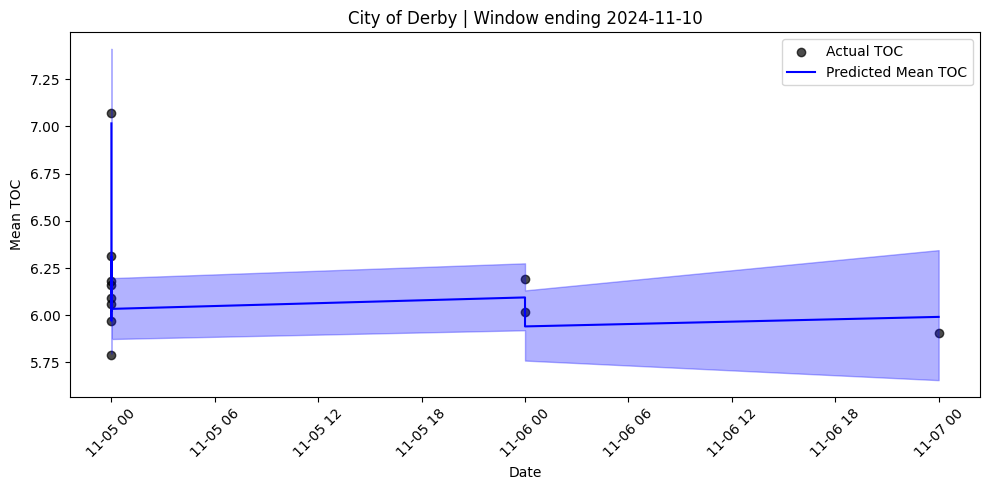

Output()

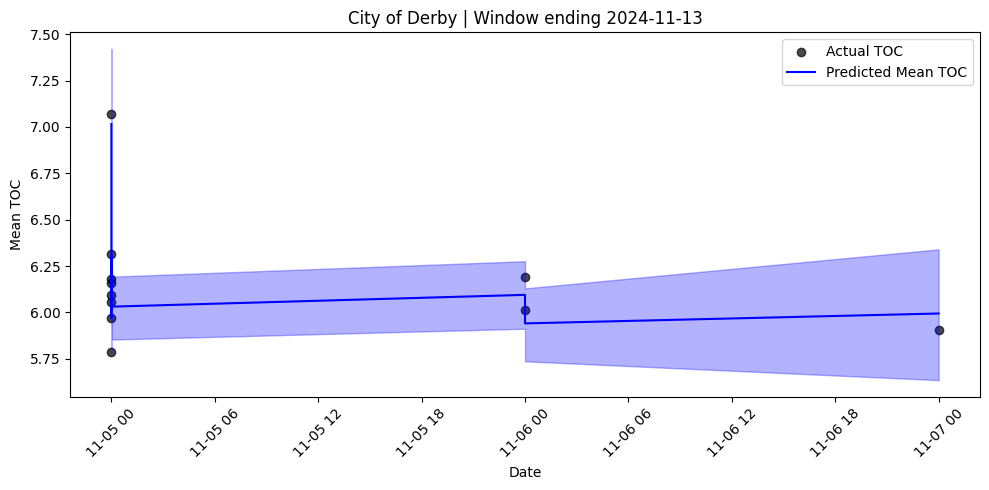

Output()

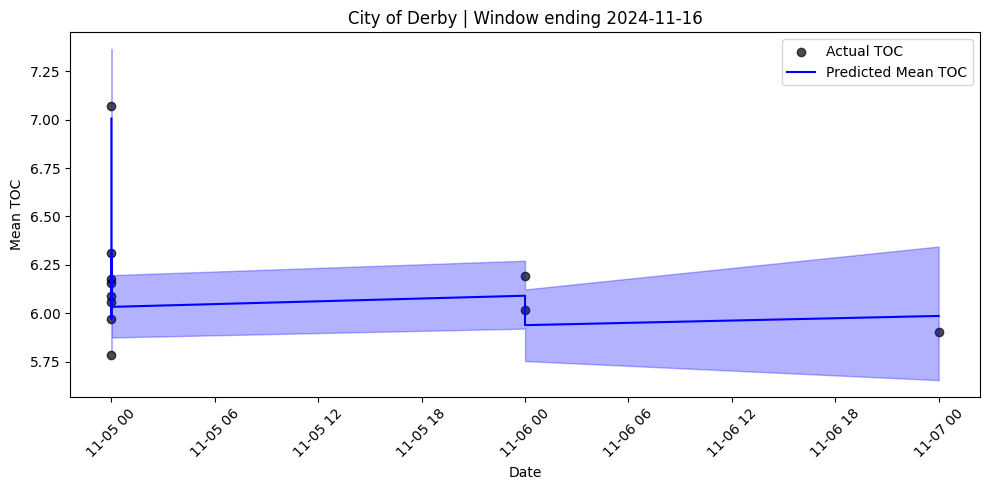

Output()

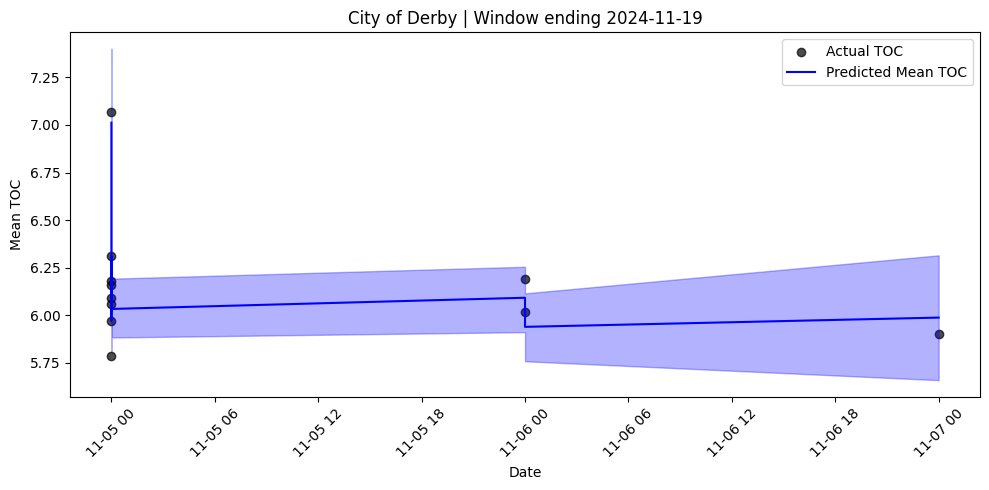


Running rolling MCMC for supplier: 4-S Feeders


Output()

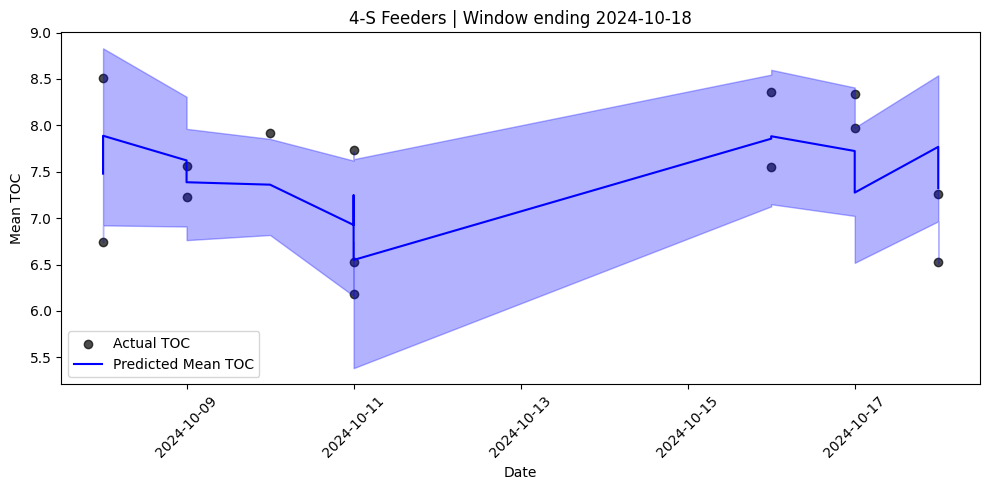

Output()

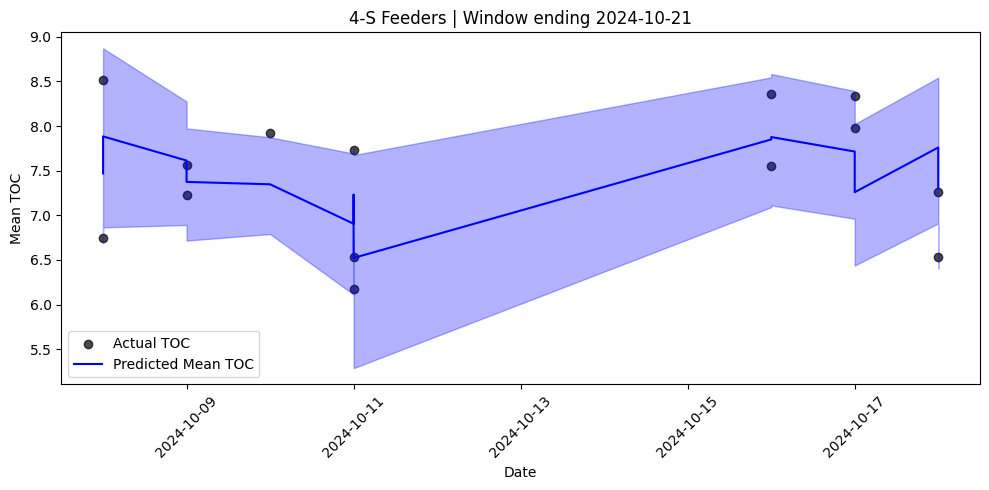

Output()

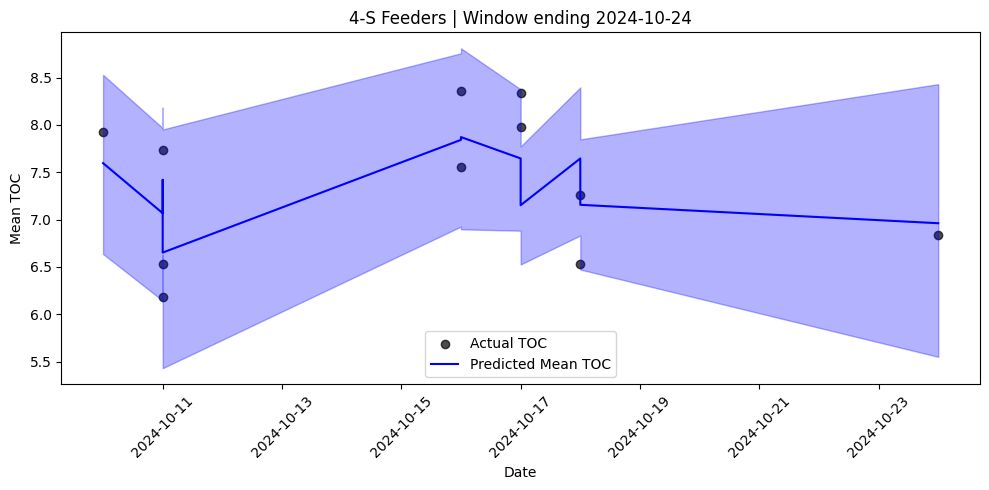


Running rolling MCMC for supplier: Evergreen


Output()

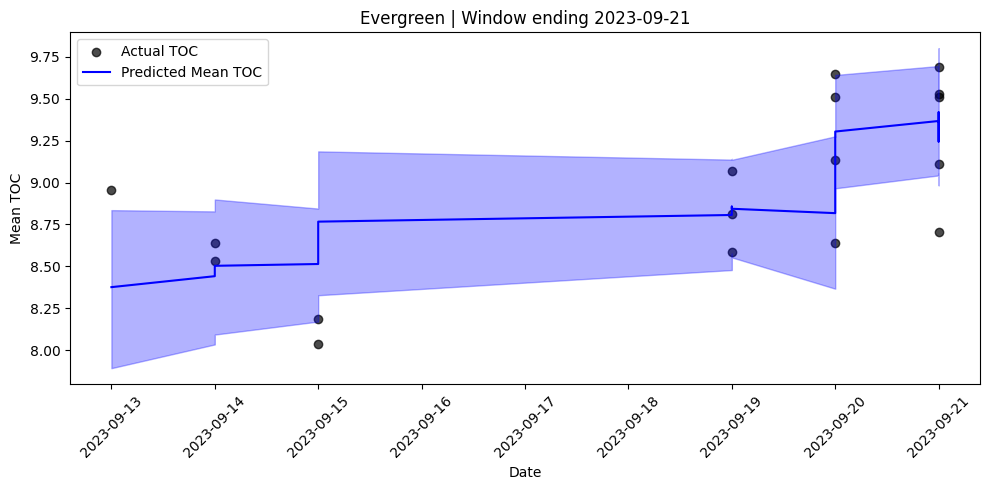

Output()

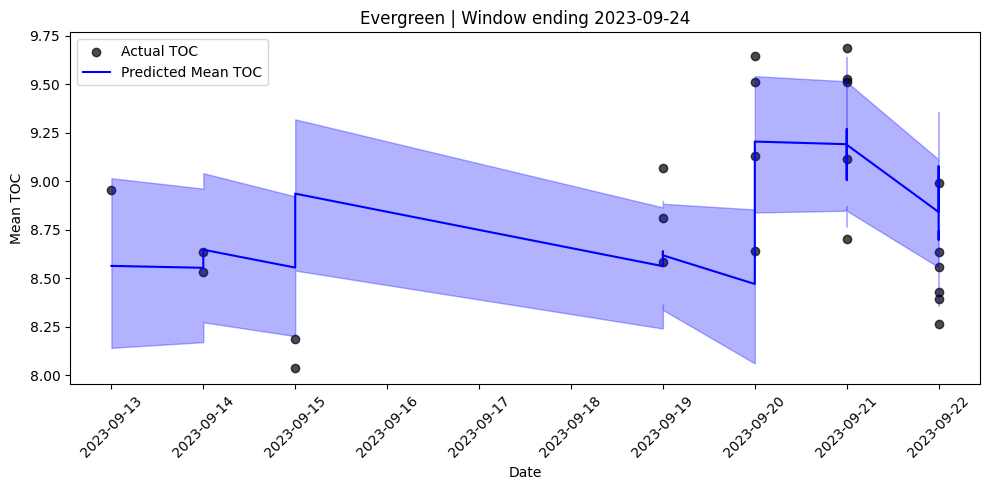

Output()

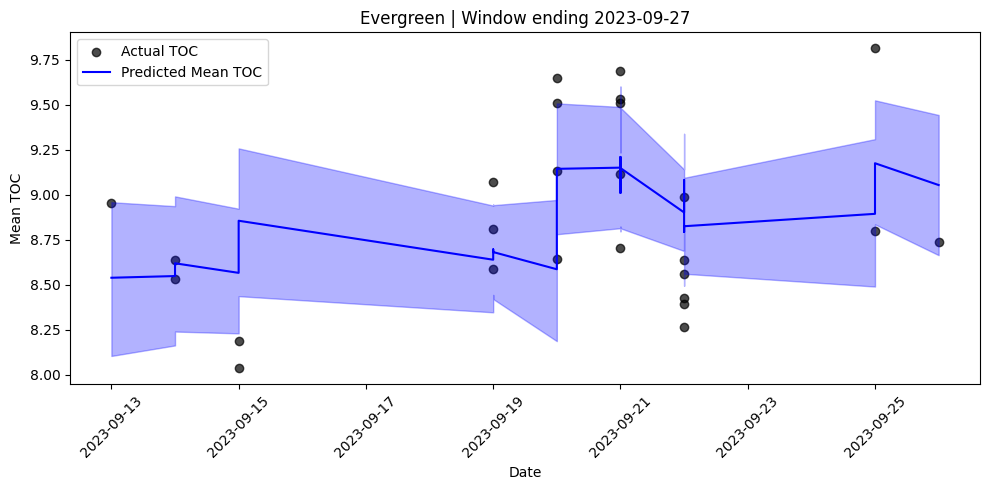

Output()

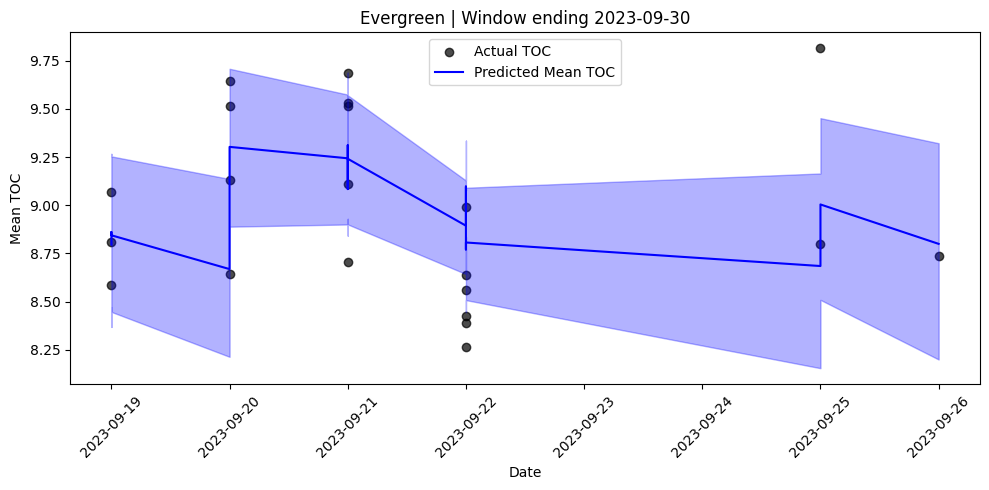

Output()

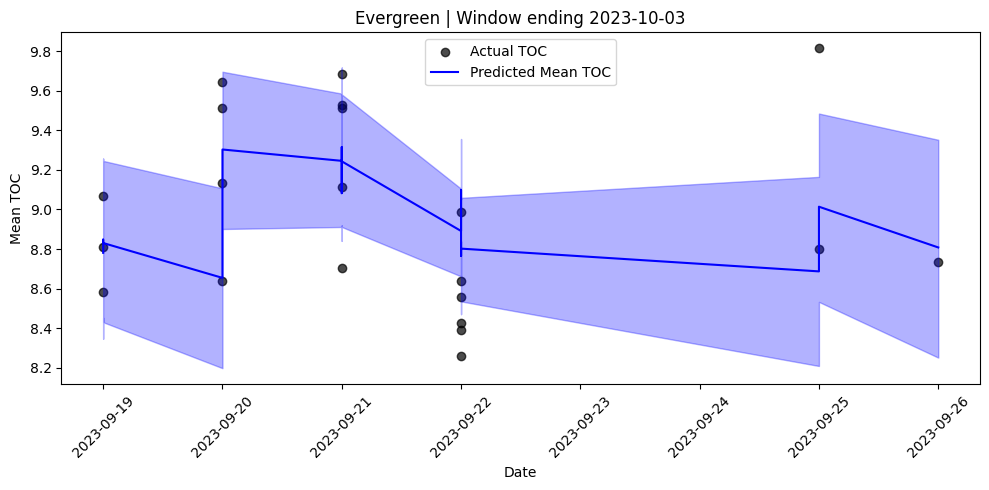

Output()

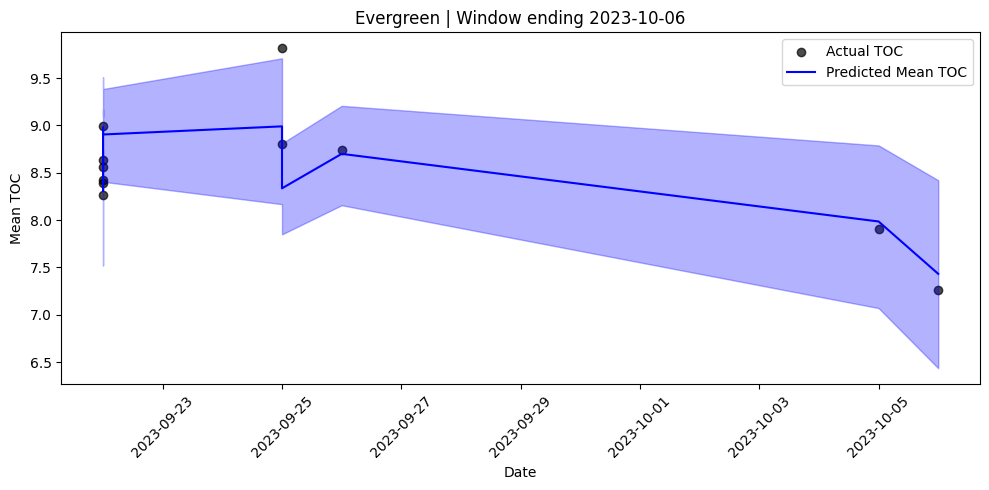

Output()

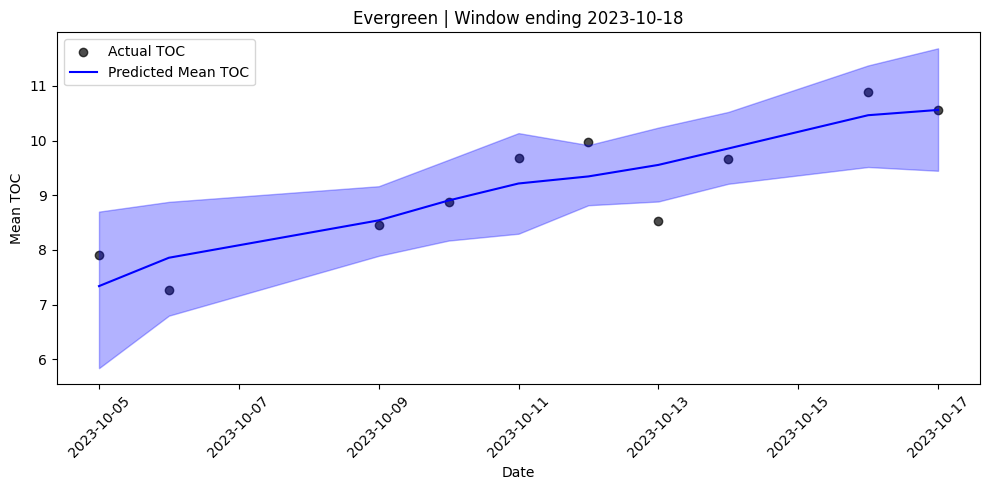

Output()

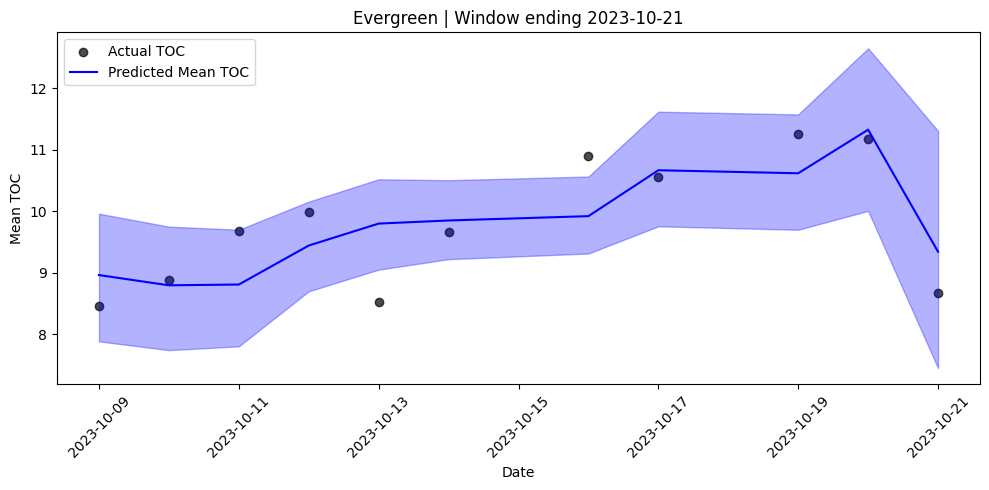

Output()

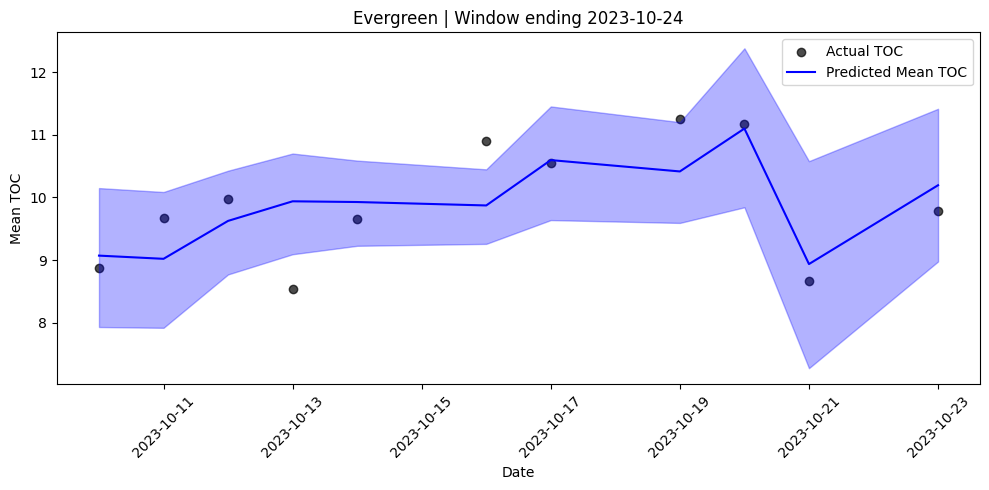

Output()

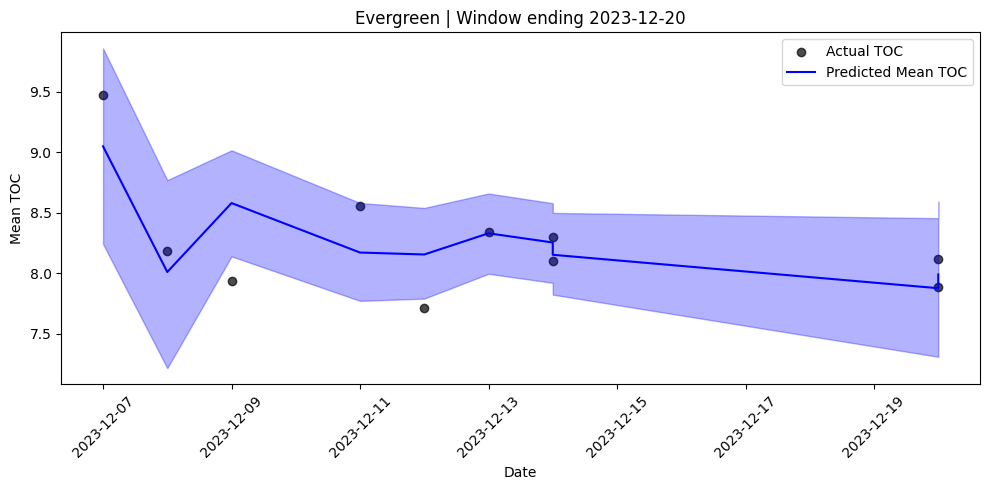

Output()

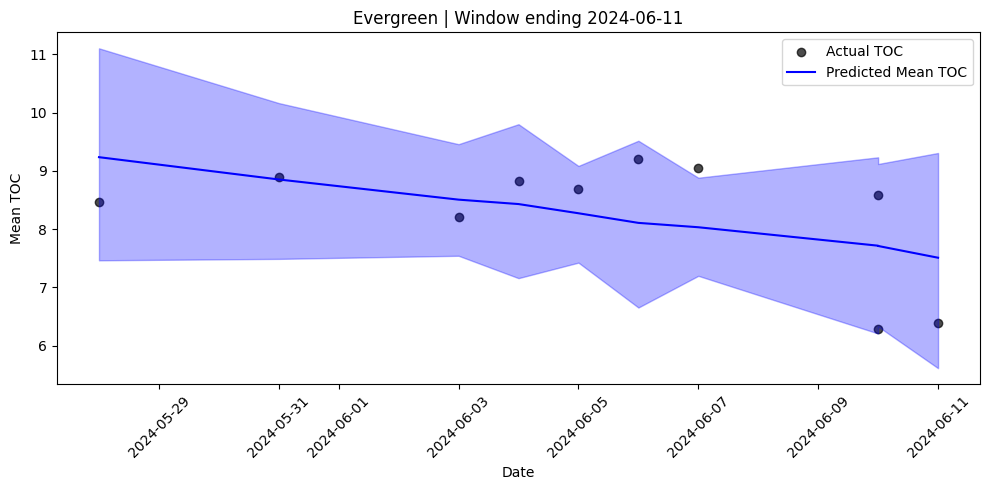

Output()

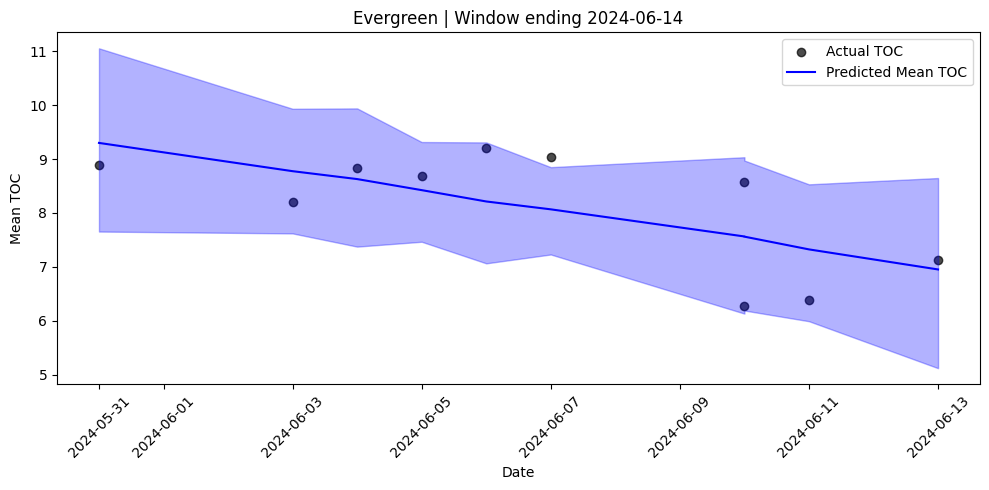

Output()

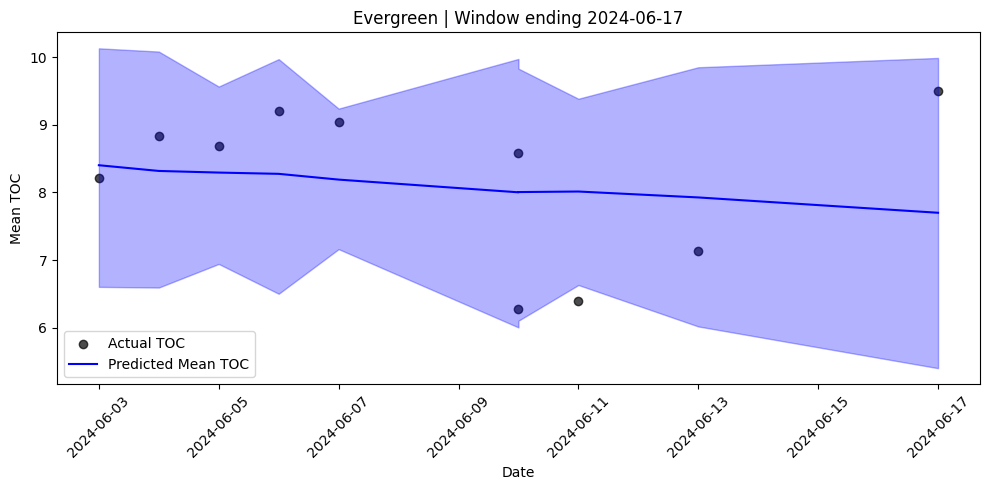

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pymc as pm
from sklearn.preprocessing import StandardScaler
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

df = pd.read_csv("loads_copy.csv")
df['Date'] = pd.to_datetime(df['Date'])
df = df.dropna(subset=['Mean_TOC', 'Mean_Moisture', 'Supplier'])

# supplier loop
for supplier_name in df['Supplier'].dropna().unique():
    df_supp = df[df['Supplier'] == supplier_name].sort_values('Date').copy()

    if len(df_supp) < 20:
        print(f"Skipping {supplier_name} (not enough total data)")
        continue

    print(f"\nRunning rolling MCMC for supplier: {supplier_name}")

    min_date = df_supp['Date'].min() + pd.Timedelta(days=15)
    max_date = df_supp['Date'].max()

    # 15 day rolling window, sliding every 3 days
    for current_date in pd.date_range(start=min_date, end=max_date, freq='3D'):
        window_start = current_date - pd.Timedelta(days=15)
        train_df = df_supp[(df_supp['Date'] > window_start) & (df_supp['Date'] <= current_date)]

        if len(train_df) < 10:
            continue

        # Time index relative to this window
        train_df = train_df.copy()
        train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days

        X = train_df[['TimeIndex', 'Mean_Moisture']]
        y = train_df['Mean_TOC']
        dates = train_df['Date']

        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        if not np.all(np.isfinite(X_scaled)) or not np.all(np.isfinite(y)):
            continue

        try:
            with pm.Model() as model:
                beta = pm.Normal('beta', mu=0, sigma=5, shape=X_scaled.shape[1])
                intercept = pm.Normal('intercept', mu=0, sigma=5)
                mu = intercept + pm.math.dot(X_scaled, beta)
                sigma = pm.HalfNormal('sigma', sigma=5)
                y_obs = pm.Normal('y_obs', mu=mu, sigma=sigma, observed=y)

                trace = pm.sample(draws=1000, tune=1000, target_accept=0.97, return_inferencedata=True)
        except Exception as e:
            print(f"Model failed at {current_date.date()} for {supplier_name}: {e}")
            continue

        # Posterior predictive for training window
        beta_samples = trace.posterior['beta'].stack(draws=("chain", "draw")).values
        intercept_samples = trace.posterior['intercept'].stack(draws=("chain", "draw")).values
        predictions = np.dot(X_scaled, beta_samples) + intercept_samples

        pred_mean = predictions.mean(axis=1)
        pred_lower = np.percentile(predictions, 2.5, axis=1)
        pred_upper = np.percentile(predictions, 97.5, axis=1)

        # window plot results
        plt.figure(figsize=(10, 5))
        plt.scatter(dates, y, label='Actual TOC', color='black', alpha=0.7)
        plt.plot(dates, pred_mean, label='Predicted Mean TOC', color='blue')
        plt.fill_between(dates, pred_lower, pred_upper, color='blue', alpha=0.3)
        plt.title(f"{supplier_name} | Window ending {current_date.date()}")
        plt.xlabel('Date')
        plt.ylabel('Mean TOC')
        plt.legend()
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()



Running rolling MCMC for supplier: Evergreen


/tmp/ipython-input-4-1923824229.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

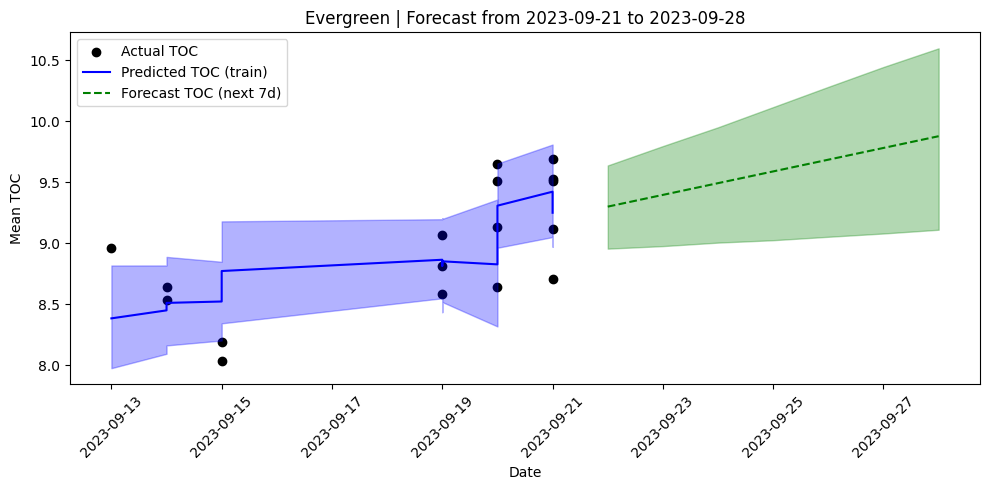

/tmp/ipython-input-4-1923824229.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

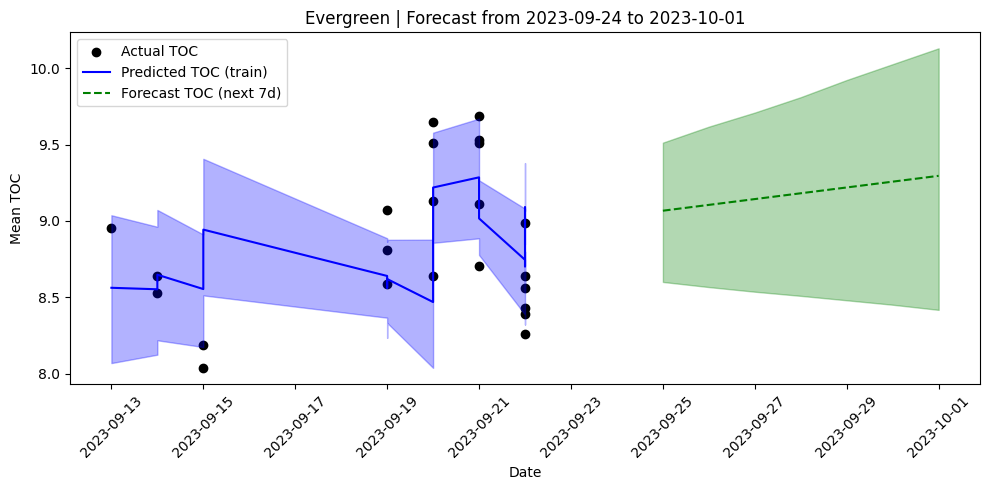

/tmp/ipython-input-4-1923824229.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

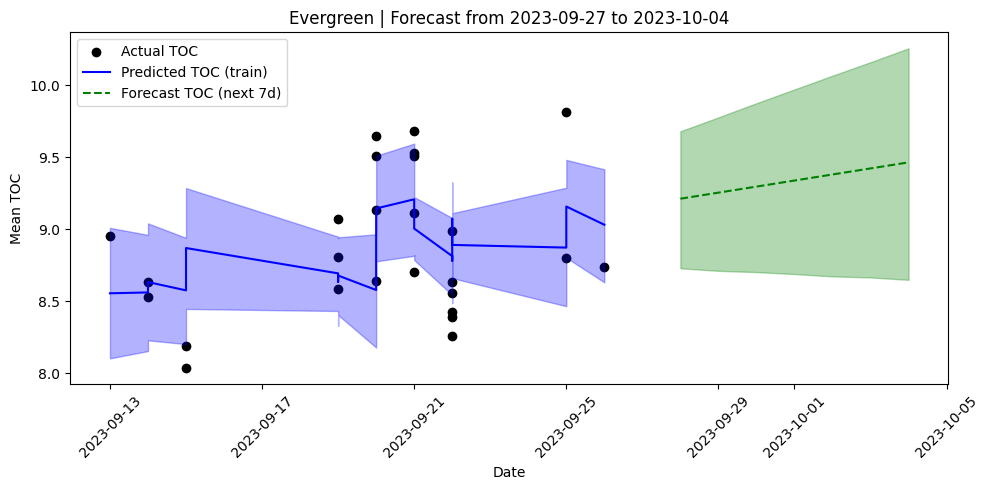

/tmp/ipython-input-4-1923824229.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

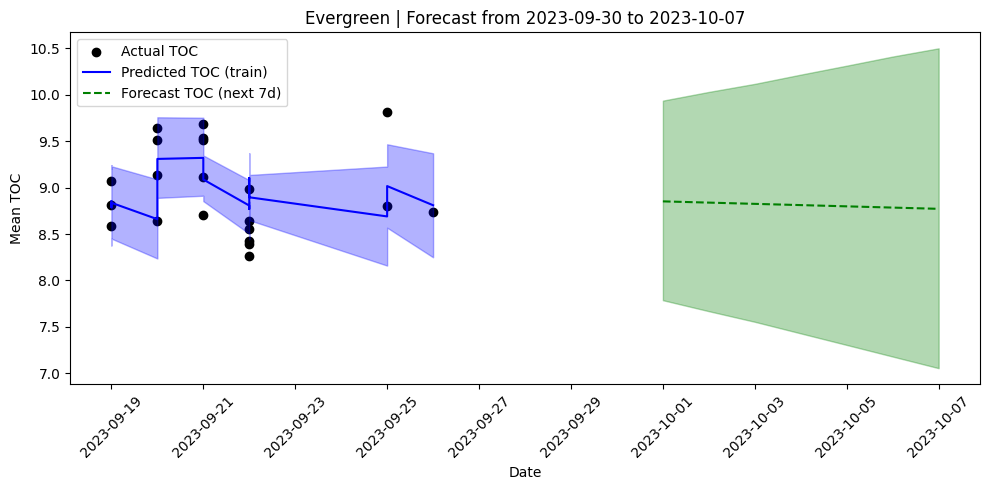

/tmp/ipython-input-4-1923824229.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

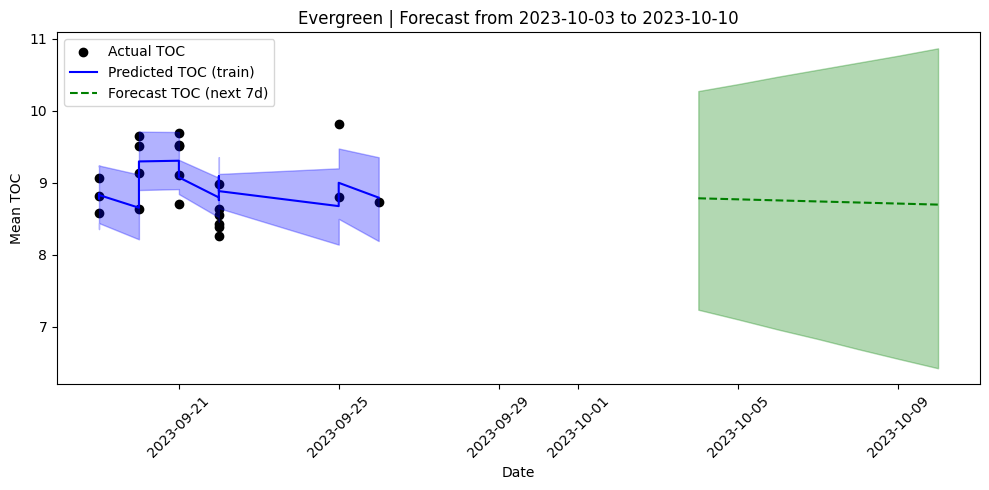

/tmp/ipython-input-4-1923824229.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

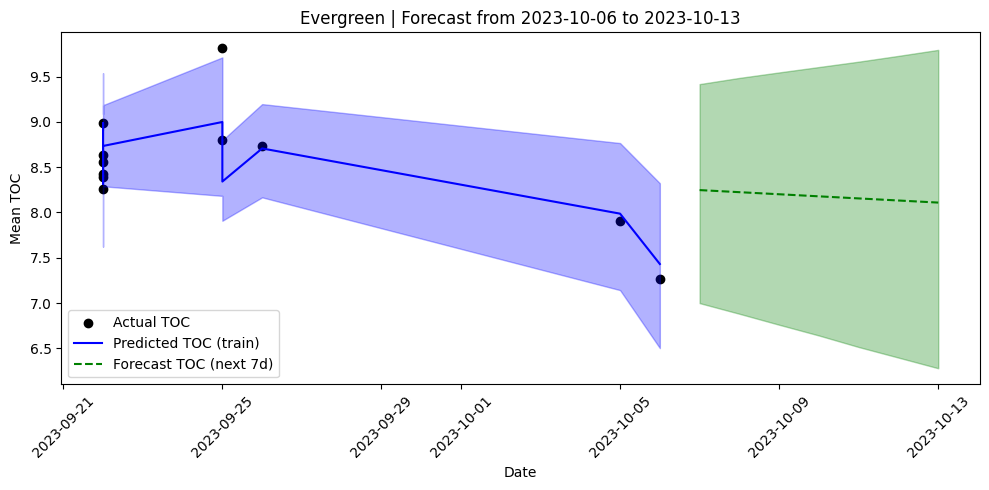

/tmp/ipython-input-4-1923824229.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

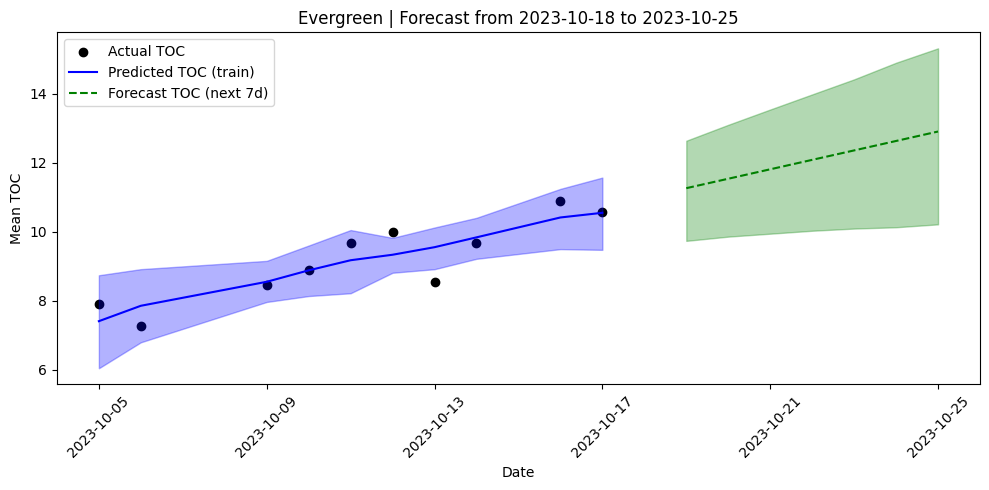

/tmp/ipython-input-4-1923824229.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

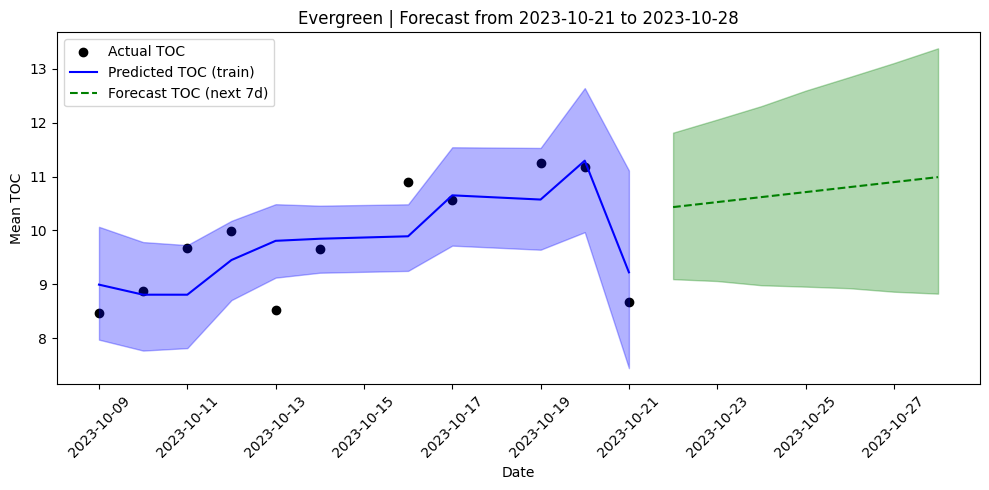

/tmp/ipython-input-4-1923824229.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

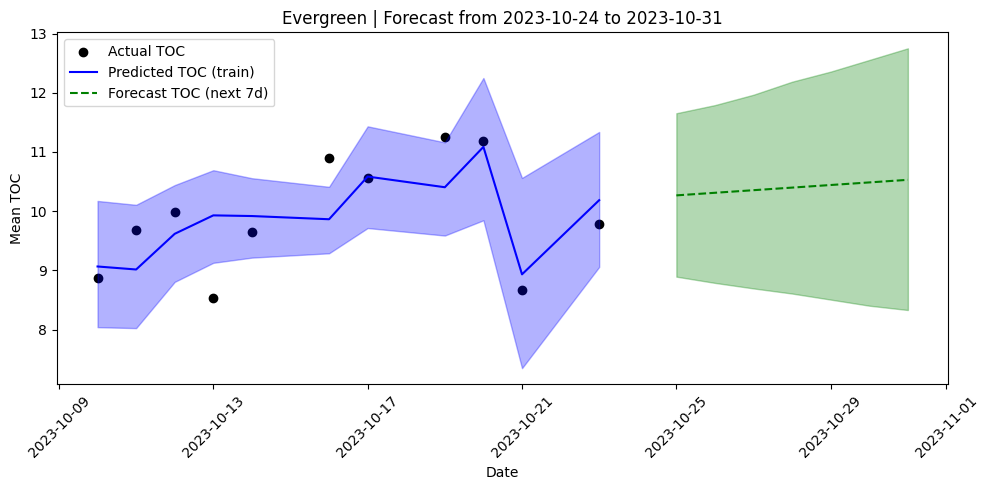

/tmp/ipython-input-4-1923824229.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

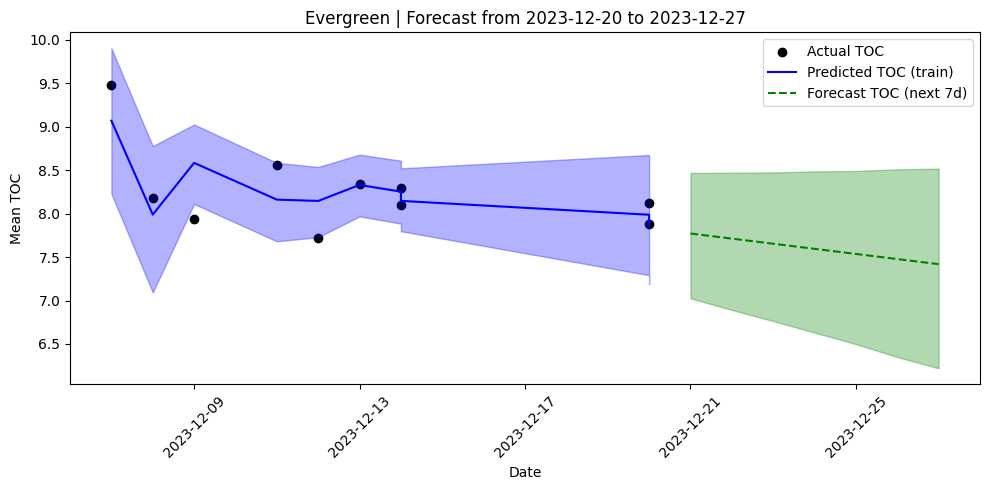

/tmp/ipython-input-4-1923824229.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

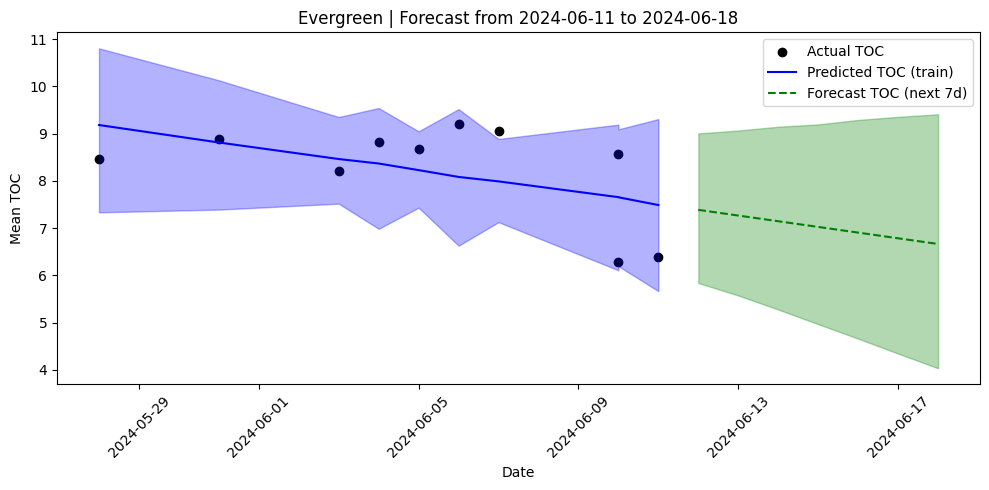

/tmp/ipython-input-4-1923824229.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

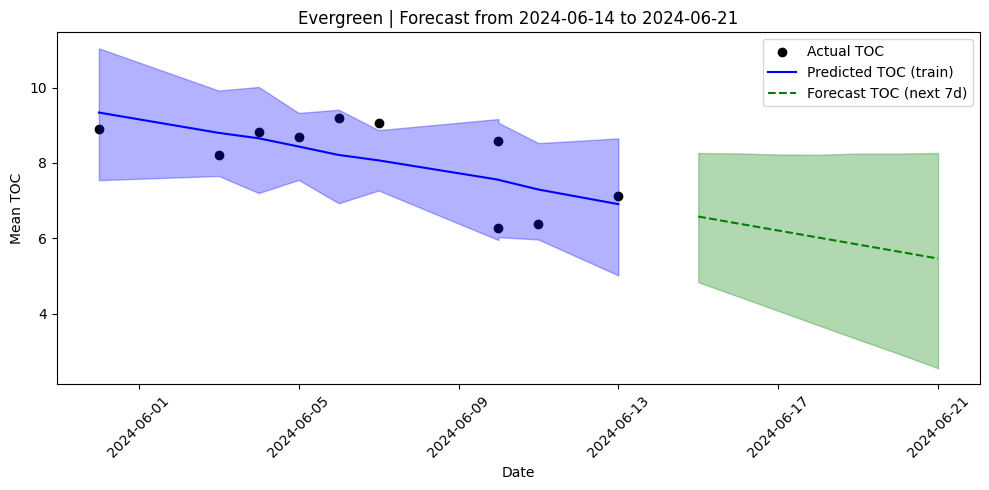

/tmp/ipython-input-4-1923824229.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

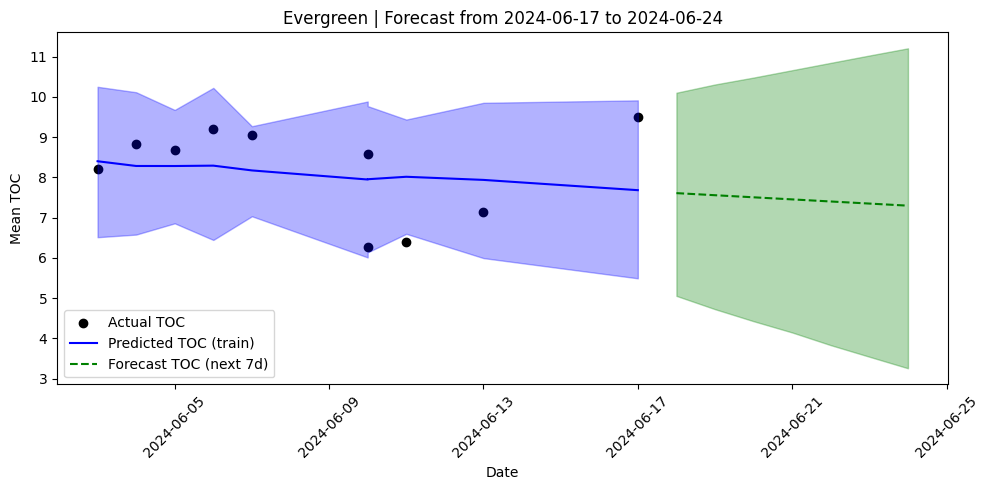


Running rolling MCMC for supplier: 4-S Feeders


/tmp/ipython-input-4-1923824229.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

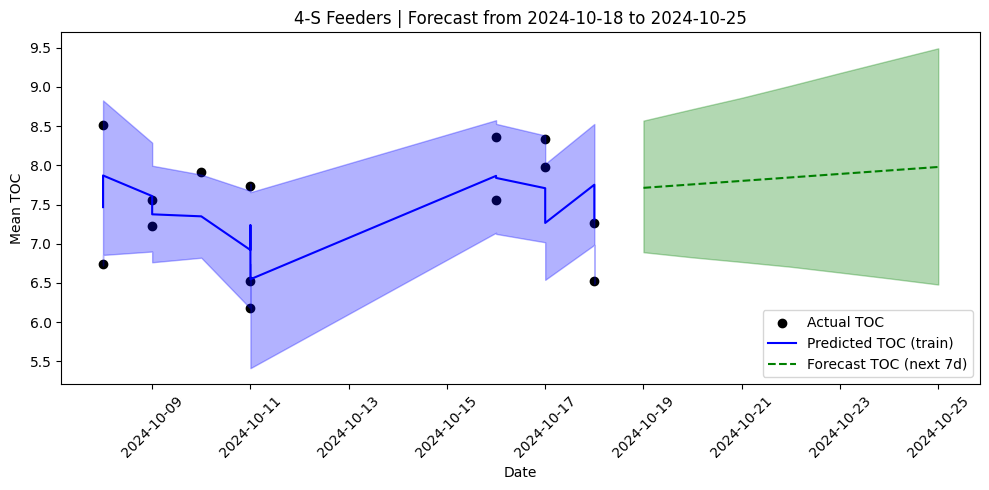

Output()

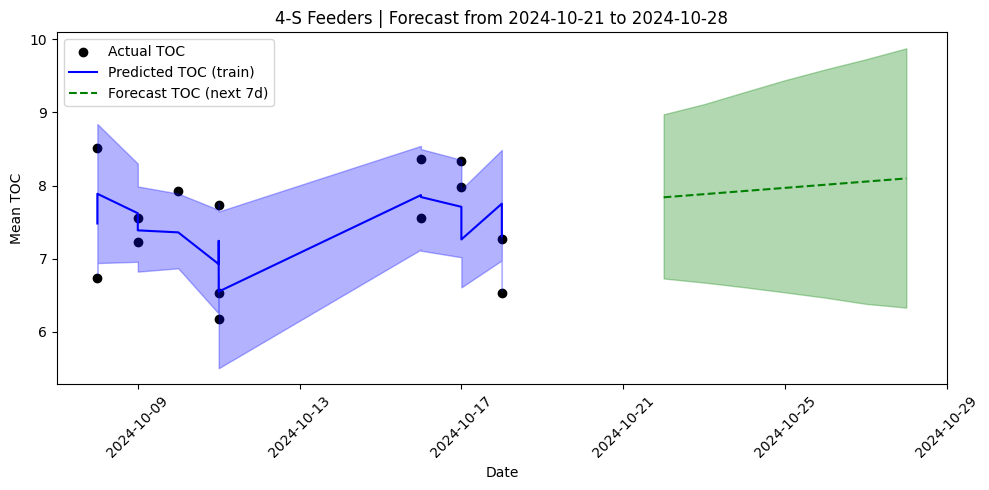

Output()

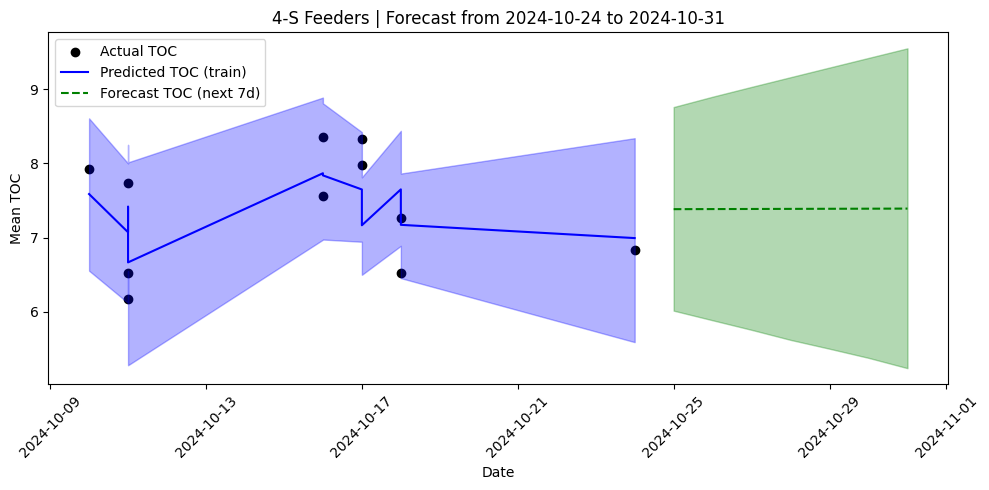


Running rolling MCMC for supplier: City of Derby


Output()

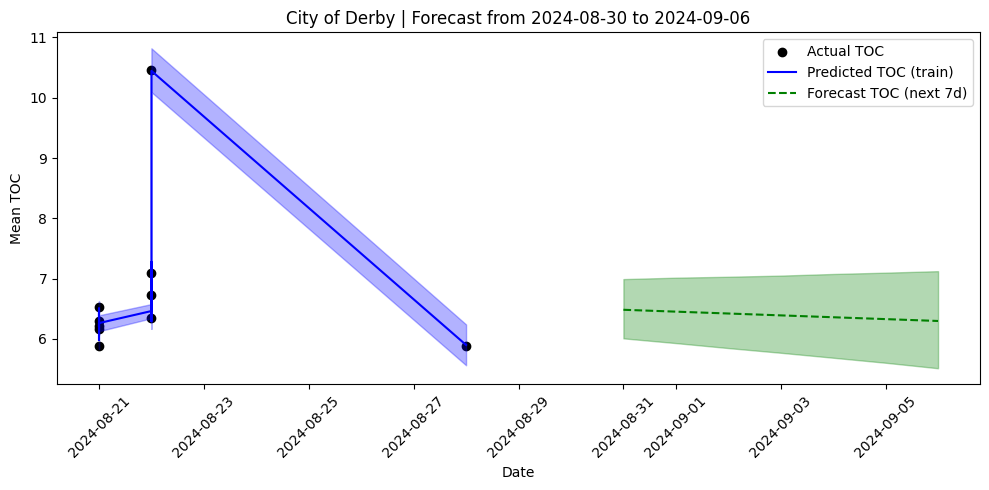

Output()

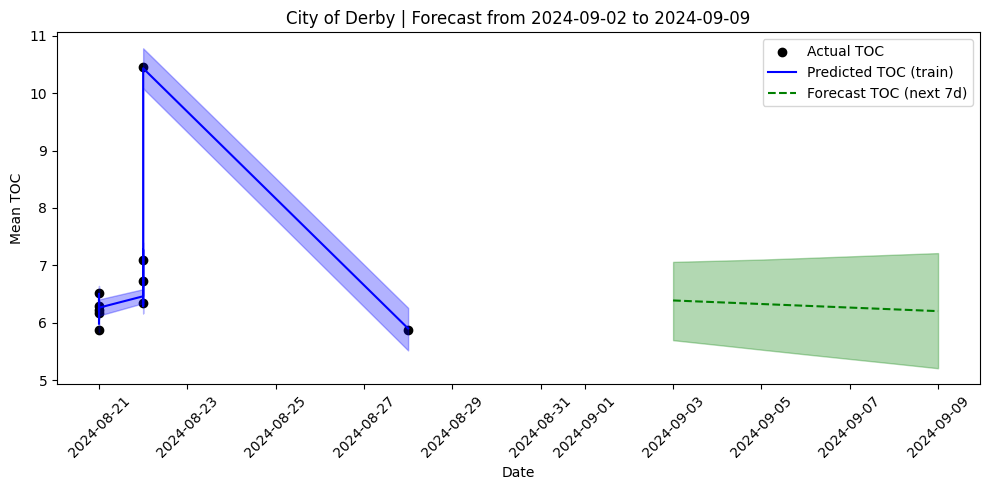

Output()

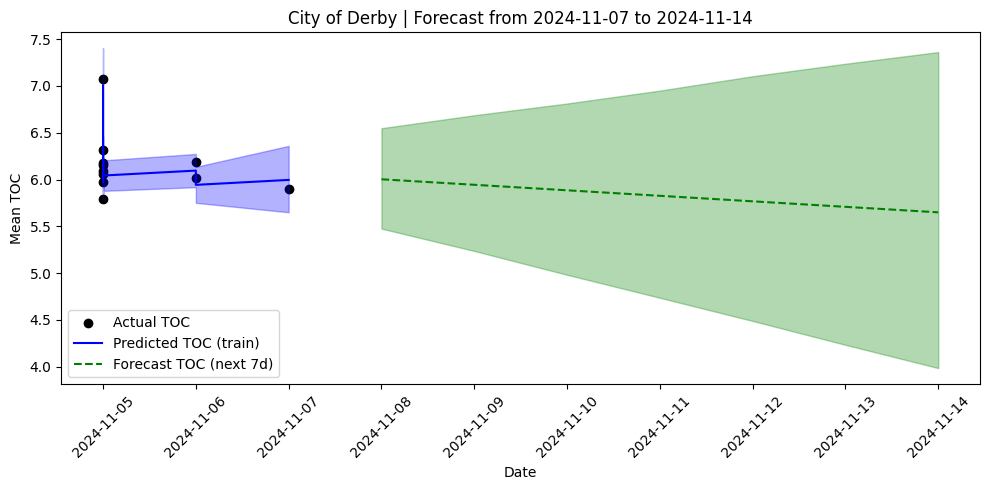

Output()

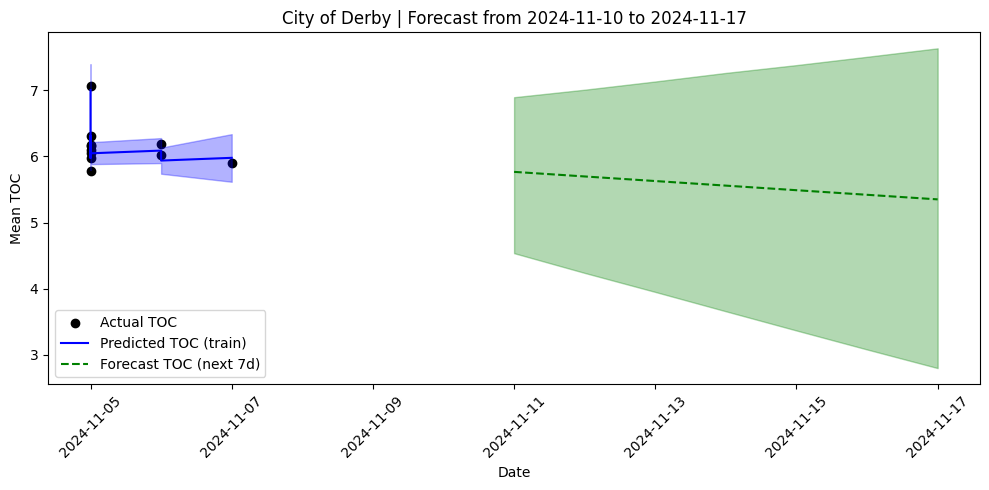

Output()

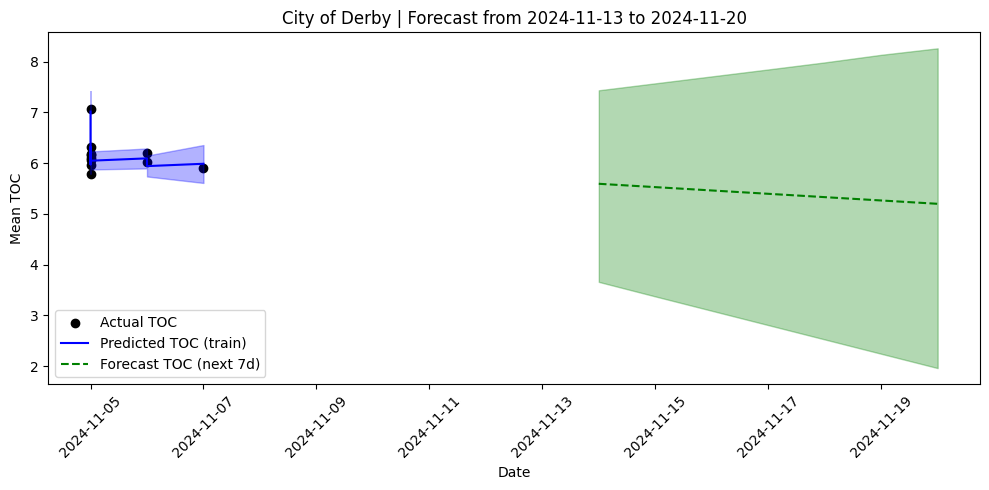

Output()

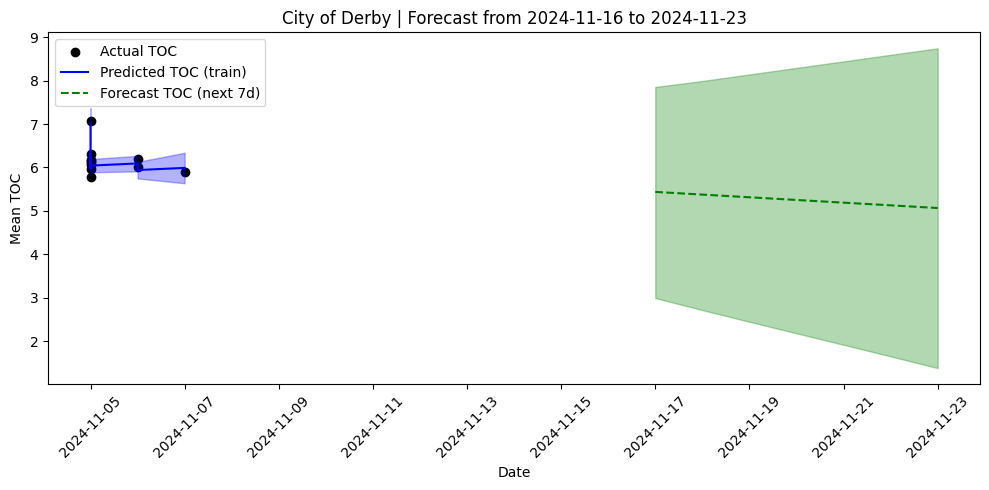

Output()

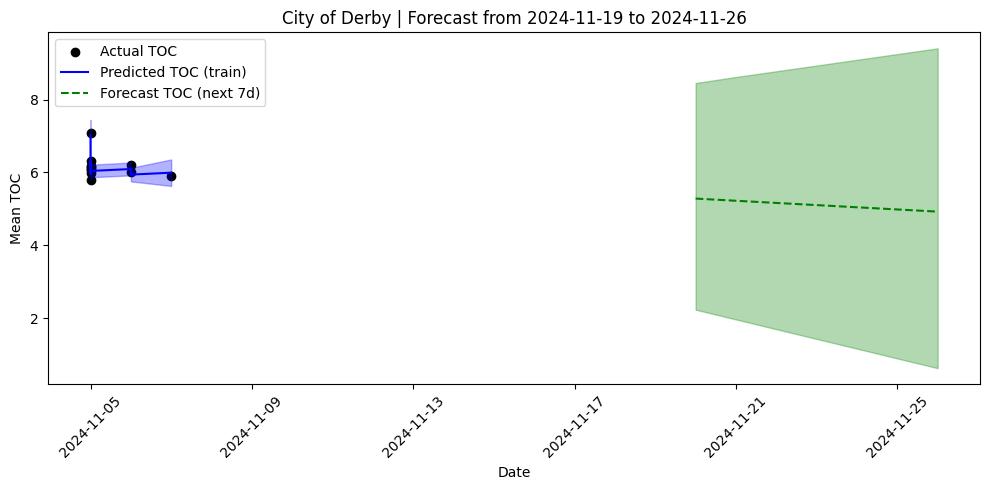


Running rolling MCMC for supplier: Pratt Feeders


Output()

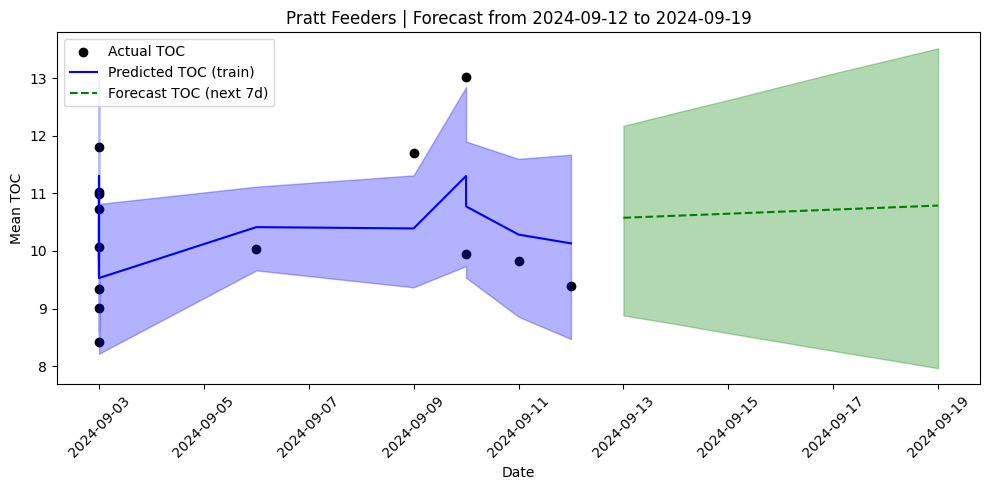

Output()

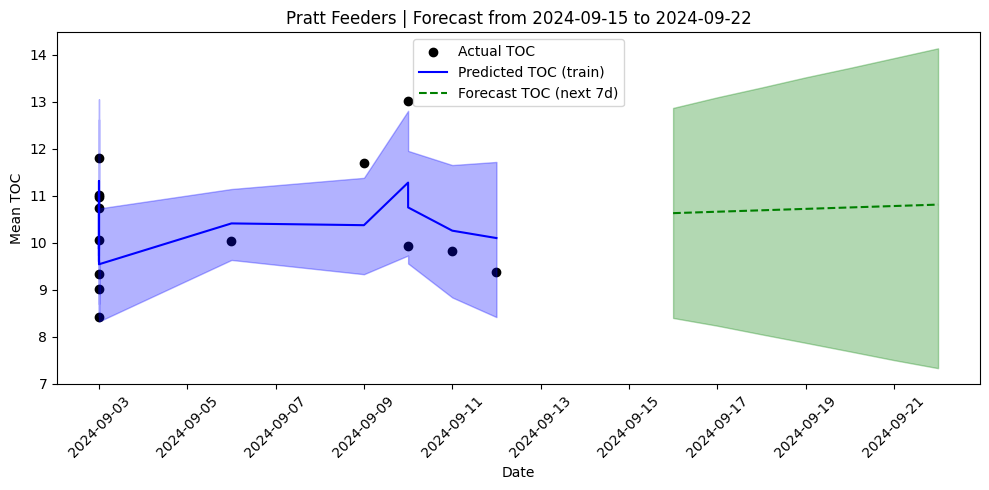

Output()

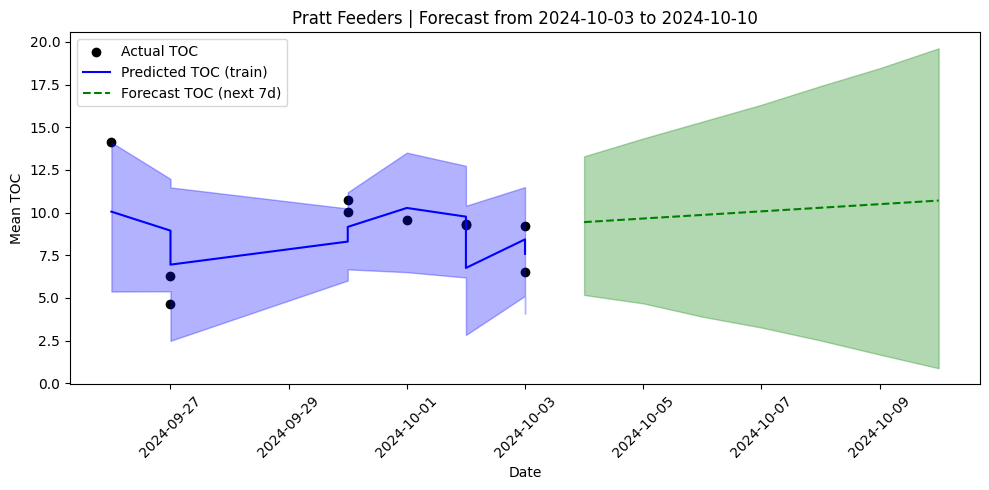

Output()

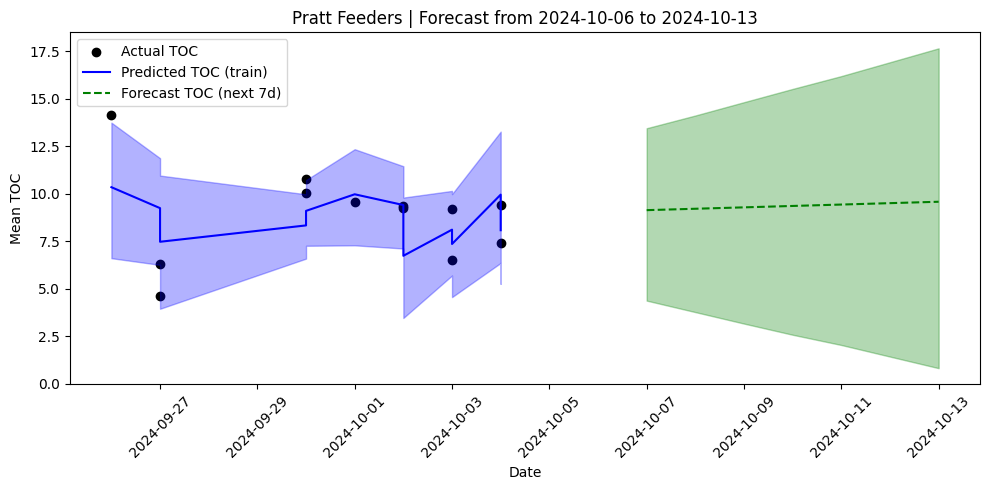

Output()

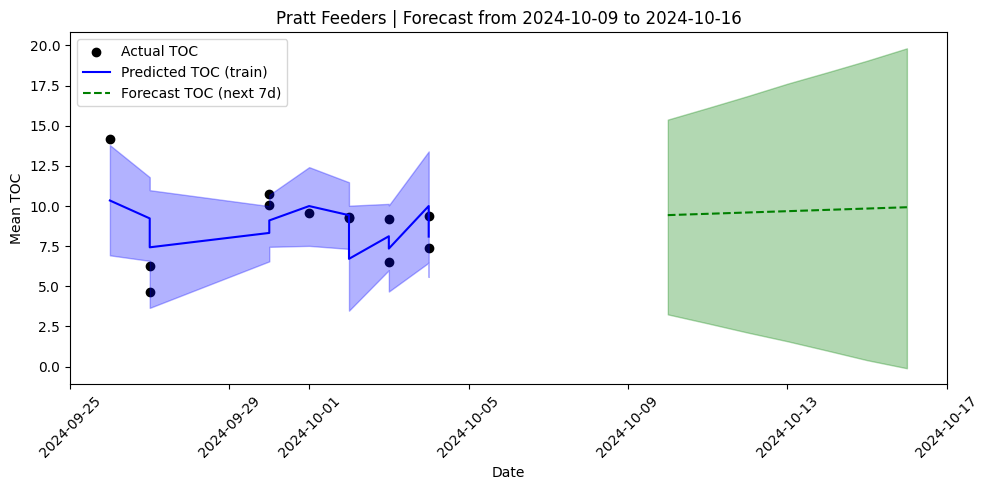

Output()

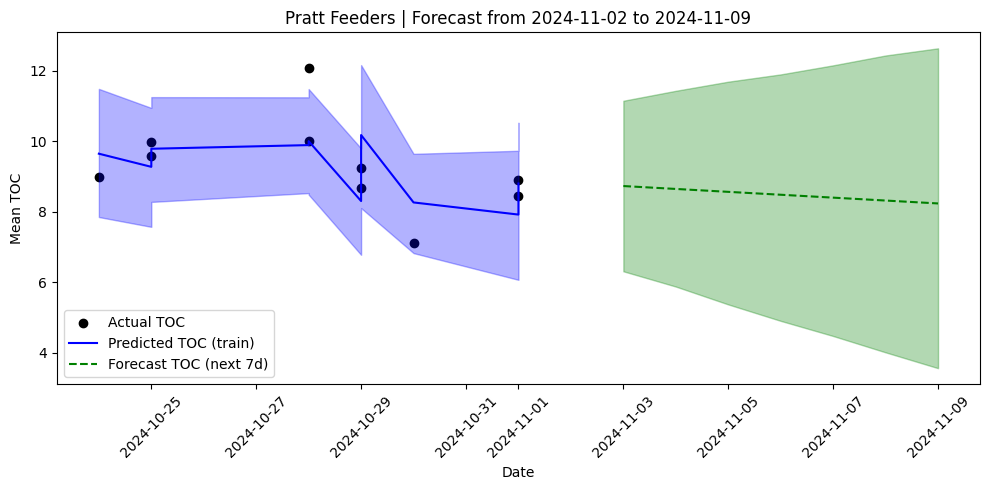

Output()

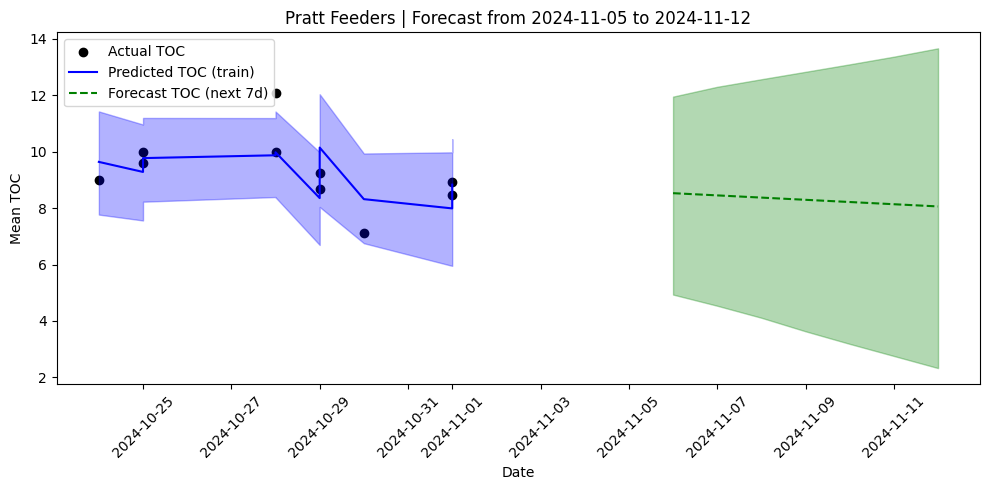

Output()

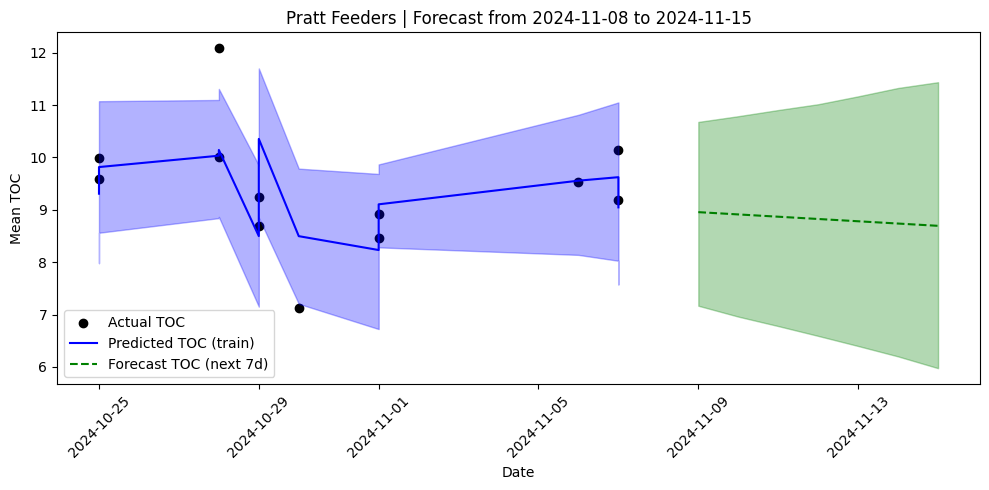

Output()

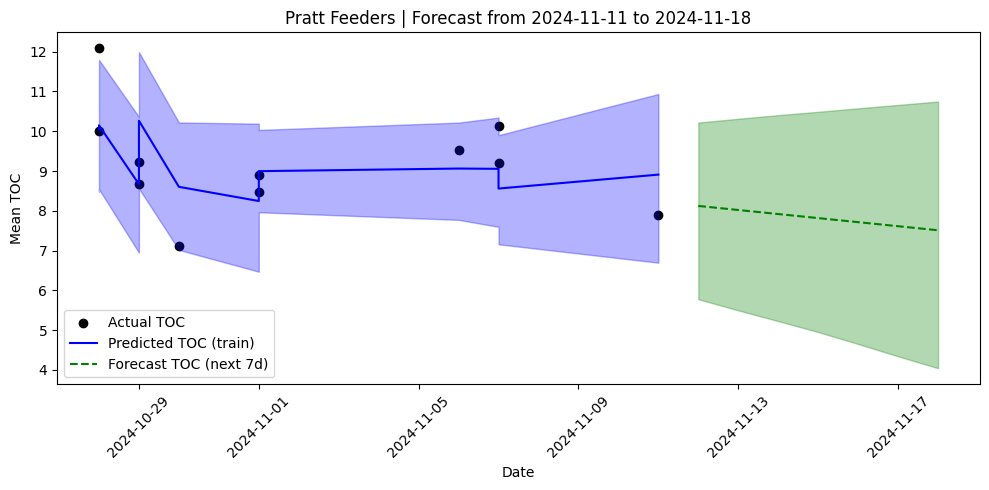

Output()

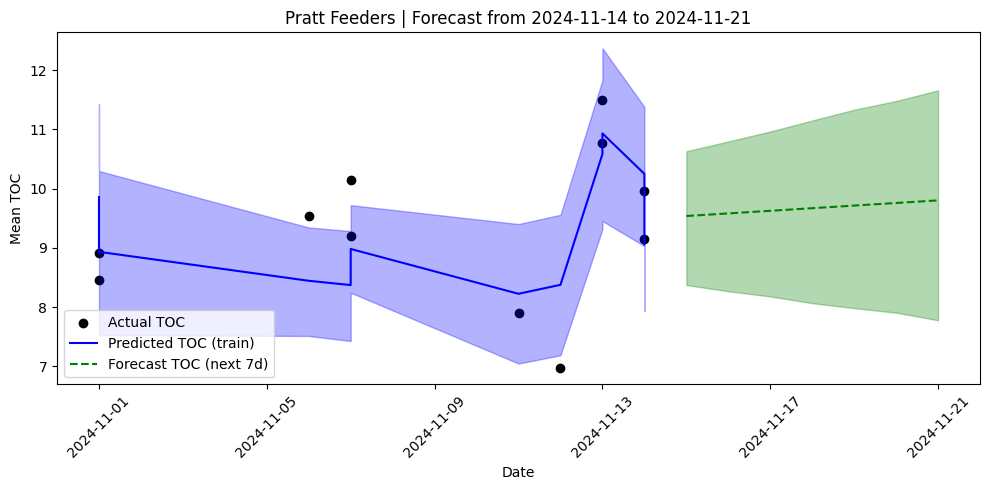

Output()

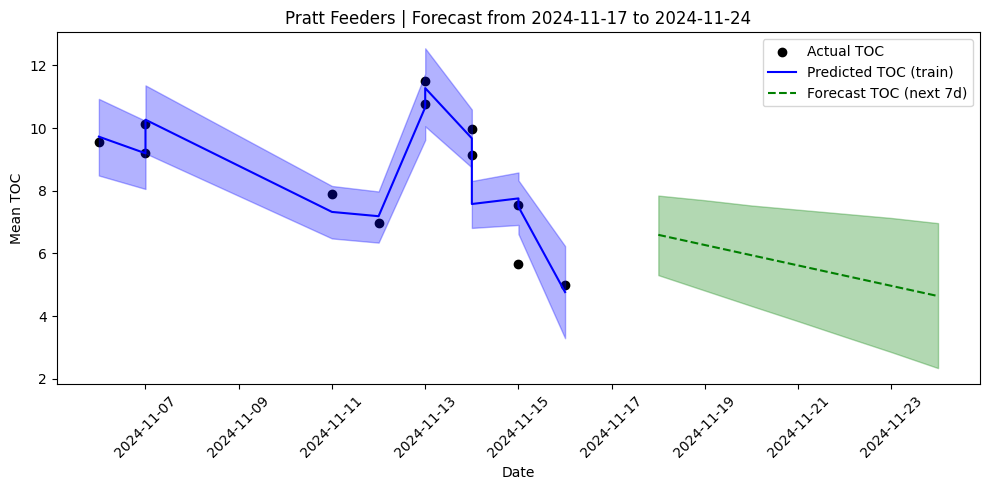

Output()

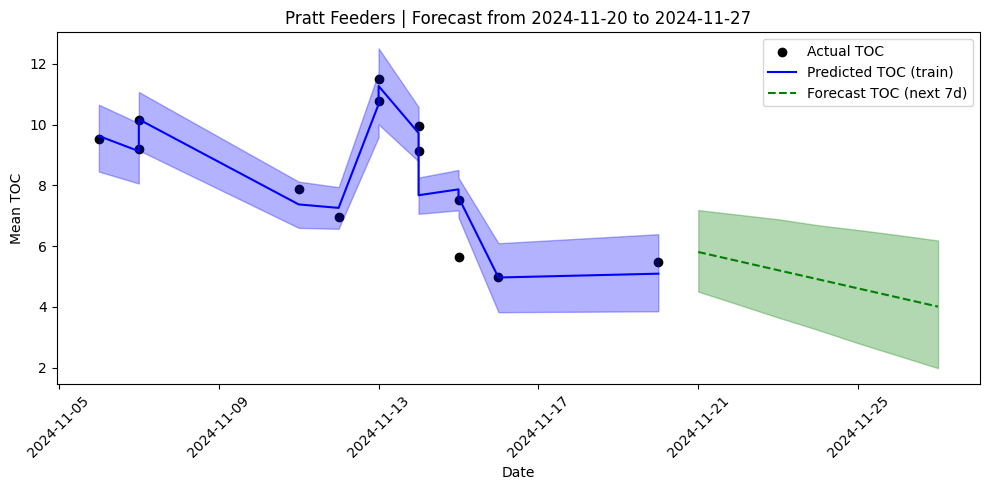

Output()

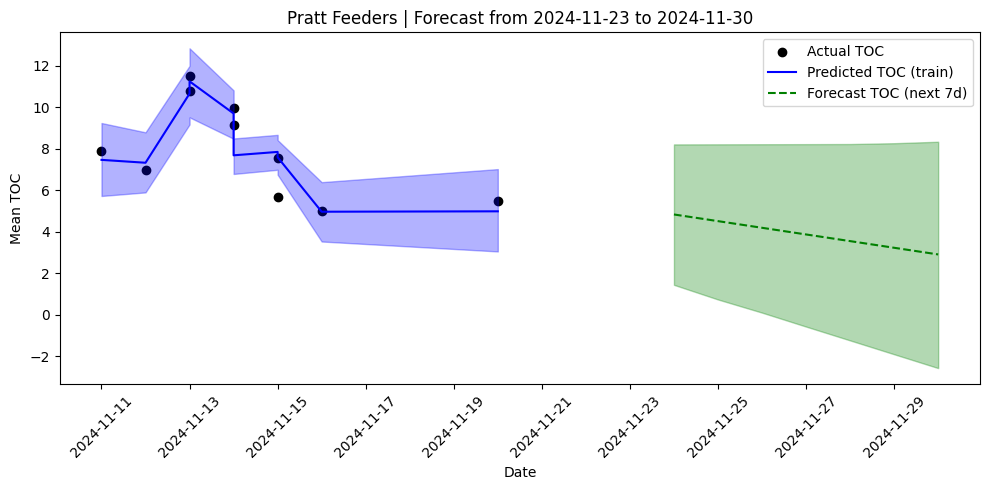

Output()

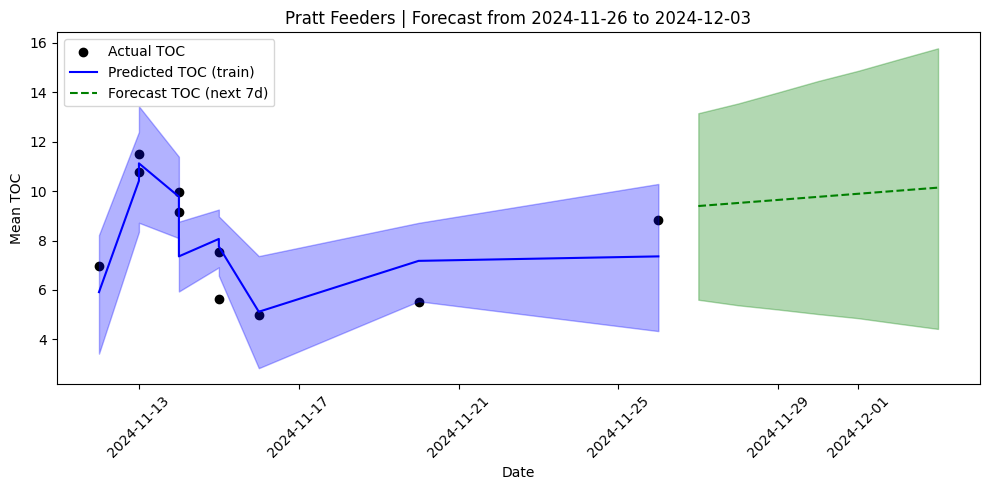

Output()

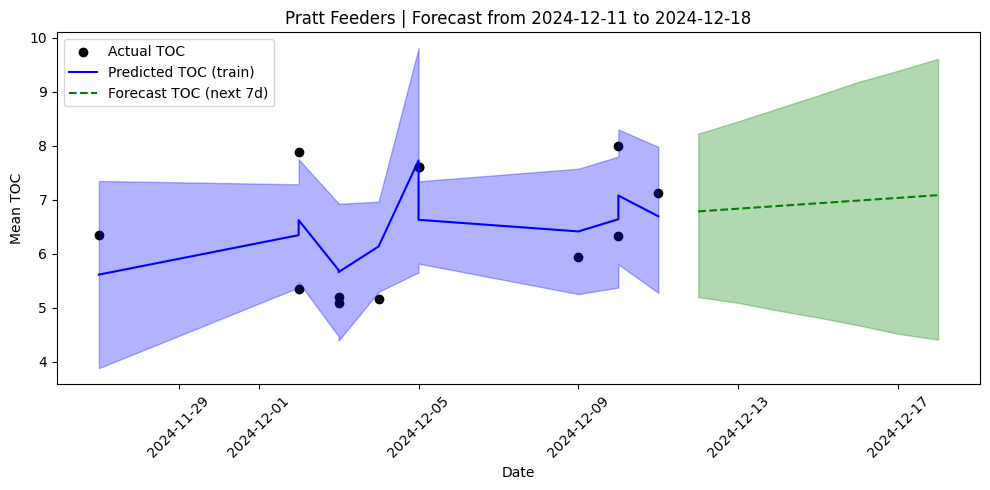

Output()

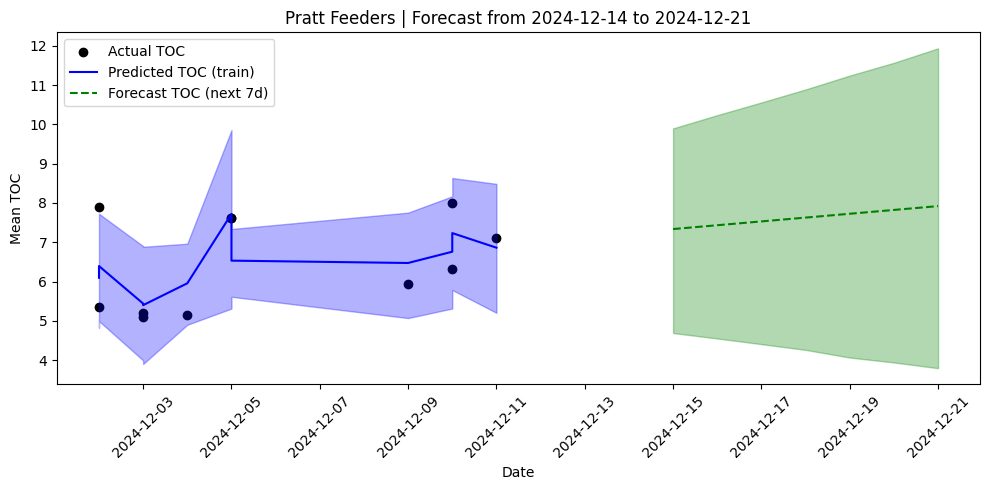

Output()

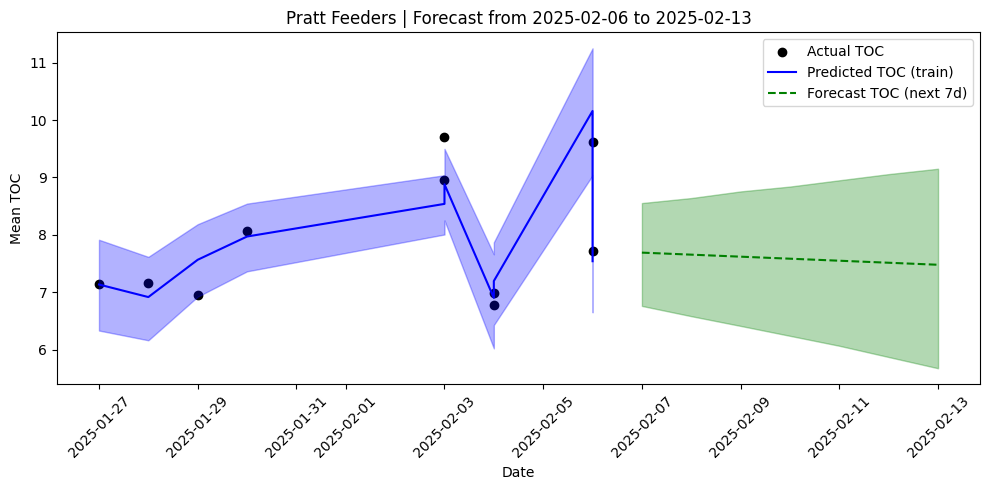

Output()

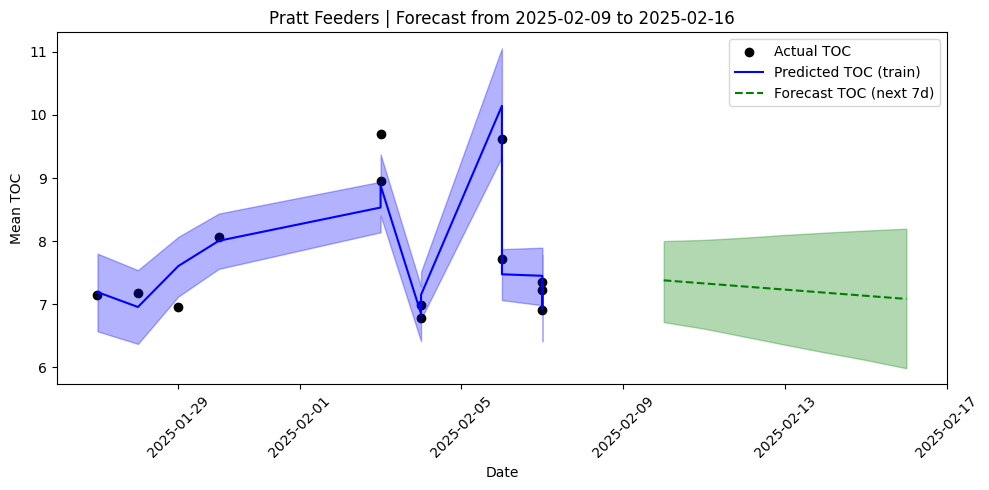

Output()

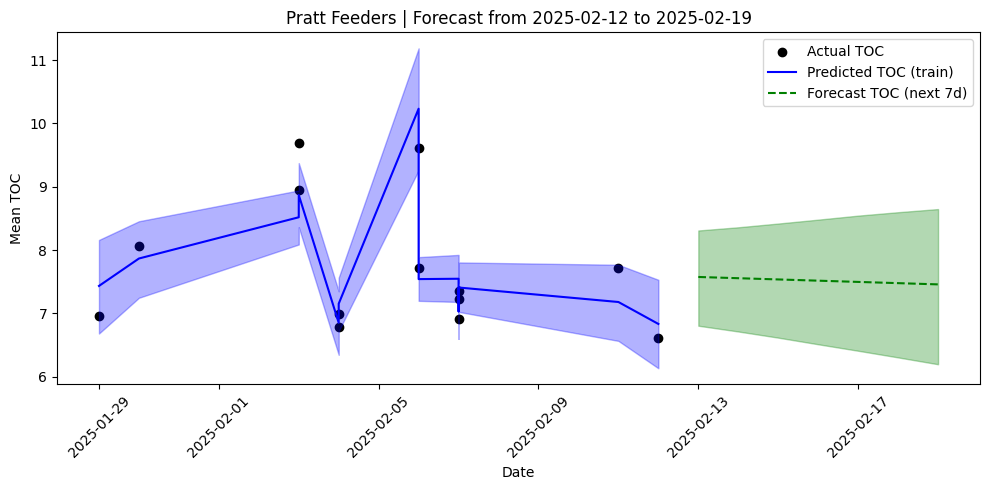

Output()

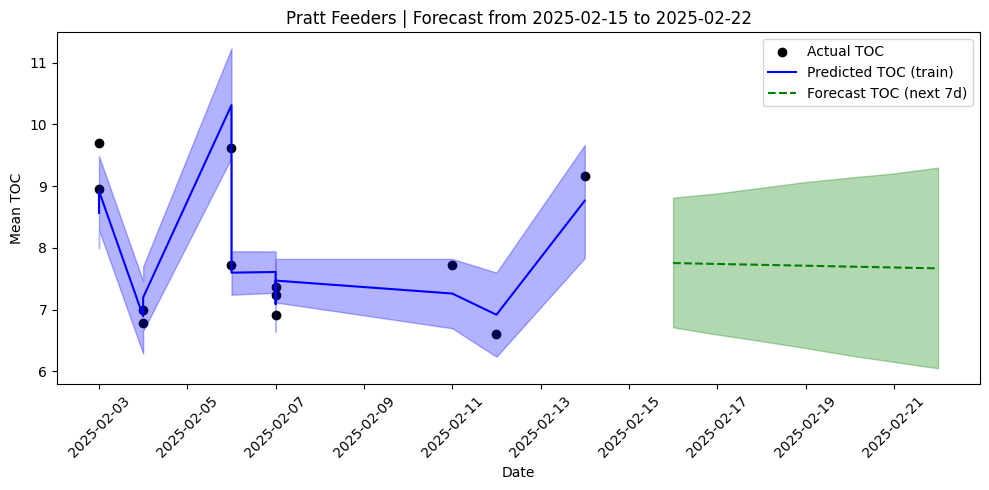

Output()

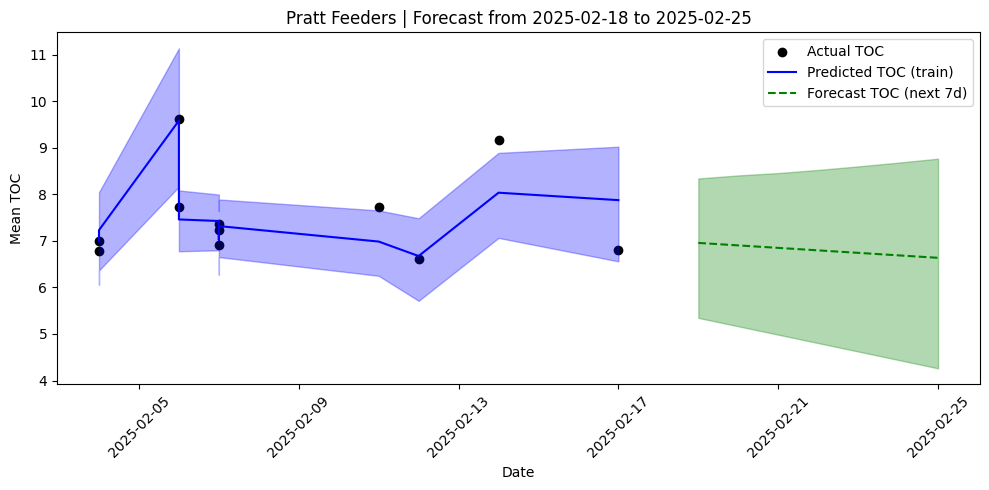

Output()

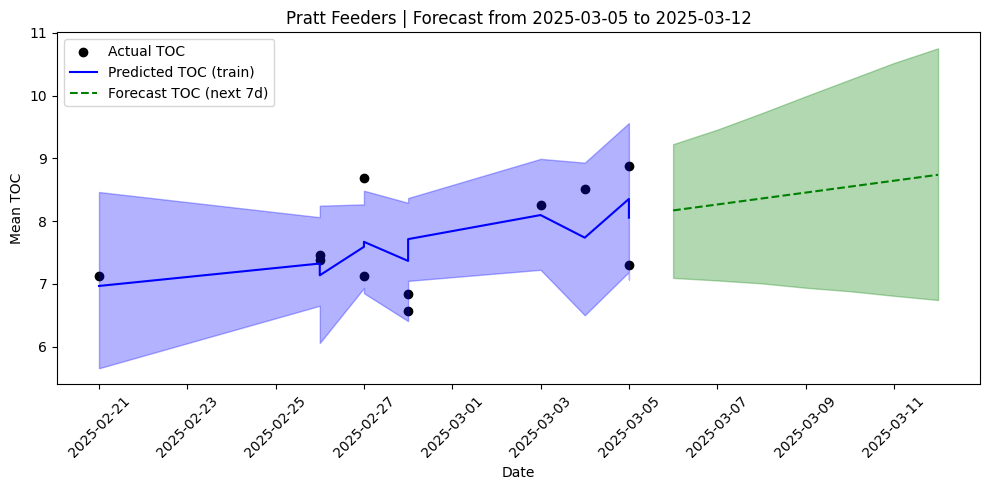

Output()

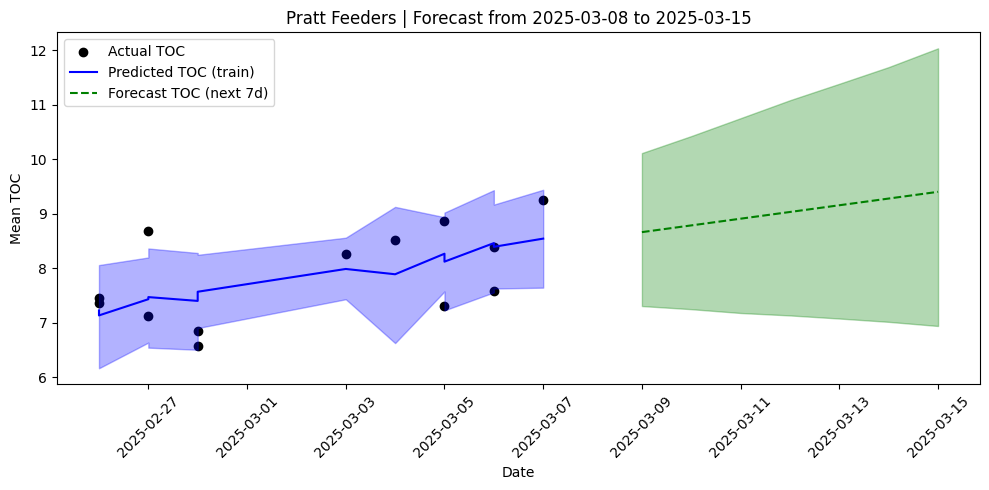

Output()

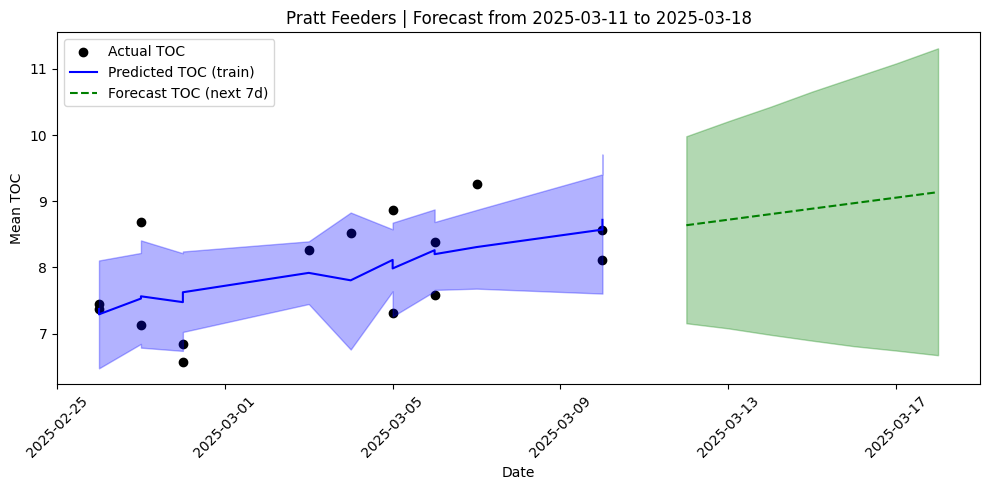

Output()

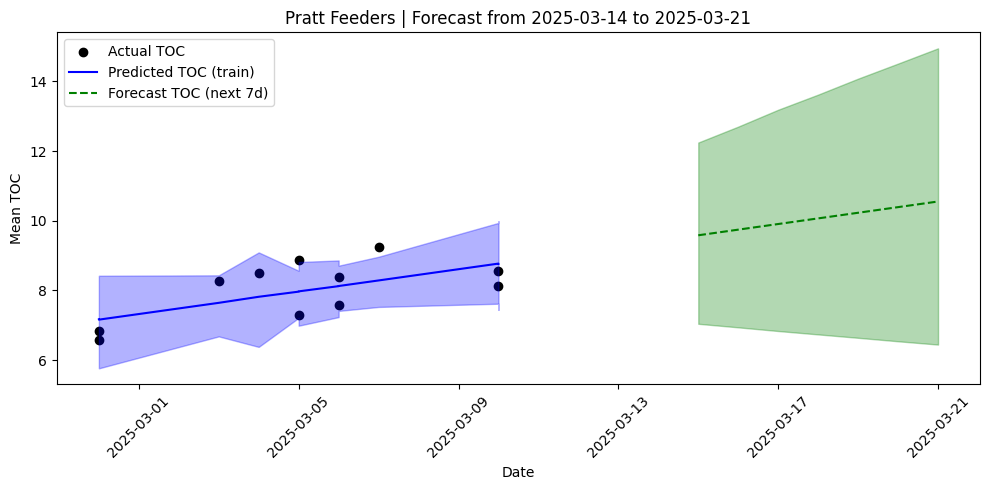


Running rolling MCMC for supplier: KM Feeders


Output()

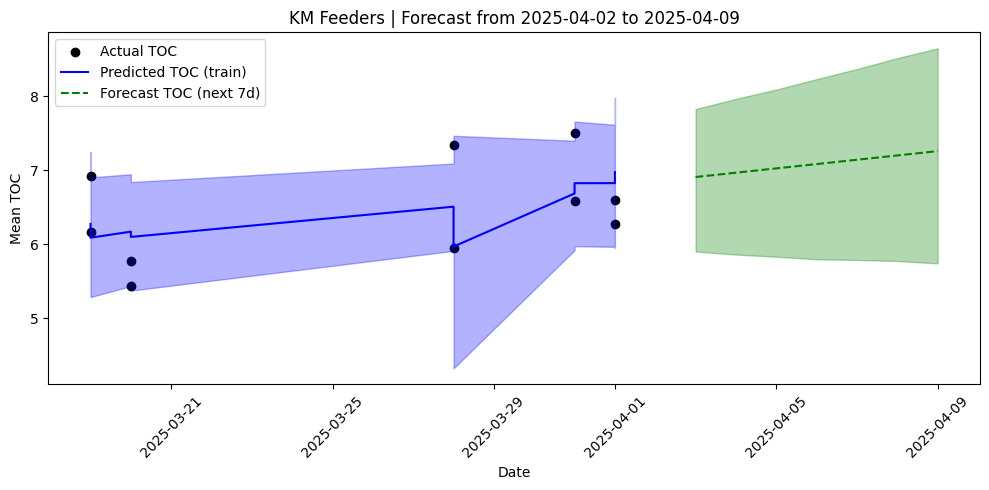

Output()

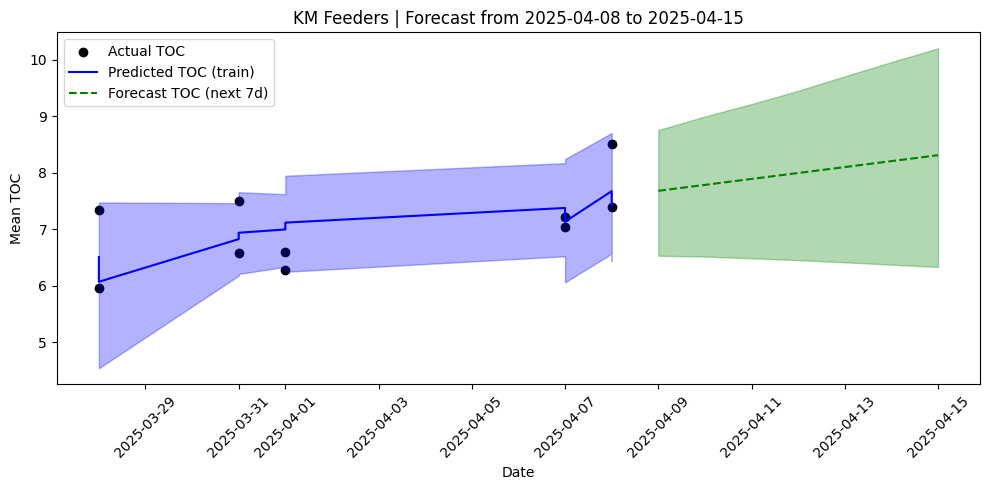

Output()

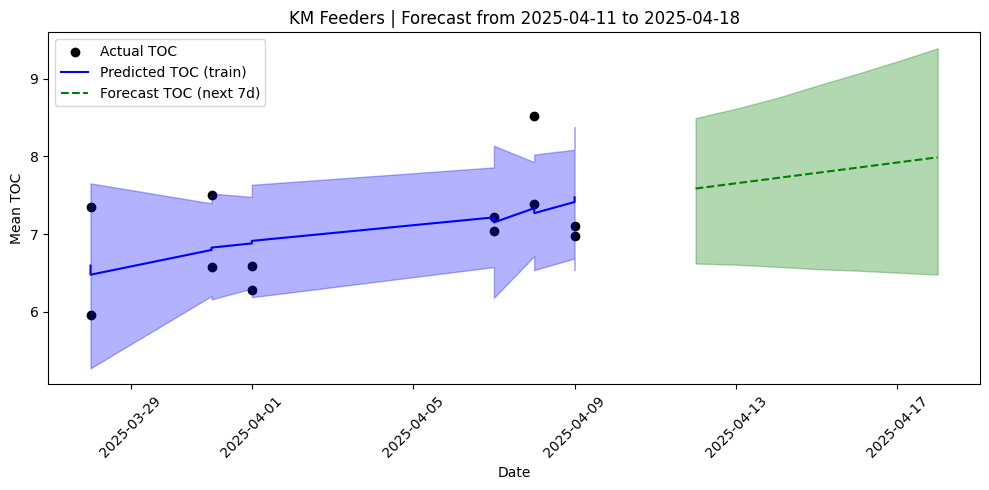

Output()

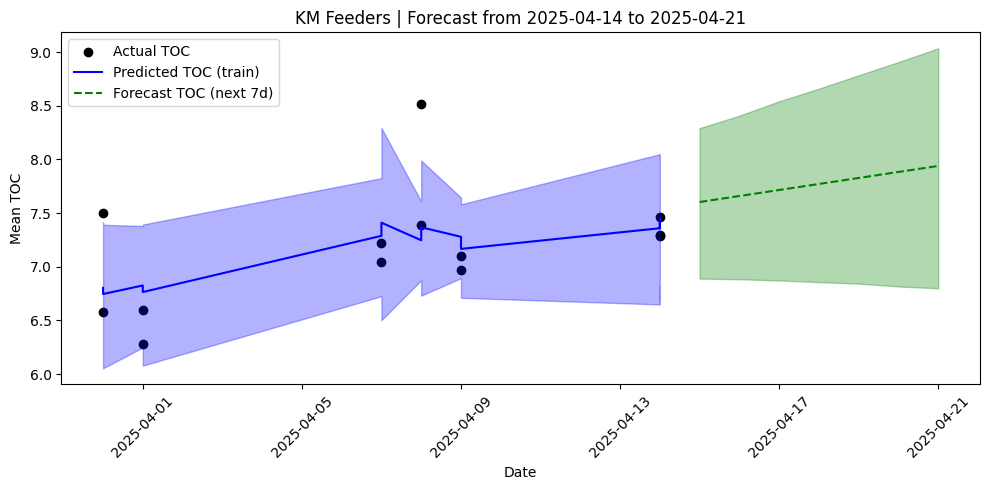


Running rolling MCMC for supplier: Sellers Feedlot


Output()

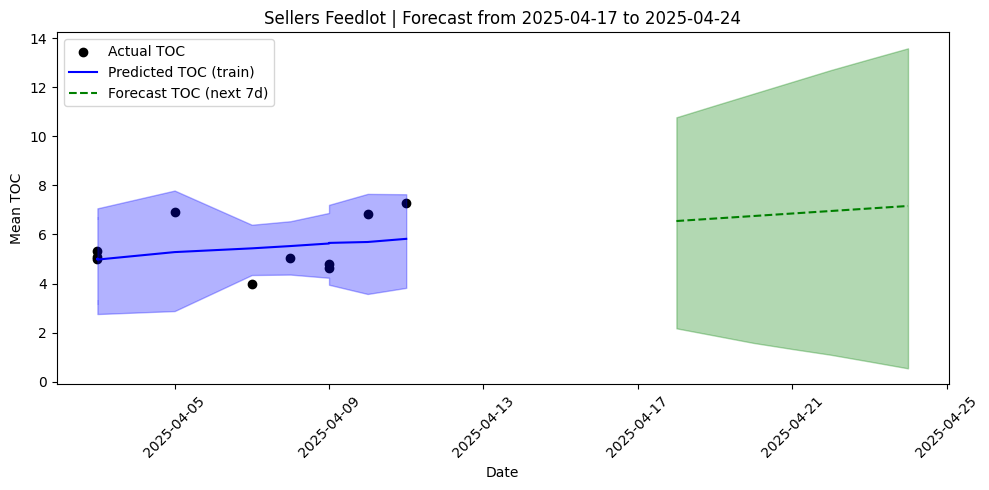


Running rolling MCMC for supplier: Golden Belt Feeders


Output()

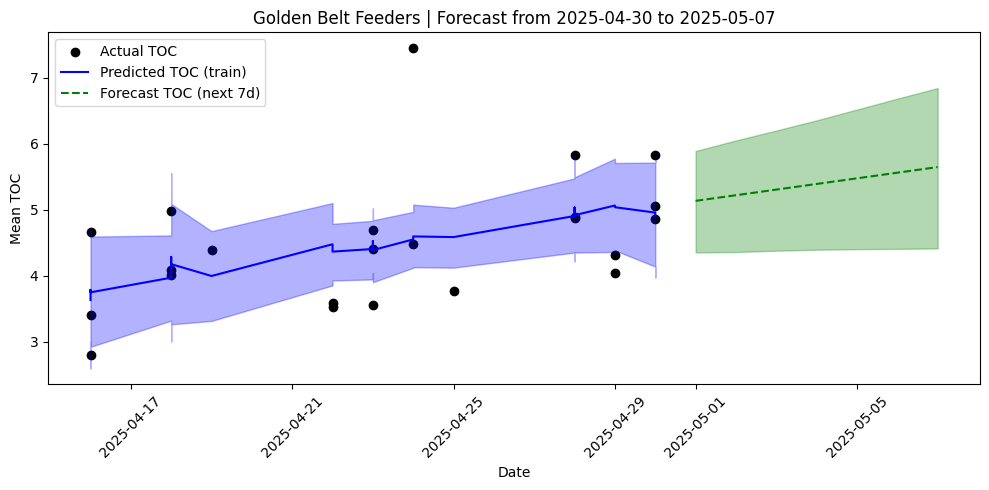

Output()

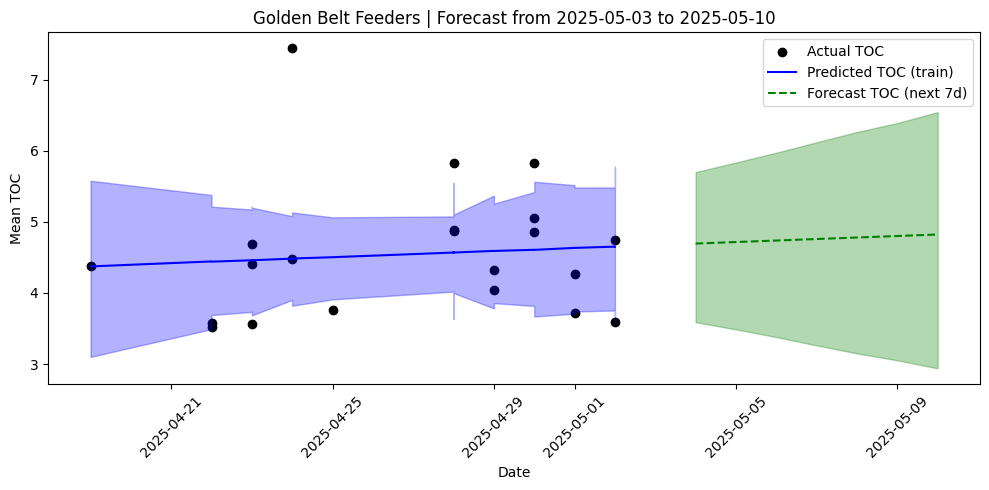

Output()

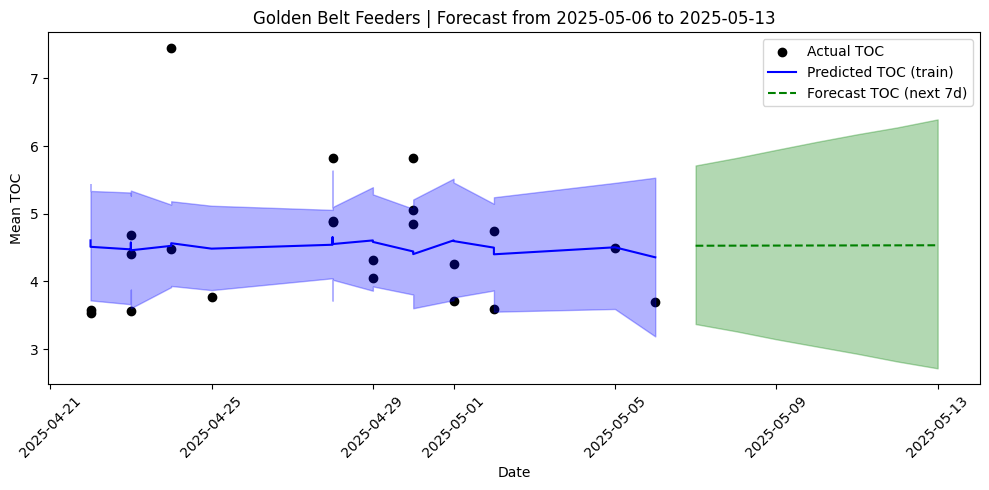


Running rolling MCMC for supplier: Ford County Feeders


In [ ]:
# rolling window mcmc with forecast
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pymc as pm
from sklearn.preprocessing import StandardScaler
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

df = pd.read_csv("loads_copy.csv")
df['Date'] = pd.to_datetime(df['Date'])
df = df.dropna(subset=['Mean_TOC', 'Mean_Moisture', 'Supplier'])
df = df.sort_values('Date')

# supplier loop
for supplier_name in df['Supplier'].dropna().unique():
    df_supp = df[df['Supplier'] == supplier_name].copy()

    if len(df_supp) < 20:
        print(f"Skipping {supplier_name} (not enough data)")
        continue

    print(f"\nRunning rolling MCMC for supplier: {supplier_name}")

    min_date = df_supp['Date'].min() + pd.Timedelta(days=15)
    max_date = df_supp['Date'].max()

    for current_date in pd.date_range(start=min_date, end=max_date, freq='3D'):
        window_start = current_date - pd.Timedelta(days=15)
        train_df = df_supp[(df_supp['Date'] > window_start) & (df_supp['Date'] <= current_date)]

        if len(train_df) < 10:
            continue

        train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days
        X = train_df[['TimeIndex', 'Mean_Moisture']]
        y = train_df['Mean_TOC']
        dates = train_df['Date']

        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        if not np.all(np.isfinite(X_scaled)) or not np.all(np.isfinite(y)):
            continue

        try:
            with pm.Model() as model:
                beta = pm.Normal('beta', mu=0, sigma=5, shape=X_scaled.shape[1])
                intercept = pm.Normal('intercept', mu=0, sigma=5)
                mu = intercept + pm.math.dot(X_scaled, beta)
                sigma = pm.HalfNormal('sigma', sigma=5)
                y_obs = pm.Normal('y_obs', mu=mu, sigma=sigma, observed=y)

                trace = pm.sample(draws=1000, tune=1000, target_accept=0.97, return_inferencedata=True)
        except Exception as e:
            print(f"Model failed at {current_date.date()} for {supplier_name}: {e}")
            continue

        # Posterior predictive on training window
        beta_samples = trace.posterior['beta'].stack(draws=("chain", "draw")).values
        intercept_samples = trace.posterior['intercept'].stack(draws=("chain", "draw")).values
        predictions = np.dot(X_scaled, beta_samples) + intercept_samples

        pred_mean = predictions.mean(axis=1)
        pred_lower = np.percentile(predictions, 2.5, axis=1)
        pred_upper = np.percentile(predictions, 97.5, axis=1)

        # Forecast next 7 days
        forecast_horizon = 7
        future_dates = pd.date_range(start=current_date + pd.Timedelta(days=1),
                                     periods=forecast_horizon)

        future_timeindex = (future_dates - train_df['Date'].min()).days
        future_moisture = [train_df['Mean_Moisture'].mean()] * forecast_horizon

        future_X = pd.DataFrame({
            'TimeIndex': future_timeindex,
            'Mean_Moisture': future_moisture
        })

        future_X_scaled = scaler.transform(future_X)
        future_predictions = np.dot(future_X_scaled, beta_samples) + intercept_samples

        future_pred_mean = future_predictions.mean(axis=1)
        future_pred_lower = np.percentile(future_predictions, 2.5, axis=1)
        future_pred_upper = np.percentile(future_predictions, 97.5, axis=1)

        # Plot training fit + future forecast
        plt.figure(figsize=(10, 5))
        plt.scatter(dates, y, label='Actual TOC', color='black')
        plt.plot(dates, pred_mean, label='Predicted TOC (train)', color='blue')
        plt.fill_between(dates, pred_lower, pred_upper, color='blue', alpha=0.3)

        plt.plot(future_dates, future_pred_mean, label='Forecast TOC (next 7d)', color='green', linestyle='--')
        plt.fill_between(future_dates, future_pred_lower, future_pred_upper, color='green', alpha=0.3)

        plt.title(f"{supplier_name} | Forecast from {current_date.date()} to {future_dates[-1].date()}")
        plt.xlabel("Date")
        plt.ylabel("Mean TOC")
        plt.xticks(rotation=45)
        plt.legend()
        plt.tight_layout()
        plt.show()



Running rolling MCMC for supplier: Evergreen


/tmp/ipython-input-3-2284025171.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

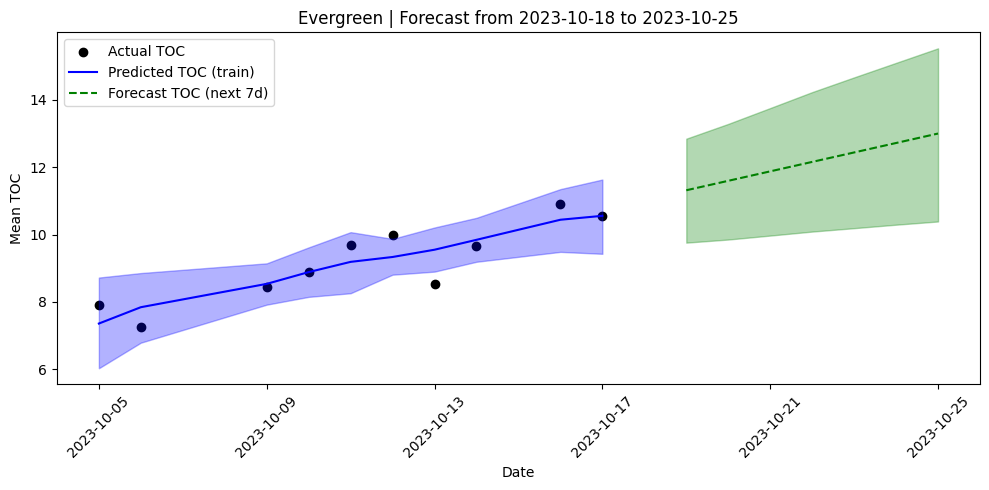

/tmp/ipython-input-3-2284025171.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

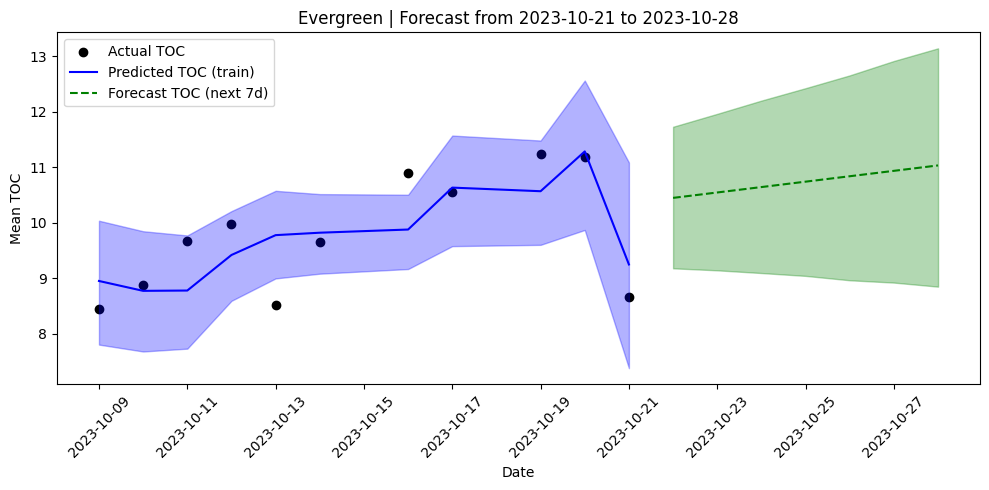

/tmp/ipython-input-3-2284025171.py:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

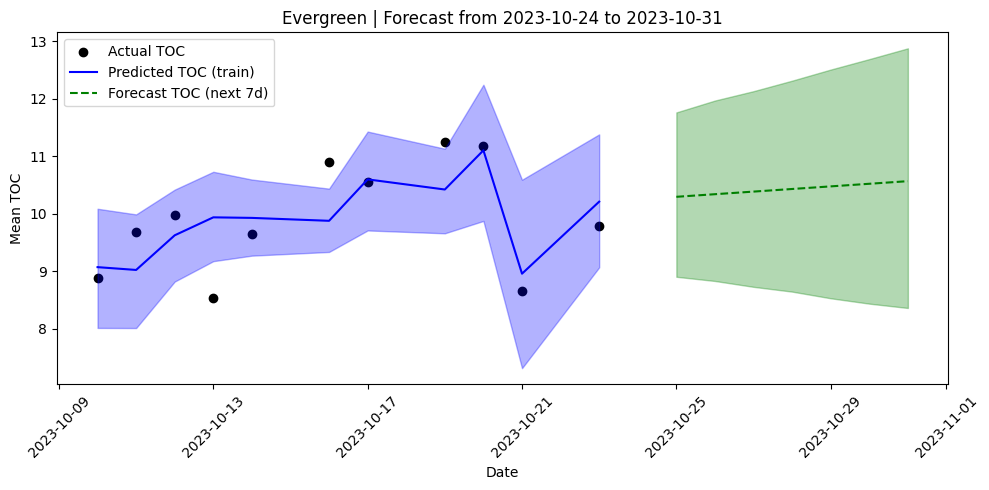


Running rolling MCMC for supplier: 4-S Feeders
Skipping City of Derby (not enough data)

Running rolling MCMC for supplier: Pratt Feeders
Skipping KM Feeders (not enough data)
Skipping Sellers Feedlot (not enough data)
Skipping Golden Belt Feeders (not enough data)
Skipping Ford County Feeders (not enough data)


In [ ]:
# rolling window mcmc with forecast, updated dataframe with daily averages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pymc as pm
from sklearn.preprocessing import StandardScaler
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

df = pd.read_csv("daily_avg_df.csv")
df['Date'] = pd.to_datetime(df['Date'])
df = df.dropna(subset=['Avg_Mean_TOC', 'Avg_Mean_Moisture', 'Supplier'])
df = df.sort_values('Date')

# supplier loop
for supplier_name in df['Supplier'].dropna().unique():
    df_supp = df[df['Supplier'] == supplier_name].copy()

    if len(df_supp) < 20:
        print(f"Skipping {supplier_name} (not enough data)")
        continue

    print(f"\nRunning rolling MCMC for supplier: {supplier_name}")

    min_date = df_supp['Date'].min() + pd.Timedelta(days=15)
    max_date = df_supp['Date'].max()

    for current_date in pd.date_range(start=min_date, end=max_date, freq='3D'):
        window_start = current_date - pd.Timedelta(days=15)
        train_df = df_supp[(df_supp['Date'] > window_start) & (df_supp['Date'] <= current_date)]

        if len(train_df) < 10:
            continue

        train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days
        X = train_df[['TimeIndex', 'Avg_Mean_Moisture']]
        y = train_df['Avg_Mean_TOC']
        dates = train_df['Date']

        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        if not np.all(np.isfinite(X_scaled)) or not np.all(np.isfinite(y)):
            continue

        try:
            with pm.Model() as model:
                beta = pm.Normal('beta', mu=0, sigma=5, shape=X_scaled.shape[1])
                intercept = pm.Normal('intercept', mu=0, sigma=5)
                mu = intercept + pm.math.dot(X_scaled, beta)
                sigma = pm.HalfNormal('sigma', sigma=5)
                y_obs = pm.Normal('y_obs', mu=mu, sigma=sigma, observed=y)

                trace = pm.sample(draws=1000, tune=1000, target_accept=0.97, return_inferencedata=True)
        except Exception as e:
            print(f"Model failed at {current_date.date()} for {supplier_name}: {e}")
            continue

        # Posterior predictive on training window
        beta_samples = trace.posterior['beta'].stack(draws=("chain", "draw")).values
        intercept_samples = trace.posterior['intercept'].stack(draws=("chain", "draw")).values
        predictions = np.dot(X_scaled, beta_samples) + intercept_samples

        pred_mean = predictions.mean(axis=1)
        pred_lower = np.percentile(predictions, 2.5, axis=1)
        pred_upper = np.percentile(predictions, 97.5, axis=1)

        # Forecast next 7 days
        forecast_horizon = 7
        future_dates = pd.date_range(start=current_date + pd.Timedelta(days=1),
                                     periods=forecast_horizon)

        future_timeindex = (future_dates - train_df['Date'].min()).days
        future_moisture = [train_df['Avg_Mean_Moisture'].mean()] * forecast_horizon

        future_X = pd.DataFrame({
            'TimeIndex': future_timeindex,
            'Avg_Mean_Moisture': future_moisture
        })

        future_X_scaled = scaler.transform(future_X)
        future_predictions = np.dot(future_X_scaled, beta_samples) + intercept_samples

        future_pred_mean = future_predictions.mean(axis=1)
        future_pred_lower = np.percentile(future_predictions, 2.5, axis=1)
        future_pred_upper = np.percentile(future_predictions, 97.5, axis=1)

        # Plot training fit + future forecast
        plt.figure(figsize=(10, 5))
        plt.scatter(dates, y, label='Actual TOC', color='black')
        plt.plot(dates, pred_mean, label='Predicted TOC (train)', color='blue')
        plt.fill_between(dates, pred_lower, pred_upper, color='blue', alpha=0.3)

        plt.plot(future_dates, future_pred_mean, label='Forecast TOC (next 7d)', color='green', linestyle='--')
        plt.fill_between(future_dates, future_pred_lower, future_pred_upper, color='green', alpha=0.3)

        plt.title(f"{supplier_name} | Forecast from {current_date.date()} to {future_dates[-1].date()}")
        plt.xlabel("Date")
        plt.ylabel("Mean TOC")
        plt.xticks(rotation=45)
        plt.legend()
        plt.tight_layout()
        plt.show()


Evergreen has 93 rows

Running rolling MCMC for supplier: Evergreen


/tmp/ipython-input-5-2333846086.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

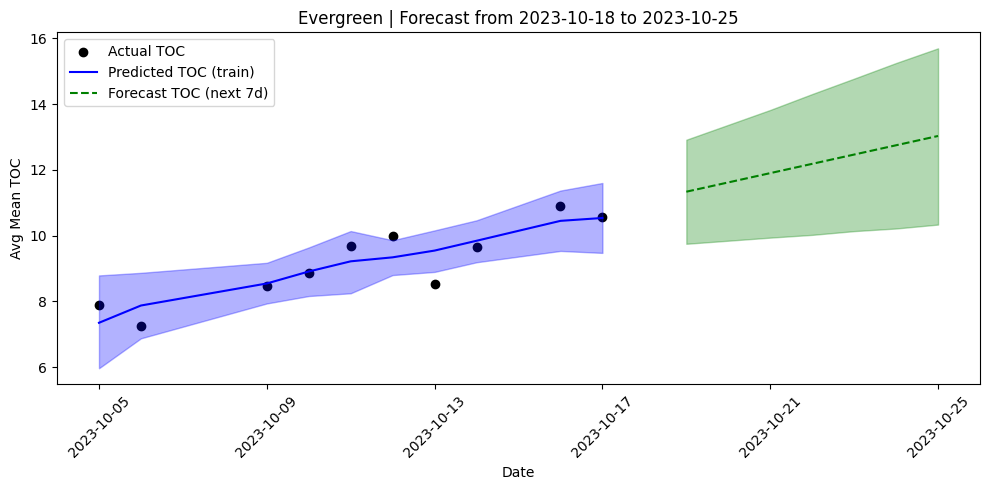

/tmp/ipython-input-5-2333846086.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

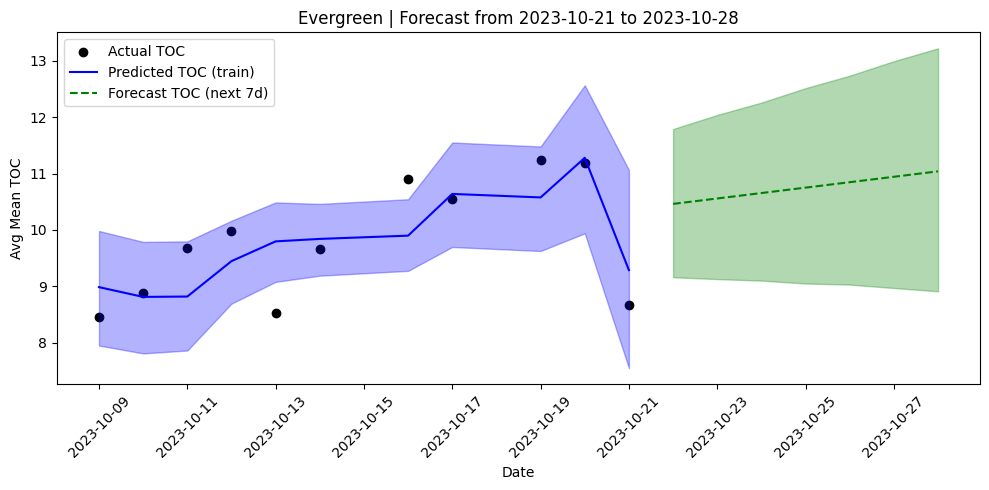

/tmp/ipython-input-5-2333846086.py:37: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

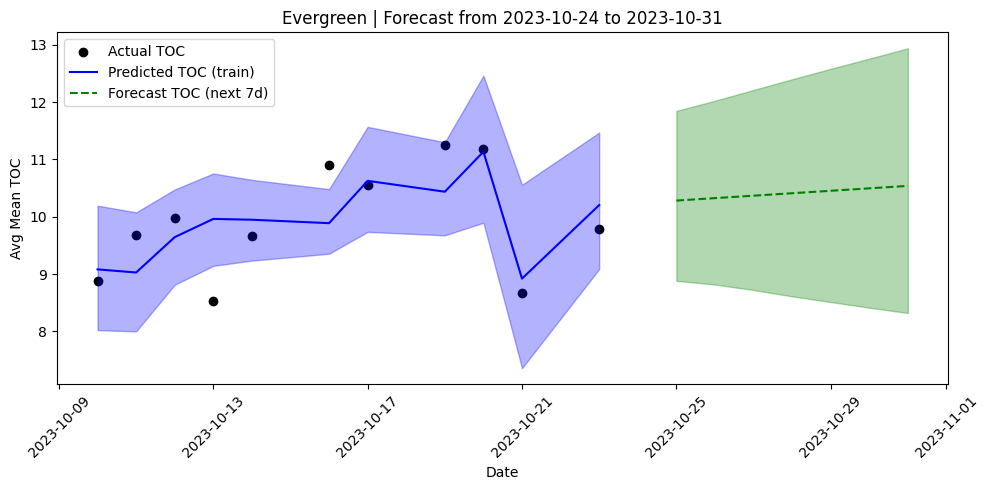

4-S Feeders has 22 rows

Running rolling MCMC for supplier: 4-S Feeders
City of Derby has 14 rows
Skipping City of Derby (not enough data)
Pratt Feeders has 75 rows

Running rolling MCMC for supplier: Pratt Feeders
KM Feeders has 16 rows
Skipping KM Feeders (not enough data)
Sellers Feedlot has 14 rows
Skipping Sellers Feedlot (not enough data)
Golden Belt Feeders has 15 rows
Skipping Golden Belt Feeders (not enough data)
Ford County Feeders has 7 rows
Skipping Ford County Feeders (not enough data)


In [ ]:
# pratt feeder specifically
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pymc as pm
from sklearn.preprocessing import StandardScaler
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

# Load the updated dataframe
df = pd.read_csv("daily_avg_df.csv")
df['Date'] = pd.to_datetime(df['Date'])
df = df.dropna(subset=['Avg_Mean_TOC', 'Avg_Mean_Moisture', 'Supplier'])
df = df.sort_values('Date')

# Supplier loop
for supplier_name in df['Supplier'].dropna().unique():
    df_supp = df[df['Supplier'] == supplier_name].copy()
    print(f"{supplier_name} has {len(df_supp)} rows")  # <-- ADD THIS LINE

    if len(df_supp) < 20:
        print(f"Skipping {supplier_name} (not enough data)")
        continue

    print(f"\nRunning rolling MCMC for supplier: {supplier_name}")

    min_date = df_supp['Date'].min() + pd.Timedelta(days=15)
    max_date = df_supp['Date'].max()

    for current_date in pd.date_range(start=min_date, end=max_date, freq='3D'):
        window_start = current_date - pd.Timedelta(days=15)
        train_df = df_supp[(df_supp['Date'] > window_start) & (df_supp['Date'] <= current_date)]

        if len(train_df) < 10:
            continue

        train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days
        X = train_df[['TimeIndex', 'Avg_Mean_Moisture']]
        y = train_df['Avg_Mean_TOC']
        dates = train_df['Date']

        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        if not np.all(np.isfinite(X_scaled)) or not np.all(np.isfinite(y)):
            continue

        try:
            with pm.Model() as model:
                beta = pm.Normal('beta', mu=0, sigma=5, shape=X_scaled.shape[1])
                intercept = pm.Normal('intercept', mu=0, sigma=5)
                mu = intercept + pm.math.dot(X_scaled, beta)
                sigma = pm.HalfNormal('sigma', sigma=5)
                y_obs = pm.Normal('y_obs', mu=mu, sigma=sigma, observed=y)

                trace = pm.sample(draws=1000, tune=1000, target_accept=0.97, return_inferencedata=True)
        except Exception as e:
            print(f"Model failed at {current_date.date()} for {supplier_name}: {e}")
            continue

        # Posterior predictive on training window
        beta_samples = trace.posterior['beta'].stack(draws=("chain", "draw")).values
        intercept_samples = trace.posterior['intercept'].stack(draws=("chain", "draw")).values
        predictions = np.dot(X_scaled, beta_samples) + intercept_samples

        pred_mean = predictions.mean(axis=1)
        pred_lower = np.percentile(predictions, 2.5, axis=1)
        pred_upper = np.percentile(predictions, 97.5, axis=1)

        # Forecast next 7 days
        forecast_horizon = 7
        future_dates = pd.date_range(start=current_date + pd.Timedelta(days=1),
                                     periods=forecast_horizon)

        future_timeindex = (future_dates - train_df['Date'].min()).days
        future_moisture = [train_df['Avg_Mean_Moisture'].mean()] * forecast_horizon

        future_X = pd.DataFrame({
            'TimeIndex': future_timeindex,
            'Avg_Mean_Moisture': future_moisture
        })

        future_X_scaled = scaler.transform(future_X)
        future_predictions = np.dot(future_X_scaled, beta_samples) + intercept_samples

        future_pred_mean = future_predictions.mean(axis=1)
        future_pred_lower = np.percentile(future_predictions, 2.5, axis=1)
        future_pred_upper = np.percentile(future_predictions, 97.5, axis=1)

        # Plot training fit + future forecast
        plt.figure(figsize=(10, 5))
        plt.scatter(dates, y, label='Actual TOC', color='black')
        plt.plot(dates, pred_mean, label='Predicted TOC (train)', color='blue')
        plt.fill_between(dates, pred_lower, pred_upper, color='blue', alpha=0.3)

        plt.plot(future_dates, future_pred_mean, label='Forecast TOC (next 7d)', color='green', linestyle='--')
        plt.fill_between(future_dates, future_pred_lower, future_pred_upper, color='green', alpha=0.3)

        plt.title(f"{supplier_name} | Forecast from {current_date.date()} to {future_dates[-1].date()}")
        plt.xlabel("Date")
        plt.ylabel("Avg Mean TOC")
        plt.xticks(rotation=45)
        plt.legend()
        plt.tight_layout()
        plt.show()



Pratt Feeders has 75 rows
Rolling windows will run from 2024-09-12 to 2025-03-27
Window: 2024-08-28 to 2024-09-12 | 6 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


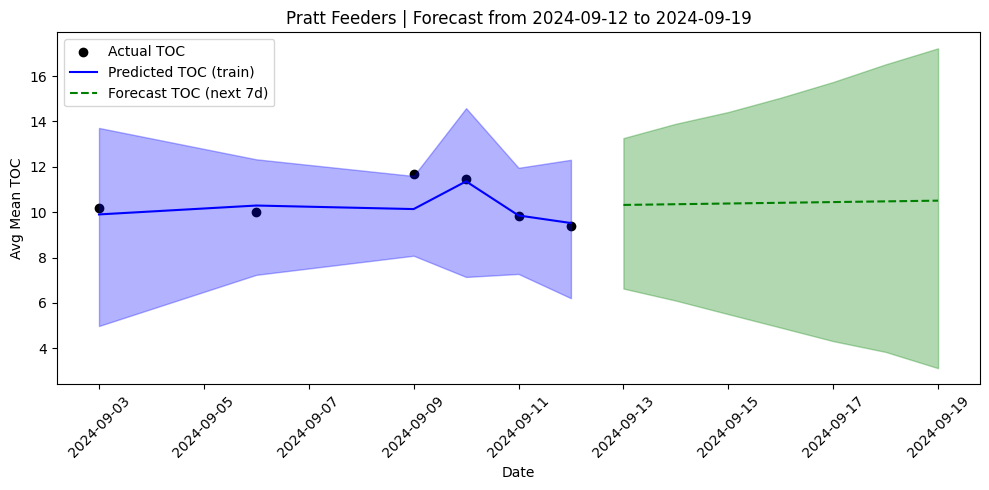

Window: 2024-08-31 to 2024-09-15 | 6 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


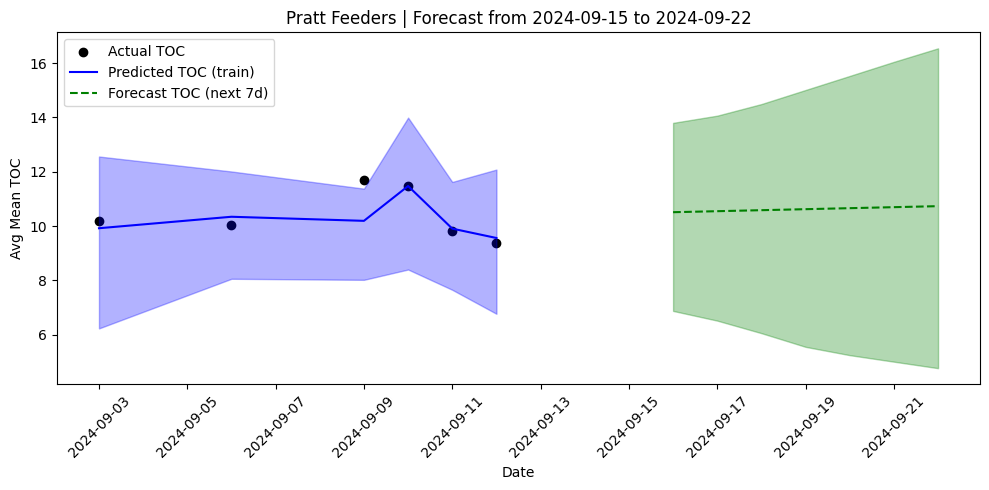

Window: 2024-09-03 to 2024-09-18 | 6 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

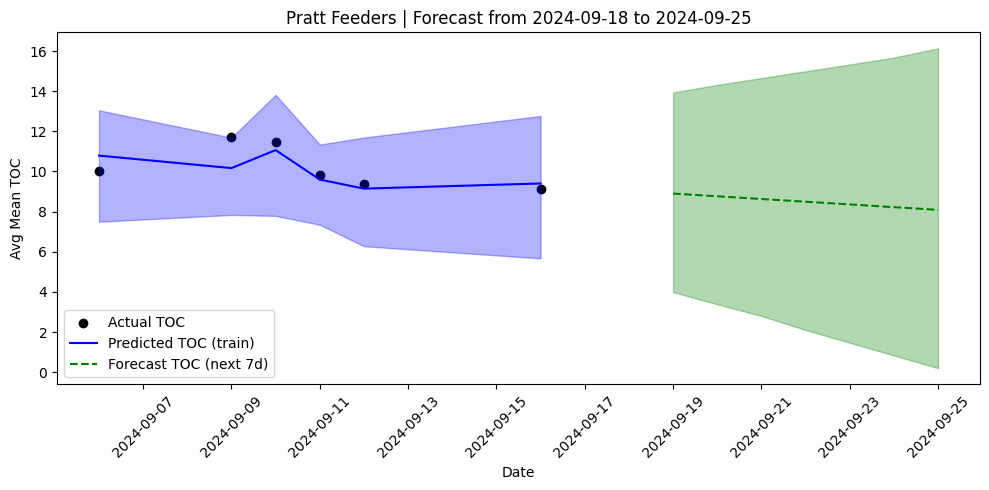

Window: 2024-09-06 to 2024-09-21 | 5 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


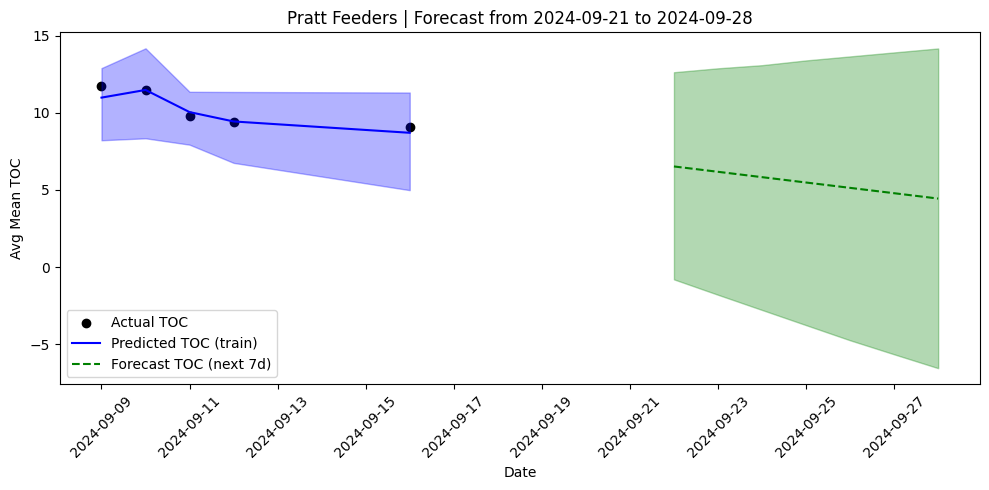

Window: 2024-09-09 to 2024-09-24 | 4 rows
Skipping this window — too few rows
Window: 2024-09-12 to 2024-09-27 | 3 rows
Skipping this window — too few rows
Window: 2024-09-15 to 2024-09-30 | 4 rows
Skipping this window — too few rows
Window: 2024-09-18 to 2024-10-03 | 6 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

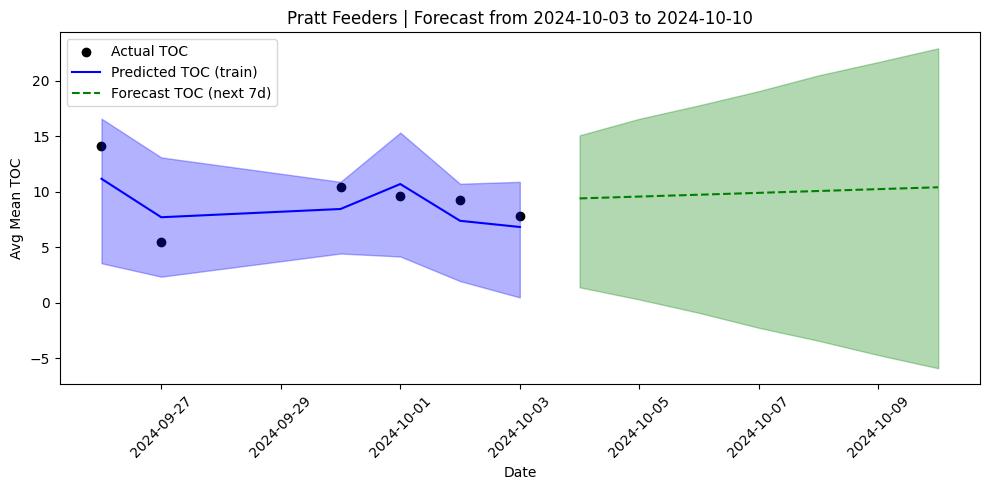

Window: 2024-09-21 to 2024-10-06 | 7 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


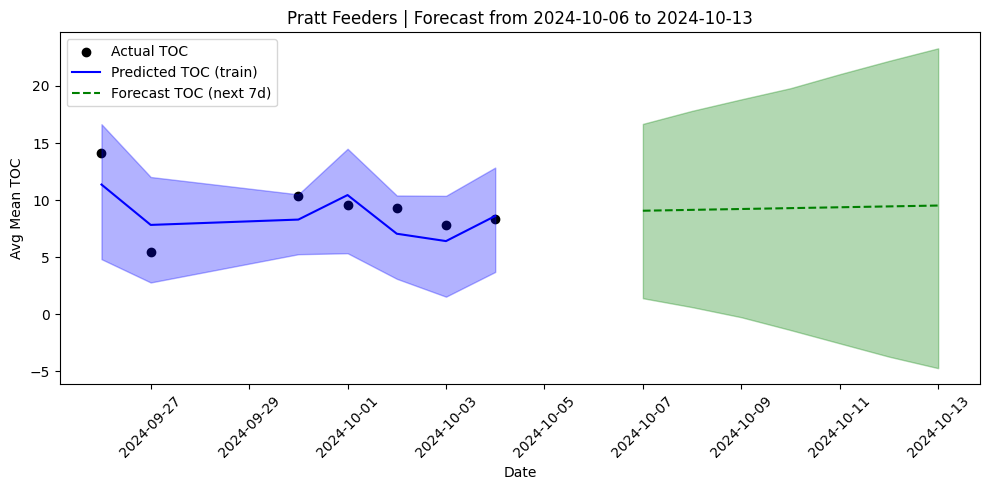

Window: 2024-09-24 to 2024-10-09 | 7 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

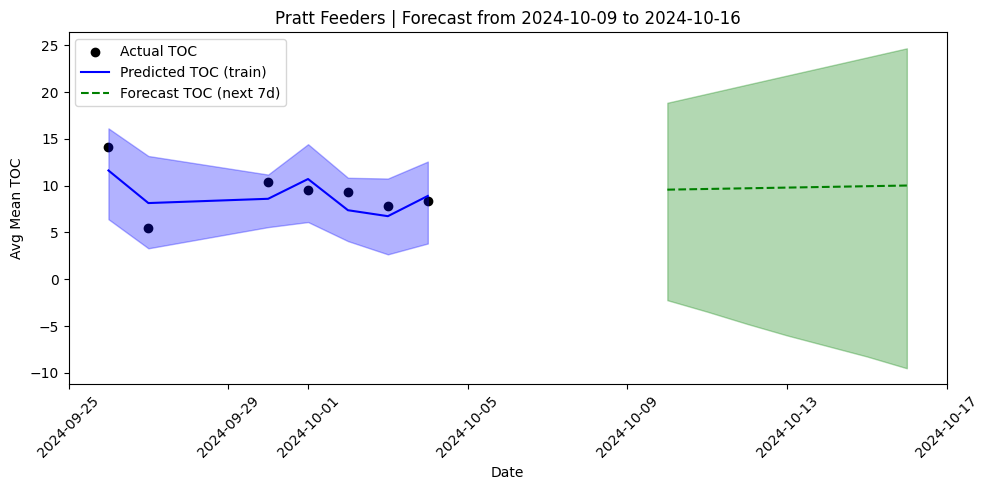

Window: 2024-09-27 to 2024-10-12 | 5 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


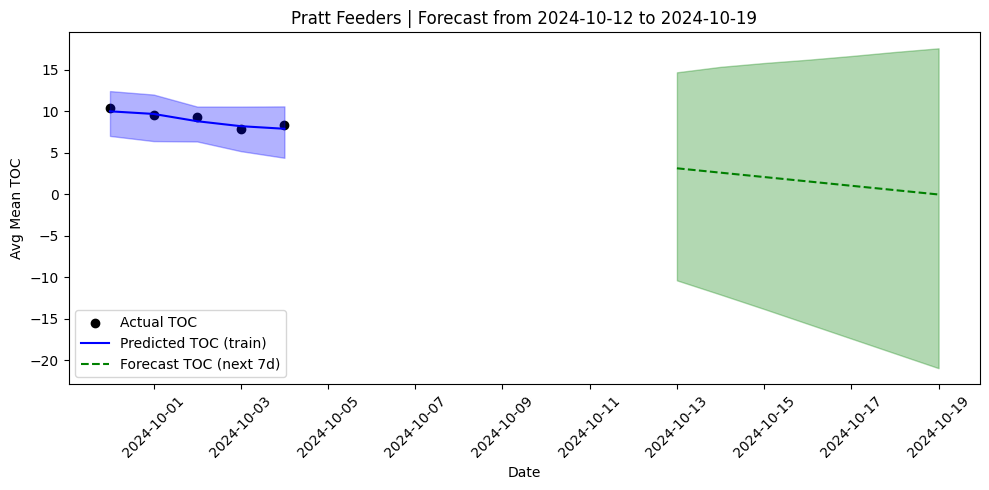

Window: 2024-09-30 to 2024-10-15 | 4 rows
Skipping this window — too few rows
Window: 2024-10-03 to 2024-10-18 | 1 rows
Skipping this window — too few rows
Window: 2024-10-06 to 2024-10-21 | 0 rows
Skipping this window — too few rows
Window: 2024-10-09 to 2024-10-24 | 1 rows
Skipping this window — too few rows
Window: 2024-10-12 to 2024-10-27 | 2 rows
Skipping this window — too few rows
Window: 2024-10-15 to 2024-10-30 | 5 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


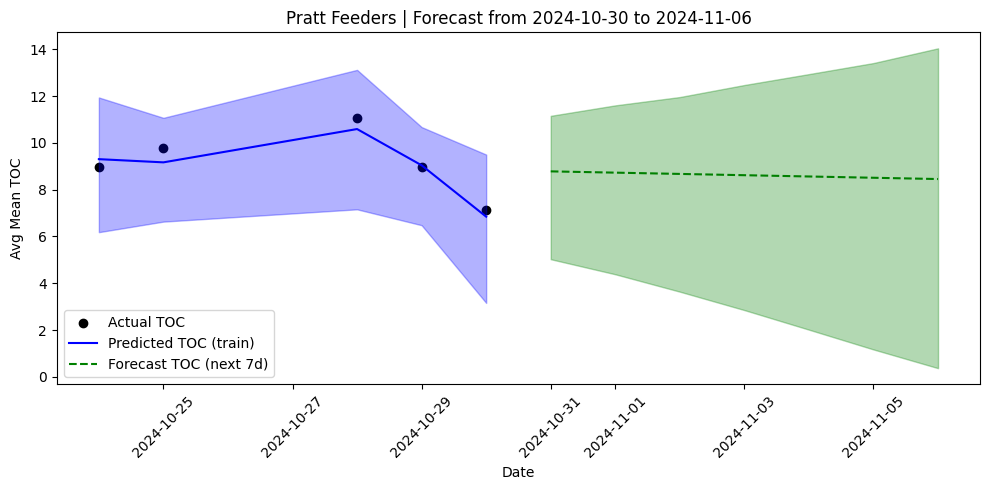

Window: 2024-10-18 to 2024-11-02 | 6 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

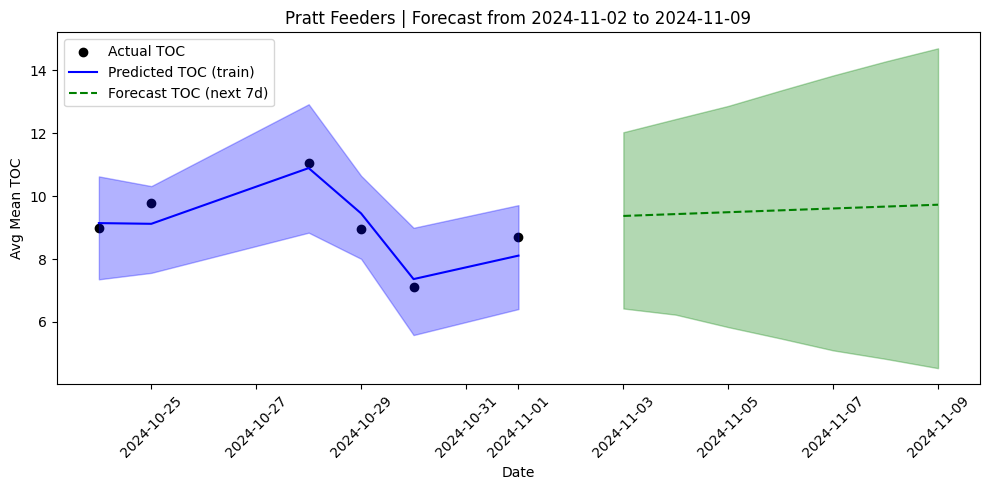

Window: 2024-10-21 to 2024-11-05 | 6 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


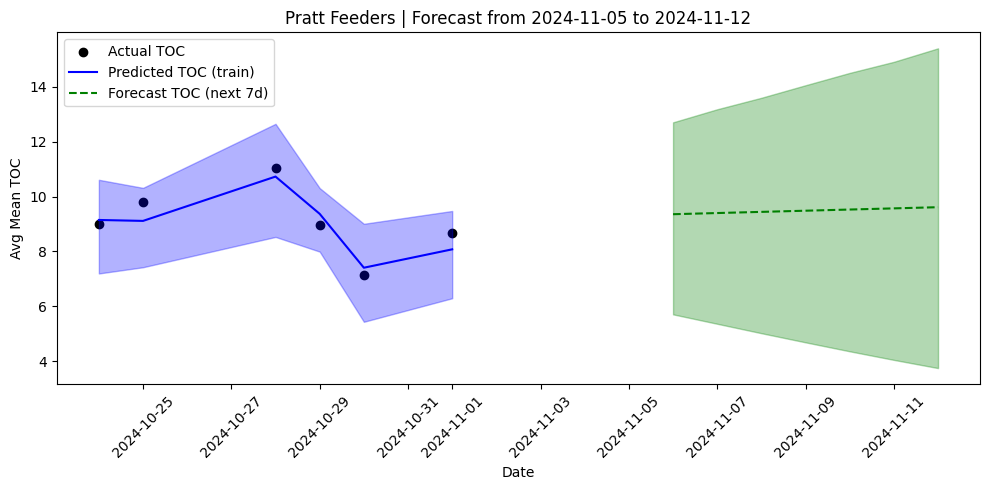

Window: 2024-10-24 to 2024-11-08 | 7 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

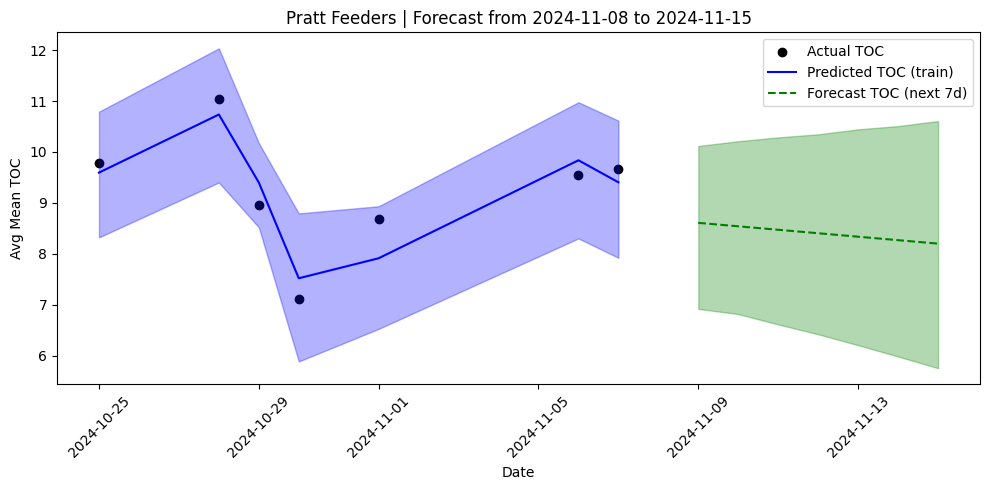

Window: 2024-10-27 to 2024-11-11 | 7 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

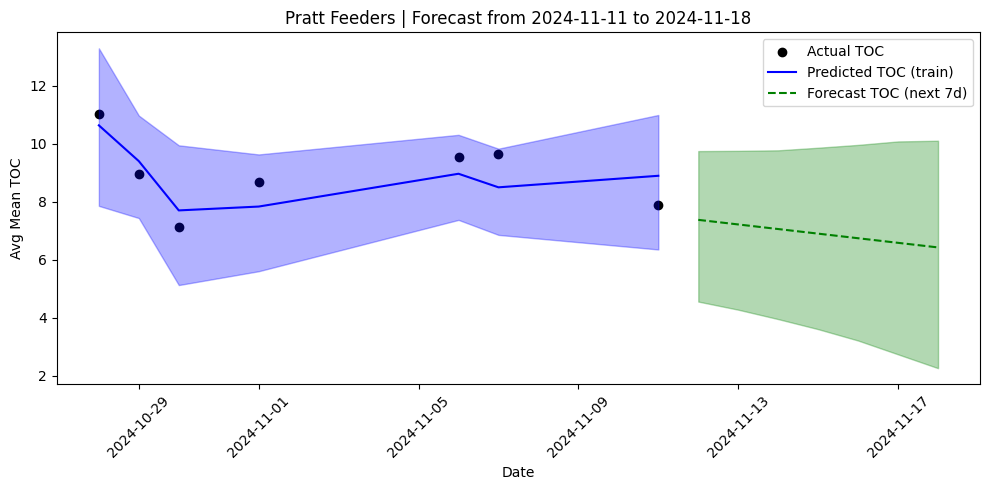

Window: 2024-10-30 to 2024-11-14 | 7 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

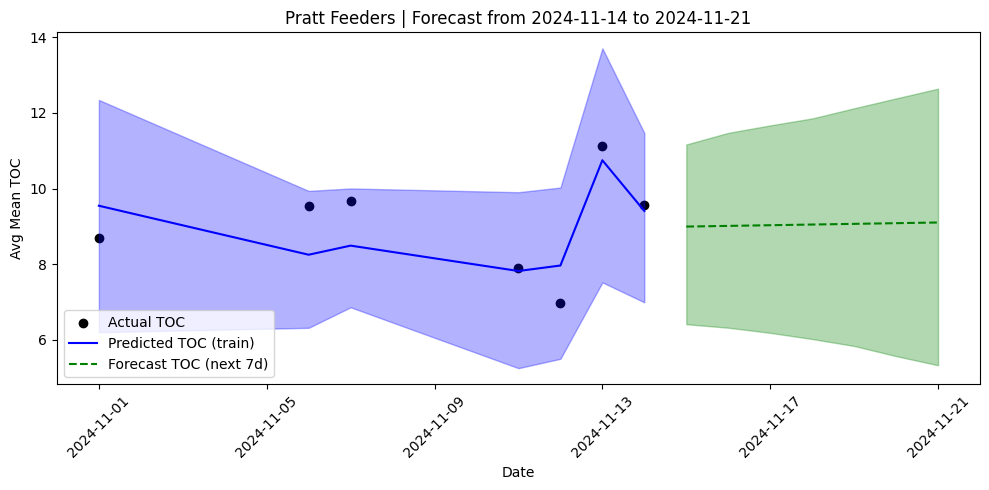

Window: 2024-11-02 to 2024-11-17 | 8 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

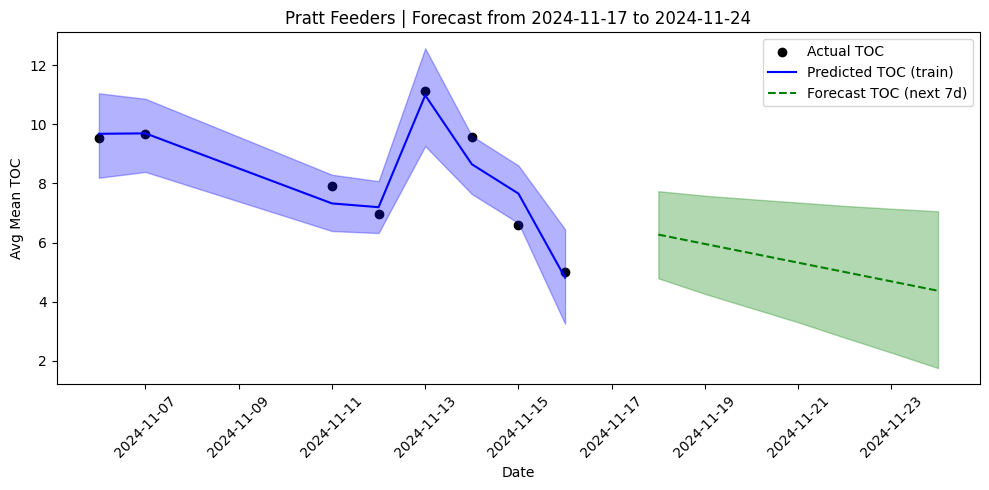

Window: 2024-11-05 to 2024-11-20 | 9 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

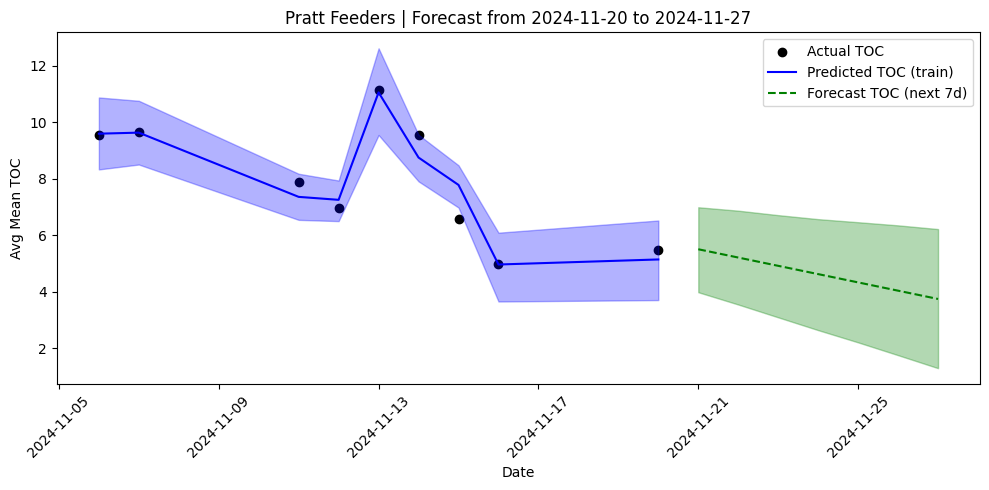

Window: 2024-11-08 to 2024-11-23 | 7 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

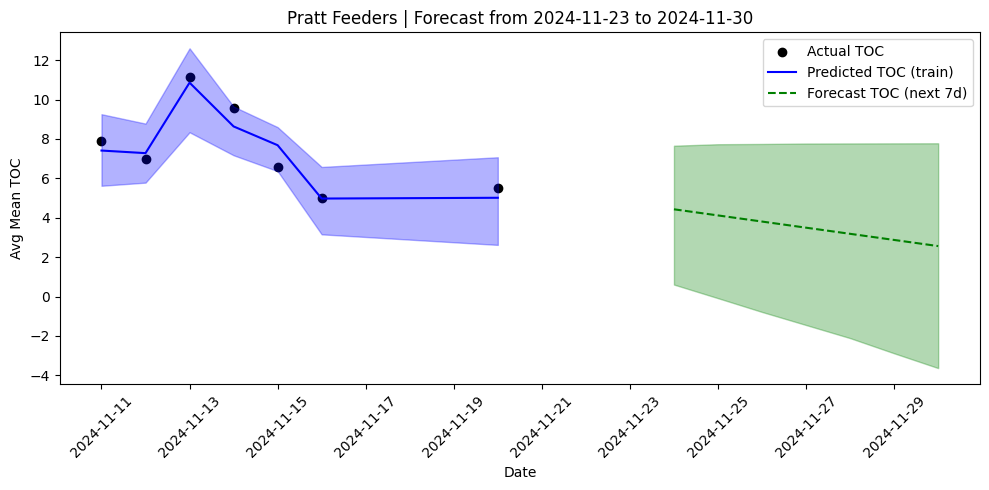

Window: 2024-11-11 to 2024-11-26 | 7 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

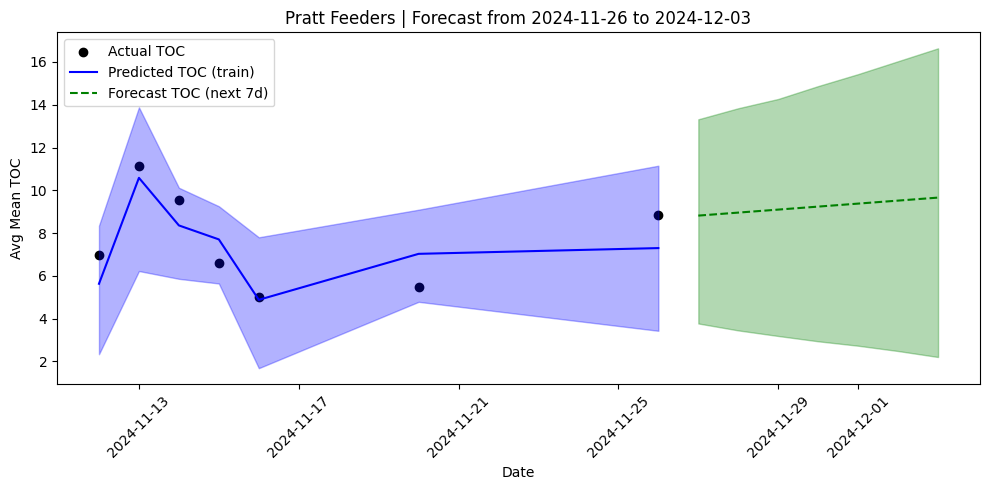

Window: 2024-11-14 to 2024-11-29 | 5 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

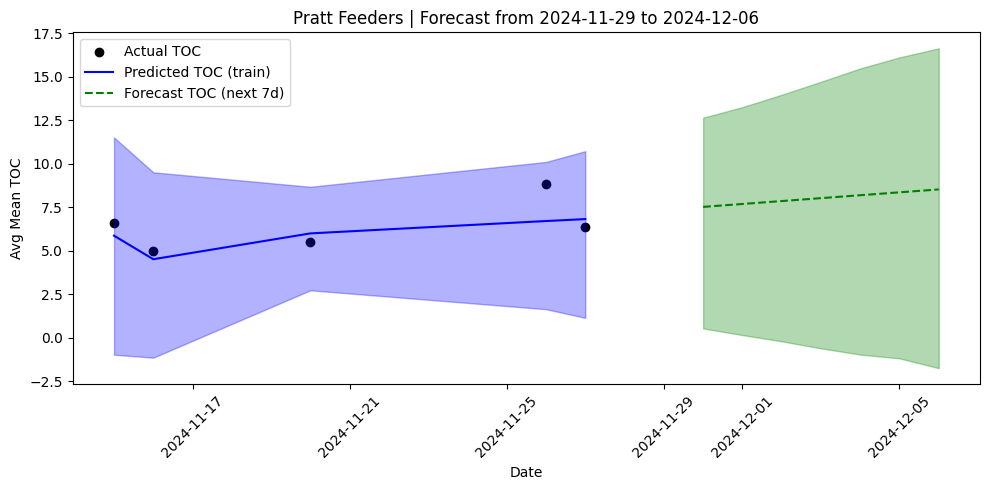

Window: 2024-11-17 to 2024-12-02 | 4 rows
Skipping this window — too few rows
Window: 2024-11-20 to 2024-12-05 | 6 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

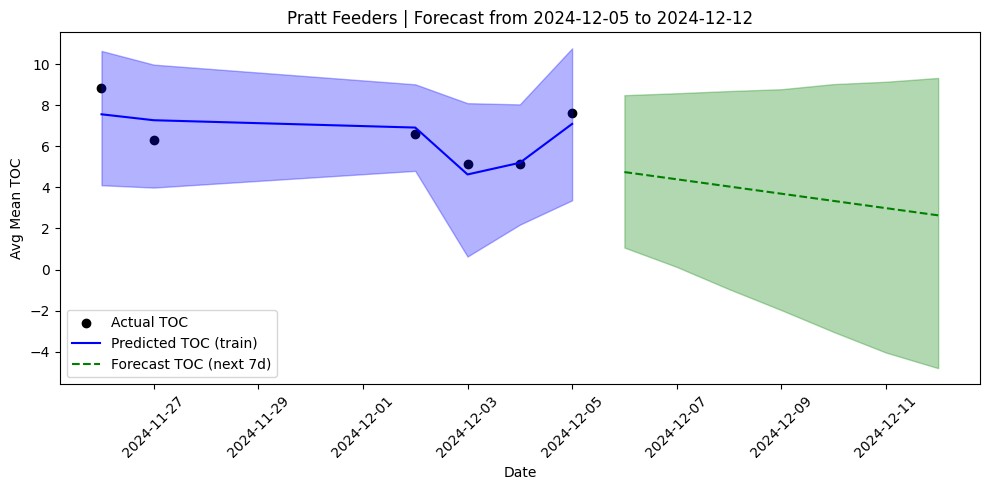

Window: 2024-11-23 to 2024-12-08 | 6 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

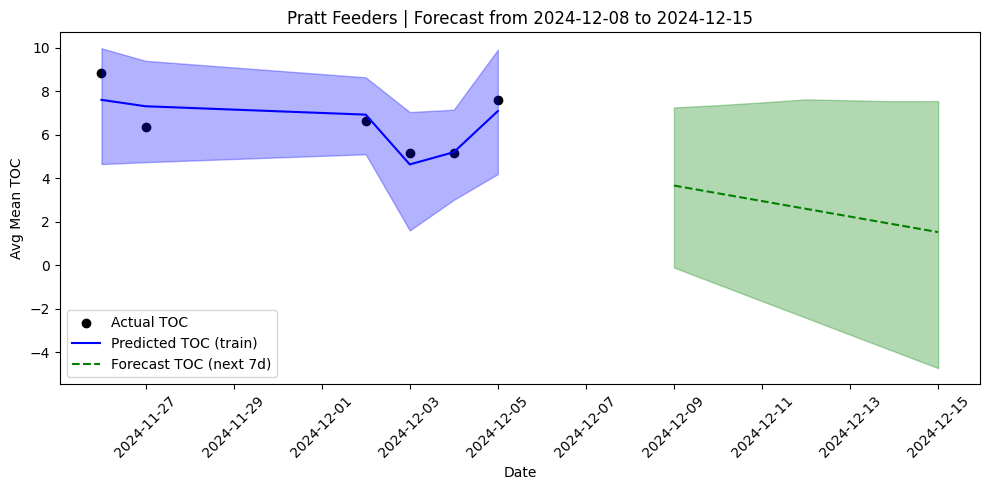

Window: 2024-11-26 to 2024-12-11 | 8 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

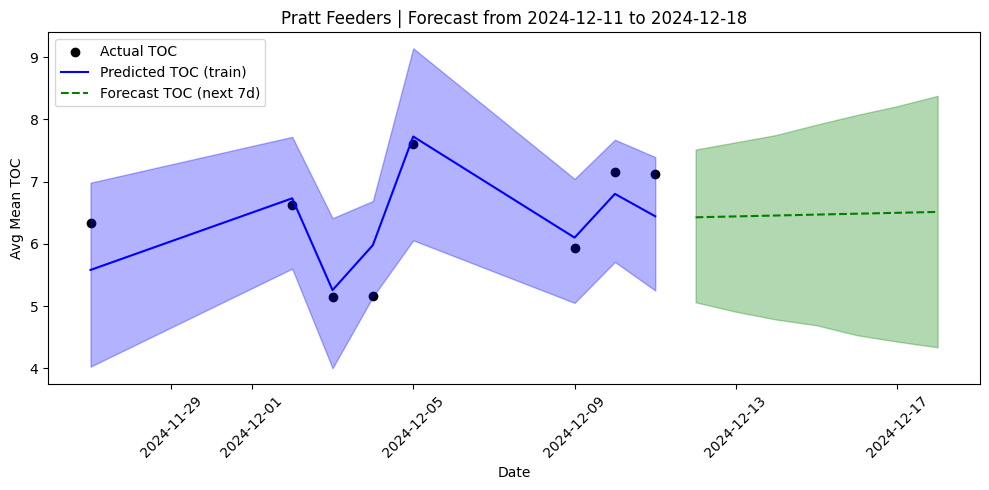

Window: 2024-11-29 to 2024-12-14 | 7 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

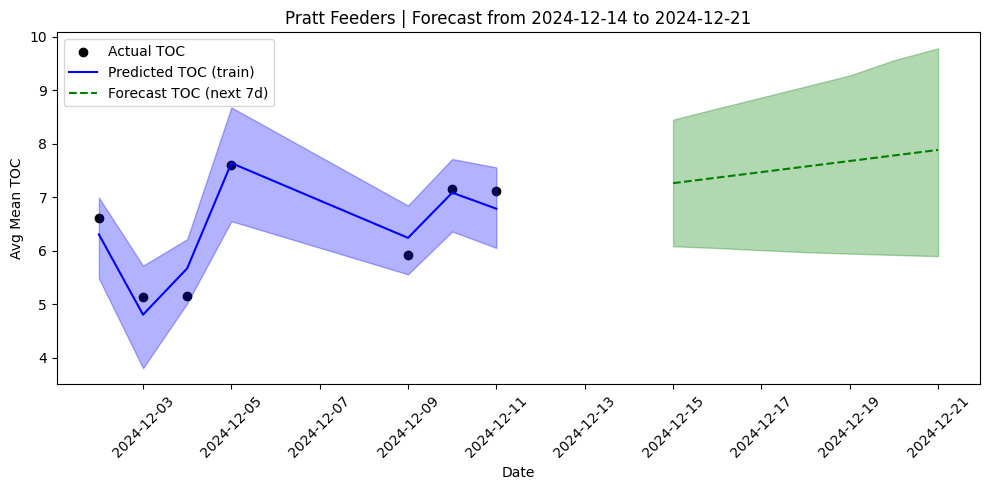

Window: 2024-12-02 to 2024-12-17 | 6 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


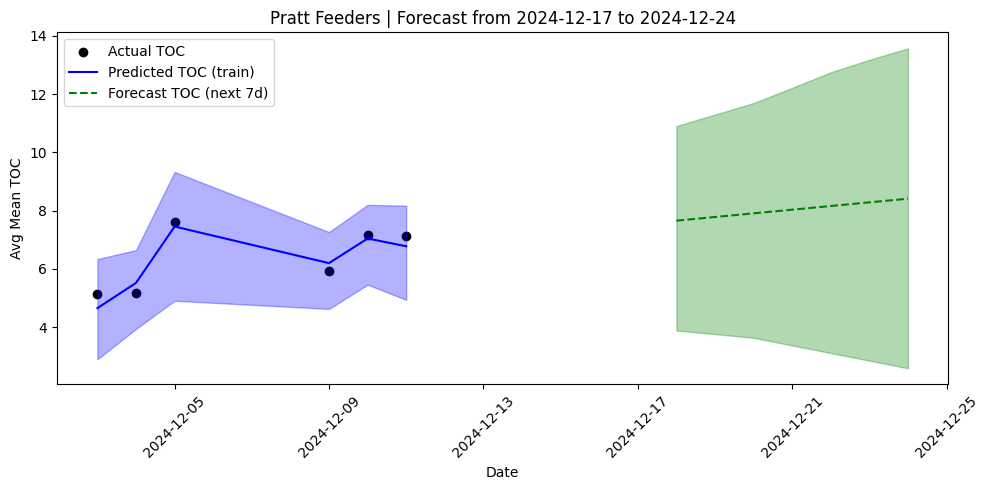

Window: 2024-12-05 to 2024-12-20 | 3 rows
Skipping this window — too few rows
Window: 2024-12-08 to 2024-12-23 | 4 rows
Skipping this window — too few rows
Window: 2024-12-11 to 2024-12-26 | 2 rows
Skipping this window — too few rows
Window: 2024-12-14 to 2024-12-29 | 2 rows
Skipping this window — too few rows
Window: 2024-12-17 to 2025-01-01 | 3 rows
Skipping this window — too few rows
Window: 2024-12-20 to 2025-01-04 | 5 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


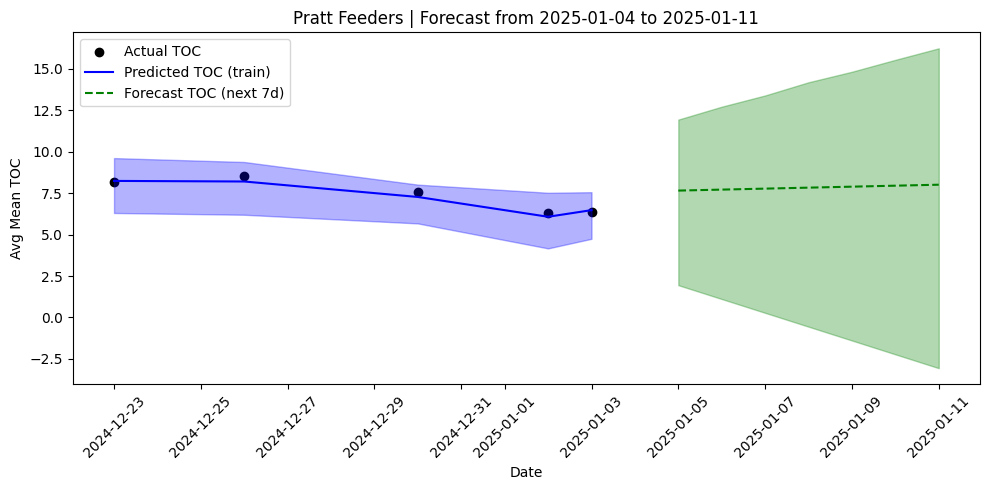

Window: 2024-12-23 to 2025-01-07 | 4 rows
Skipping this window — too few rows
Window: 2024-12-26 to 2025-01-10 | 3 rows
Skipping this window — too few rows
Window: 2024-12-29 to 2025-01-13 | 3 rows
Skipping this window — too few rows
Window: 2025-01-01 to 2025-01-16 | 4 rows
Skipping this window — too few rows
Window: 2025-01-04 to 2025-01-19 | 3 rows
Skipping this window — too few rows
Window: 2025-01-07 to 2025-01-22 | 4 rows
Skipping this window — too few rows
Window: 2025-01-10 to 2025-01-25 | 4 rows
Skipping this window — too few rows
Window: 2025-01-13 to 2025-01-28 | 6 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

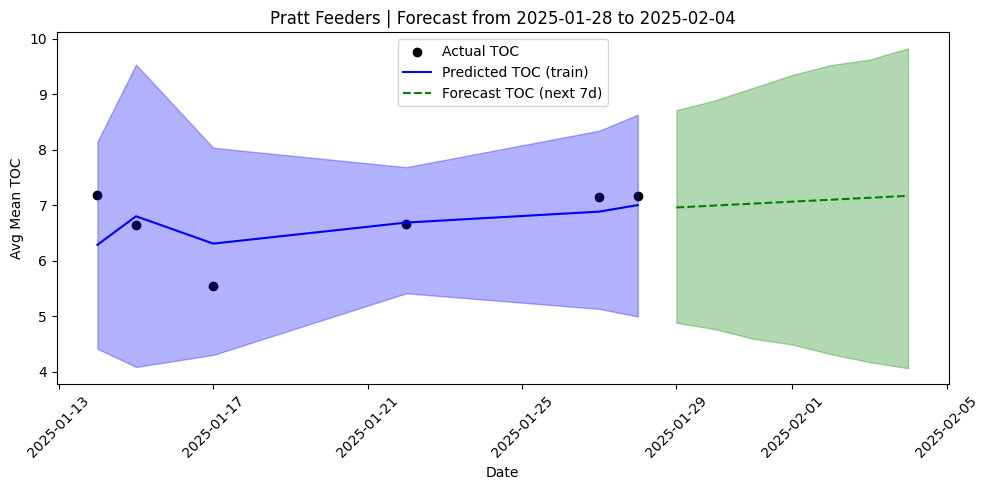

Window: 2025-01-16 to 2025-01-31 | 6 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


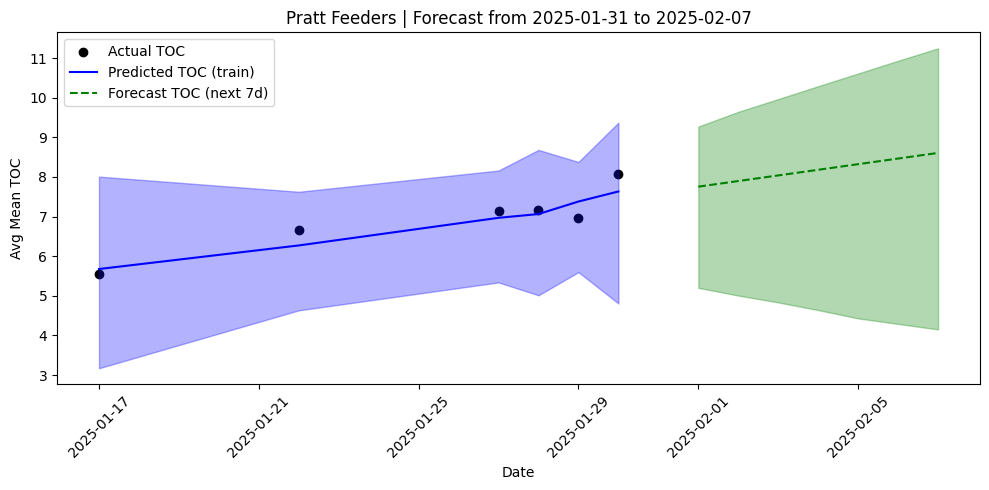

Window: 2025-01-19 to 2025-02-03 | 6 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

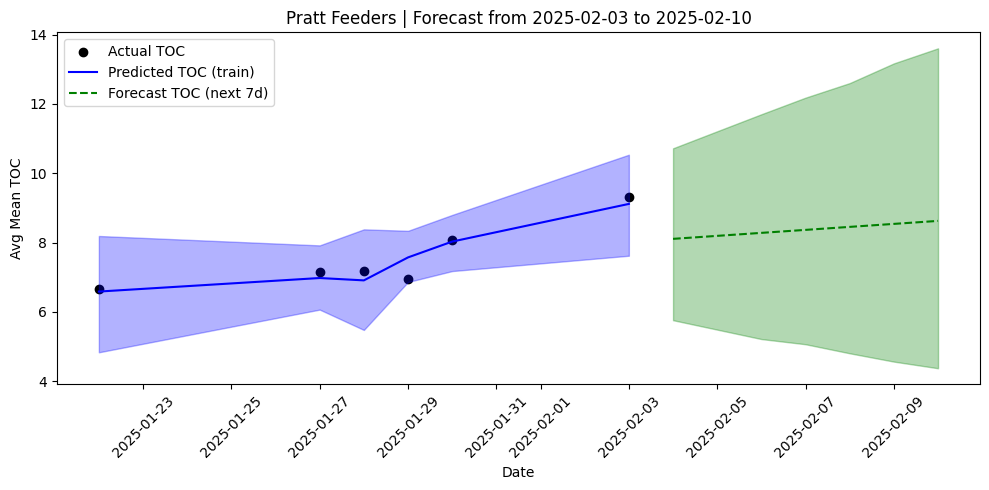

Window: 2025-01-22 to 2025-02-06 | 7 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

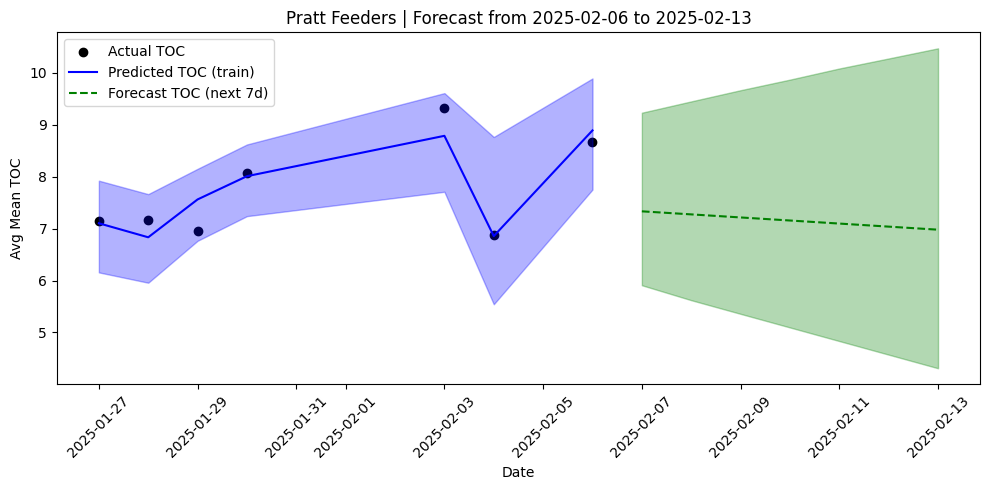

Window: 2025-01-25 to 2025-02-09 | 8 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

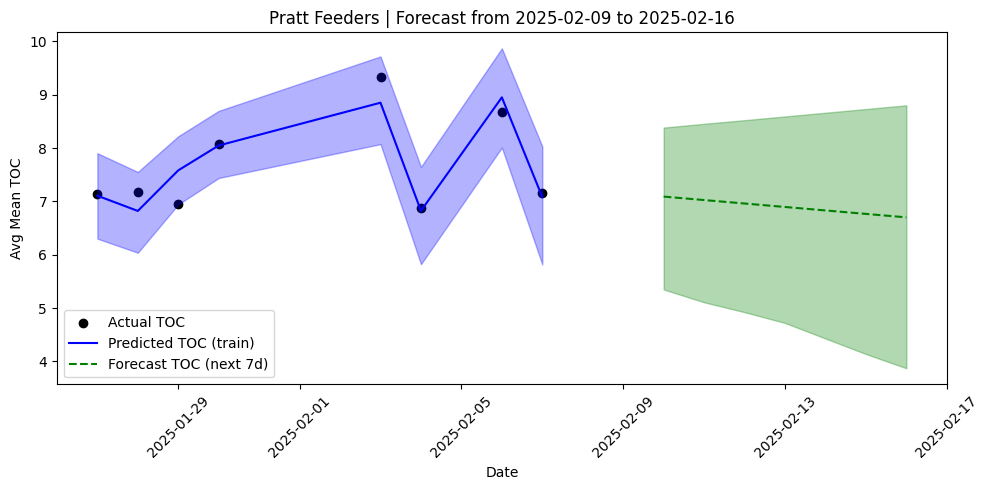

Window: 2025-01-28 to 2025-02-12 | 8 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

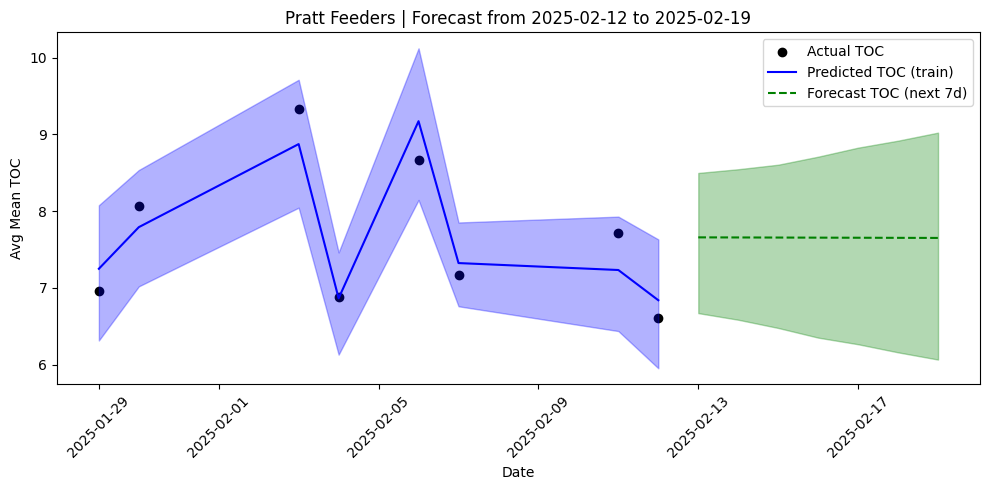

Window: 2025-01-31 to 2025-02-15 | 7 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


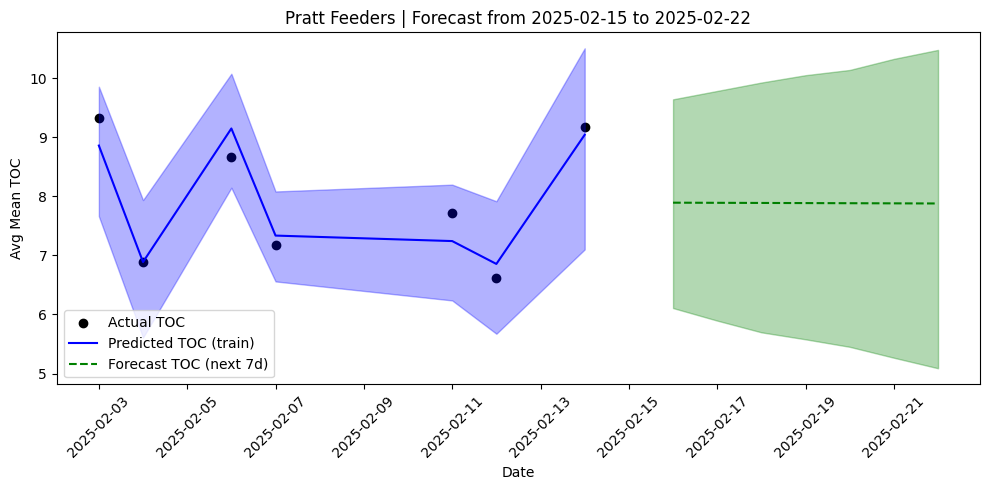

Window: 2025-02-03 to 2025-02-18 | 7 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


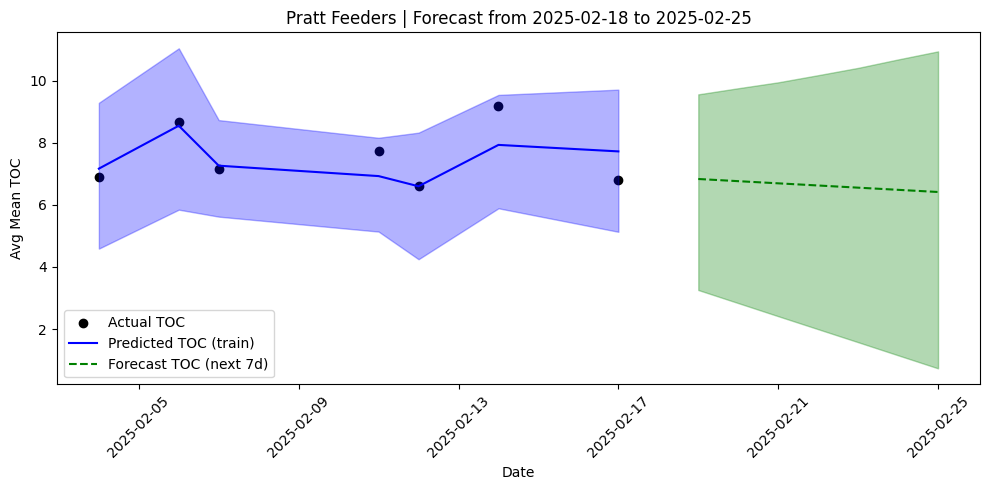

Window: 2025-02-06 to 2025-02-21 | 6 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


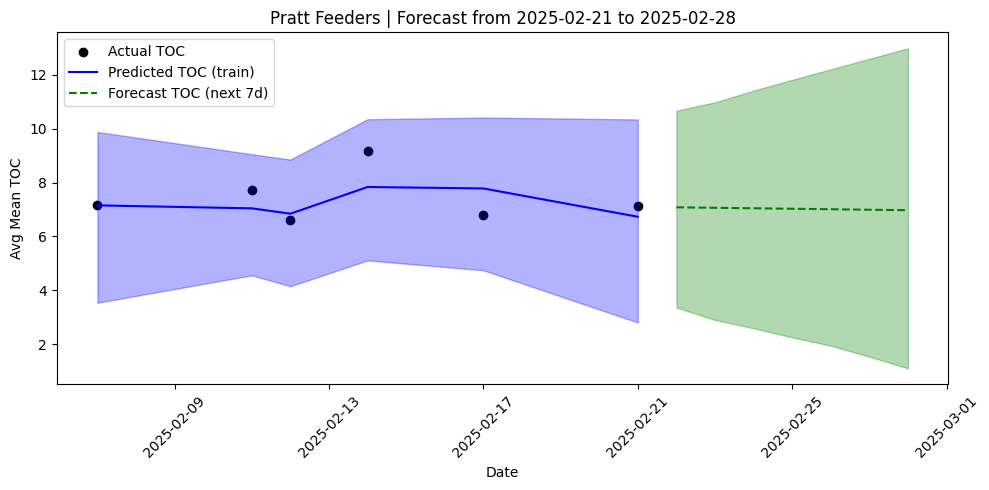

Window: 2025-02-09 to 2025-02-24 | 5 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


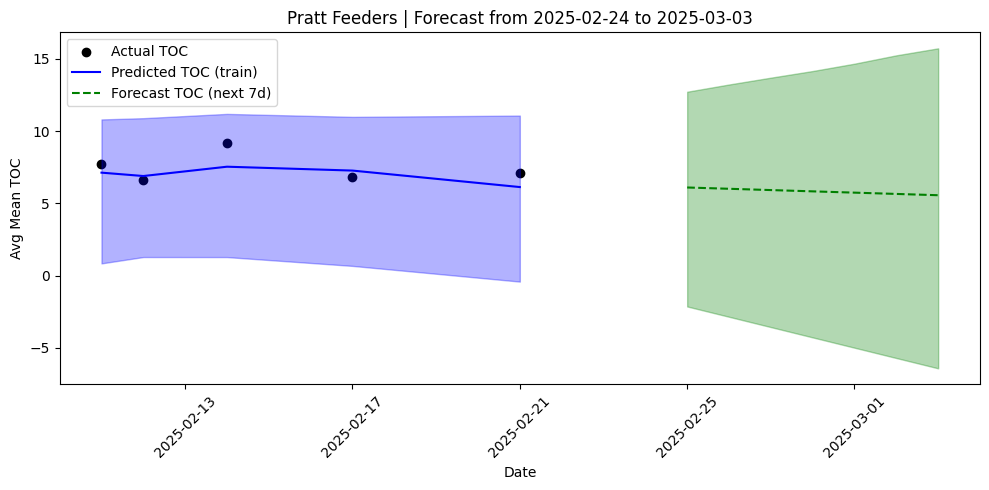

Window: 2025-02-12 to 2025-02-27 | 5 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


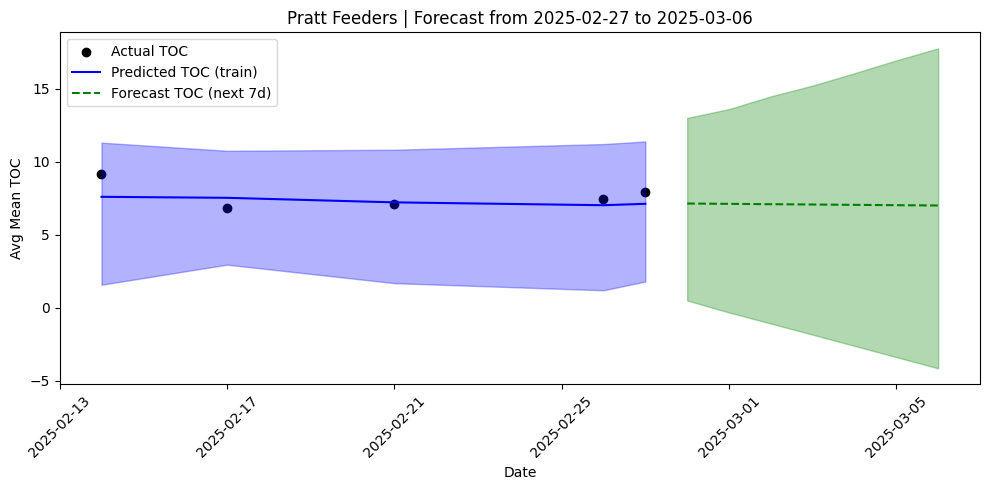

Window: 2025-02-15 to 2025-03-02 | 5 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


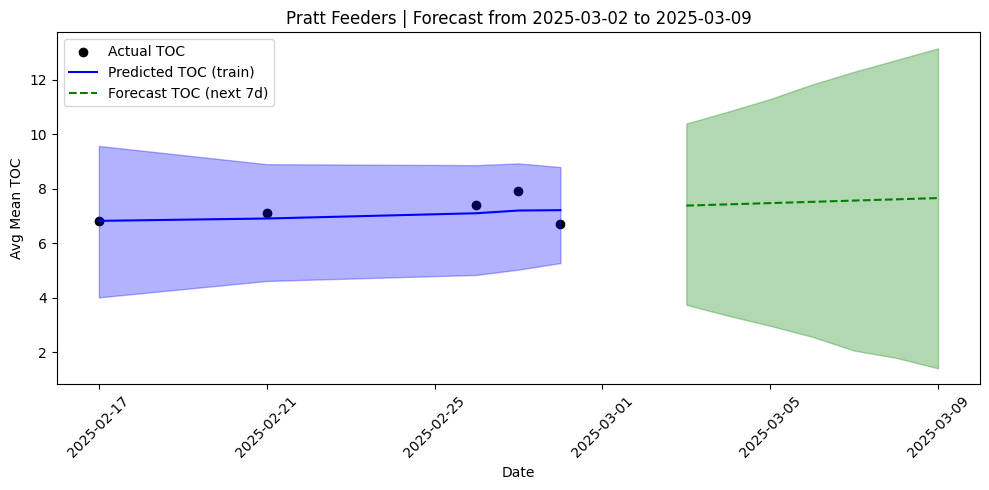

Window: 2025-02-18 to 2025-03-05 | 7 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


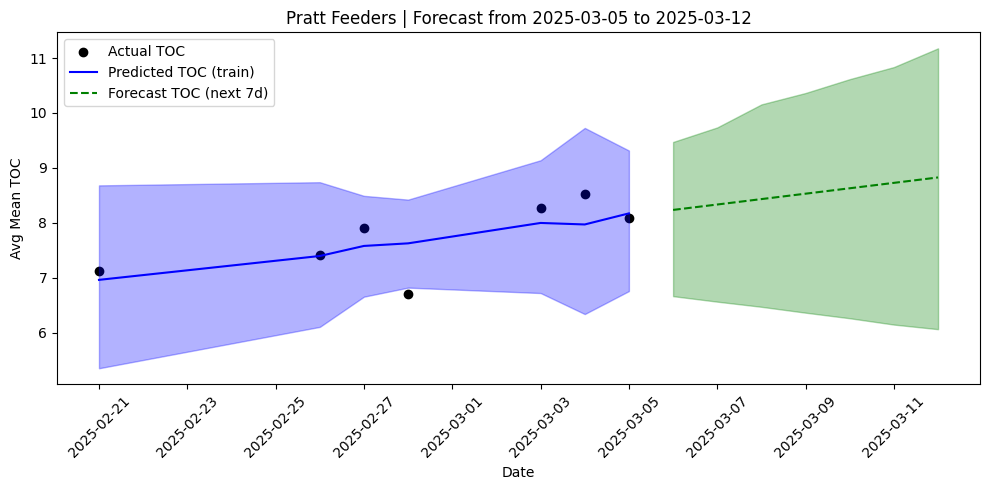

Window: 2025-02-21 to 2025-03-08 | 8 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

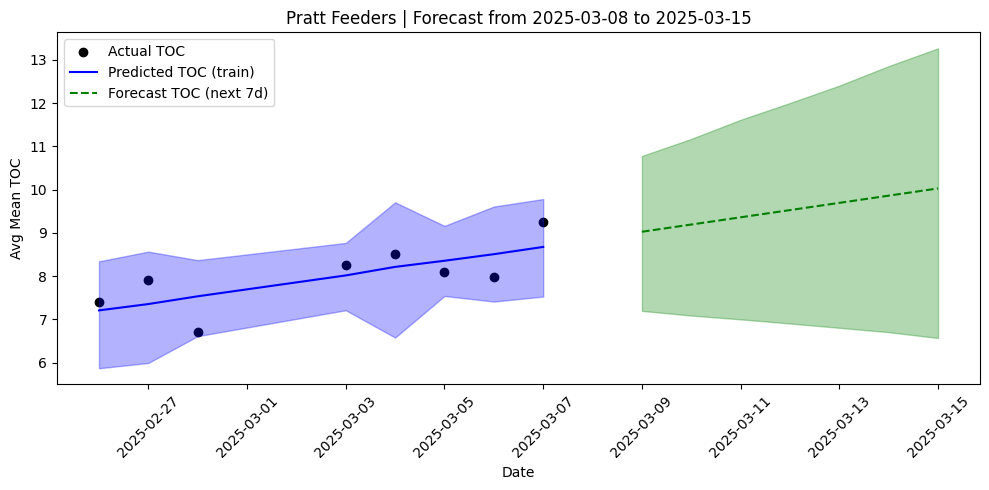

Window: 2025-02-24 to 2025-03-11 | 9 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

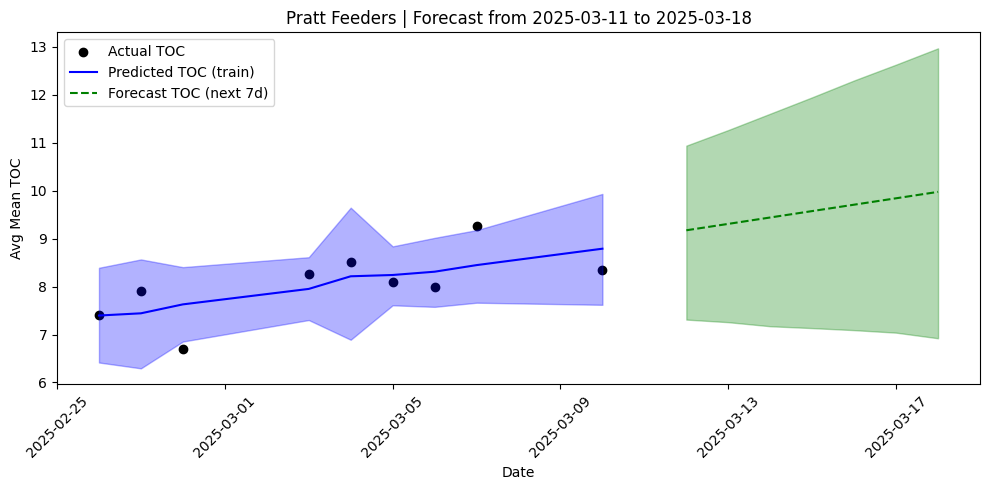

Window: 2025-02-27 to 2025-03-14 | 7 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

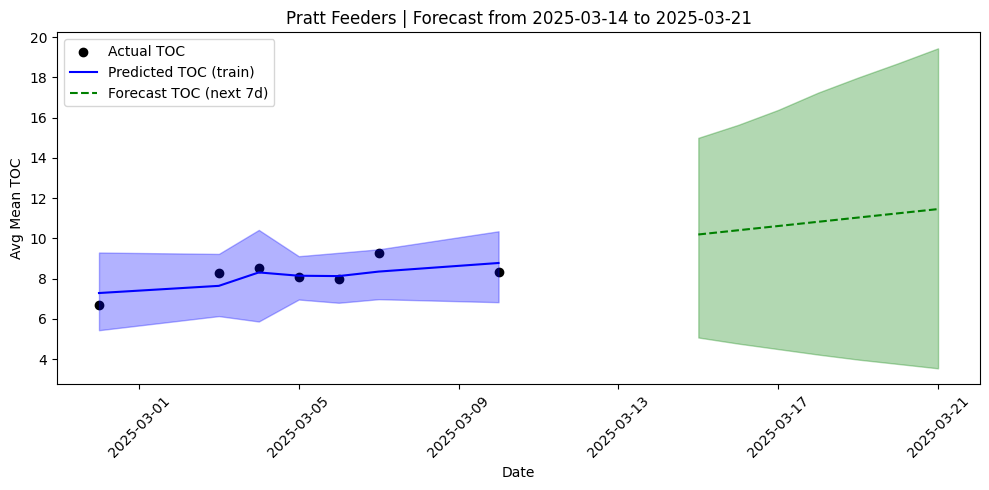

Window: 2025-03-02 to 2025-03-17 | 6 rows


/tmp/ipython-input-7-735650471.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days


Output()

ERROR:pymc.stats.convergence:The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


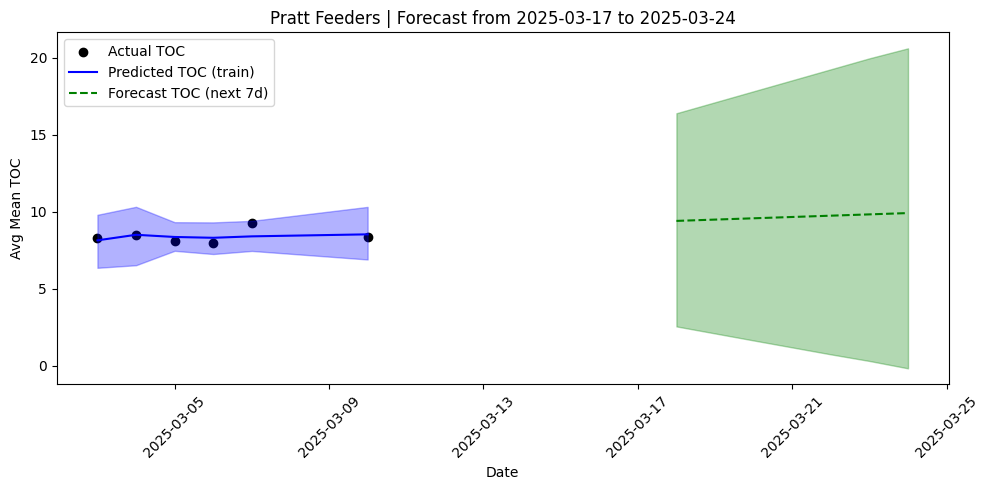

Window: 2025-03-05 to 2025-03-20 | 3 rows
Skipping this window — too few rows
Window: 2025-03-08 to 2025-03-23 | 2 rows
Skipping this window — too few rows
Window: 2025-03-11 to 2025-03-26 | 4 rows
Skipping this window — too few rows


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pymc as pm
from sklearn.preprocessing import StandardScaler
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

# Load the updated daily average file
df = pd.read_csv("daily_avg_df.csv")
df['Date'] = pd.to_datetime(df['Date'])

# Clean supplier names (remove trailing spaces, etc.)
df['Supplier'] = df['Supplier'].str.strip()

# Drop missing values
df = df.dropna(subset=['Avg_Mean_TOC', 'Avg_Mean_Moisture', 'Supplier'])
df = df.sort_values('Date')

# Focus only on Pratt Feeder
for supplier_name in ["Pratt Feeders"]:
    df_supp = df[df['Supplier'] == supplier_name].copy()
    print(f"\n{supplier_name} has {len(df_supp)} rows")

    if len(df_supp) < 5:
        print(f"Skipping {supplier_name} (still not enough data)")
        continue

    min_date = df_supp['Date'].min() + pd.Timedelta(days=15)
    max_date = df_supp['Date'].max()
    print(f"Rolling windows will run from {min_date.date()} to {max_date.date()}")

    for current_date in pd.date_range(start=min_date, end=max_date, freq='3D'):
        window_start = current_date - pd.Timedelta(days=15)
        train_df = df_supp[(df_supp['Date'] > window_start) & (df_supp['Date'] <= current_date)]
        print(f"Window: {window_start.date()} to {current_date.date()} | {len(train_df)} rows")

        if len(train_df) < 5:
            print("Skipping this window — too few rows")
            continue

        train_df['TimeIndex'] = (train_df['Date'] - train_df['Date'].min()).dt.days
        X = train_df[['TimeIndex', 'Avg_Mean_Moisture']]
        y = train_df['Avg_Mean_TOC']
        dates = train_df['Date']

        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        if not np.all(np.isfinite(X_scaled)) or not np.all(np.isfinite(y)):
            print("Skipping this window — non-finite values in features or target")
            continue

        try:
            with pm.Model() as model:
                beta = pm.Normal('beta', mu=0, sigma=5, shape=X_scaled.shape[1])
                intercept = pm.Normal('intercept', mu=0, sigma=5)
                mu = intercept + pm.math.dot(X_scaled, beta)
                sigma = pm.HalfNormal('sigma', sigma=5)
                y_obs = pm.Normal('y_obs', mu=mu, sigma=sigma, observed=y)

                trace = pm.sample(draws=500, tune=500, target_accept=0.97, return_inferencedata=True)
        except Exception as e:
            print(f"Model failed at {current_date.date()} for {supplier_name} with {len(train_df)} rows: {e}")
            continue

        # Posterior predictive on training window
        beta_samples = trace.posterior['beta'].stack(draws=("chain", "draw")).values
        intercept_samples = trace.posterior['intercept'].stack(draws=("chain", "draw")).values
        predictions = np.dot(X_scaled, beta_samples) + intercept_samples

        pred_mean = predictions.mean(axis=1)
        pred_lower = np.percentile(predictions, 2.5, axis=1)
        pred_upper = np.percentile(predictions, 97.5, axis=1)

        # Forecast next 7 days
        forecast_horizon = 7
        future_dates = pd.date_range(start=current_date + pd.Timedelta(days=1), periods=forecast_horizon)
        future_timeindex = (future_dates - train_df['Date'].min()).days
        future_moisture = [train_df['Avg_Mean_Moisture'].mean()] * forecast_horizon

        future_X = pd.DataFrame({
            'TimeIndex': future_timeindex,
            'Avg_Mean_Moisture': future_moisture
        })

        future_X_scaled = scaler.transform(future_X)
        future_predictions = np.dot(future_X_scaled, beta_samples) + intercept_samples

        future_pred_mean = future_predictions.mean(axis=1)
        future_pred_lower = np.percentile(future_predictions, 2.5, axis=1)
        future_pred_upper = np.percentile(future_predictions, 97.5, axis=1)

        # Plot training fit + future forecast
        plt.figure(figsize=(10, 5))
        plt.scatter(dates, y, label='Actual TOC', color='black')
        plt.plot(dates, pred_mean, label='Predicted TOC (train)', color='blue')
        plt.fill_between(dates, pred_lower, pred_upper, color='blue', alpha=0.3)

        plt.plot(future_dates, future_pred_mean, label='Forecast TOC (next 7d)', color='green', linestyle='--')
        plt.fill_between(future_dates, future_pred_lower, future_pred_upper, color='green', alpha=0.3)

        plt.title(f"{supplier_name} | Forecast from {current_date.date()} to {future_dates[-1].date()}")
        plt.xlabel("Date")
        plt.ylabel("Avg Mean TOC")
        plt.xticks(rotation=45)
        plt.legend()
        plt.tight_layout()
        plt.show()


Output()

ERROR:pymc.stats.convergence:There were 17 divergences after tuning. Increase `target_accept` or reparameterize.


array([[<Axes: title={'center': 'mu'}>, <Axes: title={'center': 'mu'}>],
       [<Axes: title={'center': 'sigma_waste'}>,
        <Axes: title={'center': 'sigma_waste'}>],
       [<Axes: title={'center': 'sigma_supplier'}>,
        <Axes: title={'center': 'sigma_supplier'}>],
       [<Axes: title={'center': 'sigma_residual'}>,
        <Axes: title={'center': 'sigma_residual'}>]], dtype=object)

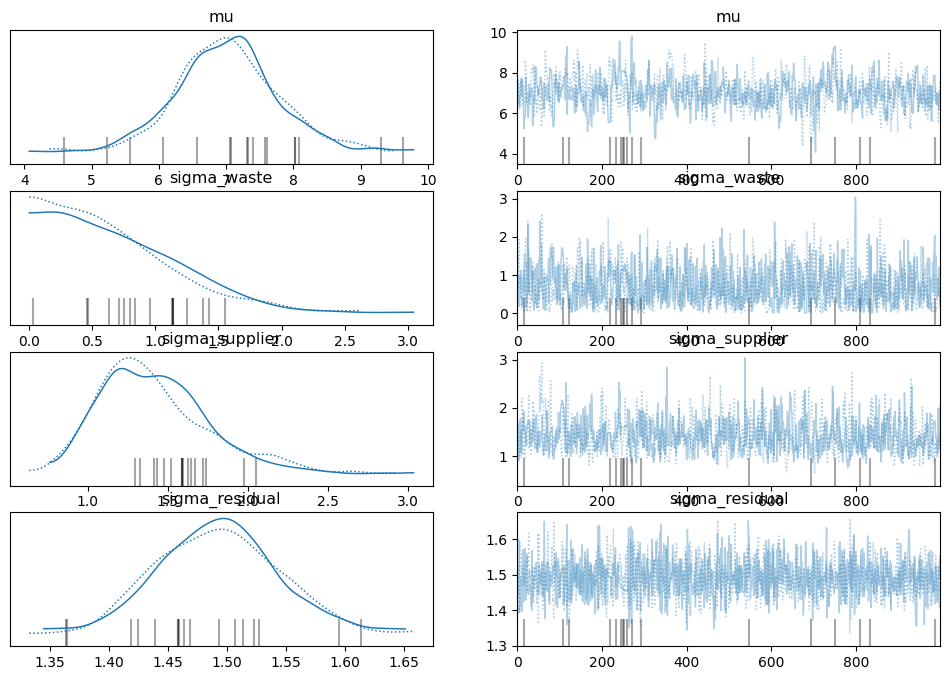

In [ ]:
# hierarchical model
import pandas as pd
import pymc as pm
import arviz as az
import numpy as np

df_model = pd.read_csv("loads_copy.csv")

df_model['waste_idx'] = pd.Categorical(df_model['Waste Type']).codes
df_model['supplier_idx'] = pd.Categorical(df_model['Supplier']).codes

n_waste = df_model['waste_idx'].nunique()
n_supplier = df_model['supplier_idx'].nunique()
y = df_model['Mean_TOC'].values

with pm.Model() as hierarchical_model:
    # Hyperpriors for group-level intercept std devs
    sigma_waste = pm.HalfNormal('sigma_waste', sigma=1)
    sigma_supplier = pm.HalfNormal('sigma_supplier', sigma=1)
    sigma_residual = pm.HalfNormal('sigma_residual', sigma=1)

    # Group-level intercepts
    waste_offset = pm.Normal('waste_offset', mu=0, sigma=1, shape=n_waste)
    supplier_offset = pm.Normal('supplier_offset', mu=0, sigma=1, shape=n_supplier)

    # Intercepts with varying effects
    waste_intercept = waste_offset * sigma_waste
    supplier_intercept = supplier_offset * sigma_supplier

    # Overall intercept
    mu = pm.Normal('mu', mu=np.mean(y), sigma=10)

    # Expected value
    theta = mu + waste_intercept[df_model['waste_idx'].values] + supplier_intercept[df_model['supplier_idx'].values]

    # Likelihood
    y_obs = pm.Normal('y_obs', mu=theta, sigma=sigma_residual, observed=y)

    # Sample from posterior
    trace = pm.sample(1000, tune=1000, target_accept=0.9, return_inferencedata=True)

# Summarize and plot
az.summary(trace, var_names=['mu', 'sigma_waste', 'sigma_supplier', 'sigma_residual'])
az.plot_trace(trace, var_names=['mu', 'sigma_waste', 'sigma_supplier', 'sigma_residual'])


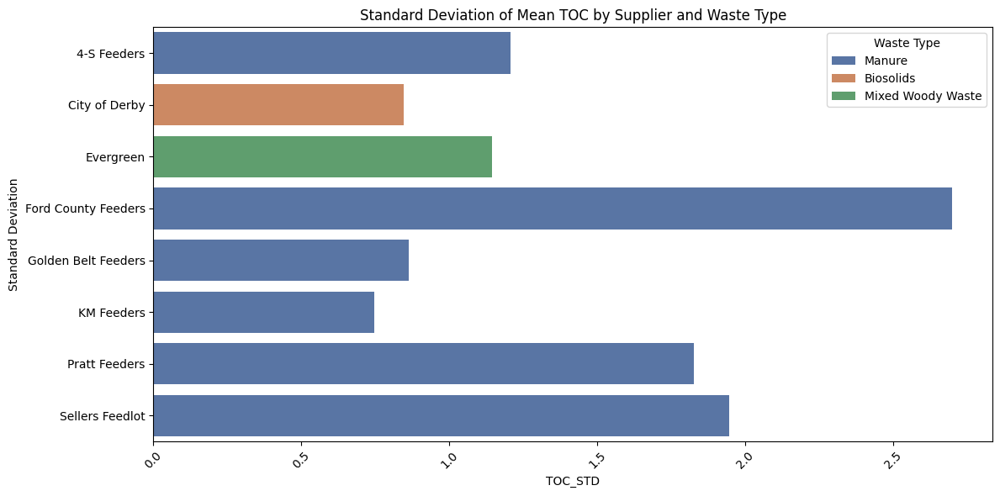

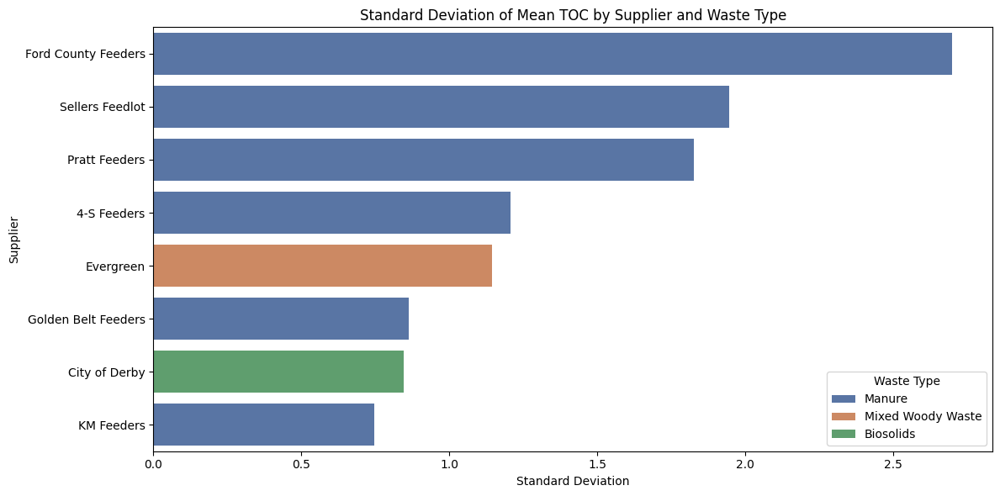

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
df = pd.read_csv("loads_copy.csv")

# Group by Supplier and Waste Type, calculate standard deviation of Mean_TOC
grouped_std = df.groupby(['Supplier', 'Waste Type'])['Mean_TOC'].std().reset_index()
grouped_std.columns = ['Supplier', 'Waste Type', 'TOC_STD']

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(data=grouped_std, y='Supplier', x='TOC_STD', hue='Waste Type', palette='deep')
plt.title("Standard Deviation of Mean TOC by Supplier and Waste Type")
plt.ylabel("Standard Deviation")
plt.xticks(rotation=45)
plt.legend(title='Waste Type')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))

# Sort by TOC_STD before plotting
sorted_df = grouped_std.sort_values('TOC_STD', ascending=False)

sns.barplot(
    data=sorted_df,
    y='Supplier',
    x='TOC_STD',
    hue='Waste Type',
    palette='deep'
)

plt.title("Standard Deviation of Mean TOC by Supplier and Waste Type")
plt.xlabel("Standard Deviation")
plt.ylabel("Supplier")
plt.legend(title='Waste Type')
plt.tight_layout()
plt.show()


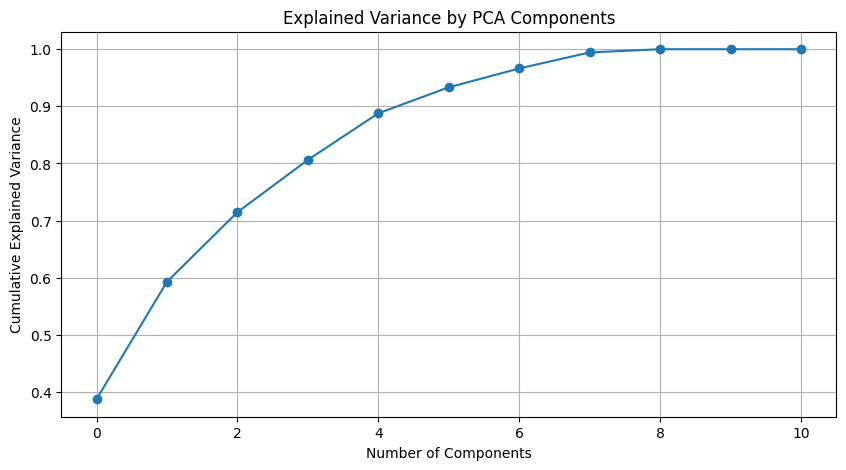

Top contributing features to PC1:
Beginning Processing Meter Readout (KWH)     0.445482
Ending Processing Meter Readout (KWH)        0.445474
Ending Office Meter Readout (KWH)            0.366845
Beginning Office Meter Readout (KWH)         0.366838
Supplier_Code                                0.341407
Front Loader Diesel Consumption (gallons)    0.267796
Mean_TOC                                     0.247966
Waste_Code                                   0.240899
Waste in Load (metric ton)                   0.102946
Mean_Moisture                                0.092381
dtype: float64
['Beginning Processing Meter Readout (KWH)', 'Ending Processing Meter Readout (KWH)', 'Ending Office Meter Readout (KWH)', 'Beginning Office Meter Readout (KWH)', 'Supplier_Code']


In [ ]:
# pca

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv("loads_copy.csv")
df['Date'] = pd.to_datetime(df['Date'])
df = df.dropna(subset=['Mean_TOC', 'Waste Type', 'Supplier'])

# categorical variables
df['Waste_Code'] = LabelEncoder().fit_transform(df['Waste Type'])
df['Supplier_Code'] = LabelEncoder().fit_transform(df['Supplier'])
df['Truck Vaulted Id'] = LabelEncoder().fit_transform(df['Truck Vaulted Id'])

# Step 3: Select numeric columns for PCA
exclude_cols = ['Date', 'Waste Type', 'Supplier', 'Truck Vaulted Id']  # exclude non-numeric or already encoded
numerical_df = df.drop(columns=exclude_cols)
numerical_df = numerical_df.dropna()  # drop rows with missing numeric features

# Standardize the numeric features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(numerical_df)

pca = PCA()
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 5))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("Explained Variance by PCA Components")
plt.grid(True)
plt.show()

loading_scores = pd.Series(pca.components_[0], index=numerical_df.columns)
sorted_loading = loading_scores.abs().sort_values(ascending=False)

print("Top contributing features to PC1:")
print(sorted_loading.head(10))

top_features = sorted_loading.head(5).index.tolist()
print(top_features)

All Features Ranked by Importance:
                                       Feature  Importance
4        Beginning Office Meter Readout (KWH)    0.215042
5           Ending Office Meter Readout (KWH)    0.203735
7                               Mean_Moisture    0.147461
8                            Supplier_encoded    0.106078
1                  Waste in Load (metric ton)    0.079881
3       Ending Processing Meter Readout (KWH)    0.072347
2    Beginning Processing Meter Readout (KWH)    0.066048
10                   Truck Vaulted Id_encoded    0.045791
6   Front Loader Diesel Consumption (gallons)    0.037565
0               Processing Elapsed Time (min)    0.022272
9                          Waste Type_encoded    0.003781


/tmp/ipython-input-2-1274558217.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=feature_importance_df, x='Importance', y='Feature', palette='Blues_d')


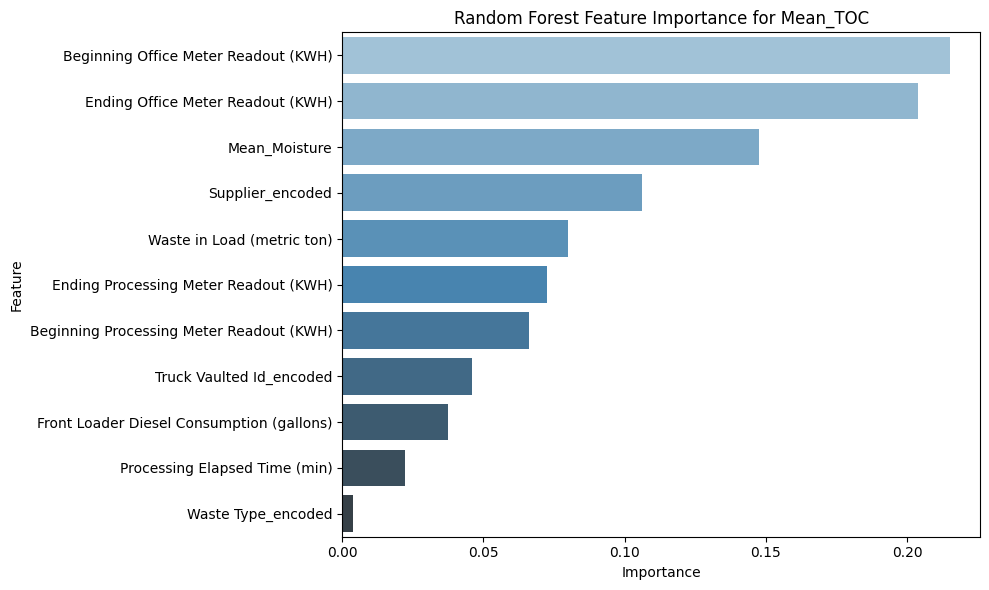

In [ ]:
# random forest

import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv("loads_copy.csv")
df = df.dropna()

# categorical variables
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df[col + '_encoded'] = le.fit_transform(df[col])

feature_cols = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Beginning Processing Meter Readout (KWH)',
    'Ending Processing Meter Readout (KWH)',
    'Beginning Office Meter Readout (KWH)',
    'Ending Office Meter Readout (KWH)',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]

# X and y
X = df[feature_cols]
y = df['Mean_TOC']

# Split into train/test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Random Forest
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Feature importances
importances = rf.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': feature_cols,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# important features
print("All Features Ranked by Importance:\n", feature_importance_df)

plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importance_df, x='Importance', y='Feature', palette='Blues_d')
plt.title('Random Forest Feature Importance for Mean_TOC')
plt.tight_layout()
plt.show()


All Features Ranked by Importance:
                                      Feature  Importance
5                              Mean_Moisture    0.237829
0              Processing Elapsed Time (min)    0.232681
1                 Waste in Load (metric ton)    0.148463
8                   Truck Vaulted Id_encoded    0.128997
6                           Supplier_encoded    0.093615
3            Office_Meter_Readout_Difference    0.067065
4  Front Loader Diesel Consumption (gallons)    0.056661
2        Processing_Meter_Readout_Difference    0.027437
7                         Waste Type_encoded    0.007253


/tmp/ipython-input-1-2733983583.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=feature_importance_df, x='Importance', y='Feature', palette='Blues_d')


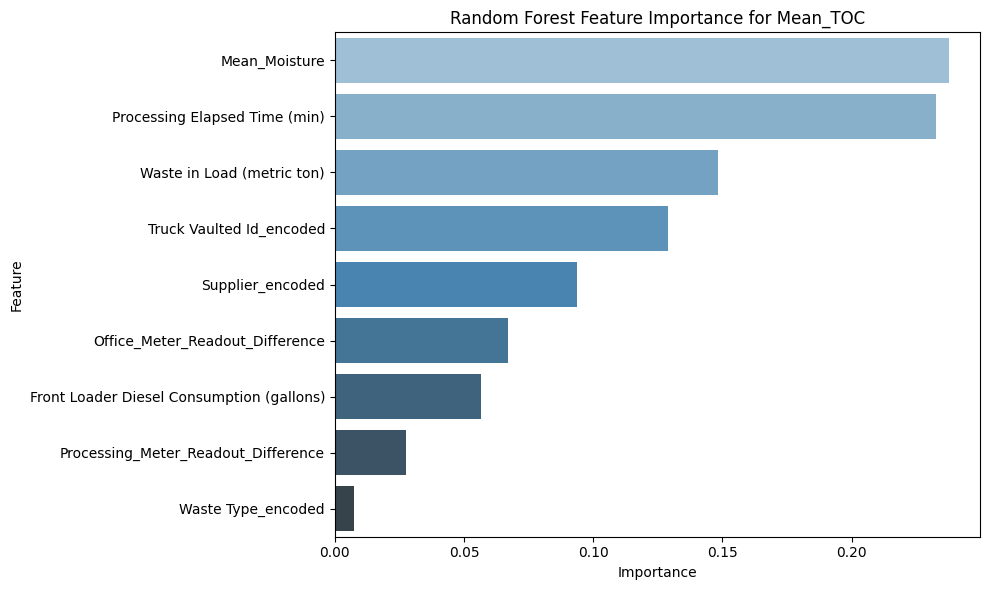

In [ ]:
# random forest with readout diff

import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv("loads_copy1.csv")
df = df.dropna()

# categorical variables
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df[col + '_encoded'] = le.fit_transform(df[col])

feature_cols = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]

# X and y
X = df[feature_cols]
y = df['Mean_TOC']

# Split into train/test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Random Forest
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

# Feature importances
importances = rf.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': feature_cols,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# important features
print("All Features Ranked by Importance:\n", feature_importance_df)

plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importance_df, x='Importance', y='Feature', palette='Blues_d')
plt.title('Random Forest Feature Importance for Mean_TOC')
plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [12:30:39] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Feature Importances (XGBoost):
                                       Feature  Importance
8                            Supplier_encoded    0.543887
4        Beginning Office Meter Readout (KWH)    0.222382
7                               Mean_Moisture    0.062044
6   Front Loader Diesel Consumption (gallons)    0.053430
2    Beginning Processing Meter Readout (KWH)    0.051914
10                   Truck Vaulted Id_encoded    0.038278
1                  Waste in Load (metric ton)    0.014025
0               Processing Elapsed Time (min)    0.009710
9                          Waste Type_encoded    0.004330
5           Ending Office Meter Readout (KWH)    0.000000
3       Ending Processing Meter Readout (KWH)    0.000000

Selected Features (importance >= median):
- Beginning Processing Meter Readout (KWH)
- Beginning Office Meter Readout (KWH)
- Front Loader Diesel Consumption (gallons)
- Mean_Moisture
- Supplier_encoded
- Truck Vaulted Id_encoded


/tmp/ipython-input-6-738118226.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=importance_df_sorted, palette='viridis')


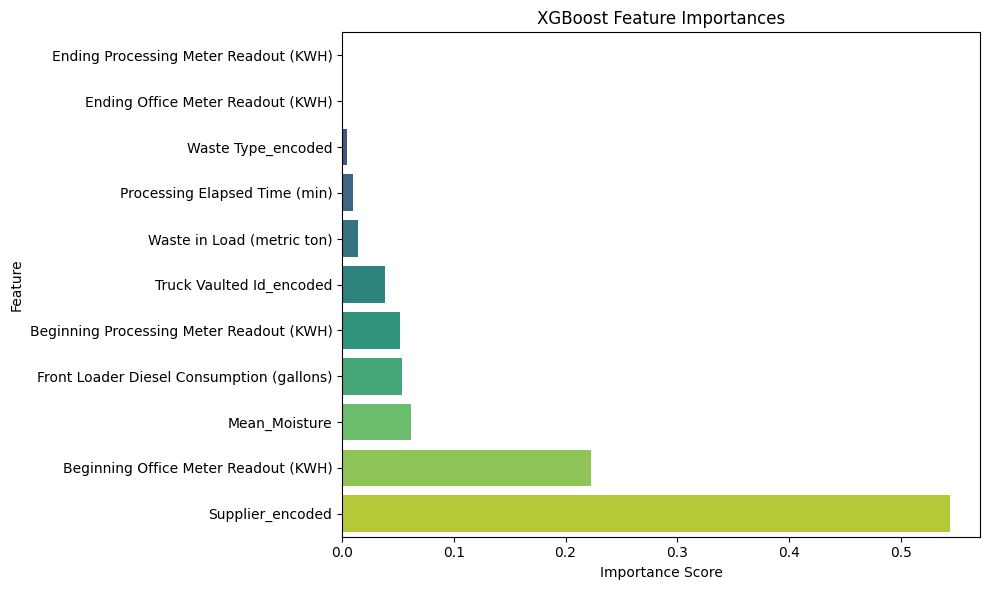

In [ ]:
# xgboost

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectFromModel
import xgboost as xgb

df = pd.read_csv("loads_copy.csv")
df = df.dropna()

# categorical features
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df[col + '_encoded'] = le.fit_transform(df[col])

feature_cols = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Beginning Processing Meter Readout (KWH)',
    'Ending Processing Meter Readout (KWH)',
    'Beginning Office Meter Readout (KWH)',
    'Ending Office Meter Readout (KWH)',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]

X = df[feature_cols]
y = df['Mean_TOC']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train XGBoost model
xgb_model = xgb.XGBRegressor(n_estimators=100, random_state=42, use_label_encoder=False, eval_metric='rmse')
xgb_model.fit(X_train, y_train)

# Feature importances
importances = xgb_model.feature_importances_
importance_df = pd.DataFrame({
    'Feature': feature_cols,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Print ranked features
print("Feature Importances (XGBoost):\n", importance_df)

# Select features using median threshold
selector = SelectFromModel(xgb_model, threshold='median', prefit=True)
selected_features = X.columns[selector.get_support()].tolist()

print("\nSelected Features (importance >= median):")
for feature in selected_features:
    print(f"- {feature}")

import matplotlib.pyplot as plt
import seaborn as sns

# Sort the importance dataframe
importance_df_sorted = importance_df.sort_values(by='Importance', ascending=True)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df_sorted, palette='viridis')
plt.title('XGBoost Feature Importances')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

/usr/local/lib/python3.11/dist-packages/xgboost/training.py:183: UserWarning: [16:44:05] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/tmp/ipython-input-461823113.py:65: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Importance', y='Feature', data=importance_df_sorted, palette='viridis')


Feature Importances (XGBoost):
                                      Feature  Importance
6                           Supplier_encoded    0.463506
0              Processing Elapsed Time (min)    0.174300
8                   Truck Vaulted Id_encoded    0.089308
5                              Mean_Moisture    0.082780
4  Front Loader Diesel Consumption (gallons)    0.061513
1                 Waste in Load (metric ton)    0.049292
3            Office_Meter_Readout_Difference    0.039120
2        Processing_Meter_Readout_Difference    0.022045
7                         Waste Type_encoded    0.018137

Selected Features (importance >= median):
- Processing Elapsed Time (min)
- Front Loader Diesel Consumption (gallons)
- Mean_Moisture
- Supplier_encoded
- Truck Vaulted Id_encoded


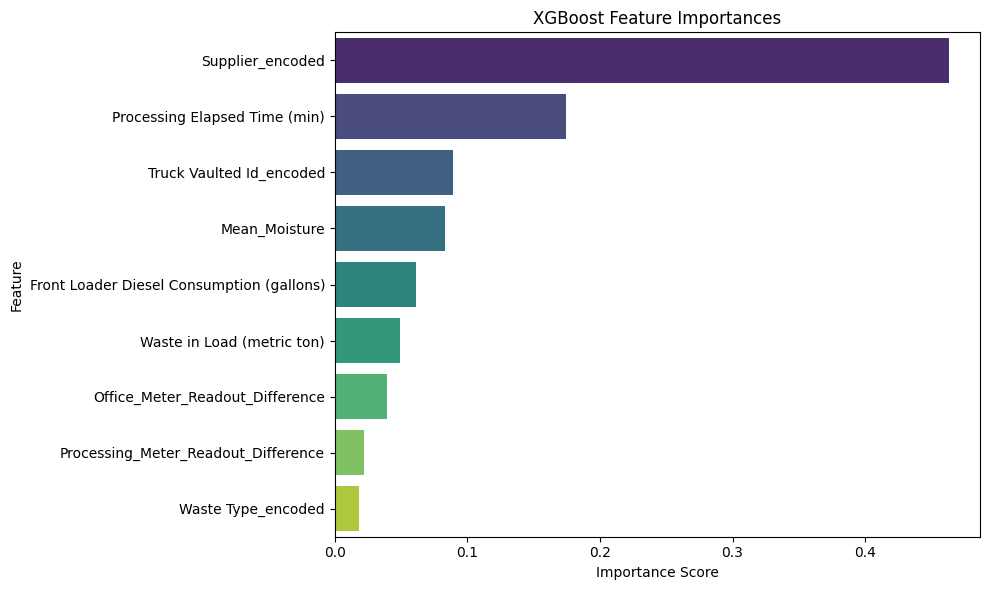

In [ ]:
# xgboost with readout differences

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectFromModel
import xgboost as xgb

df = pd.read_csv("loads_copy1.csv")
df = df.dropna()

# categorical features
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df[col + '_encoded'] = le.fit_transform(df[col])

feature_cols = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]

X = df[feature_cols]
y = df['Mean_TOC']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train XGBoost model
xgb_model = xgb.XGBRegressor(n_estimators=100, random_state=42, use_label_encoder=False, eval_metric='rmse')
xgb_model.fit(X_train, y_train)

# Feature importances
importances = xgb_model.feature_importances_
importance_df = pd.DataFrame({
    'Feature': feature_cols,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Print ranked features
print("Feature Importances (XGBoost):\n", importance_df)

# Select features using median threshold
selector = SelectFromModel(xgb_model, threshold='median', prefit=True)
selected_features = X.columns[selector.get_support()].tolist()

print("\nSelected Features (importance >= median):")
for feature in selected_features:
    print(f"- {feature}")

import matplotlib.pyplot as plt
import seaborn as sns

# Sort the importance dataframe
importance_df_sorted = importance_df.sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df_sorted, palette='viridis')
plt.title('XGBoost Feature Importances')
plt.xlabel('Importance Score')
plt.ylabel('Feature')
plt.tight_layout()
plt.show()

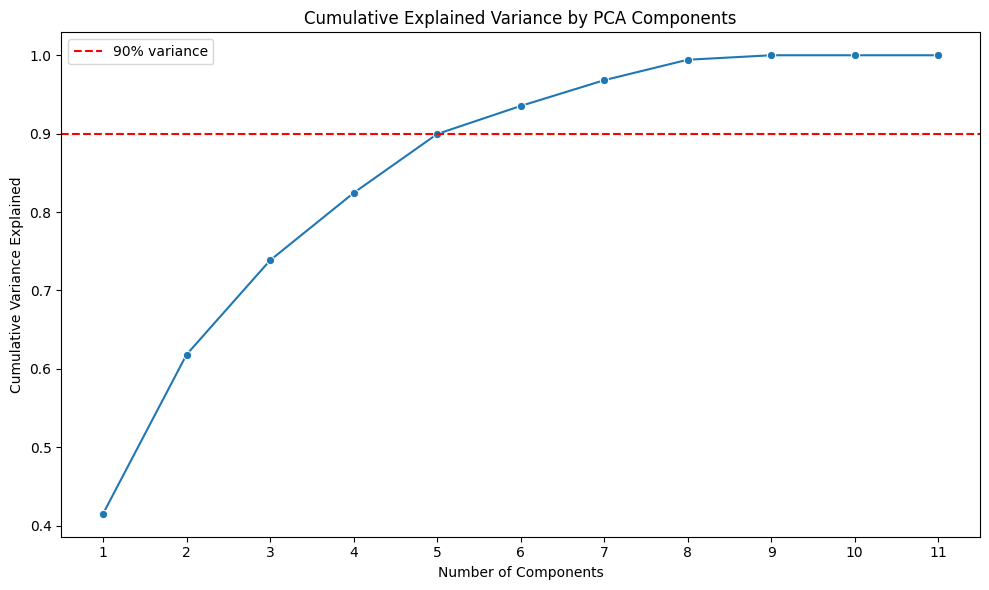

Component 1: 0.4150 variance explained
Component 2: 0.2031 variance explained
Component 3: 0.1202 variance explained
Component 4: 0.0860 variance explained
Component 5: 0.0752 variance explained
Component 6: 0.0358 variance explained
Component 7: 0.0329 variance explained
Component 8: 0.0261 variance explained
Component 9: 0.0057 variance explained
Component 10: 0.0000 variance explained
Component 11: 0.0000 variance explained


In [ ]:
# start of pca
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Load dataset
df = pd.read_csv("loads_copy.csv")
df = df.dropna()

# Encode categorical variables
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df[col + '_encoded'] = le.fit_transform(df[col])

# Select features for PCA (exclude 'Date' and target 'Mean_TOC')
pca_features = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Beginning Processing Meter Readout (KWH)',
    'Ending Processing Meter Readout (KWH)',
    'Beginning Office Meter Readout (KWH)',
    'Ending Office Meter Readout (KWH)',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]

# Standardize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[pca_features])

# Apply PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Explained variance
explained_var = pca.explained_variance_ratio_
cumulative_var = explained_var.cumsum()

# Plot explained variance
plt.figure(figsize=(10, 6))
sns.lineplot(x=range(1, len(explained_var)+1), y=cumulative_var, marker='o')
plt.axhline(y=0.9, color='r', linestyle='--', label='90% variance')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance Explained')
plt.xticks(range(1, len(explained_var)+1))
plt.legend()
plt.tight_layout()
plt.show()

# Optional: print variance explained by each component
for i, var in enumerate(explained_var, 1):
    print(f"Component {i}: {var:.4f} variance explained")


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split

# Load and preprocess data
df = pd.read_csv("loads_copy.csv").dropna()

# Encode categorical features
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df[col + '_encoded'] = le.fit_transform(df[col])

# Select features
pca_features = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Beginning Processing Meter Readout (KWH)',
    'Ending Processing Meter Readout (KWH)',
    'Beginning Office Meter Readout (KWH)',
    'Ending Office Meter Readout (KWH)',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df[pca_features])

# Apply PCA: keep top 5 components
pca = PCA(n_components=5)
X_pca = pca.fit_transform(X_scaled)

# Convert PCA results into DataFrame
pca_df = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(5)])

# Append target variable
pca_df['Mean_TOC'] = df['Mean_TOC'].reset_index(drop=True)

# Optional: train/test split
X = pca_df.drop('Mean_TOC', axis=1)
y = pca_df['Mean_TOC']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Confirm output
print(pca_df.head())


        PC1       PC2       PC3       PC4       PC5   Mean_TOC
0  3.274097  0.226983 -0.205284 -2.140871  0.669002  12.906667
1  2.910577 -0.406441  0.092891 -0.862932 -0.379054  11.856667
2  1.863290  0.089178 -1.459230 -2.685142  0.628041  11.416667
3  2.672038  0.044993 -0.287432 -1.862611 -0.578191  11.176667
4  2.413952  0.451846  0.012386 -0.752806  0.194424  13.556667


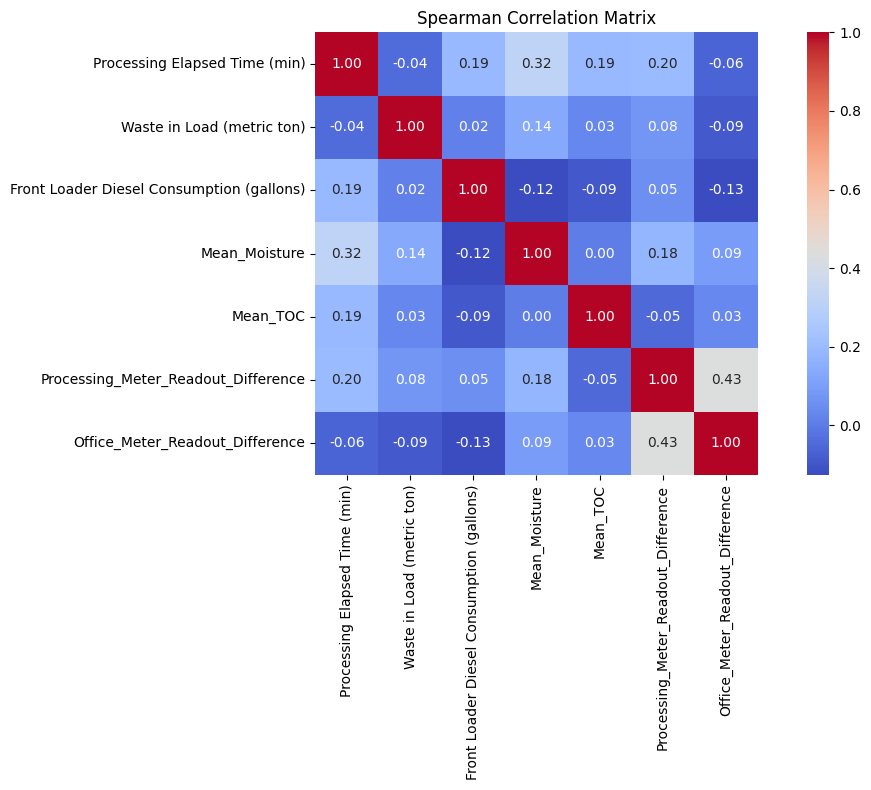

In [ ]:
# spearsman correlation matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df1 = pd.read_csv('loads_copy2.csv')
numeric_df1 = df1.select_dtypes(include=['number'])
numeric_df1 = numeric_df1.drop(columns = ['Truck Vaulted Id'])
spearman_corr1 = numeric_df1.corr(method='spearman')

plt.figure(figsize=(12, 8))
sns.heatmap(spearman_corr1, annot=True, cmap='coolwarm', fmt=".2f", square=True)
plt.title("Spearman Correlation Matrix")
plt.tight_layout()
plt.show()


Index(['Processing Elapsed Time (min)', 'Waste in Load (metric ton)',
       'Beginning Processing Meter Readout (KWH)',
       'Ending Processing Meter Readout (KWH)',
       'Beginning Office Meter Readout (KWH)',
       'Ending Office Meter Readout (KWH)',
       'Front Loader Diesel Consumption (gallons)', 'Truck Vaulted Id',
       'Mean_Moisture', 'Mean_TOC'],
      dtype='object')
[[-0.12099255 -0.1014674   0.45184317  0.45183594 -0.37557976 -0.37558611
   0.24539175  0.3712672  -0.12455566 -0.26655497]
 [ 0.61297906 -0.21271379  0.16796843  0.16803098  0.18321844  0.18321568
   0.02955654  0.11596566  0.61773145 -0.24394869]]
Index(['Date', 'Supplier', 'Waste Type', 'Processing Elapsed Time (min)',
       'Waste in Load (metric ton)',
       'Beginning Processing Meter Readout (KWH)',
       'Ending Processing Meter Readout (KWH)',
       'Beginning Office Meter Readout (KWH)',
       'Ending Office Meter Readout (KWH)',
       'Front Loader Diesel Consumption (gallons)', 'Truc

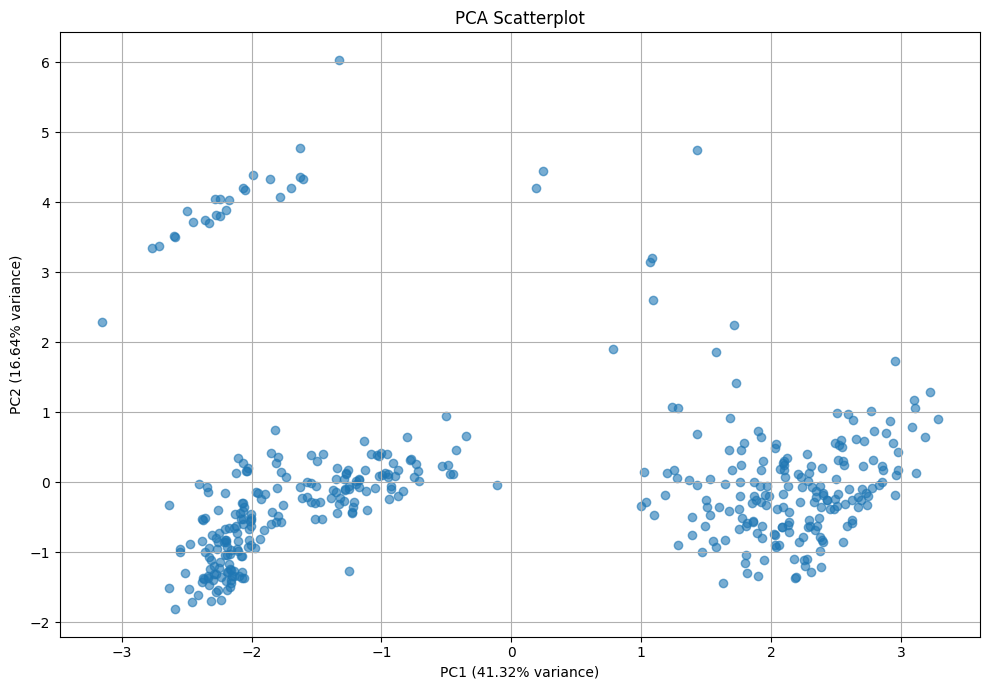

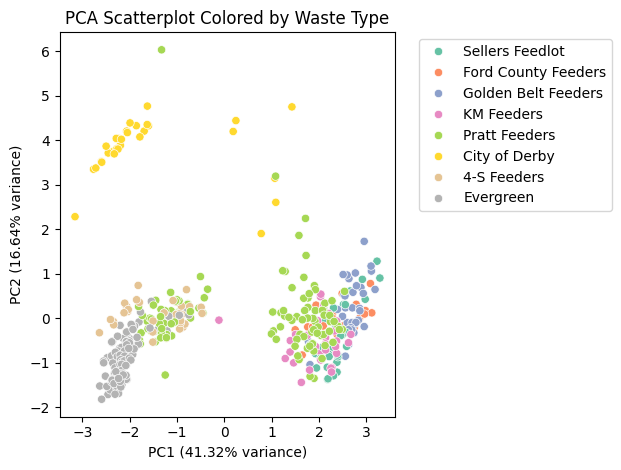

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# run with readout difference instead of beginning/ending
df = pd.read_csv('loads_copy.csv')

# numeric features
features = df.select_dtypes(include=['number']).dropna()
print(features.columns)

# standardization
scaler = StandardScaler()
scaled_features = scaler.fit_transform(features)

# Perform PCA (2 components for scatterplot)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_features)
print(pca.components_)
print(df.columns)

# create a scatterplot
plt.figure(figsize=(10, 7))
plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.6)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)")
plt.title("PCA Scatterplot")
plt.grid(True)
plt.tight_layout()
plt.show()

# colored by waste type
import seaborn as sns
df_filtered = df.dropna(subset=features.columns)

sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=df_filtered['Supplier'], palette='Set2')
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)")
plt.title("PCA Scatterplot Colored by Waste Type")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


[[-0.15459624 -0.06953281 -0.17136622 -0.19626427  0.49172814 -0.28803196
   0.54132444 -0.22925805  0.48273053]
 [-0.49424724  0.12630239 -0.28613336 -0.07131411 -0.16565174 -0.53180848
   0.01223247  0.56094536 -0.16655114]]
Index(['Date', 'Supplier', 'Waste Type', 'Processing Elapsed Time (min)',
       'Waste in Load (metric ton)',
       'Beginning Processing Meter Readout (KWH)',
       'Ending Processing Meter Readout (KWH)',
       'Beginning Office Meter Readout (KWH)',
       'Ending Office Meter Readout (KWH)',
       'Front Loader Diesel Consumption (gallons)', 'Truck Vaulted Id',
       'Mean_Moisture', 'Mean_TOC', 'Processing_Meter_Readout_Difference',
       'Office_Meter_Readout_Difference', 'Supplier_encoded',
       'Waste Type_encoded', 'Truck Vaulted Id_encoded'],
      dtype='object')


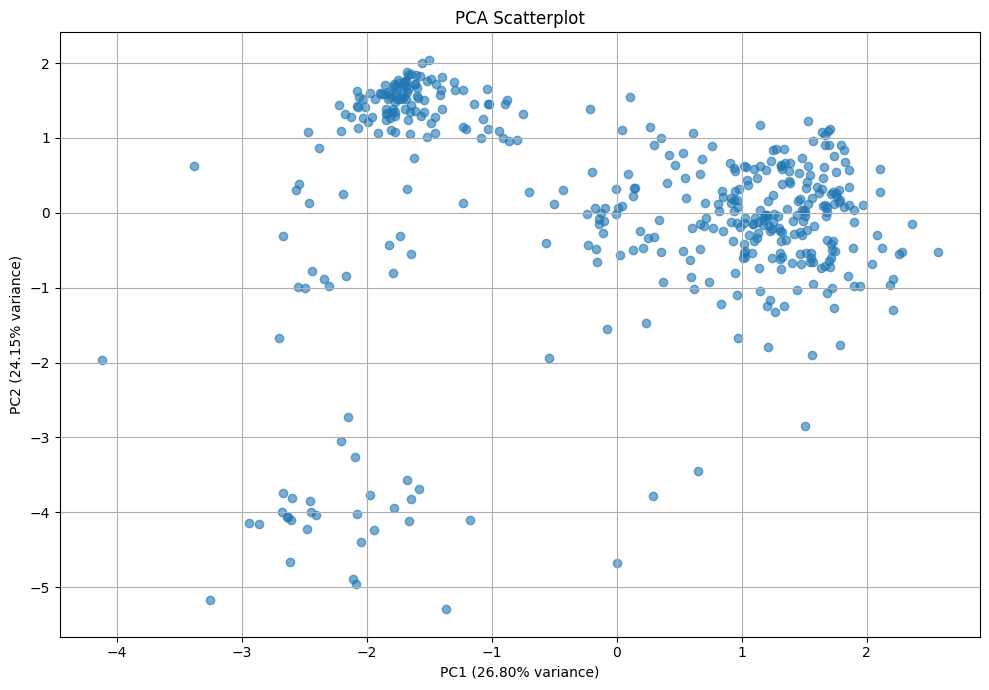

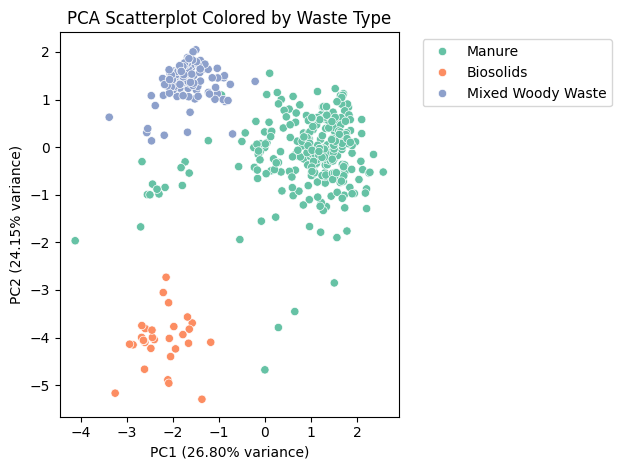

Top contributors to PC1:
Supplier_encoded                             0.541324
Front Loader Diesel Consumption (gallons)    0.491728
Truck Vaulted Id_encoded                     0.482731
Mean_Moisture                                0.288032
Waste Type_encoded                           0.229258
Name: PC1, dtype: float64

Top contributors to PC2:
Waste Type_encoded                     0.560945
Mean_Moisture                          0.531808
Processing Elapsed Time (min)          0.494247
Processing_Meter_Readout_Difference    0.286133
Truck Vaulted Id_encoded               0.166551
Name: PC2, dtype: float64


In [ ]:
# pca with readout difference
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, LabelEncoder

# run with readout difference instead of beginning/ending
df = pd.read_csv('loads_copy1.csv')

# Encode categorical features
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
  le = LabelEncoder()
  df[col + '_encoded'] = le.fit_transform(df[col])

# numeric features
features = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded',
]
df = df.dropna(subset=features)

# standardization
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[features])

# PCA (2 components)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_features)
print(pca.components_)
print(df.columns)

# scatterplot
plt.figure(figsize=(10, 7))
plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.6)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)")
plt.title("PCA Scatterplot")
plt.grid(True)
plt.tight_layout()
plt.show()

# colored by waste type
import seaborn as sns
df_filtered = df.dropna(subset=features)

sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=df_filtered['Waste Type'], palette='Set2')
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)")
plt.title("PCA Scatterplot Colored by Waste Type")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Put loadings into a DataFrame
loadings = pd.DataFrame(
    pca.components_.T,
    columns=['PC1', 'PC2'],
    index=features
)

# Show top contributors for PC1
print("Top contributors to PC1:")
print(loadings['PC1'].abs().sort_values(ascending=False).head(5))

# Show top contributors for PC2
print("\nTop contributors to PC2:")
print(loadings['PC2'].abs().sort_values(ascending=False).head(5))


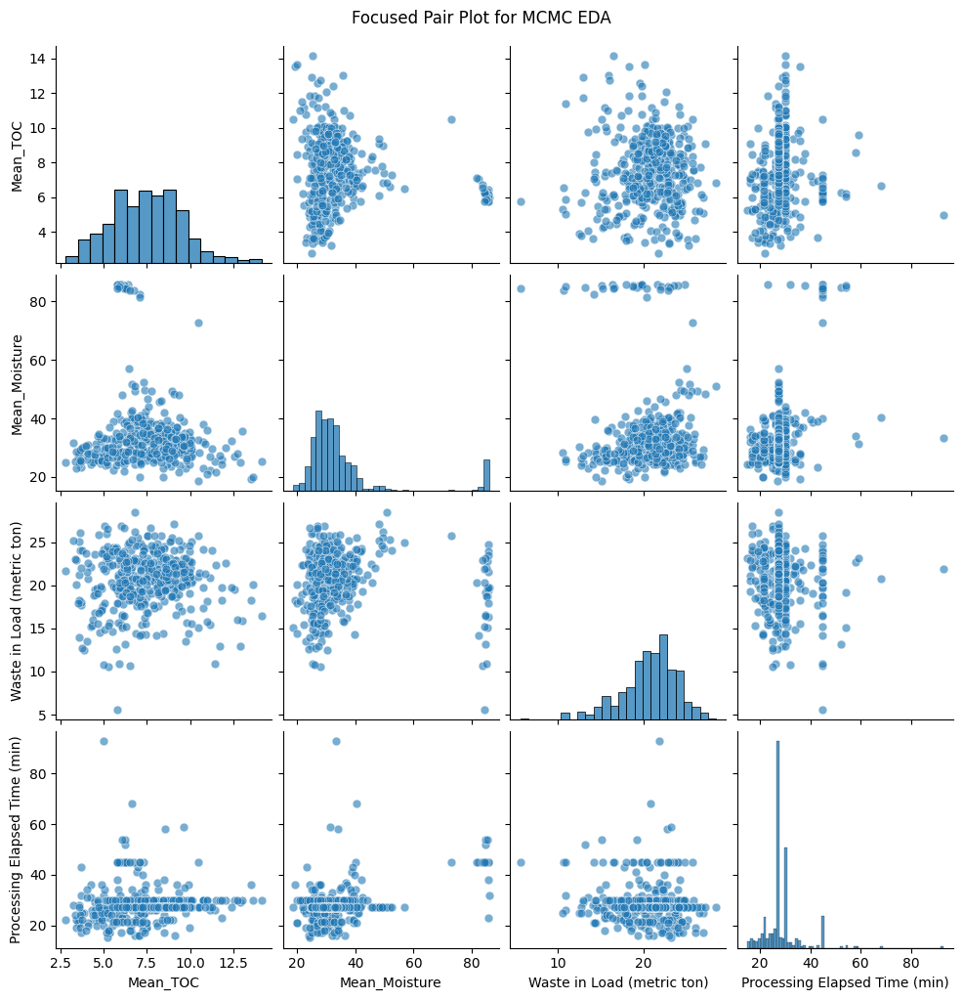

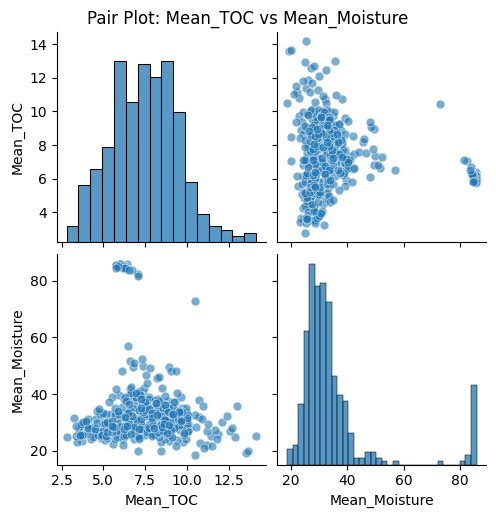

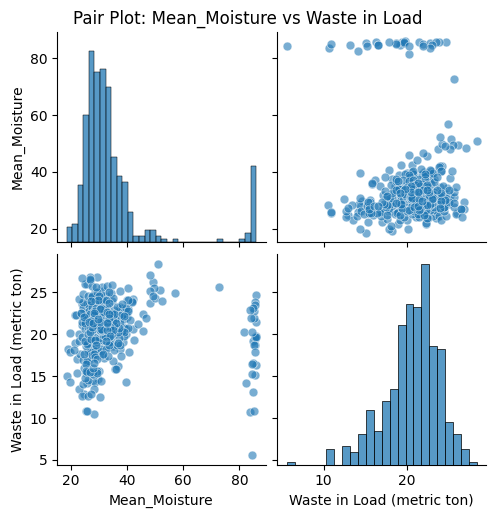

In [ ]:
# pair plots
import seaborn as sns
import pandas as pd

df = pd.read_csv('loads_copy2.csv')

# Select a few relevant numeric columns
# readout difference
# do spearman with the readout difference
numeric_cols = df.select_dtypes(include='number').dropna()

# sns.pairplot(numeric_cols, corner= True)

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your data
df = pd.read_csv("loads_copy2.csv")  # change to your actual file

# Select only the relevant variables
cols_to_plot = [
    "Mean_TOC",
    "Mean_Moisture",
    "Waste in Load (metric ton)",
    "Processing Elapsed Time (min)",
]

# Create the pair plot for just those variables
sns.pairplot(df[cols_to_plot], diag_kind='hist', plot_kws={'alpha':0.6, 's':40})
plt.suptitle("Focused Pair Plot for MCMC EDA", y=1.02)
plt.show()

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("loads_copy.csv")  # change file name if needed

# Choose just the two columns
cols_to_plot = ["Mean_TOC", "Mean_Moisture"]

# Create the pair plot
sns.pairplot(df[cols_to_plot], diag_kind='hist', plot_kws={'alpha':0.6, 's':40})
plt.suptitle("Pair Plot: Mean_TOC vs Mean_Moisture", y=1.02)
plt.show()

cols_to_plot2 = ['Mean_Moisture', 'Waste in Load (metric ton)',]
sns.pairplot(df[cols_to_plot2], diag_kind='hist', plot_kws={'alpha':0.6, 's':40})
plt.suptitle("Pair Plot: Mean_Moisture vs Waste in Load", y=1.02)
plt.show()


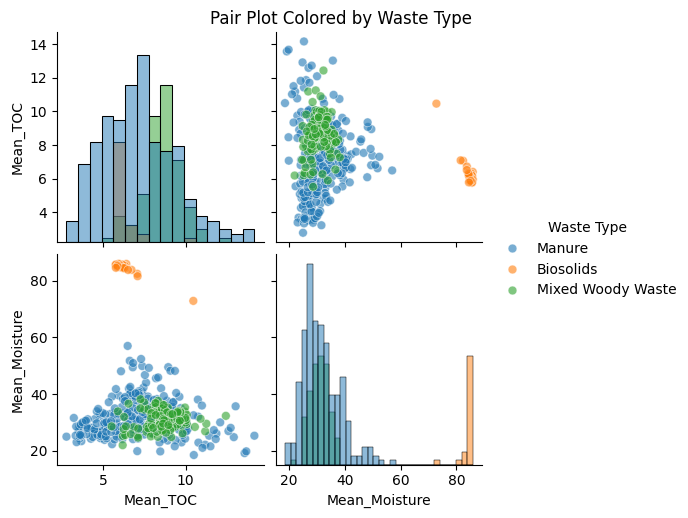

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Load your data
df = pd.read_csv("loads_copy2.csv")

# Pick columns you want + Waste Type for coloring
cols_to_plot = [
    "Mean_TOC",
    "Mean_Moisture",
    "Waste Type"   # include this just for hue
]

# Pairplot with hue
sns.pairplot(
    df[cols_to_plot],
    diag_kind='hist',
    hue="Waste Type",          # color by waste type
    plot_kws={'alpha':0.6, 's':40}
)

plt.suptitle("Pair Plot Colored by Waste Type", y=1.02)
plt.show()


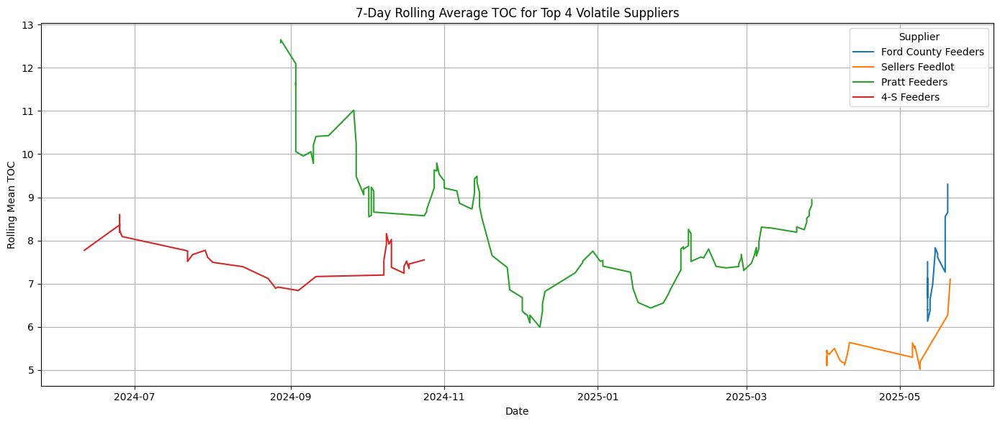

In [ ]:
# 7 day rolling window for top 4 volatile suppliers
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
df = pd.read_csv("loads_copy.csv")

# Ensure 'Date' is datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Drop missing values
df = df.dropna(subset=['Mean_TOC', 'Supplier'])

# Calculate standard deviation of TOC per supplier
supplier_std = df.groupby('Supplier')['Mean_TOC'].std().sort_values(ascending=False)

# Get top 4 most volatile suppliers
top_4_suppliers = supplier_std.head(4).index

# Filter the dataframe for those suppliers
df_top4 = df[df['Supplier'].isin(top_4_suppliers)].sort_values('Date')

# Plot 30-day rolling average TOC
plt.figure(figsize=(14, 6))
for supplier in top_4_suppliers:
    df_supplier = df_top4[df_top4['Supplier'] == supplier].copy()
    df_supplier['Rolling_Mean_TOC_30'] = df_supplier['Mean_TOC'].rolling(window=7, min_periods=1).mean()
    plt.plot(df_supplier['Date'], df_supplier['Rolling_Mean_TOC_30'], label=supplier)

plt.title('7-Day Rolling Average TOC for Top 4 Volatile Suppliers')
plt.xlabel('Date')
plt.ylabel('Rolling Mean TOC')
plt.legend(title='Supplier')
plt.grid(True)
plt.tight_layout()
plt.show()


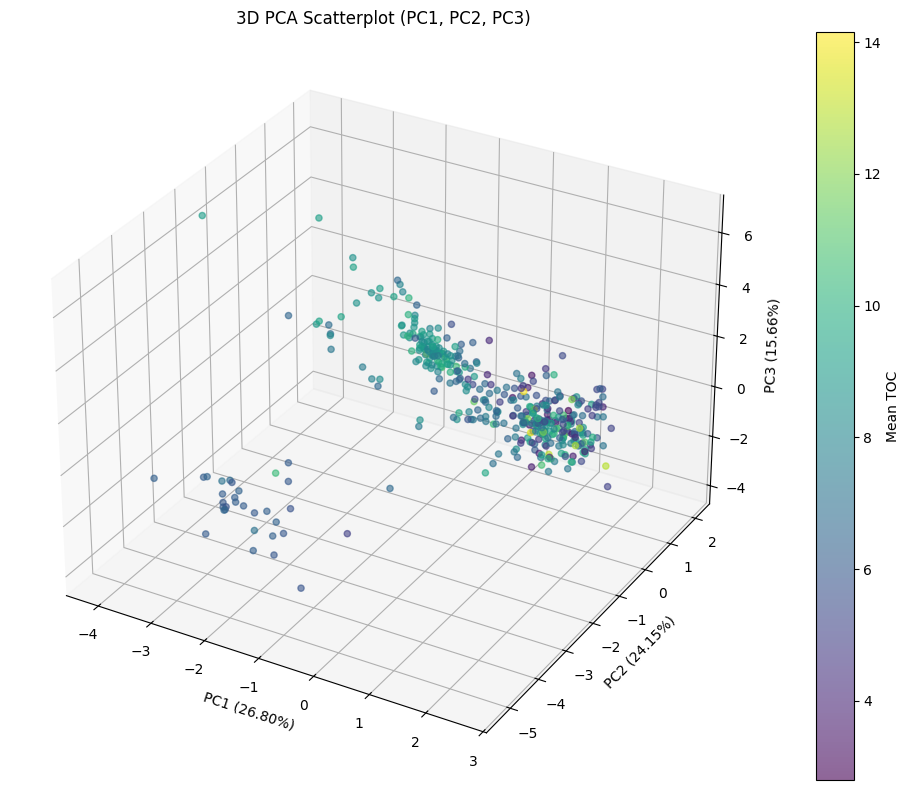

In [ ]:
# 3d pca
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

# Run PCA with 3 components instead of 2
pca = PCA(n_components=3)
pca_result = pca.fit_transform(scaled_features)

# Create 3D plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

sc = ax.scatter(
    pca_result[:, 0], pca_result[:, 1], pca_result[:, 2],
    c=df['Mean_TOC'], cmap='viridis', alpha=0.6
)

ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%})")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%})")
ax.set_zlabel(f"PC3 ({pca.explained_variance_ratio_[2]:.2%})")
ax.set_title("3D PCA Scatterplot (PC1, PC2, PC3)")
fig.colorbar(sc, label="Mean TOC")

plt.tight_layout()
plt.show()


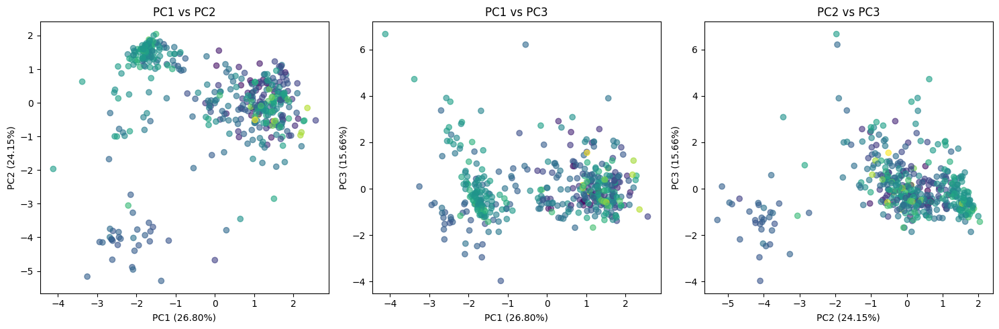

In [ ]:
plt.figure(figsize=(15, 5))

# PC1 vs PC2
plt.subplot(1, 3, 1)
plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.6, c=df['Mean_TOC'], cmap='viridis')
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%})")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%})")
plt.title("PC1 vs PC2")

# PC1 vs PC3
plt.subplot(1, 3, 2)
plt.scatter(pca_result[:, 0], pca_result[:, 2], alpha=0.6, c=df['Mean_TOC'], cmap='viridis')
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%})")
plt.ylabel(f"PC3 ({pca.explained_variance_ratio_[2]:.2%})")
plt.title("PC1 vs PC3")

# PC2 vs PC3
plt.subplot(1, 3, 3)
plt.scatter(pca_result[:, 1], pca_result[:, 2], alpha=0.6, c=df['Mean_TOC'], cmap='viridis')
plt.xlabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%})")
plt.ylabel(f"PC3 ({pca.explained_variance_ratio_[2]:.2%})")
plt.title("PC2 vs PC3")

plt.tight_layout()
plt.show()


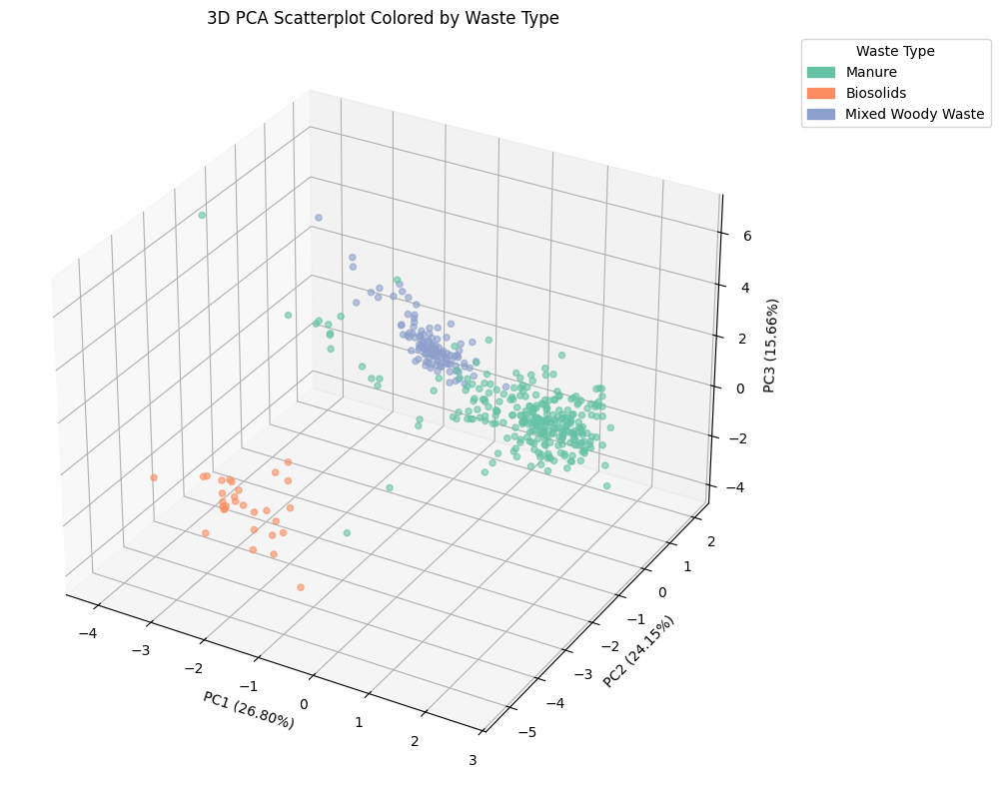

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import seaborn as sns

# Run PCA with 3 components
pca = PCA(n_components=3)
pca_result = pca.fit_transform(scaled_features)

# Create 3D scatterplot with seaborn color palette
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Get colors for Waste Type
waste_types = df['Waste Type'].astype(str)
palette = sns.color_palette("Set2", n_colors=waste_types.nunique())
color_dict = dict(zip(waste_types.unique(), palette))
colors = waste_types.map(color_dict)

sc = ax.scatter(
    pca_result[:, 0], pca_result[:, 1], pca_result[:, 2],
    c=colors, alpha=0.6
)

ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%})")
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%})")
ax.set_zlabel(f"PC3 ({pca.explained_variance_ratio_[2]:.2%})")
ax.set_title("3D PCA Scatterplot Colored by Waste Type")

# Create legend manually
from matplotlib.patches import Patch
handles = [Patch(color=val, label=key) for key, val in color_dict.items()]
ax.legend(handles=handles, title='Waste Type', loc='upper left', bbox_to_anchor=(1.05, 1))

plt.tight_layout()
plt.show()


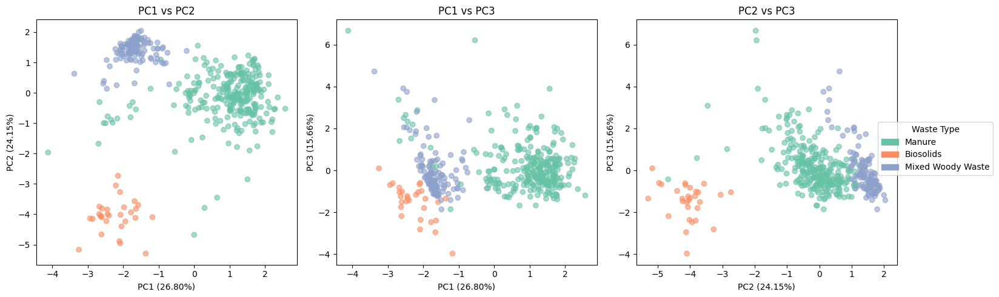

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 5))

# Waste type categories
waste_types = df['Waste Type'].astype(str)
palette = sns.color_palette("Set2", n_colors=waste_types.nunique())
color_dict = dict(zip(waste_types.unique(), palette))
colors = waste_types.map(color_dict)

# PC1 vs PC2
plt.subplot(1, 3, 1)
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=colors, alpha=0.6)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%})")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%})")
plt.title("PC1 vs PC2")

# PC1 vs PC3
plt.subplot(1, 3, 2)
plt.scatter(pca_result[:, 0], pca_result[:, 2], c=colors, alpha=0.6)
plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%})")
plt.ylabel(f"PC3 ({pca.explained_variance_ratio_[2]:.2%})")
plt.title("PC1 vs PC3")

# PC2 vs PC3
plt.subplot(1, 3, 3)
plt.scatter(pca_result[:, 1], pca_result[:, 2], c=colors, alpha=0.6)
plt.xlabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%})")
plt.ylabel(f"PC3 ({pca.explained_variance_ratio_[2]:.2%})")
plt.title("PC2 vs PC3")

# Shared legend
plt.figlegend(handles=[Patch(color=val, label=key) for key, val in color_dict.items()],
              title="Waste Type", loc="center right", bbox_to_anchor=(1.1, 0.5))

plt.tight_layout()
plt.show()


In [ ]:
# dimensionality reduction with pca
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Load your cleaned dataset
df = pd.read_csv("loads_copy1.csv")
df = df.dropna(subset=['Mean_TOC'])

# Encode categorical variables
label_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in label_cols:
    df[col + '_encoded'] = LabelEncoder().fit_transform(df[col])

# Drop unused columns (including target!)
X = df.drop(columns=['Mean_TOC'] + label_cols + ['Date']) # Exclude 'Date' column

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

from sklearn.decomposition import PCA

# Retain enough PCs to explain ~95% of variance
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_scaled)

# How many components were kept?
print(f"Number of components: {X_pca.shape[1]}")
import pymc as pm
import numpy as np

# Target
y = df['Mean_TOC'].values

with pm.Model() as model:
    # Priors on coefficients
    β = pm.Normal("β", mu=0, sigma=1, shape=X_pca.shape[1])
    intercept = pm.Normal("intercept", mu=0, sigma=10)

    # Linear model
    mu = intercept + pm.math.dot(X_pca, β)

    # Likelihood
    sigma = pm.HalfNormal("sigma", sigma=1)
    y_obs = pm.Normal("y_obs", mu=mu, sigma=sigma, observed=y)

    # Inference
    trace = pm.sample(1000, tune=1000, target_accept=0.95)

pca_df = pd.DataFrame(pca.components_, columns=X.columns)
pca_df.T.iloc[:, :3].sort_values(by=0, ascending=False)  # Top features in PC1

Number of components: 9


Output()

,0,1,2
Beginning Processing Meter Readout (KWH),0.429955,0.120928,-0.005999
Ending Processing Meter Readout (KWH),0.429942,0.121019,-0.005831
Truck Vaulted Id_encoded,0.354641,0.107197,-0.089913
Supplier_encoded,0.347404,-0.110918,-0.127781
Front Loader Diesel Consumption (gallons),0.278413,0.087322,-0.131608
Office_Meter_Readout_Difference,-0.051572,0.051588,0.669565
Processing_Meter_Readout_Difference,-0.060482,0.275793,0.516839
Processing Elapsed Time (min),-0.086944,0.478925,-0.028002
Waste in Load (metric ton),-0.098279,-0.100543,0.030797
Mean_Moisture,-0.112269,0.526233,0.080030


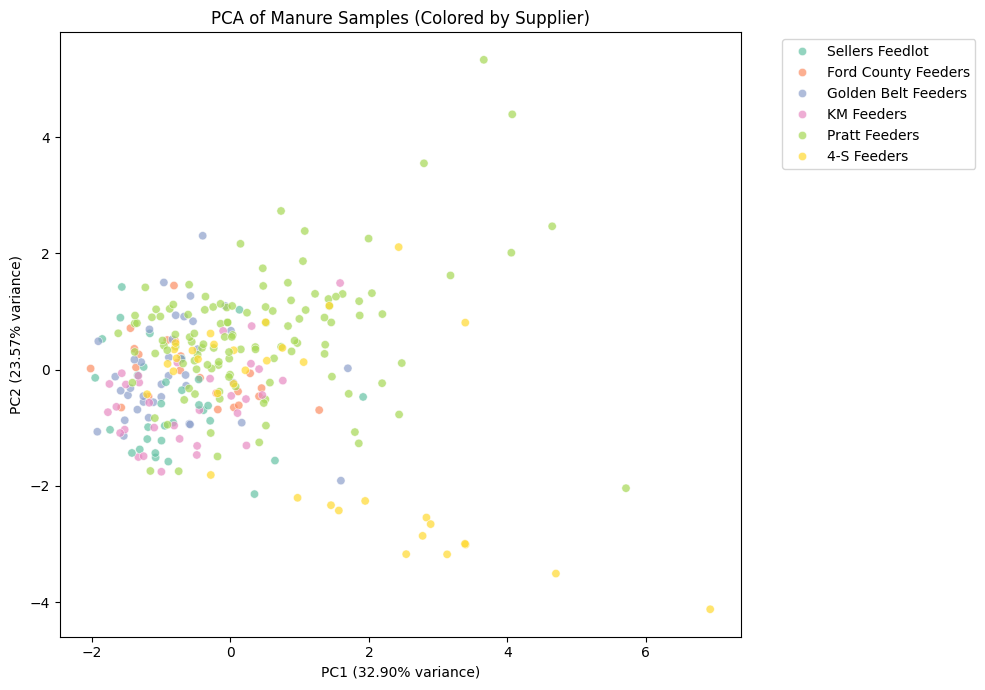

In [ ]:
# manure only

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

df = pd.read_csv('loads_copy1.csv')

# only manure samples
df_manure = df[df['Waste Type'].str.contains('Manure', case=False, na=False)]

features = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture'
]

df_manure = df_manure.dropna(subset=features)

# standardization
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df_manure[features])

pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_features)

pca_df = pd.DataFrame({
    'PC1': pca_result[:, 0],
    'PC2': pca_result[:, 1],
    'Supplier': df_manure['Supplier'],
    'Mean_TOC': df_manure['Mean_TOC']
})

# scatterplot colored by supplier
plt.figure(figsize=(10, 7))
sns.scatterplot(
    x='PC1', y='PC2',
    hue='Supplier',
    data=pca_df,
    palette='Set2',
    alpha=0.7
)

plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)")
plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)")
plt.title("PCA of Manure Samples (Colored by Supplier)")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()



Explained variance ratios: [0.26798184 0.24148722 0.15658148]


Output()

Output()

RMSE: 1.9347
MAE: 1.4536
            mean     sd  hdi_2.5%  hdi_97.5%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]   -0.245  0.063    -0.364     -0.117      0.001    0.001    6626.0   
beta[1]    0.297  0.064     0.172      0.425      0.001    0.001    5350.0   
beta[2]    0.050  0.080    -0.103      0.205      0.001    0.001    5468.0   
intercept  7.488  0.092     7.297      7.660      0.001    0.001    6326.0   
sigma      1.948  0.066     1.824      2.080      0.001    0.001    5691.0   

           ess_tail  r_hat  
beta[0]      2491.0    1.0  
beta[1]      2743.0    1.0  
beta[2]      3092.0    1.0  
intercept    3064.0    1.0  
sigma        3366.0    1.0  


array([[<Axes: title={'center': 'beta'}>,
        <Axes: title={'center': 'beta'}>],
       [<Axes: title={'center': 'intercept'}>,
        <Axes: title={'center': 'intercept'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>]], dtype=object)

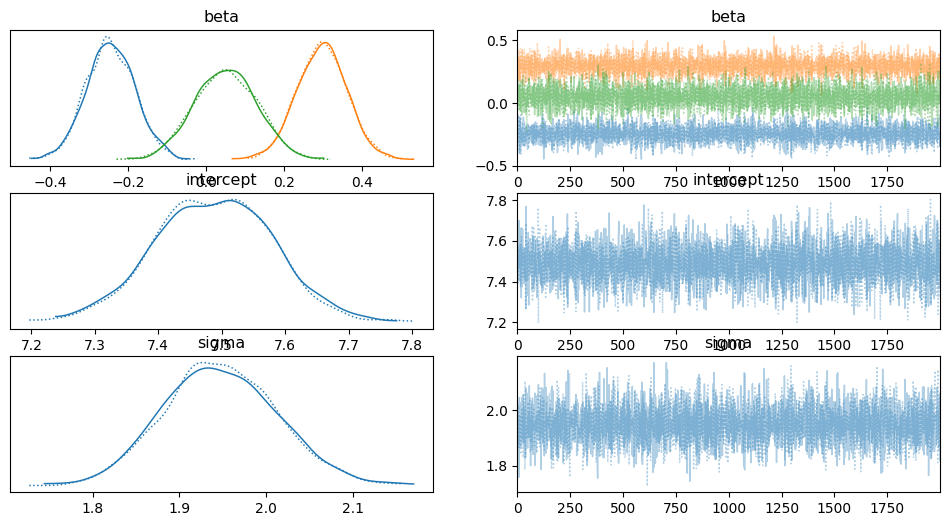

In [ ]:
# model
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
import pymc as pm
import arviz as az

df = pd.read_csv("loads_copy1.csv")

df = df.dropna()

# encode categorical variables
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df[col + '_encoded'] = le.fit_transform(df[col])

# features for PCA
features = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]

X = df[features]

# standardization
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Run PCA to reduce dimensionality
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

print("Explained variance ratios:", pca.explained_variance_ratio_)

# Target variable
y = df['Mean_TOC']

# mcmc model
with pm.Model() as model:
    # Priors for coefficients of PCs
    beta = pm.Normal('beta', mu=0, sigma=10, shape=X_pca.shape[1])
    intercept = pm.Normal('intercept', mu=0, sigma=10)

    # Expected value of y
    mu = intercept + pm.math.dot(X_pca, beta)

    # Likelihood (sampling distribution) of observations
    sigma = pm.HalfNormal('sigma', sigma=10)
    y_obs = pm.Normal('y_obs', mu=mu, sigma=sigma, observed=y)

    # Run the MCMC sampler
    trace = pm.sample(2000, tune=1000, target_accept=0.95, return_inferencedata=True)

with model:
    posterior_predictive = pm.sample_posterior_predictive(trace)

y_pred_samples = posterior_predictive.posterior_predictive["y_obs"].values
y_pred = y_pred_samples.mean(axis=(0, 1))

from sklearn.metrics import mean_squared_error, mean_absolute_error

mse = mean_squared_error(y, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y, y_pred)

print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")


# Summary of posterior
# print(az.summary(trace, hdi_prob=0.95))

# traceplot
# az.plot_trace(trace)

In [ ]:
# with k fold validation
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pymc as pm

# Load and preprocess data
df = pd.read_csv("loads_copy1.csv").dropna()

# Encode categorical variables
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df[col + '_encoded'] = le.fit_transform(df[col])

features = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]

X_all = df[features].values
y_all = df['Mean_TOC'].values

kf = KFold(n_splits=5, shuffle=True, random_state=42)

rmse_scores = []
mae_scores = []

for train_index, test_index in kf.split(X_all):
    # Split train/test fold
    X_train, X_test = X_all[train_index], X_all[test_index]
    y_train, y_test = y_all[train_index], y_all[test_index]

    # 1. Scale train features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)

    # 2. Fit PCA on train and transform
    pca = PCA(n_components=3)
    X_train_pca = pca.fit_transform(X_train_scaled)

    # 3. Scale and transform test data using train scaler & PCA
    X_test_scaled = scaler.transform(X_test)
    X_test_pca = pca.transform(X_test_scaled)

    # 4. Build PyMC model using train PCA data
    with pm.Model() as fold_model:
        beta = pm.Normal('beta', mu=0, sigma=10, shape=X_train_pca.shape[1])
        intercept = pm.Normal('intercept', mu=0, sigma=10)
        mu = intercept + pm.math.dot(X_train_pca, beta)
        sigma = pm.HalfNormal('sigma', sigma=10)
        y_obs = pm.Normal('y_obs', mu=mu, sigma=sigma, observed=y_train)

        # Sample from posterior
        trace = pm.sample(1000, tune=500, target_accept=0.9, cores=1, progressbar=False)

    # 5. Predict on test fold manually
    # Extract posterior samples for intercept and beta
    intercept_samples = trace.posterior['intercept'].stack(draws=("chain", "draw")).values
    beta_samples = trace.posterior['beta'].stack(draws=("chain", "draw")).values

    # Calculate predictions for each posterior sample
    y_preds = np.dot(beta_samples.T, X_test_pca.T) + intercept_samples

    # Average predictions over samples
    y_pred_mean = y_preds.mean(axis=0)

    # 6. Calculate RMSE and MAE for the fold
    rmse = mean_squared_error(y_test, y_pred_mean, squared=False)
    mae = mean_absolute_error(y_test, y_pred_mean)

    rmse_scores.append(rmse)
    mae_scores.append(mae)

# Final averaged metrics
print(f"Average RMSE over {kf.get_n_splits()} folds: {np.mean(rmse_scores):.4f}")
print(f"Average MAE over {kf.get_n_splits()} folds: {np.mean(mae_scores):.4f}")


ValueError: operands could not be broadcast together with shapes (2000,85) (2000,) 

In [ ]:
# training test split
import pandas as pd
from sklearn.preprocessing import LabelEncoder

df = pd.read_csv('loads_copy2.csv', parse_dates=['Date'])

# Encode categorical variables
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df[col + '_encoded'] = le.fit_transform(df[col])

df = df.sort_values('Date').reset_index(drop=True)

# date cutoff
train_cutoff = pd.Timestamp('2025-04-01')

# Split
df_train = df[df['Date'] < train_cutoff].copy()
df_test = df[df['Date'] >= train_cutoff].copy()

print(f"Training samples: {len(df_train)}")
print(f"Testing samples: {len(df_test)}")

y_train = df_train['Mean_TOC'].values
y_test = df_test['Mean_TOC'].values

# fit scale and pca
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

feature_cols = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]

window_size = 15

# rolling means in train set
for col in feature_cols:
    df_train[f'{col}_rollmean'] = df_train[col].rolling(window=window_size, min_periods=1).mean()

df_train = df_train.dropna(subset=[f'{col}_rollmean' for col in feature_cols])

# extract rolling features
X_train_rolling = df_train[[f'{col}_rollmean' for col in feature_cols]].values

# fit scaler and transform
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_rolling)

# fit PCA
pca = PCA(n_components=3)
X_train_pca = pca.fit_transform(X_train_scaled)

# prepare test features
X_test_rolling = df_test[[f'{col}_rollmean' for col in feature_cols]].values
X_test_scaled = scaler.transform(X_test_rolling)
X_test_pca = pca.transform(X_test_scaled)


Training samples: 321
Testing samples: 104


KeyError: "None of [Index(['Processing Elapsed Time (min)_rollmean',\n       'Waste in Load (metric ton)_rollmean',\n       'Processing_Meter_Readout_Difference_rollmean',\n       'Office_Meter_Readout_Difference_rollmean',\n       'Front Loader Diesel Consumption (gallons)_rollmean',\n       'Mean_Moisture_rollmean', 'Supplier_encoded_rollmean',\n       'Waste Type_encoded_rollmean', 'Truck Vaulted Id_encoded_rollmean'],\n      dtype='object')] are in the [columns]"

In [ ]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pymc as pm
import arviz as az

df = pd.read_csv('loads_copy2.csv', parse_dates=['Date'])
df = df.sort_values('Date').reset_index(drop=True)

# Encode categorical variables
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df[col + '_encoded'] = le.fit_transform(df[col])

# rolling window
window_size = 15
feature_cols = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]

# rolling mean features
for col in feature_cols:
    df[f'{col}_rollmean'] = df[col].rolling(window=window_size, min_periods=1).mean()

df = df.dropna(subset=[f'{col}_rollmean' for col in feature_cols])

# PCA
X_rolling = df[[f'{col}_rollmean' for col in feature_cols]].values

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_rolling)

pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

# Target variable
y = df['Mean_TOC'].values

# model
with pm.Model() as model:
    # Priors for regression coefficients and intercept
    intercept = pm.Normal('intercept', mu=0, sigma=10)
    coefs = pm.Normal('coefs', mu=0, sigma=5, shape=X_pca.shape[1])
    sigma = pm.HalfNormal('sigma', sigma=5)

    # Expected value of outcome
    mu = intercept + pm.math.dot(X_pca, coefs)

    # Likelihood
    y_obs = pm.Normal('y_obs', mu=mu, sigma=sigma, observed=y)

    # Sample posterior with NUTS
    trace = pm.sample(2000, tune=1000, target_accept=0.9)

az.summary(trace, var_names=['intercept', 'coefs', 'sigma'])

Output()

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept,7.486,0.089,7.318,7.650,0.001,0.001,5490.0,3267.0,1.0
coefs[0],0.414,0.050,0.323,0.509,0.001,0.001,5487.0,2625.0,1.0
coefs[1],0.277,0.057,0.166,0.377,0.001,0.001,4935.0,3404.0,1.0
coefs[2],-0.062,0.082,-0.211,0.096,0.001,0.001,4517.0,2888.0,1.0
sigma,1.838,0.063,1.720,1.955,0.001,0.001,5237.0,3376.0,1.0


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
import pymc as pm
import arviz as az

df = pd.read_csv("loads_copy2.csv")

# encode categorical variables (do this before anything)
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df[col + '_encoded'] = le.fit_transform(df[col])

# features for rolling mean (numeric + encoded)
feature_cols = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]

target_col = 'Mean_TOC'

# train-test split
train_size = int(len(df) * 0.8)
df_train = df.iloc[:train_size].copy()
df_test = df.iloc[train_size:].copy()

# rolling mean on train and test
window_size = 15
for col in feature_cols:
    df_train[f'{col}_rollmean'] = df_train[col].rolling(window=window_size, min_periods=1).mean()
    df_test[f'{col}_rollmean'] = df_test[col].rolling(window=window_size, min_periods=1).mean()

# drop rows with NaNs caused by rolling at start
df_train.dropna(subset=[f'{col}_rollmean' for col in feature_cols], inplace=True)
df_test.dropna(subset=[f'{col}_rollmean' for col in feature_cols], inplace=True)

# scaling and PCA
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(df_train[[f'{col}_rollmean' for col in feature_cols]])
X_test_scaled = scaler.transform(df_test[[f'{col}_rollmean' for col in feature_cols]])

# 95% variance components
pca = PCA(n_components=0.95)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

y_train = df_train[target_col].values
y_test = df_test[target_col].values

# MCMC Model
with pm.Model() as model:
    # Priors
    beta = pm.Normal('beta', mu=0, sigma=1, shape=X_train_pca.shape[1])
    intercept = pm.Normal('intercept', mu=0, sigma=1)
    sigma = pm.HalfNormal('sigma', sigma=1)

    # Expected value
    mu = intercept + pm.math.dot(X_train_pca, beta)

    # Likelihood
    y_obs = pm.Normal('y_obs', mu=mu, sigma=sigma, observed=y_train)

    # Sample from posterior
    trace = pm.sample(1000, tune=1000, target_accept=0.95, random_seed=42)

# ------------------------
# Predictions on test set
# ------------------------
with model:
    pm.set_data({'y_obs': None})
    y_pred_samples = np.dot(trace.posterior['beta'].mean(("chain","draw")).values, X_test_pca.T) \
                     + trace.posterior['intercept'].mean(("chain","draw")).values

# plot posterior predictive distribution
plt.figure(figsize=(12, 6))
plt.plot(y_test, label="Actual", marker='o')
plt.plot(y_pred_samples, label="Predicted (mean)", marker='x')
plt.xlabel("Test Sample")
plt.ylabel("Mean TOC")
plt.title("MCMC PCA Rolling Window Forecast")
plt.legend()
plt.show()

# traceplot
az.plot_trace(trace)
plt.show()


Output()

TypeError: The variable `y_obs` must be a `SharedVariable` (created through `pm.Data()` to allow updating.) The current type is: <class 'pytensor.tensor.variable.TensorVariable'>

In [ ]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_poly = poly.fit_transform(df[feature_cols])
interaction_names = poly.get_feature_names_out(feature_cols)

df_poly = pd.DataFrame(X_poly, columns=interaction_names)

# target variable to df_poly for correlation calculation
df_poly[target_col] = df[target_col]

# correlations
corr_with_target = df_poly.corr()[target_col].abs().sort_values(ascending=False)

# top interactions (excluding original features)
top_interactions = corr_with_target[~corr_with_target.index.isin(feature_cols)].head(5)
print("Top 5 interaction terms by absolute correlation with Mean_TOC:")
print(top_interactions)

Top 5 interaction terms by absolute correlation with Mean_TOC:
Mean_TOC                                               1.000000
Processing Elapsed Time (min) Waste Type_encoded       0.379107
Mean_Moisture Truck Vaulted Id_encoded                 0.344016
Mean_Moisture Waste Type_encoded                       0.337621
Waste in Load (metric ton) Truck Vaulted Id_encoded    0.334898
Name: Mean_TOC, dtype: float64


In [ ]:
# mcmc model
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt


df = pd.read_csv("loads_copy2.csv")
df = df.dropna()

# encode categorical variables (do this before anything)
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df[col + '_encoded'] = le.fit_transform(df[col])

# Feature columns
feature_cols = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]

target_col = 'Mean_TOC'

# rolling window features
window_size = 3
for col in feature_cols:
    df[f'{col}_rollmean'] = df[col].rolling(window=window_size, min_periods=1).mean()

rolling_cols = [f'{col}_rollmean' for col in feature_cols]

# train-test split (80 - 20 rn)

# Ensure Date is datetime
df['Date'] = pd.to_datetime(df['Date'])

# 80% quantile of dates
cutoff_date = df['Date'].quantile(0.8)
print(cutoff_date)

df_train = df[df['Date'] <= cutoff_date].copy()
df_test  = df[df['Date'] > cutoff_date].copy()

# scale + PCA
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(df_train[rolling_cols])
X_test_scaled = scaler.transform(df_test[rolling_cols])

pca = PCA(n_components=0.95)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

y_train = df_train[target_col].values
y_test = df_test[target_col].values

# mcmc model
with pm.Model() as model:
    X_data = pm.Data('X_data', X_train_pca)
    y_obs = pm.Data('y_obs', y_train) # Define y_obs as pm.Data

    beta = pm.Normal('beta', mu=0, sigma=10, shape=X_train_pca.shape[1])
    intercept = pm.Normal('intercept', mu=0, sigma=10)

    mu = pm.math.dot(X_data, beta) + intercept
    sigma = pm.HalfNormal('sigma', sigma=1)

    likelihood = pm.Normal('likelihood', mu=mu, sigma=sigma, observed=y_obs)

    trace = pm.sample(1000, tune=1000, target_accept=0.95, random_seed=42)

# predict on test set
with model:
    pm.set_data({'X_data': X_test_pca, 'y_obs': y_test}) # Update y_obs with y_test
    posterior_pred = pm.sample_posterior_predictive(trace, var_names=['likelihood'], return_inferencedata=False)

y_pred = posterior_pred['likelihood'].mean(axis=0)

#traceplot
az.summary(trace)

2025-04-07 00:00:00


Output()

Output()

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta[0],0.329,0.047,0.246,0.421,0.001,0.001,2851.0,1446.0,1.0
beta[1],-0.167,0.050,-0.255,-0.063,0.001,0.001,3585.0,1414.0,1.0
beta[2],-0.192,0.066,-0.311,-0.066,0.001,0.001,3116.0,1527.0,1.0
beta[3],-0.242,0.087,-0.401,-0.074,0.002,0.002,3030.0,1477.0,1.0
beta[4],0.662,0.109,0.462,0.868,0.002,0.002,3160.0,1748.0,1.0
beta[5],-0.283,0.124,-0.512,-0.053,0.002,0.003,3142.0,1310.0,1.0
beta[6],-0.115,0.146,-0.406,0.145,0.003,0.003,2982.0,1502.0,1.0
intercept,7.896,0.081,7.733,8.033,0.002,0.002,2430.0,1461.0,1.0
sigma,1.454,0.057,1.343,1.562,0.001,0.001,2707.0,1545.0,1.0


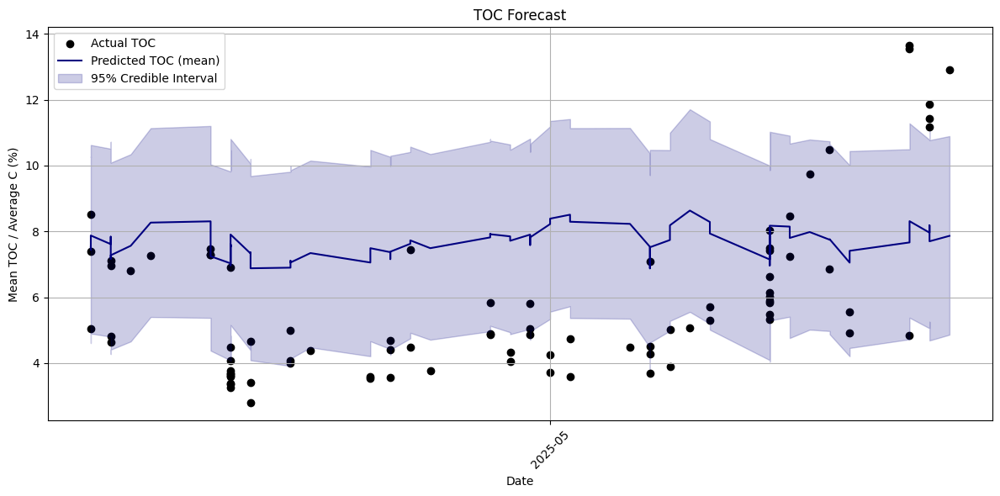

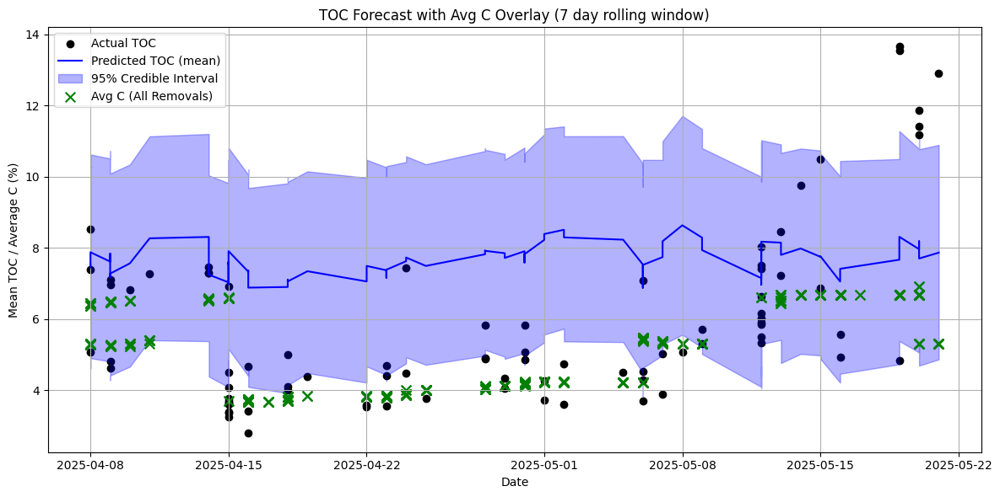

In [ ]:
# mcmc plot
import matplotlib.pyplot as plt
import numpy as np

average_c_df = pd.read_csv("average_c.csv")
average_c_df['Date'] = pd.to_datetime(average_c_df['Date'])
average_c_df = average_c_df[['Date', 'Average C value (all removals) (%)']].dropna()
average_c_df = average_c_df.rename(columns={'Average C value (all removals) (%)': 'Average_C'})

# Flatten posterior predictive samples: (chains*draws, n_test_points)
likelihood_samples = posterior_pred['likelihood'].reshape(-1, posterior_pred['likelihood'].shape[-1])

# Compute mean and 95% credible interval
y_pred_mean = likelihood_samples.mean(axis=0)
y_pred_lower = np.percentile(likelihood_samples, 2.5, axis=0)
y_pred_upper = np.percentile(likelihood_samples, 97.5, axis=0)

# Time axis (replace with your Date column if available)
if 'Date' in df_test.columns:
    time_axis = pd.to_datetime(df_test['Date'])
else:
    time_axis = df_test.index

plt.figure(figsize=(12, 6))

# Plot actual values
plt.scatter(time_axis, y_test, color="black", label="Actual TOC")

# Plot predicted mean
plt.plot(time_axis, y_pred_mean, color="navy", label="Predicted TOC (mean)")

# Shade 95% credible interval
plt.fill_between(time_axis, y_pred_lower, y_pred_upper, color="navy", alpha=0.2, label="95% Credible Interval")

# OPTIONAL: If you have a group average to overlay (like Avg C for Manure)
# plt.scatter(time_axis, average_c_df["Average_C"], marker="x", color="green", label="Avg C for Manure (%)")

import matplotlib.dates as mdates

# Format x-axis with monthly ticks
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

plt.xticks(rotation=45)

plt.xlabel("Date")
plt.ylabel("Mean TOC / Average C (%)")
plt.title("TOC Forecast")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


average_c_df = pd.read_csv("average_c.csv")
average_c_df['Date'] = pd.to_datetime(average_c_df['Date'])
average_c_df = average_c_df[['Date', 'Average C value (all removals) (%)']].dropna()
average_c_df = average_c_df.rename(columns={'Average C value (all removals) (%)': 'Average_C'})

import pandas as pd
import matplotlib.pyplot as plt

# Filter average_c_df to match forecast time range
avg_c_filtered = average_c_df[
    (average_c_df['Date'] >= time_axis.min()) &
    (average_c_df['Date'] <= time_axis.max())
]

# --- Forecast plot ---
plt.figure(figsize=(12, 6))

# Actual TOC
plt.scatter(time_axis, y_test, color='black', label='Actual TOC')

# Predicted mean
plt.plot(time_axis, y_pred_mean, color='blue', label='Predicted TOC (mean)')

# Credible interval
plt.fill_between(time_axis, y_pred_lower, y_pred_upper,
                 color='blue', alpha=0.3, label='95% Credible Interval')

# Overlay average C values (green X markers) only within range
plt.scatter(avg_c_filtered['Date'],
            avg_c_filtered['Average_C'],
            color='green', marker='x', s=70, label='Avg C (All Removals)')

# Labels and legend
plt.xlabel('Date')
plt.ylabel('Mean TOC / Average C (%)')
plt.title('TOC Forecast with Avg C Overlay (7 day rolling window)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


         Date             Supplier Waste Type  Processing Elapsed Time (min)  \
0  2025-05-21      Sellers Feedlot     Manure                           29.0   
1  2025-05-20      Sellers Feedlot     Manure                           23.0   
2  2025-05-20  Ford County Feeders     Manure                           26.0   
3  2025-05-20  Ford County Feeders     Manure                           26.0   
4  2025-05-19  Ford County Feeders     Manure                           36.0   
..        ...                  ...        ...                            ...   
79 2025-04-09           KM Feeders     Manure                           24.0   
80 2025-04-09      Sellers Feedlot     Manure                           26.0   
81 2025-04-08           KM Feeders     Manure                           28.0   
82 2025-04-08      Sellers Feedlot     Manure                           25.0   
83 2025-04-08           KM Feeders     Manure                           24.0   

    Waste in Load (metric ton)  Front L

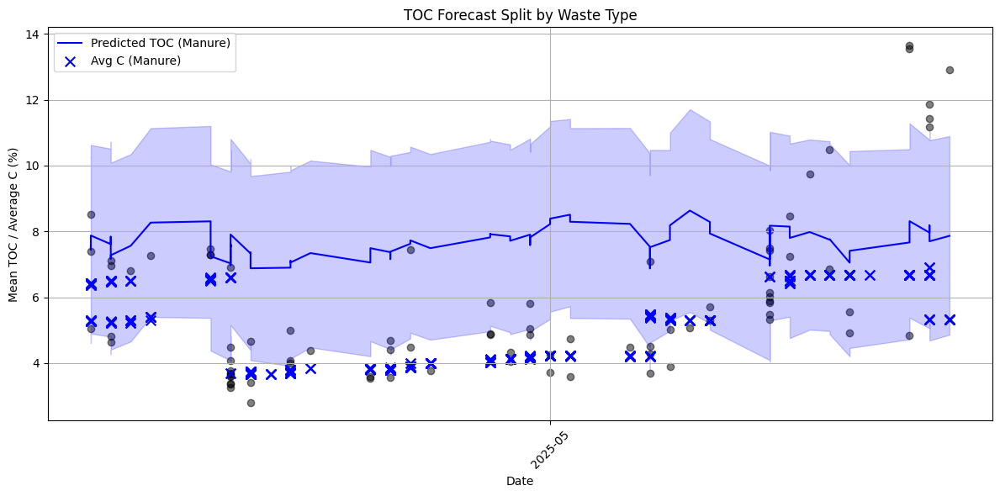

In [ ]:
# plot based off waste type
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.dates as mdates

average_c_df = pd.read_csv("average_c.csv")
average_c_df['Date'] = pd.to_datetime(average_c_df['Date'])
average_c_df = average_c_df[['Date', 'Average C value (all removals) (%)', 'Waste Type']].dropna()
average_c_df = average_c_df.rename(columns={'Average C value (all removals) (%)': 'Average_C'})

df_test['Date'] = pd.to_datetime(df_test['Date'])

# Flatten posterior predictive samples: (chains*draws, n_test_points)
likelihood_samples = posterior_pred['likelihood'].reshape(-1, posterior_pred['likelihood'].shape[-1])

# Get unique waste types
waste_types = df_test['Waste Type'].unique()
colors = ['blue', 'green', 'orange', 'purple', 'brown']  # Extend as needed

plt.figure(figsize=(12, 6))

for i, wt in enumerate(waste_types):
    # Filter indices for this waste type
    wt_idx = df_test.index[df_test['Waste Type'] == wt].tolist()

    # Actual TOC for this waste type
    y_actual = y_test[wt_idx]

    # Predicted mean & credible interval for this waste type
    y_pred_mean = likelihood_samples[:, wt_idx].mean(axis=0)
    y_pred_lower = np.percentile(likelihood_samples[:, wt_idx], 2.5, axis=0)
    y_pred_upper = np.percentile(likelihood_samples[:, wt_idx], 97.5, axis=0)

    time_axis = df_test.loc[wt_idx, 'Date']

    # Plot actual
    plt.scatter(time_axis, y_actual, color='black', alpha=0.5)

    # Plot predicted mean
    plt.plot(time_axis, y_pred_mean, color=colors[i % len(colors)], label=f'Predicted TOC ({wt})')

    # Shade credible interval
    plt.fill_between(time_axis, y_pred_lower, y_pred_upper,
                     color=colors[i % len(colors)], alpha=0.2)

# average c overlay
average_c_df['Date'] = pd.to_datetime(average_c_df['Date'])
for i, wt in enumerate(waste_types):
    avg_c_filtered = average_c_df[
        (average_c_df['Waste Type'] == wt) &
        (average_c_df['Date'] >= df_test['Date'].min()) &
        (average_c_df['Date'] <= df_test['Date'].max())
    ]
    plt.scatter(avg_c_filtered['Date'], avg_c_filtered['Average_C'],
                color=colors[i % len(colors)], marker='x', s=70,
                label=f'Avg C ({wt})')

# Format plot
plt.xlabel('Date')
plt.ylabel('Mean TOC / Average C (%)')
plt.title('TOC Forecast Split by Waste Type')
plt.legend()
plt.grid(True)
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# only showing manure since manure is the only waste type that has been updated based on the train/test split


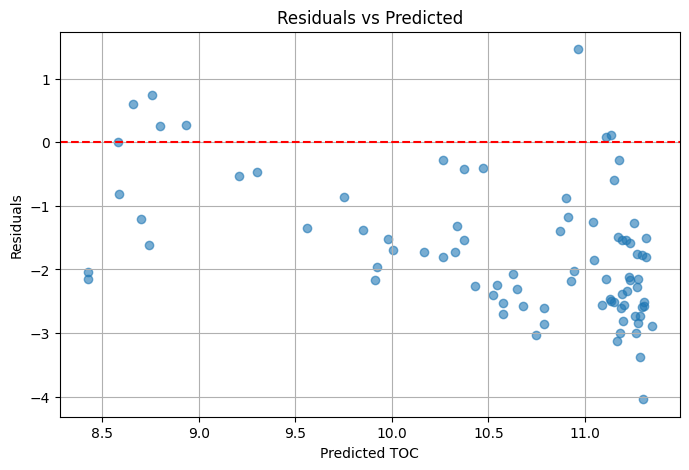

In [ ]:
# residuals vs predicted
residuals = y_test - y_pred_mean
plt.figure(figsize=(8, 5))
plt.scatter(y_pred_mean, residuals, alpha=0.6)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted TOC")
plt.ylabel("Residuals")
plt.title("Residuals vs Predicted")
plt.grid(True)
plt.show()

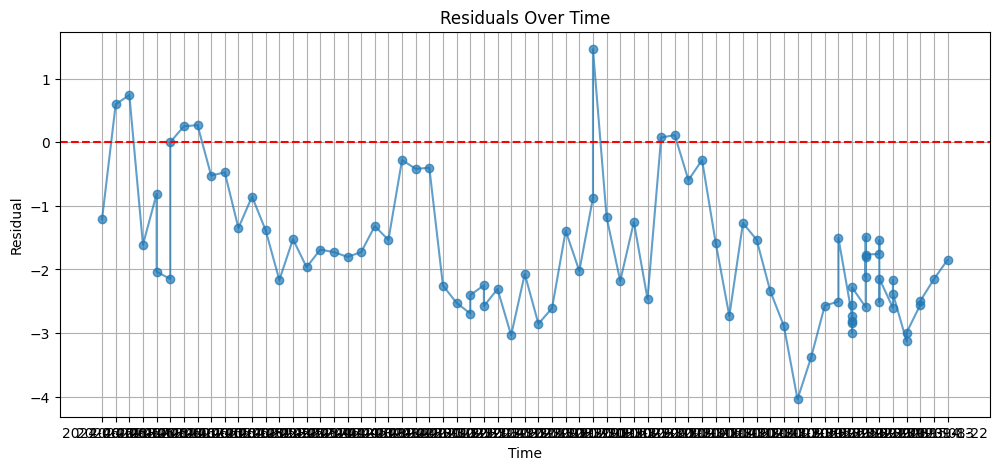

In [ ]:
# residuals over time
plt.figure(figsize=(12, 5))
plt.plot(df_test['Date'], residuals, marker='o', alpha=0.7)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Time")
plt.ylabel("Residual")
plt.title("Residuals Over Time")
plt.grid(True)
plt.show()

Cutoff date for this supplier: 2025-02-24 00:00:00


Output()

Output()

RMSE: 1.957
MAE: 1.557


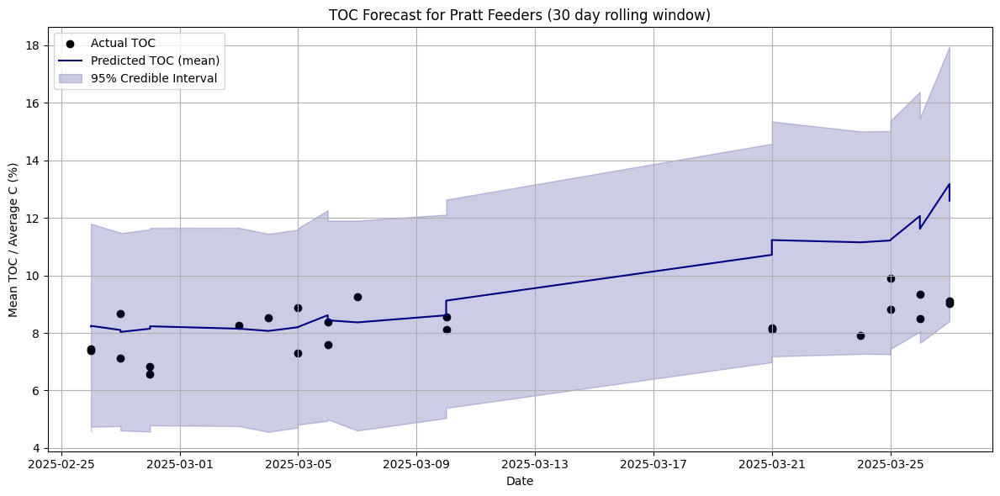

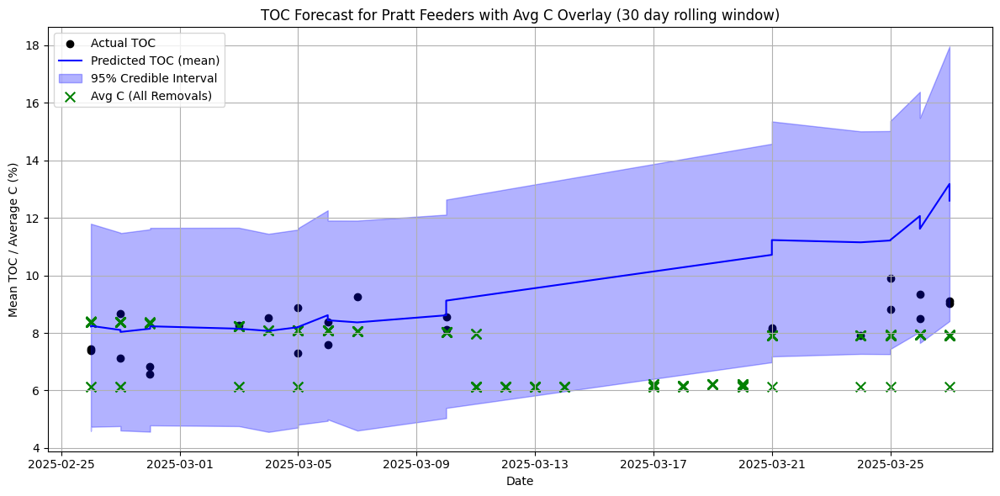

In [ ]:
# filtered model

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt

# Load data
df = pd.read_csv("loads_copy2.csv")
df = df.dropna()

# Filter by supplier
supplier_name = 'Pratt Feeders'
df_filtered = df[df['Supplier'] == supplier_name].copy()

# Encode categorical variables
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df_filtered[col + '_encoded'] = le.fit_transform(df_filtered[col])

# Feature columns
feature_cols = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]
target_col = 'Mean_TOC'

# Rolling window features
window_size = 30
for col in feature_cols:
    df_filtered[f'{col}_rollmean'] = df_filtered[col].rolling(window=window_size, min_periods=1).mean()
rolling_cols = [f'{col}_rollmean' for col in feature_cols]

# Train-test split based on supplier-specific dates
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])
cutoff_date = df_filtered['Date'].quantile(0.8)
print("Cutoff date for this supplier:", cutoff_date)

df_train = df_filtered[df_filtered['Date'] <= cutoff_date].copy()
df_test  = df_filtered[df_filtered['Date'] > cutoff_date].copy()

# Scale + PCA
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(df_train[rolling_cols])
X_test_scaled = scaler.transform(df_test[rolling_cols])

pca = PCA(n_components=0.95)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

y_train = df_train[target_col].values
y_test = df_test[target_col].values

# MCMC model
with pm.Model() as model:
    X_data = pm.Data('X_data', X_train_pca)
    y_obs = pm.Data('y_obs', y_train)

    beta = pm.Normal('beta', mu=0, sigma=10, shape=X_train_pca.shape[1])
    intercept = pm.Normal('intercept', mu=0, sigma=10)

    mu = pm.math.dot(X_data, beta) + intercept
    sigma = pm.HalfNormal('sigma', sigma=1)

    likelihood = pm.Normal('likelihood', mu=mu, sigma=sigma, observed=y_obs)

    trace = pm.sample(1000, tune=1000, target_accept=0.95, random_seed=42)

# Predict on test set
with model:
    pm.set_data({'X_data': X_test_pca, 'y_obs': y_test})
    posterior_pred = pm.sample_posterior_predictive(trace, var_names=['likelihood'], return_inferencedata=False)

y_pred = posterior_pred['likelihood'].mean(axis=0)

# Trace summary
az.summary(trace)

# mcmc plot
import matplotlib.pyplot as plt
import numpy as np

average_c_df = pd.read_csv("average_c.csv")
average_c_df['Date'] = pd.to_datetime(average_c_df['Date'])
average_c_df = average_c_df[['Date', 'Average C value (all removals) (%)']].dropna()
average_c_df = average_c_df.rename(columns={'Average C value (all removals) (%)': 'Average_C'})

# Flatten posterior predictive samples: (chains*draws, n_test_points)
likelihood_samples = posterior_pred['likelihood'].reshape(-1, posterior_pred['likelihood'].shape[-1])

# Compute mean and 95% credible interval
y_pred_mean = likelihood_samples.mean(axis=0)

# Now compute RMSE and MAE
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

rmse = np.sqrt(mean_squared_error(y_test, y_pred_mean))
mae  = mean_absolute_error(y_test, y_pred_mean)

print(f"RMSE: {rmse:.3f}")
print(f"MAE: {mae:.3f}")

y_pred_lower = np.percentile(likelihood_samples, 2.5, axis=0)
y_pred_upper = np.percentile(likelihood_samples, 97.5, axis=0)

# Time axis (replace with your Date column if available)
if 'Date' in df_test.columns:
    time_axis = pd.to_datetime(df_test['Date'])
else:
    time_axis = df_test.index

plt.figure(figsize=(12, 6))

# Plot actual values
plt.scatter(time_axis, y_test, color="black", label="Actual TOC")

# Plot predicted mean
plt.plot(time_axis, y_pred_mean, color="navy", label="Predicted TOC (mean)")

# Shade 95% credible interval
plt.fill_between(time_axis, y_pred_lower, y_pred_upper, color="navy", alpha=0.2, label="95% Credible Interval")

# OPTIONAL: If you have a group average to overlay (like Avg C for Manure)
# plt.scatter(time_axis, average_c_df["Average_C"], marker="x", color="green", label="Avg C for Manure (%)")

plt.xlabel("Date")
plt.ylabel("Mean TOC / Average C (%)")
plt.title(f"TOC Forecast for {supplier_name} ({window_size} day rolling window)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


average_c_df = pd.read_csv("average_c.csv")
average_c_df['Date'] = pd.to_datetime(average_c_df['Date'])
average_c_df = average_c_df[['Date', 'Average C value (all removals) (%)']].dropna()
average_c_df = average_c_df.rename(columns={'Average C value (all removals) (%)': 'Average_C'})

import pandas as pd
import matplotlib.pyplot as plt

# Filter average_c_df to match forecast time range
avg_c_filtered = average_c_df[
    (average_c_df['Date'] >= time_axis.min()) &
    (average_c_df['Date'] <= time_axis.max())
]

# --- Forecast plot ---
plt.figure(figsize=(12, 6))

# Actual TOC
plt.scatter(time_axis, y_test, color='black', label='Actual TOC')

# Predicted mean
plt.plot(time_axis, y_pred_mean, color='blue', label='Predicted TOC (mean)')

# Credible interval
plt.fill_between(time_axis, y_pred_lower, y_pred_upper,
                 color='blue', alpha=0.3, label='95% Credible Interval')

# Overlay average C values (green X markers) only within range
plt.scatter(avg_c_filtered['Date'],
            avg_c_filtered['Average_C'],
            color='green', marker='x', s=70, label='Avg C (All Removals)')

# Labels and legend
plt.xlabel('Date')
plt.ylabel('Mean TOC / Average C (%)')
plt.title(f'TOC Forecast for {supplier_name} with Avg C Overlay ({window_size} day rolling window)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# mcmc model
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt


df = pd.read_csv("loads_copy2.csv")
df = df.dropna()

# encode categorical variables (do this before anything)
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df[col + '_encoded'] = le.fit_transform(df[col])

# Feature columns
feature_cols = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]

target_col = 'Mean_TOC'

# rolling window features
window_size = 3
for col in feature_cols:
    df[f'{col}_rollmean'] = df[col].rolling(window=window_size, min_periods=1).mean()

rolling_cols = [f'{col}_rollmean' for col in feature_cols]

# train-test split (80 - 20 rn)

# Ensure Date is datetime
df['Date'] = pd.to_datetime(df['Date'])

# 80% quantile of dates
cutoff_date = df['Date'].quantile(0.8)
print(cutoff_date)

df_train = df[df['Date'] <= cutoff_date].copy()
df_test  = df[df['Date'] > cutoff_date].copy()

# scale + PCA
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(df_train[rolling_cols])
X_test_scaled = scaler.transform(df_test[rolling_cols])

pca = PCA(n_components=0.95)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

y_train = df_train[target_col].values
y_test = df_test[target_col].values

# mcmc model
with pm.Model() as model:
    X_data = pm.Data('X_data', X_train_pca)
    y_obs = pm.Data('y_obs', y_train) # Define y_obs as pm.Data

    beta = pm.Normal('beta', mu=0, sigma=10, shape=X_train_pca.shape[1])
    intercept = pm.Normal('intercept', mu=0, sigma=10)

    mu = pm.math.dot(X_data, beta) + intercept
    sigma = pm.HalfNormal('sigma', sigma=1)

    likelihood = pm.Normal('likelihood', mu=mu, sigma=sigma, observed=y_obs)

    trace = pm.sample(1000, tune=1000, target_accept=0.95, random_seed=42)

# predict on test set
with model:
    pm.set_data({'X_data': X_test_pca, 'y_obs': y_test}) # Update y_obs with y_test
    posterior_pred = pm.sample_posterior_predictive(trace, var_names=['likelihood'], return_inferencedata=False)

y_pred = posterior_pred['likelihood'].mean(axis=0)

#traceplot
az.summary(trace)

2025-04-07 00:00:00


Output()

Output()

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta[0],0.329,0.047,0.246,0.421,0.001,0.001,2851.0,1446.0,1.0
beta[1],-0.167,0.050,-0.255,-0.063,0.001,0.001,3585.0,1414.0,1.0
beta[2],-0.192,0.066,-0.311,-0.066,0.001,0.001,3116.0,1527.0,1.0
beta[3],-0.242,0.087,-0.401,-0.074,0.002,0.002,3030.0,1477.0,1.0
beta[4],0.662,0.109,0.462,0.868,0.002,0.002,3160.0,1748.0,1.0
beta[5],-0.283,0.124,-0.512,-0.053,0.002,0.003,3142.0,1310.0,1.0
beta[6],-0.115,0.146,-0.406,0.145,0.003,0.003,2982.0,1502.0,1.0
intercept,7.896,0.081,7.733,8.033,0.002,0.002,2430.0,1461.0,1.0
sigma,1.454,0.057,1.343,1.562,0.001,0.001,2707.0,1545.0,1.0


Train R^2: 0.9703943212459355
Test R^2: -0.48496338114964654
Train RMSE: 0.15701043823188826
Test RMSE: 0.20156359573565083
                                     Feature   Coefficient
0              Processing Elapsed Time (min)  0.000000e+00
1                 Waste in Load (metric ton)  1.310428e-01
2        Processing_Meter_Readout_Difference  3.308218e-02
3            Office_Meter_Readout_Difference -5.054369e-02
4  Front Loader Diesel Consumption (gallons) -2.220446e-16
5                              Mean_Moisture -8.939130e-01
6                           Supplier_encoded  0.000000e+00
7                         Waste Type_encoded  0.000000e+00
8                   Truck Vaulted Id_encoded -1.293823e-02


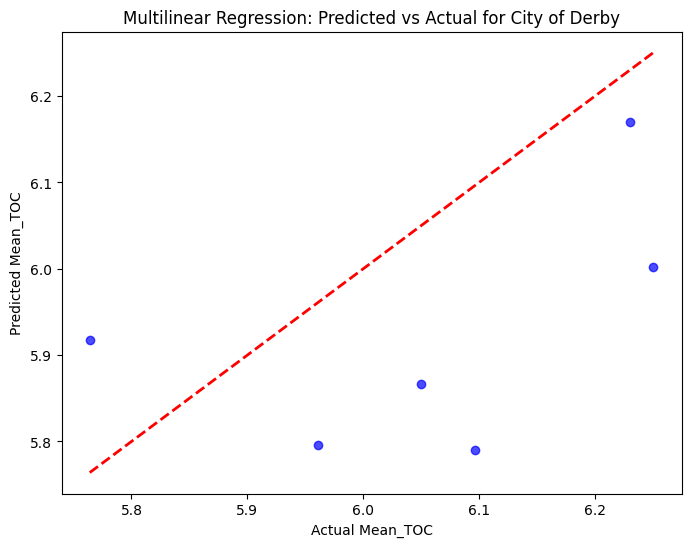

In [ ]:
# multilinear regression
import pandas as pd
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
from math import sqrt

# Load data
df = pd.read_csv("loads_copy2.csv")
df = df.dropna()

# Filter by supplier if needed
supplier_name = 'City of Derby'  # or skip if using all data
df_filtered = df[df['Supplier'] == supplier_name].copy()

# Encode categorical variables
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df_filtered[col + '_encoded'] = le.fit_transform(df_filtered[col])

# Feature columns
feature_cols = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture',
    'Supplier_encoded',
    'Waste Type_encoded',
    'Truck Vaulted Id_encoded'
]
target_col = 'Mean_TOC'

# Train-test split based on supplier-specific dates
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])
cutoff_date = df_filtered['Date'].quantile(0.8)

df_train = df_filtered[df_filtered['Date'] <= cutoff_date].copy()
df_test  = df_filtered[df_filtered['Date'] > cutoff_date].copy()

# Prepare X and y
X_train = df_train[feature_cols]
X_test = df_test[feature_cols]
y_train = df_train[target_col]
y_test = df_test[target_col]

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Multilinear regression
lr_model = LinearRegression()
lr_model.fit(X_train_scaled, y_train)

# Predictions
y_pred_train = lr_model.predict(X_train_scaled)
y_pred_test = lr_model.predict(X_test_scaled)

# Evaluation
print("Train R^2:", r2_score(y_train, y_pred_train))
print("Test R^2:", r2_score(y_test, y_pred_test))
print("Train RMSE:", sqrt(mean_squared_error(y_train, y_pred_train)))
print("Test RMSE:", sqrt(mean_squared_error(y_test, y_pred_test)))

# Coefficients
coefficients = pd.DataFrame({
    'Feature': feature_cols,
    'Coefficient': lr_model.coef_
})
print(coefficients)

# Plot predicted vs actual
plt.figure(figsize=(8,6))
plt.scatter(y_test, y_pred_test, alpha=0.7, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', linewidth=2)
plt.xlabel('Actual Mean_TOC')
plt.ylabel('Predicted Mean_TOC')
plt.title(f'Multilinear Regression: Predicted vs Actual for {supplier_name}')
plt.show()


Top 2 interactions based on correlation with Mean_TOC:
Waste in Load (metric ton) × Mean_Moisture | correlation: 0.555
Processing Elapsed Time (min) × Mean_Moisture | correlation: 0.354
Cutoff date for this supplier: 2025-02-24 00:00:00


Output()

Output()

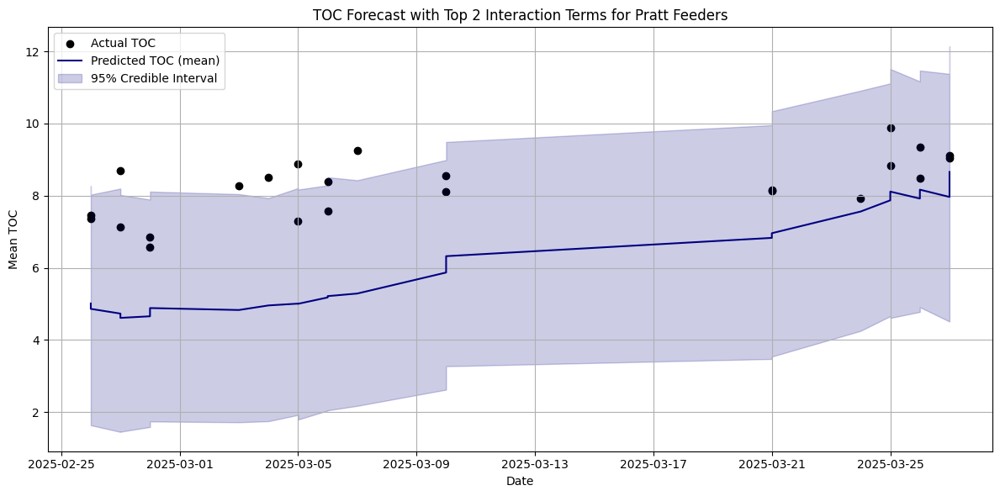

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt
import itertools

# --- Load and clean data ---
df = pd.read_csv("loads_copy2.csv")
df = df.dropna()

# Filter by supplier
supplier_name = 'Pratt Feeders'
df_filtered = df[df['Supplier'] == supplier_name].copy()

# Encode categorical variables
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df_filtered[col + '_encoded'] = le.fit_transform(df_filtered[col])

# Base numeric features
numeric_cols = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture'
]

# --- Automated selection of top 2 interaction terms ---
interaction_scores = []
for col1, col2 in itertools.combinations(numeric_cols, 2):
    interaction_term = df_filtered[col1] * df_filtered[col2]
    corr = np.abs(np.corrcoef(interaction_term, df_filtered['Mean_TOC'])[0,1])
    interaction_scores.append((col1, col2, corr))

interaction_scores.sort(key=lambda x: x[2], reverse=True)
top_interactions = interaction_scores[:2]

print("Top 2 interactions based on correlation with Mean_TOC:")
for col1, col2, corr in top_interactions:
    print(f"{col1} × {col2} | correlation: {corr:.3f}")
    df_filtered[f'{col1}_x_{col2}'] = df_filtered[col1] * df_filtered[col2]

# --- Rolling window features ---
window_size = 7
feature_cols = numeric_cols + [col + '_encoded' for col in categorical_cols]
# Add interaction columns to features
feature_cols += [f'{col1}_x_{col2}' for col1, col2, _ in top_interactions]

for col in feature_cols:
    df_filtered[f'{col}_rollmean'] = df_filtered[col].rolling(window=window_size, min_periods=1).mean()

rolling_cols = [f'{col}_rollmean' for col in feature_cols]

# --- Train-test split by date ---
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])
cutoff_date = df_filtered['Date'].quantile(0.8)
print("Cutoff date for this supplier:", cutoff_date)

df_train = df_filtered[df_filtered['Date'] <= cutoff_date].copy()
df_test  = df_filtered[df_filtered['Date'] > cutoff_date].copy()

# --- Scale + PCA ---
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(df_train[rolling_cols])
X_test_scaled = scaler.transform(df_test[rolling_cols])

pca = PCA(n_components=0.95)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

y_train = df_train['Mean_TOC'].values
y_test = df_test['Mean_TOC'].values

# --- MCMC model ---
with pm.Model() as model:
    X_data = pm.Data('X_data', X_train_pca)
    y_obs = pm.Data('y_obs', y_train)

    beta = pm.Normal('beta', mu=0, sigma=10, shape=X_train_pca.shape[1])
    intercept = pm.Normal('intercept', mu=0, sigma=10)
    sigma = pm.HalfNormal('sigma', sigma=1)

    mu = pm.math.dot(X_data, beta) + intercept
    likelihood = pm.Normal('likelihood', mu=mu, sigma=sigma, observed=y_obs)

    trace = pm.sample(1000, tune=1000, target_accept=0.95, random_seed=42)

# --- Predict on test set ---
with model:
    pm.set_data({'X_data': X_test_pca, 'y_obs': y_test})
    posterior_pred = pm.sample_posterior_predictive(trace, var_names=['likelihood'], return_inferencedata=False)

y_pred = posterior_pred['likelihood'].mean(axis=0)

# --- Posterior predictive plot ---
likelihood_samples = posterior_pred['likelihood'].reshape(-1, posterior_pred['likelihood'].shape[-1])
y_pred_mean = likelihood_samples.mean(axis=0)
y_pred_lower = np.percentile(likelihood_samples, 2.5, axis=0)
y_pred_upper = np.percentile(likelihood_samples, 97.5, axis=0)

time_axis = pd.to_datetime(df_test['Date'])

plt.figure(figsize=(12, 6))
plt.scatter(time_axis, y_test, color="black", label="Actual TOC")
plt.plot(time_axis, y_pred_mean, color="navy", label="Predicted TOC (mean)")
plt.fill_between(time_axis, y_pred_lower, y_pred_upper, color="navy", alpha=0.2, label="95% Credible Interval")
plt.xlabel("Date")
plt.ylabel("Mean TOC")
plt.title(f"TOC Forecast with Top 2 Interaction Terms for {supplier_name}")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Top 2 interactions selected: ['Processing Elapsed Time (min) Mean_Moisture', 'Waste in Load (metric ton) Mean_Moisture']
Cutoff date for this supplier: 2025-02-24 00:00:00


/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['Processing Elapsed Time (min) Mean_Moisture_rollmean'
 'Waste in Load (metric ton) Mean_Moisture_rollmean']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_base.py:635: UserWarning: Skipping features without any observed values: ['Processing Elapsed Time (min) Mean_Moisture_rollmean'
 'Waste in Load (metric ton) Mean_Moisture_rollmean']. At least one non-missing value is needed for imputation with strategy='mean'.
  warnings.warn(


Output()

Output()

RMSE: 1.199
MAE: 0.923


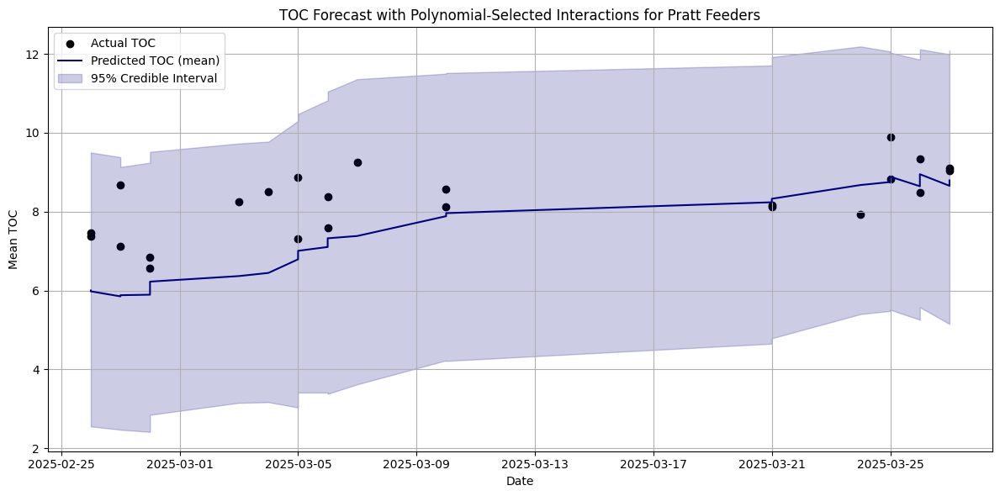

In [ ]:
# interaction terms
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler, PolynomialFeatures
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
import pymc as pm
import arviz as az
import matplotlib.pyplot as plt

df = pd.read_csv("loads_copy2.csv")
df = df.dropna()

# Filter by supplier
supplier_name = 'Pratt Feeders'
df_filtered = df[df['Supplier'] == supplier_name].copy()

# Encode categorical variables
categorical_cols = ['Supplier', 'Waste Type', 'Truck Vaulted Id']
for col in categorical_cols:
    le = LabelEncoder()
    df_filtered[col + '_encoded'] = le.fit_transform(df_filtered[col])

# Base numeric columns
numeric_cols = [
    'Processing Elapsed Time (min)',
    'Waste in Load (metric ton)',
    'Processing_Meter_Readout_Difference',
    'Office_Meter_Readout_Difference',
    'Front Loader Diesel Consumption (gallons)',
    'Mean_Moisture'
]

# interaction terms
poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
poly_features = poly.fit_transform(df_filtered[numeric_cols])
feature_names = poly.get_feature_names_out(numeric_cols)
poly_df = pd.DataFrame(poly_features, columns=feature_names)

corrs = np.abs([np.corrcoef(poly_df[col], df_filtered['Mean_TOC'])[0,1] for col in poly_df.columns])

interaction_candidates = [col for col in poly_df.columns if col not in numeric_cols]
top_idx = np.argsort([corrs[poly_df.columns.get_loc(col)] for col in interaction_candidates])[-2:]
top_interactions = [interaction_candidates[i] for i in top_idx]
print("Top 2 interactions selected:", top_interactions)

for interaction in top_interactions:
    df_filtered[interaction] = poly_df[interaction]

# rolling window
window_size = 7
feature_cols = numeric_cols + [col + '_encoded' for col in categorical_cols] + top_interactions

for col in feature_cols:
    df_filtered[f'{col}_rollmean'] = df_filtered[col].rolling(window=window_size, min_periods=1).mean()

rolling_cols = [f'{col}_rollmean' for col in feature_cols]

# train test split
df_filtered['Date'] = pd.to_datetime(df_filtered['Date'])
cutoff_date = df_filtered['Date'].quantile(0.8)
print("Cutoff date for this supplier:", cutoff_date)

df_train = df_filtered[df_filtered['Date'] <= cutoff_date].copy()
df_test  = df_filtered[df_filtered['Date'] > cutoff_date].copy()

# remaining nans
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(df_train[rolling_cols])
X_test_imputed  = imputer.transform(df_test[rolling_cols])

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_imputed)
X_test_scaled  = scaler.transform(X_test_imputed)

# pca
pca = PCA(n_components=0.95)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca  = pca.transform(X_test_scaled)

y_train = df_train['Mean_TOC'].values
y_test  = df_test['Mean_TOC'].values

# MCMC model
with pm.Model() as model:
    X_data = pm.Data('X_data', X_train_pca)
    y_obs = pm.Data('y_obs', y_train)

    beta = pm.Normal('beta', mu=0, sigma=10, shape=X_train_pca.shape[1])
    intercept = pm.Normal('intercept', mu=0, sigma=10)
    sigma = pm.HalfNormal('sigma', sigma=1)

    mu = pm.math.dot(X_data, beta) + intercept
    likelihood = pm.Normal('likelihood', mu=mu, sigma=sigma, observed=y_obs)

    trace = pm.sample(1000, tune=1000, target_accept=0.95, random_seed=42)

# Predict on test set
with model:
    pm.set_data({'X_data': X_test_pca, 'y_obs': y_test})
    posterior_pred = pm.sample_posterior_predictive(trace, var_names=['likelihood'], return_inferencedata=False)

y_pred = posterior_pred['likelihood'].mean(axis=0)

# Posterior predictive plot
likelihood_samples = posterior_pred['likelihood'].reshape(-1, posterior_pred['likelihood'].shape[-1])
y_pred_mean = likelihood_samples.mean(axis=0)

# Now compute RMSE and MAE
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

rmse = np.sqrt(mean_squared_error(y_test, y_pred_mean))
mae  = mean_absolute_error(y_test, y_pred_mean)

print(f"RMSE: {rmse:.3f}")
print(f"MAE: {mae:.3f}")

y_pred_lower = np.percentile(likelihood_samples, 2.5, axis=0)
y_pred_upper = np.percentile(likelihood_samples, 97.5, axis=0)

time_axis = pd.to_datetime(df_test['Date'])

plt.figure(figsize=(12, 6))
plt.scatter(time_axis, y_test, color="black", label="Actual TOC")
plt.plot(time_axis, y_pred_mean, color="navy", label="Predicted TOC (mean)")
plt.fill_between(time_axis, y_pred_lower, y_pred_upper, color="navy", alpha=0.2, label="95% Credible Interval")
plt.xlabel("Date")
plt.ylabel("Mean TOC")
plt.title(f"TOC Forecast with Polynomial-Selected Interactions for {supplier_name}")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
